In [1]:
def imgs_to_array(cond, path):
    imgs = []
    valid_images = [".jpg",".png"]
    for f in os.listdir(path):
        ext = os.path.splitext(f)[1]
        if ext.lower() not in valid_images:
            continue
        x = Image.open(os.path.join(path,f))
        y = x.resize((100, 100))
        p = np.array(y)
        p = p.astype('float32')
        p = p/255.0
        imgs.append(p)
        #imgs.append(Image.open(os.path.join(path,f)))
    numb = len(imgs)
    if cond == 'clean':
        lbl = np.zeros(numb)
    elif cond == 'polluted':
        lbl = np.ones(numb)
    return (imgs, lbl)

In [2]:
from PIL import Image
import os, os.path
import numpy as np
from numpy import asarray

#Create a train data and label
data = []
lbl = []

#Create permanent arrays to save img arrays
data_clean = []
data_polluted = []
#Create permanent arrays to save lbl arrays
lbl_clean = []
lbl_polluted = []

path_clean = "/Users/Yernar-PC/DEEP LEARNING/Insulator/total data/all/Clean"
path_polluted = "/Users/Yernar-PC/DEEP LEARNING/Insulator/total data/all/Polluted"
cond_1 = 'clean'
cond_2 = 'polluted'

(data, lbl_clean) = imgs_to_array(cond_1, path_clean)
(data_polluted, lbl_polluted) = imgs_to_array(cond_2, path_polluted)

data.extend(data_polluted)
lbl = np.concatenate((lbl_clean,lbl_polluted))

In [3]:
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras import regularizers
import tensorflow as tf

data = np.array(data)
lbl = np.array(lbl)
shuffled_idx = np.random.permutation(276)
data[:] = data[shuffled_idx]
lbl[:] = lbl[shuffled_idx]
print(data.shape)
print(lbl.shape)

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2
(276, 100, 100, 3)
(276,)


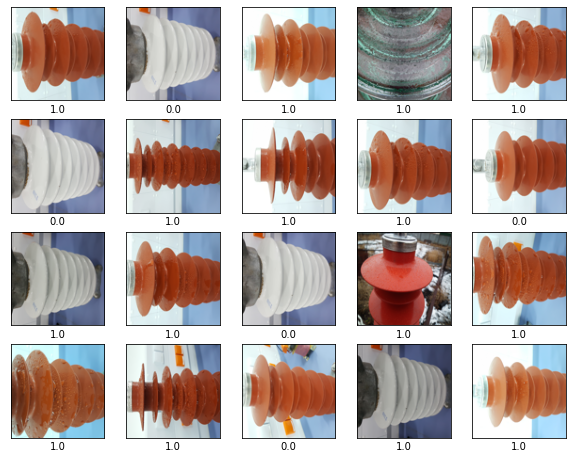

In [4]:
from keras.constraints import MaxNorm
from matplotlib import pyplot as plt
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.constraints import MaxNorm
plt.figure(figsize = (10, 10))
for i in range(20):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(data[i], cmap = plt.cm.binary)
    plt.xlabel(lbl[i])

In [5]:
def define_model(dropout_rate, neurons, kernel_size, learning_rate):   
    model = models.Sequential()
    
    model.add(layers.Conv2D(8, (kernel_size, kernel_size), activation = 'relu', input_shape = (100, 100, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    for i in range(neurons):
        if i+1 == 1:
            continue        
        else:
            n = 2**(i+1+2)
            model.add(layers.Conv2D(n, (kernel_size, kernel_size), activation = 'relu'))
            model.add(layers.MaxPooling2D((2, 2)))
            
    model.add(layers.Flatten())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(32, activation = 'relu'))
    model.add(layers.Dense(1, activation = 'sigmoid'))    
        
    # compile the model
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizers.Adam(learning_rate),
                  metrics=['acc'])
    return model

In [6]:
from keras.wrappers.scikit_learn import KerasClassifier

model = KerasClassifier(build_fn=define_model, 
                        verbose=1)
gridcvs = {}
dropout_rate = [ 0.2, 0.5]
neurons = [1, 2, 3, 4]
kernel_size = [3, 5]
learning_rate =  [0.001, 0.0001]
batch_size = [4, 8, 16, 32]
epochs = [150]

param_grid = dict(dropout_rate=dropout_rate, neurons = neurons, kernel_size = kernel_size, learning_rate = learning_rate,
                  batch_size=batch_size,
                  epochs=epochs)


In [10]:
from sklearn.model_selection import GridSearchCV
from keras.callbacks import EarlyStopping
from sklearn.model_selection import cross_val_score

stopper = EarlyStopping(monitor='loss', patience=3, verbose=1)
fit_params = dict(callbacks=[stopper])


grid = GridSearchCV(estimator=model, param_grid = , cv=5)

cross_score = cross_val_score(grid,
                X=data,
                y=lbl,
                cv=5,
                n_jobs=None,
                verbose=0,
                fit_params = fit_params)

#grid_result = grid.fit(data, lbl, **fit_params)

Epoch 1/150
44/44 [==============================] - 13s 10ms/step - loss: 0.8321 - acc: 0.6934
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5943 - acc: 0.7363
Epoch 3/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4923 - acc: 0.7717
Epoch 4/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4375 - acc: 0.8425
Epoch 5/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4477 - acc: 0.8003
Epoch 6/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4161 - acc: 0.7478A: 0s - loss: 0.4214 - acc: 0.7
Epoch 7/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3403 - acc: 0.8884
Epoch 8/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2702 - acc: 0.9103
Epoch 9/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3026 - acc: 0.8454
Epoch 10/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2448 - acc: 0.9174
Epoch 11/150
44/44 [======

44/44 [==============================] - 0s 8ms/step - loss: 0.2982 - acc: 0.8682
Epoch 14/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2820 - acc: 0.8981
Epoch 15/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1488 - acc: 0.9519
Epoch 16/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2594 - acc: 0.9002
Epoch 17/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1553 - acc: 0.9590
Epoch 18/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1992 - acc: 0.9178
Epoch 19/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1406 - acc: 0.9643
Epoch 20/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1893 - acc: 0.8967
Epoch 21/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1310 - acc: 0.9587
Epoch 22/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1544 - acc: 0.9525
Epoch 23/150
44/44 [==============================] - 0s 8ms/st

11/11 [==============================] - 0s 4ms/step - loss: 0.2521 - acc: 0.8636
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.5866 - acc: 0.7764
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4840 - acc: 0.8074
Epoch 3/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4255 - acc: 0.8289
Epoch 4/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4851 - acc: 0.7541
Epoch 5/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4517 - acc: 0.7923
Epoch 6/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3993 - acc: 0.7828
Epoch 7/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3996 - acc: 0.7637
Epoch 8/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3568 - acc: 0.7789
Epoch 9/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3249 - acc: 0.7764
Epoch 10/150
44/44 [==============================] - 0s 8ms/step - loss

44/44 [==============================] - 0s 8ms/step - loss: 0.5043 - acc: 0.6952
Epoch 11/150
44/44 [==============================] - 0s 7ms/step - loss: 0.4861 - acc: 0.7453
Epoch 12/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4255 - acc: 0.7551
Epoch 13/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3857 - acc: 0.8220
Epoch 14/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4485 - acc: 0.7976
Epoch 15/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4239 - acc: 0.8307
Epoch 16/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3484 - acc: 0.8085
Epoch 17/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4019 - acc: 0.8001
Epoch 18/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3604 - acc: 0.7940
Epoch 19/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4225 - acc: 0.7985
Epoch 20/150
44/44 [==============================] - 0s 8ms/st

44/44 [==============================] - 0s 7ms/step - loss: 0.1119 - acc: 0.9761
Epoch 37/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1169 - acc: 0.9725
Epoch 38/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1222 - acc: 0.9700
Epoch 39/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1211 - acc: 0.9734
Epoch 40/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1176 - acc: 0.9797
Epoch 41/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1050 - acc: 0.9845
Epoch 00041: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.2796 - acc: 0.9091
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.6257 - acc: 0.6917
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.6284 - acc: 0.7648
Epoch 3/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4835 - acc: 0.8072
Epoch 4/150
44/44 [==============================] 

44/44 [==============================] - 0s 8ms/step - loss: 0.1084 - acc: 0.9734
Epoch 33/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1410 - acc: 0.9689
Epoch 34/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1184 - acc: 0.9673
Epoch 35/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1191 - acc: 0.9714
Epoch 36/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1002 - acc: 0.9662
Epoch 37/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1151 - acc: 0.9714
Epoch 38/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1121 - acc: 0.9840
Epoch 39/150
44/44 [==============================] - 0s 8ms/step - loss: 0.0976 - acc: 0.9873
Epoch 40/150
44/44 [==============================] - 0s 7ms/step - loss: 0.1081 - acc: 0.9618
Epoch 41/150
44/44 [==============================] - 0s 7ms/step - loss: 0.0966 - acc: 0.9760
Epoch 42/150
44/44 [==============================] - 0s 8ms/st

44/44 [==============================] - 0s 8ms/step - loss: 0.2426 - acc: 0.9179
Epoch 29/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1809 - acc: 0.9551
Epoch 30/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2442 - acc: 0.9212
Epoch 31/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2464 - acc: 0.9002
Epoch 32/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2279 - acc: 0.9161
Epoch 00032: early stopping
11/11 [==============================] - 0s 5ms/step - loss: 0.3569 - acc: 0.7955
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.6255 - acc: 0.7427
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5993 - acc: 0.6996
Epoch 3/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5657 - acc: 0.7072
Epoch 4/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5615 - acc: 0.7070
Epoch 5/150
44/44 [==============================] -

44/44 [==============================] - 0s 6ms/step - loss: 0.3854 - acc: 0.8371
Epoch 27/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4624 - acc: 0.7786
Epoch 28/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3858 - acc: 0.8417
Epoch 29/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3716 - acc: 0.8391
Epoch 30/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4021 - acc: 0.8165
Epoch 31/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3595 - acc: 0.8687
Epoch 32/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3551 - acc: 0.8596
Epoch 33/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3520 - acc: 0.8529
Epoch 34/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3501 - acc: 0.8485
Epoch 35/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4147 - acc: 0.7828
Epoch 36/150
44/44 [==============================] - 0s 6ms/st

44/44 [==============================] - 0s 6ms/step - loss: 0.5447 - acc: 0.7310
Epoch 31/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5213 - acc: 0.7617
Epoch 00031: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.4559 - acc: 0.8182
Epoch 1/150
44/44 [==============================] - 1s 7ms/step - loss: 0.6672 - acc: 0.5936
Epoch 2/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6383 - acc: 0.7216
Epoch 3/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6153 - acc: 0.7281
Epoch 4/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6300 - acc: 0.7250
Epoch 5/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6028 - acc: 0.7262
Epoch 6/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5768 - acc: 0.7740
Epoch 7/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6106 - acc: 0.7132
Epoch 8/150
44/44 [==============================] - 0s

44/44 [==============================] - 0s 5ms/step - loss: 0.0420 - acc: 0.9952
Epoch 23/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0988 - acc: 0.9501
Epoch 24/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0630 - acc: 0.9654
Epoch 00024: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.6765 - acc: 0.8409
Epoch 1/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6761 - acc: 0.6998
Epoch 2/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4588 - acc: 0.7705
Epoch 3/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4250 - acc: 0.7929
Epoch 4/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3089 - acc: 0.8346
Epoch 5/150
44/44 [==============================] - 0s 5ms/step - loss: 0.2423 - acc: 0.9095
Epoch 6/150
44/44 [==============================] - 0s 5ms/step - loss: 0.1809 - acc: 0.9565
Epoch 7/150
44/44 [==============================] - 0

44/44 [==============================] - 0s 8ms/step - loss: 0.2003 - acc: 0.9252
Epoch 10/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2009 - acc: 0.9361
Epoch 11/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1918 - acc: 0.9400
Epoch 12/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1806 - acc: 0.9461
Epoch 13/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1494 - acc: 0.9479
Epoch 14/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1340 - acc: 0.9419
Epoch 15/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1105 - acc: 0.9629
Epoch 16/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1141 - acc: 0.9661
Epoch 17/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1163 - acc: 0.9556
Epoch 18/150
44/44 [==============================] - 0s 8ms/step - loss: 0.1819 - acc: 0.9105
Epoch 19/150
44/44 [==============================] - 0s 8ms/st

44/44 [==============================] - 0s 9ms/step - loss: 0.4037 - acc: 0.7507
Epoch 14/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3695 - acc: 0.8309
Epoch 15/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3789 - acc: 0.7896
Epoch 16/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2800 - acc: 0.8580
Epoch 17/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2589 - acc: 0.8693
Epoch 18/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2698 - acc: 0.8438
Epoch 19/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2670 - acc: 0.8654
Epoch 20/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2425 - acc: 0.8408
Epoch 21/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2838 - acc: 0.8508
Epoch 22/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2470 - acc: 0.9002
Epoch 23/150
44/44 [==============================] - 0s 9ms/st

44/44 [==============================] - 0s 9ms/step - loss: 0.3165 - acc: 0.8503
Epoch 18/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2844 - acc: 0.8697
Epoch 19/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2798 - acc: 0.9085
Epoch 20/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2619 - acc: 0.8689
Epoch 21/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2705 - acc: 0.8806
Epoch 22/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3341 - acc: 0.9061
Epoch 23/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2393 - acc: 0.9370
Epoch 24/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2384 - acc: 0.9188
Epoch 00024: early stopping
11/11 [==============================] - 0s 5ms/step - loss: 0.4739 - acc: 0.8864
Epoch 1/150
44/44 [==============================] - 1s 10ms/step - loss: 0.6433 - acc: 0.6503
Epoch 2/150
44/44 [============================

44/44 [==============================] - 0s 8ms/step - loss: 0.0264 - acc: 1.0000
Epoch 43/150
44/44 [==============================] - 0s 7ms/step - loss: 0.0250 - acc: 1.0000
Epoch 44/150
44/44 [==============================] - 0s 7ms/step - loss: 0.0257 - acc: 0.9961
Epoch 45/150
44/44 [==============================] - 0s 8ms/step - loss: 0.0231 - acc: 0.9922
Epoch 46/150
44/44 [==============================] - 0s 8ms/step - loss: 0.0460 - acc: 0.9739
Epoch 00046: early stopping
11/11 [==============================] - 0s 5ms/step - loss: 0.5643 - acc: 0.8182
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.6269 - acc: 0.6980
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5739 - acc: 0.7602
Epoch 3/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4879 - acc: 0.7772
Epoch 4/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4559 - acc: 0.7740
Epoch 5/150
44/44 [==============================] -

44/44 [==============================] - 0s 7ms/step - loss: 0.3398 - acc: 0.8723
Epoch 23/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2669 - acc: 0.9308
Epoch 24/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3788 - acc: 0.8133
Epoch 25/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2981 - acc: 0.8834
Epoch 26/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2589 - acc: 0.9288
Epoch 27/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2890 - acc: 0.8883
Epoch 28/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2598 - acc: 0.9085
Epoch 29/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2694 - acc: 0.9020
Epoch 30/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2604 - acc: 0.9215
Epoch 31/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2531 - acc: 0.8717
Epoch 32/150
44/44 [==============================] - 0s 8ms/st

44/44 [==============================] - 0s 8ms/step - loss: 0.5014 - acc: 0.7558
Epoch 12/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4907 - acc: 0.7543
Epoch 13/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4859 - acc: 0.7707
Epoch 14/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4336 - acc: 0.7763
Epoch 15/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4739 - acc: 0.7588
Epoch 16/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3932 - acc: 0.7747
Epoch 17/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4766 - acc: 0.7479
Epoch 18/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4664 - acc: 0.7637
Epoch 19/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4492 - acc: 0.7971
Epoch 20/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3980 - acc: 0.8226
Epoch 21/150
44/44 [==============================] - 0s 8ms/st

44/44 [==============================] - 0s 9ms/step - loss: 0.5393 - acc: 0.8034
Epoch 3/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5494 - acc: 0.7818
Epoch 4/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5414 - acc: 0.7778
Epoch 5/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5286 - acc: 0.7867
Epoch 6/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5037 - acc: 0.8060
Epoch 7/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4689 - acc: 0.8204
Epoch 8/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5467 - acc: 0.7626
Epoch 9/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5328 - acc: 0.7645
Epoch 10/150
44/44 [==============================] - 0s 9ms/step - loss: 0.4610 - acc: 0.8353
Epoch 11/150
44/44 [==============================] - 0s 9ms/step - loss: 0.4847 - acc: 0.8019
Epoch 12/150
44/44 [==============================] - 0s 8ms/step - lo

Epoch 3/150
44/44 [==============================] - 0s 10ms/step - loss: 0.6749 - acc: 0.6637
Epoch 4/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5950 - acc: 0.7993
Epoch 5/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5256 - acc: 0.7982
Epoch 6/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5565 - acc: 0.7402
Epoch 7/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5363 - acc: 0.7617
Epoch 8/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5395 - acc: 0.7460
Epoch 9/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5700 - acc: 0.7207
Epoch 10/150
44/44 [==============================] - 0s 9ms/step - loss: 0.4875 - acc: 0.7864
Epoch 11/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5608 - acc: 0.7381
Epoch 12/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5595 - acc: 0.7380
Epoch 13/150
44/44 [==============================]

Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5058 - acc: 0.7795
Epoch 3/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5707 - acc: 0.7070
Epoch 4/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4629 - acc: 0.7203
Epoch 5/150
44/44 [==============================] - 0s 8ms/step - loss: 0.4248 - acc: 0.7383
Epoch 6/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3905 - acc: 0.7671
Epoch 7/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3869 - acc: 0.8153
Epoch 8/150
44/44 [==============================] - 0s 8ms/step - loss: 0.3511 - acc: 0.8288
Epoch 9/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2606 - acc: 0.8948
Epoch 10/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2384 - acc: 0.8974
Epoch 11/150
44/44 [==============================] - 0s 8ms/step - loss: 0.2111 - acc: 0.9036
Epoch 12/150
44/44 [==============================] - 0s 8

44/44 [==============================] - 0s 7ms/step - loss: 0.2627 - acc: 0.8542
Epoch 16/150
44/44 [==============================] - 0s 7ms/step - loss: 0.3150 - acc: 0.8539
Epoch 17/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2738 - acc: 0.8717
Epoch 18/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2444 - acc: 0.8928
Epoch 19/150
44/44 [==============================] - 0s 7ms/step - loss: 0.2435 - acc: 0.9050
Epoch 00019: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.3364 - acc: 0.9091
Epoch 1/150
44/44 [==============================] - 1s 7ms/step - loss: 0.6640 - acc: 0.5750
Epoch 2/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5271 - acc: 0.7587
Epoch 3/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5383 - acc: 0.7286
Epoch 4/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5337 - acc: 0.7063
Epoch 5/150
44/44 [==============================] -

44/44 [==============================] - 0s 6ms/step - loss: 0.4327 - acc: 0.7645
Epoch 9/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3954 - acc: 0.7423
Epoch 10/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3596 - acc: 0.8135
Epoch 11/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3776 - acc: 0.8063
Epoch 12/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3516 - acc: 0.8070
Epoch 13/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5693 - acc: 0.8124
Epoch 14/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4391 - acc: 0.7399
Epoch 15/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3268 - acc: 0.8724
Epoch 00015: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.4856 - acc: 0.7727
Epoch 1/150
44/44 [==============================] - 1s 6ms/step - loss: 0.6267 - acc: 0.7307
Epoch 2/150
44/44 [==============================]

44/44 [==============================] - 0s 6ms/step - loss: 0.6701 - acc: 0.6334
Epoch 4/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5912 - acc: 0.7574
Epoch 5/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5431 - acc: 0.7500
Epoch 6/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6012 - acc: 0.6980
Epoch 7/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5511 - acc: 0.7678
Epoch 8/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5622 - acc: 0.7133
Epoch 9/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5061 - acc: 0.7334
Epoch 10/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5193 - acc: 0.6879
Epoch 11/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4450 - acc: 0.7748
Epoch 12/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4495 - acc: 0.8023
Epoch 13/150
44/44 [==============================] - 0s 6ms/step - l

44/44 [==============================] - 0s 4ms/step - loss: 0.4596 - acc: 0.8209
Epoch 6/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5140 - acc: 0.7793
Epoch 7/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4041 - acc: 0.8287
Epoch 8/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4757 - acc: 0.7306
Epoch 9/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4940 - acc: 0.7563
Epoch 10/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4410 - acc: 0.7835
Epoch 11/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4368 - acc: 0.7692
Epoch 12/150
44/44 [==============================] - 0s 4ms/step - loss: 0.3600 - acc: 0.8376
Epoch 13/150
44/44 [==============================] - 0s 4ms/step - loss: 0.3712 - acc: 0.8403
Epoch 14/150
44/44 [==============================] - 0s 4ms/step - loss: 0.3935 - acc: 0.8235
Epoch 15/150
44/44 [==============================] - 0s 4ms/step -

44/44 [==============================] - 0s 5ms/step - loss: 0.1803 - acc: 0.9398
Epoch 44/150
44/44 [==============================] - 0s 5ms/step - loss: 0.2133 - acc: 0.9328
Epoch 00044: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 0.2707 - acc: 0.8636
Epoch 1/150
44/44 [==============================] - 1s 6ms/step - loss: 0.6390 - acc: 0.6512
Epoch 2/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5763 - acc: 0.7761
Epoch 3/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5658 - acc: 0.7628
Epoch 4/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5642 - acc: 0.7706
Epoch 5/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6068 - acc: 0.7150
Epoch 6/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5722 - acc: 0.7527
Epoch 7/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5760 - acc: 0.7420
Epoch 8/150
44/44 [==============================] - 0s

Epoch 00013: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.5168 - acc: 0.7727
Epoch 1/150
44/44 [==============================] - 1s 6ms/step - loss: 0.7474 - acc: 0.4115
Epoch 2/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6725 - acc: 0.6383
Epoch 3/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6495 - acc: 0.6355
Epoch 4/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6033 - acc: 0.7450
Epoch 5/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5944 - acc: 0.7434
Epoch 6/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5632 - acc: 0.7781
Epoch 7/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5393 - acc: 0.7823
Epoch 8/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5642 - acc: 0.7782
Epoch 00008: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.6259 - acc: 0.7045
Epoch 1/150
44/44 [=========

44/44 [==============================] - 0s 5ms/step - loss: 0.1580 - acc: 0.9426
Epoch 15/150
44/44 [==============================] - 0s 5ms/step - loss: 0.1601 - acc: 0.9366
Epoch 16/150
44/44 [==============================] - 0s 5ms/step - loss: 0.1704 - acc: 0.9249
Epoch 17/150
44/44 [==============================] - 0s 5ms/step - loss: 0.1539 - acc: 0.9514
Epoch 18/150
44/44 [==============================] - 0s 5ms/step - loss: 0.1922 - acc: 0.9212
Epoch 00018: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.5589 - acc: 0.8636
Epoch 1/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6078 - acc: 0.7241
Epoch 2/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5560 - acc: 0.7659
Epoch 3/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6035 - acc: 0.7117
Epoch 4/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5530 - acc: 0.7822
Epoch 5/150
44/44 [==============================] -

44/44 [==============================] - 0s 5ms/step - loss: 0.3120 - acc: 0.8474
Epoch 16/150
44/44 [==============================] - 0s 5ms/step - loss: 0.2666 - acc: 0.8654
Epoch 17/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3425 - acc: 0.8314
Epoch 18/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3136 - acc: 0.8554
Epoch 19/150
44/44 [==============================] - 0s 5ms/step - loss: 0.2669 - acc: 0.8295
Epoch 00019: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.3592 - acc: 0.8636
Epoch 1/150
44/44 [==============================] - 1s 5ms/step - loss: 0.6183 - acc: 0.6819
Epoch 2/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5460 - acc: 0.7976
Epoch 3/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5088 - acc: 0.7877
Epoch 4/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4822 - acc: 0.7845
Epoch 5/150
44/44 [==============================] -

44/44 [==============================] - 0s 6ms/step - loss: 0.4421 - acc: 0.8102
Epoch 8/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3678 - acc: 0.8200
Epoch 9/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4066 - acc: 0.7302
Epoch 10/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3611 - acc: 0.8201
Epoch 11/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4222 - acc: 0.8113
Epoch 12/150
44/44 [==============================] - 0s 6ms/step - loss: 0.2517 - acc: 0.8547
Epoch 13/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3342 - acc: 0.8558
Epoch 14/150
44/44 [==============================] - 0s 6ms/step - loss: 0.2949 - acc: 0.8586
Epoch 15/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3123 - acc: 0.8239
Epoch 16/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3326 - acc: 0.8691
Epoch 17/150
44/44 [==============================] - 0s 6ms/step

44/44 [==============================] - 0s 4ms/step - loss: 0.5183 - acc: 0.8019
Epoch 3/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5775 - acc: 0.7290
Epoch 4/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5207 - acc: 0.7867
Epoch 5/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5045 - acc: 0.7368
Epoch 6/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4710 - acc: 0.8164
Epoch 7/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5265 - acc: 0.7448
Epoch 8/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5349 - acc: 0.7224
Epoch 9/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4779 - acc: 0.7714
Epoch 10/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4050 - acc: 0.8402
Epoch 11/150
44/44 [==============================] - 0s 4ms/step - loss: 0.4063 - acc: 0.8336
Epoch 12/150
44/44 [==============================] - 0s 4ms/step - lo

44/44 [==============================] - 0s 5ms/step - loss: 0.6703 - acc: 0.6433
Epoch 2/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6440 - acc: 0.6450
Epoch 3/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5687 - acc: 0.7525
Epoch 4/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5498 - acc: 0.7313
Epoch 5/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5411 - acc: 0.7693
Epoch 6/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5254 - acc: 0.8047
Epoch 7/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5436 - acc: 0.7279
Epoch 8/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5078 - acc: 0.7801
Epoch 9/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5761 - acc: 0.7043
Epoch 10/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4881 - acc: 0.7630
Epoch 11/150
44/44 [==============================] - 0s 5ms/step - los

44/44 [==============================] - 0s 6ms/step - loss: 0.4286 - acc: 0.8218
Epoch 18/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4646 - acc: 0.7282
Epoch 19/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4554 - acc: 0.7606
Epoch 20/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4464 - acc: 0.7733
Epoch 21/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4369 - acc: 0.7826
Epoch 22/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4217 - acc: 0.7917
Epoch 23/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4335 - acc: 0.7873
Epoch 24/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4518 - acc: 0.7487
Epoch 25/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4763 - acc: 0.7248
Epoch 26/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3944 - acc: 0.8178
Epoch 27/150
44/44 [==============================] - 0s 6ms/st

44/44 [==============================] - 0s 6ms/step - loss: 0.5640 - acc: 0.7291
Epoch 10/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5945 - acc: 0.6992
Epoch 11/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6207 - acc: 0.7002
Epoch 12/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5217 - acc: 0.8114
Epoch 00012: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.4896 - acc: 0.8182
Epoch 1/150
44/44 [==============================] - 1s 6ms/step - loss: 0.6880 - acc: 0.6067
Epoch 2/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6794 - acc: 0.6671
Epoch 3/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6441 - acc: 0.6932
Epoch 4/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5732 - acc: 0.7525
Epoch 5/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6041 - acc: 0.6844
Epoch 6/150
44/44 [==============================] - 

6/6 [==============================] - 0s 3ms/step - loss: 0.4732 - acc: 0.8409
Epoch 1/150
22/22 [==============================] - 0s 5ms/step - loss: 0.7730 - acc: 0.6471
Epoch 2/150
22/22 [==============================] - 0s 5ms/step - loss: 0.5593 - acc: 0.7316
Epoch 3/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4738 - acc: 0.7824
Epoch 4/150
22/22 [==============================] - 0s 5ms/step - loss: 0.5175 - acc: 0.7789
Epoch 5/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4830 - acc: 0.7364
Epoch 6/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4672 - acc: 0.7440
Epoch 7/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4634 - acc: 0.6889
Epoch 8/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4770 - acc: 0.6894
Epoch 9/150
22/22 [==============================] - 0s 5ms/step - loss: 0.3791 - acc: 0.7763
Epoch 10/150
22/22 [==============================] - 0s 5ms/step - loss: 

22/22 [==============================] - 0s 6ms/step - loss: 0.4202 - acc: 0.7740
Epoch 11/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3540 - acc: 0.8006
Epoch 12/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3516 - acc: 0.7767
Epoch 13/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3121 - acc: 0.8273
Epoch 14/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2671 - acc: 0.8204
Epoch 15/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3394 - acc: 0.8702
Epoch 16/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2951 - acc: 0.8861
Epoch 17/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2484 - acc: 0.8805
Epoch 18/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2513 - acc: 0.8914
Epoch 19/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2797 - acc: 0.8777
Epoch 20/150
22/22 [==============================] - 0s 6ms/st

22/22 [==============================] - 0s 6ms/step - loss: 0.2945 - acc: 0.8415
Epoch 13/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2648 - acc: 0.8741
Epoch 14/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2648 - acc: 0.8976
Epoch 15/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2577 - acc: 0.8975
Epoch 16/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2270 - acc: 0.8980
Epoch 17/150
22/22 [==============================] - 0s 6ms/step - loss: 0.1975 - acc: 0.8957
Epoch 18/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2933 - acc: 0.9160
Epoch 19/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2732 - acc: 0.8795
Epoch 20/150
22/22 [==============================] - 0s 6ms/step - loss: 0.1855 - acc: 0.9248
Epoch 21/150
22/22 [==============================] - 0s 6ms/step - loss: 0.1893 - acc: 0.9218
Epoch 22/150
22/22 [==============================] - 0s 6ms/st

22/22 [==============================] - 0s 5ms/step - loss: 0.4220 - acc: 0.8008
Epoch 12/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4816 - acc: 0.7172
Epoch 13/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4819 - acc: 0.7595
Epoch 14/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4630 - acc: 0.7469
Epoch 15/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4434 - acc: 0.7767
Epoch 16/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4380 - acc: 0.7663
Epoch 17/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4203 - acc: 0.7668
Epoch 18/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4237 - acc: 0.7494
Epoch 19/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4343 - acc: 0.7195
Epoch 20/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4673 - acc: 0.7148
Epoch 21/150
22/22 [==============================] - 0s 5ms/st

22/22 [==============================] - 0s 5ms/step - loss: 0.5139 - acc: 0.7822
Epoch 3/150
22/22 [==============================] - 0s 5ms/step - loss: 0.5610 - acc: 0.7486
Epoch 4/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4160 - acc: 0.8158
Epoch 5/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4733 - acc: 0.8200
Epoch 6/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4804 - acc: 0.7855
Epoch 7/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4492 - acc: 0.7842
Epoch 8/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4803 - acc: 0.7542
Epoch 00008: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.7518 - acc: 0.6136
Epoch 1/150
22/22 [==============================] - 0s 6ms/step - loss: 0.6069 - acc: 0.7204
Epoch 2/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5199 - acc: 0.7844
Epoch 3/150
22/22 [==============================] - 0s 6m

22/22 [==============================] - 0s 5ms/step - loss: 0.2225 - acc: 0.9099
Epoch 38/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1830 - acc: 0.9360
Epoch 39/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1327 - acc: 0.9790
Epoch 40/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1578 - acc: 0.9413
Epoch 41/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1822 - acc: 0.9401
Epoch 42/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1693 - acc: 0.9501
Epoch 43/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1456 - acc: 0.9553
Epoch 00043: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.2854 - acc: 0.8409
Epoch 1/150
22/22 [==============================] - 0s 6ms/step - loss: 0.6045 - acc: 0.7420
Epoch 2/150
22/22 [==============================] - 0s 6ms/step - loss: 0.6333 - acc: 0.7192
Epoch 3/150
22/22 [==============================] -

22/22 [==============================] - 0s 6ms/step - loss: 0.6065 - acc: 0.7039
Epoch 12/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5604 - acc: 0.7480
Epoch 13/150
22/22 [==============================] - 0s 7ms/step - loss: 0.5805 - acc: 0.7286
Epoch 14/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5334 - acc: 0.7599
Epoch 15/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5577 - acc: 0.7546
Epoch 16/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5512 - acc: 0.7541
Epoch 17/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5701 - acc: 0.7276
Epoch 18/150
22/22 [==============================] - 0s 7ms/step - loss: 0.5638 - acc: 0.7400
Epoch 19/150
22/22 [==============================] - 0s 7ms/step - loss: 0.5796 - acc: 0.7177
Epoch 20/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5311 - acc: 0.7549
Epoch 21/150
22/22 [==============================] - 0s 6ms/st

22/22 [==============================] - 0s 5ms/step - loss: 0.2773 - acc: 0.8476
Epoch 5/150
22/22 [==============================] - 0s 5ms/step - loss: 0.3012 - acc: 0.8425
Epoch 6/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2627 - acc: 0.8132
Epoch 7/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2239 - acc: 0.8584
Epoch 8/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1845 - acc: 0.8755
Epoch 9/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2613 - acc: 0.7736
Epoch 10/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1591 - acc: 0.9418
Epoch 11/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1403 - acc: 0.9560
Epoch 12/150
22/22 [==============================] - 0s 5ms/step - loss: 0.0878 - acc: 0.9807
Epoch 13/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1122 - acc: 0.9836
Epoch 14/150
22/22 [==============================] - 0s 5ms/step - 

22/22 [==============================] - 0s 6ms/step - loss: 0.5271 - acc: 0.7279
Epoch 4/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5715 - acc: 0.7318
Epoch 5/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4770 - acc: 0.7482
Epoch 6/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3532 - acc: 0.8242
Epoch 7/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3555 - acc: 0.8528
Epoch 8/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3325 - acc: 0.8677
Epoch 9/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3088 - acc: 0.8757
Epoch 10/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2602 - acc: 0.9128
Epoch 11/150
22/22 [==============================] - 0s 6ms/step - loss: 0.1998 - acc: 0.9591
Epoch 12/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2249 - acc: 0.9113
Epoch 13/150
22/22 [==============================] - 0s 6ms/step - l

22/22 [==============================] - 0s 6ms/step - loss: 0.5229 - acc: 0.7550
Epoch 8/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3753 - acc: 0.8117
Epoch 9/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4173 - acc: 0.8123
Epoch 10/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3712 - acc: 0.8220
Epoch 11/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3529 - acc: 0.8622
Epoch 12/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3740 - acc: 0.8043
Epoch 13/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3309 - acc: 0.8567
Epoch 14/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3172 - acc: 0.8858
Epoch 15/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3342 - acc: 0.8391
Epoch 16/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2424 - acc: 0.9154
Epoch 17/150
22/22 [==============================] - 0s 6ms/step

22/22 [==============================] - 0s 5ms/step - loss: 0.3677 - acc: 0.8289
Epoch 15/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2898 - acc: 0.9096
Epoch 16/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2783 - acc: 0.9270
Epoch 17/150
22/22 [==============================] - 0s 5ms/step - loss: 0.3150 - acc: 0.8905
Epoch 18/150
22/22 [==============================] - 0s 5ms/step - loss: 0.3118 - acc: 0.8943
Epoch 19/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2794 - acc: 0.8775
Epoch 20/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2966 - acc: 0.8934
Epoch 21/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2363 - acc: 0.9329
Epoch 22/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2425 - acc: 0.9355
Epoch 23/150
22/22 [==============================] - 0s 5ms/step - loss: 0.2070 - acc: 0.9405
Epoch 24/150
22/22 [==============================] - 0s 5ms/st

22/22 [==============================] - 0s 5ms/step - loss: 0.1428 - acc: 0.9724
Epoch 25/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1824 - acc: 0.9581
Epoch 26/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1629 - acc: 0.9426
Epoch 27/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1685 - acc: 0.9452
Epoch 28/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1643 - acc: 0.9561
Epoch 29/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1407 - acc: 0.9503
Epoch 30/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1346 - acc: 0.9567
Epoch 31/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1267 - acc: 0.9848
Epoch 32/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1435 - acc: 0.9517
Epoch 33/150
22/22 [==============================] - 0s 5ms/step - loss: 0.1443 - acc: 0.9469
Epoch 34/150
22/22 [==============================] - 0s 5ms/st

22/22 [==============================] - 0s 6ms/step - loss: 0.4044 - acc: 0.7769
Epoch 26/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3164 - acc: 0.8526
Epoch 27/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3828 - acc: 0.8103
Epoch 28/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3721 - acc: 0.8106
Epoch 29/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4083 - acc: 0.7826
Epoch 30/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3476 - acc: 0.7722
Epoch 31/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3563 - acc: 0.8552
Epoch 32/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3741 - acc: 0.7818
Epoch 33/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3496 - acc: 0.8672
Epoch 34/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3768 - acc: 0.8095
Epoch 35/150
22/22 [==============================] - 0s 6ms/st

22/22 [==============================] - 0s 12ms/step - loss: 0.3482 - acc: 0.8522
Epoch 49/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3144 - acc: 0.8309
Epoch 50/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3695 - acc: 0.8583
Epoch 51/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2874 - acc: 0.8504
Epoch 52/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3573 - acc: 0.8446
Epoch 53/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2873 - acc: 0.9039
Epoch 54/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2882 - acc: 0.8754
Epoch 55/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2480 - acc: 0.9047
Epoch 56/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3164 - acc: 0.8619
Epoch 57/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2920 - acc: 0.9267
Epoch 58/150
22/22 [==============================] -

22/22 [==============================] - 0s 12ms/step - loss: 0.4210 - acc: 0.7249
Epoch 33/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4393 - acc: 0.7971
Epoch 34/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4366 - acc: 0.7328
Epoch 35/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4406 - acc: 0.7484
Epoch 36/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3852 - acc: 0.8382
Epoch 37/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4478 - acc: 0.7774
Epoch 38/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3945 - acc: 0.7757
Epoch 39/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4188 - acc: 0.7533
Epoch 40/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4131 - acc: 0.7663
Epoch 41/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4002 - acc: 0.8124
Epoch 42/150
22/22 [==============================] -

Epoch 2/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6526 - acc: 0.7366
Epoch 3/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6160 - acc: 0.7530
Epoch 4/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6191 - acc: 0.7272
Epoch 5/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6521 - acc: 0.7039
Epoch 6/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6176 - acc: 0.7294
Epoch 7/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5991 - acc: 0.7475
Epoch 8/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5692 - acc: 0.7604
Epoch 9/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5805 - acc: 0.7466
Epoch 10/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5487 - acc: 0.7791
Epoch 11/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5606 - acc: 0.7737
Epoch 00011: early stopping
6/6 [===============

22/22 [==============================] - 0s 11ms/step - loss: 0.2136 - acc: 0.9236
Epoch 15/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2376 - acc: 0.9000
Epoch 16/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2292 - acc: 0.9292
Epoch 17/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2559 - acc: 0.8807
Epoch 18/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2718 - acc: 0.8812
Epoch 00018: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.3208 - acc: 0.9318
Epoch 1/150
22/22 [==============================] - 1s 11ms/step - loss: 0.7040 - acc: 0.7066
Epoch 2/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5285 - acc: 0.7334
Epoch 3/150
22/22 [==============================] - 0s 11ms/step - loss: 0.4970 - acc: 0.7314
Epoch 4/150
22/22 [==============================] - 0s 11ms/step - loss: 0.4709 - acc: 0.7549
Epoch 5/150
22/22 [==========================

22/22 [==============================] - 0s 11ms/step - loss: 0.0782 - acc: 0.9784
Epoch 17/150
22/22 [==============================] - 0s 12ms/step - loss: 0.0912 - acc: 0.9736
Epoch 18/150
22/22 [==============================] - 0s 12ms/step - loss: 0.0563 - acc: 0.9901
Epoch 19/150
22/22 [==============================] - 0s 12ms/step - loss: 0.0618 - acc: 0.9821
Epoch 20/150
22/22 [==============================] - 0s 12ms/step - loss: 0.0373 - acc: 0.9932
Epoch 21/150
22/22 [==============================] - 0s 13ms/step - loss: 0.1244 - acc: 0.9195
Epoch 22/150
22/22 [==============================] - 0s 9ms/step - loss: 0.0623 - acc: 0.9939
Epoch 00022: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 0.4127 - acc: 0.7727
Epoch 1/150
22/22 [==============================] - 1s 13ms/step - loss: 0.7389 - acc: 0.6996
Epoch 2/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4566 - acc: 0.8342
Epoch 3/150
22/22 [=========================

22/22 [==============================] - 0s 13ms/step - loss: 0.4598 - acc: 0.7684
Epoch 19/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3150 - acc: 0.8778
Epoch 20/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3712 - acc: 0.8501
Epoch 21/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3692 - acc: 0.8172
Epoch 22/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3593 - acc: 0.8905
Epoch 23/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3773 - acc: 0.8382
Epoch 24/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3579 - acc: 0.8283
Epoch 25/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3737 - acc: 0.8347
Epoch 26/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4184 - acc: 0.7971
Epoch 00026: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.3290 - acc: 0.8636
Epoch 1/150
22/22 [======================

6/6 [==============================] - 0s 9ms/step - loss: 0.3608 - acc: 0.8182
Epoch 1/150
22/22 [==============================] - 1s 14ms/step - loss: 0.7890 - acc: 0.4964
Epoch 2/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4630 - acc: 0.8420
Epoch 3/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5641 - acc: 0.7643
Epoch 4/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5951 - acc: 0.7279
Epoch 5/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4534 - acc: 0.8173
Epoch 6/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4292 - acc: 0.8468
Epoch 7/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4920 - acc: 0.8196
Epoch 8/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4814 - acc: 0.7815
Epoch 9/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5067 - acc: 0.7751
Epoch 10/150
22/22 [==============================] - 0s 13ms/ste

22/22 [==============================] - 0s 12ms/step - loss: 0.5377 - acc: 0.7376
Epoch 11/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5213 - acc: 0.7557
Epoch 00011: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.4909 - acc: 0.7727
Epoch 1/150
22/22 [==============================] - 1s 12ms/step - loss: 0.6317 - acc: 0.6898
Epoch 2/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5636 - acc: 0.7339
Epoch 3/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5568 - acc: 0.7366
Epoch 4/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5676 - acc: 0.7257
Epoch 5/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5530 - acc: 0.7303
Epoch 6/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5229 - acc: 0.7556
Epoch 7/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5300 - acc: 0.7371
Epoch 8/150
22/22 [=============================

22/22 [==============================] - 0s 12ms/step - loss: 0.4931 - acc: 0.7527
Epoch 9/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4825 - acc: 0.7765
Epoch 10/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5084 - acc: 0.7471
Epoch 11/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4974 - acc: 0.7526
Epoch 12/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4755 - acc: 0.7432
Epoch 13/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4897 - acc: 0.7682
Epoch 00013: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.5466 - acc: 0.7045
Epoch 1/150
22/22 [==============================] - 1s 13ms/step - loss: 0.6837 - acc: 0.6478
Epoch 2/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6599 - acc: 0.7700
Epoch 3/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6413 - acc: 0.7259
Epoch 4/150
22/22 [==========================

6/6 [==============================] - 0s 9ms/step - loss: 0.4144 - acc: 0.8409
Epoch 1/150
22/22 [==============================] - 1s 13ms/step - loss: 0.6841 - acc: 0.7351
Epoch 2/150
22/22 [==============================] - 0s 12ms/step - loss: 0.6714 - acc: 0.7466
Epoch 3/150
22/22 [==============================] - 0s 12ms/step - loss: 0.6420 - acc: 0.7931
Epoch 4/150
22/22 [==============================] - 0s 12ms/step - loss: 0.6043 - acc: 0.8263
Epoch 5/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5798 - acc: 0.7663
Epoch 6/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5561 - acc: 0.7485
Epoch 7/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5408 - acc: 0.7397
Epoch 8/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5135 - acc: 0.7720
Epoch 9/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5078 - acc: 0.7829
Epoch 10/150
22/22 [==============================] - 0s 12ms/ste

22/22 [==============================] - 0s 6ms/step - loss: 0.4248 - acc: 0.7464
Epoch 7/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3813 - acc: 0.7552
Epoch 8/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3678 - acc: 0.7403
Epoch 9/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3806 - acc: 0.6968
Epoch 10/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3447 - acc: 0.7797
Epoch 11/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3170 - acc: 0.7695
Epoch 12/150
22/22 [==============================] - 0s 7ms/step - loss: 0.2689 - acc: 0.8551
Epoch 13/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3129 - acc: 0.8049
Epoch 14/150
22/22 [==============================] - 0s 7ms/step - loss: 0.2730 - acc: 0.8195
Epoch 00014: early stopping
6/6 [==============================] - 0s 6ms/step - loss: 0.4689 - acc: 0.7955
Epoch 1/150
22/22 [==============================] - 

22/22 [==============================] - 0s 8ms/step - loss: 0.4104 - acc: 0.7915
Epoch 13/150
22/22 [==============================] - 0s 8ms/step - loss: 0.4105 - acc: 0.7988
Epoch 14/150
22/22 [==============================] - 0s 8ms/step - loss: 0.4163 - acc: 0.8261
Epoch 15/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3855 - acc: 0.7998
Epoch 16/150
22/22 [==============================] - 0s 8ms/step - loss: 0.3745 - acc: 0.7942
Epoch 17/150
22/22 [==============================] - 0s 8ms/step - loss: 0.3347 - acc: 0.8710
Epoch 18/150
22/22 [==============================] - 0s 8ms/step - loss: 0.3990 - acc: 0.7856
Epoch 19/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3180 - acc: 0.8280
Epoch 20/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3095 - acc: 0.8584
Epoch 21/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3304 - acc: 0.8634
Epoch 22/150
22/22 [==============================] - 0s 7ms/st

22/22 [==============================] - 0s 6ms/step - loss: 0.4464 - acc: 0.7830
Epoch 8/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4635 - acc: 0.7537
Epoch 9/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4191 - acc: 0.8309
Epoch 10/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3575 - acc: 0.8176
Epoch 11/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3693 - acc: 0.8311
Epoch 12/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3342 - acc: 0.8366
Epoch 13/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3953 - acc: 0.8017
Epoch 14/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3535 - acc: 0.8500
Epoch 15/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3341 - acc: 0.8538
Epoch 16/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2875 - acc: 0.8580
Epoch 17/150
22/22 [==============================] - 0s 6ms/step

22/22 [==============================] - 0s 6ms/step - loss: 0.3600 - acc: 0.8354
Epoch 23/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3664 - acc: 0.8128
Epoch 24/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3664 - acc: 0.8333
Epoch 25/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3208 - acc: 0.8677
Epoch 26/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3204 - acc: 0.8690
Epoch 27/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2796 - acc: 0.8678
Epoch 28/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2898 - acc: 0.8890
Epoch 29/150
22/22 [==============================] - 0s 6ms/step - loss: 0.2948 - acc: 0.8689
Epoch 30/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3042 - acc: 0.8596
Epoch 31/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3098 - acc: 0.8815
Epoch 00031: early stopping
6/6 [==============================

22/22 [==============================] - 0s 6ms/step - loss: 0.5354 - acc: 0.7953
Epoch 4/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5065 - acc: 0.7873
Epoch 5/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4704 - acc: 0.8036
Epoch 6/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5160 - acc: 0.7633
Epoch 7/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4703 - acc: 0.7925
Epoch 8/150
22/22 [==============================] - 0s 5ms/step - loss: 0.5215 - acc: 0.7834
Epoch 9/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4668 - acc: 0.7852
Epoch 10/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4890 - acc: 0.7997
Epoch 11/150
22/22 [==============================] - 0s 5ms/step - loss: 0.4838 - acc: 0.7928
Epoch 12/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4793 - acc: 0.7885
Epoch 00012: early stopping
6/6 [==============================] - 0s

22/22 [==============================] - 0s 7ms/step - loss: 0.5438 - acc: 0.7502
Epoch 00016: early stopping
6/6 [==============================] - 0s 4ms/step - loss: 0.4535 - acc: 0.8182
Epoch 1/150
22/22 [==============================] - 0s 7ms/step - loss: 0.7033 - acc: 0.4551
Epoch 2/150
22/22 [==============================] - 0s 7ms/step - loss: 0.6633 - acc: 0.5896
Epoch 3/150
22/22 [==============================] - 0s 7ms/step - loss: 0.6476 - acc: 0.6771
Epoch 4/150
22/22 [==============================] - 0s 7ms/step - loss: 0.6324 - acc: 0.7100
Epoch 5/150
22/22 [==============================] - 0s 7ms/step - loss: 0.6034 - acc: 0.7445
Epoch 6/150
22/22 [==============================] - 0s 7ms/step - loss: 0.5874 - acc: 0.7496
Epoch 7/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5883 - acc: 0.7303
Epoch 8/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5735 - acc: 0.7373
Epoch 9/150
22/22 [==============================] - 0s 7m

11/11 [==============================] - 0s 6ms/step - loss: 0.3031 - acc: 0.8502
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2579 - acc: 0.9011
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2236 - acc: 0.9375
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1724 - acc: 0.9363
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1654 - acc: 0.9461
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1024 - acc: 0.9740
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1146 - acc: 0.9522
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0853 - acc: 0.9770
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0967 - acc: 0.9604
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0606 - acc: 0.9876
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

3/3 [==============================] - 0s 4ms/step - loss: 0.4485 - acc: 0.7955
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6113 - acc: 0.7077
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5247 - acc: 0.7640
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5053 - acc: 0.7636
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4752 - acc: 0.7381
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5176 - acc: 0.7375
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4029 - acc: 0.7713
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3824 - acc: 0.8762
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4094 - acc: 0.8109
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4082 - acc: 0.8007
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 0.5328 - acc: 0.7594
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4860 - acc: 0.7556
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4534 - acc: 0.7481
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4215 - acc: 0.8170
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3723 - acc: 0.7759
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3329 - acc: 0.8405
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3360 - acc: 0.8518
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2864 - acc: 0.8568
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2625 - acc: 0.8789
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2763 - acc: 0.8554
Epoch 23/150
11/11 [==============================] - 0s 6ms/st

Epoch 17/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4547 - acc: 0.7337
Epoch 18/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3842 - acc: 0.7896
Epoch 19/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3373 - acc: 0.8263
Epoch 20/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3703 - acc: 0.8280
Epoch 21/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3436 - acc: 0.8270
Epoch 22/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2835 - acc: 0.8940
Epoch 23/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2928 - acc: 0.8175
Epoch 24/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2424 - acc: 0.9023
Epoch 25/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3465 - acc: 0.8460
Epoch 26/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2751 - acc: 0.8545
Epoch 27/150
11/11 [=====================

11/11 [==============================] - 0s 9ms/step - loss: 0.3180 - acc: 0.8934
Epoch 27/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2671 - acc: 0.9105
Epoch 28/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2403 - acc: 0.9421
Epoch 29/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2906 - acc: 0.9135
Epoch 30/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2761 - acc: 0.9253
Epoch 31/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2569 - acc: 0.9031
Epoch 32/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2787 - acc: 0.8946
Epoch 33/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2622 - acc: 0.9193
Epoch 34/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2744 - acc: 0.8971
Epoch 35/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2545 - acc: 0.9254
Epoch 36/150
11/11 [==============================] - 0s 9ms/

11/11 [==============================] - 0s 8ms/step - loss: 0.3377 - acc: 0.8653
Epoch 24/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3666 - acc: 0.8569
Epoch 25/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3118 - acc: 0.8576
Epoch 26/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3222 - acc: 0.8587
Epoch 27/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3260 - acc: 0.8402
Epoch 28/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2786 - acc: 0.9202
Epoch 29/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3262 - acc: 0.8657
Epoch 30/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2822 - acc: 0.8892
Epoch 31/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2738 - acc: 0.8922
Epoch 32/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2729 - acc: 0.9211
Epoch 33/150
11/11 [==============================] - 0s 8ms/st

11/11 [==============================] - 0s 9ms/step - loss: 0.4626 - acc: 0.7770
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5524 - acc: 0.6708
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4784 - acc: 0.7448
Epoch 13/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4793 - acc: 0.7297
Epoch 14/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5026 - acc: 0.6742
Epoch 15/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4486 - acc: 0.7407
Epoch 16/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5181 - acc: 0.6784
Epoch 17/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4413 - acc: 0.7888
Epoch 18/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4713 - acc: 0.7302
Epoch 19/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4382 - acc: 0.8172
Epoch 20/150
11/11 [==============================] - 0s 9ms/st

Epoch 5/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5280 - acc: 0.7895
Epoch 6/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5837 - acc: 0.7333
Epoch 7/150
11/11 [==============================] - 0s 11ms/step - loss: 0.5909 - acc: 0.7163
Epoch 8/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5800 - acc: 0.7366
Epoch 9/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5039 - acc: 0.8033
Epoch 10/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5183 - acc: 0.7788
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.6015 - acc: 0.7232
Epoch 12/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5240 - acc: 0.7752
Epoch 13/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5165 - acc: 0.7661
Epoch 14/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4950 - acc: 0.8027
Epoch 15/150
11/11 [=============================

11/11 [==============================] - 0s 12ms/step - loss: 0.6527 - acc: 0.7917
Epoch 4/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6557 - acc: 0.7263
Epoch 5/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6461 - acc: 0.7274
Epoch 6/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6242 - acc: 0.7656
Epoch 7/150
11/11 [==============================] - 0s 11ms/step - loss: 0.6049 - acc: 0.7659
Epoch 8/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6275 - acc: 0.6889
Epoch 9/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6021 - acc: 0.7261
Epoch 10/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5886 - acc: 0.7378
Epoch 11/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5768 - acc: 0.7475
Epoch 12/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5453 - acc: 0.7780
Epoch 13/150
11/11 [==============================] - 0s 10

Epoch 3/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5818 - acc: 0.7130
Epoch 4/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5245 - acc: 0.7148
Epoch 5/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4619 - acc: 0.7511
Epoch 6/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4700 - acc: 0.7131
Epoch 7/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3928 - acc: 0.7428
Epoch 8/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3636 - acc: 0.8003
Epoch 9/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3473 - acc: 0.7818
Epoch 10/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3104 - acc: 0.8048
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2966 - acc: 0.8230
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2820 - acc: 0.8769
Epoch 13/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 9ms/step - loss: 0.3460 - acc: 0.8703
Epoch 10/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3254 - acc: 0.8983
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3321 - acc: 0.8801
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2469 - acc: 0.9109
Epoch 13/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2877 - acc: 0.8859
Epoch 14/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2169 - acc: 0.9407
Epoch 15/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2970 - acc: 0.9161
Epoch 16/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2712 - acc: 0.9169
Epoch 17/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2026 - acc: 0.9602
Epoch 18/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1869 - acc: 0.9452
Epoch 19/150
11/11 [==============================] - 0s 9ms/st

11/11 [==============================] - 0s 10ms/step - loss: 0.2793 - acc: 0.9056
Epoch 15/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3135 - acc: 0.7941
Epoch 16/150
11/11 [==============================] - 0s 11ms/step - loss: 0.2720 - acc: 0.8947
Epoch 17/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2471 - acc: 0.8896
Epoch 18/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2732 - acc: 0.8730
Epoch 19/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2344 - acc: 0.9250
Epoch 20/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2208 - acc: 0.8818
Epoch 21/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2410 - acc: 0.9085
Epoch 22/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2268 - acc: 0.9134
Epoch 23/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1884 - acc: 0.9227
Epoch 24/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 11ms/step - loss: 0.4194 - acc: 0.7830
Epoch 28/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4100 - acc: 0.7521
Epoch 29/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3939 - acc: 0.8006
Epoch 30/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3706 - acc: 0.8019
Epoch 31/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3075 - acc: 0.8067
Epoch 32/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3933 - acc: 0.8010
Epoch 33/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3989 - acc: 0.7569
Epoch 34/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3866 - acc: 0.8098
Epoch 00034: early stopping
3/3 [==============================] - 0s 8ms/step - loss: 0.2895 - acc: 0.7955
Epoch 1/150
11/11 [==============================] - 1s 10ms/step - loss: 0.6699 - acc: 0.6883
Epoch 2/150
11/11 [=======================

11/11 [==============================] - 0s 9ms/step - loss: 0.3307 - acc: 0.8787
Epoch 24/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2993 - acc: 0.8786
Epoch 25/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3166 - acc: 0.9012
Epoch 26/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3176 - acc: 0.8874
Epoch 27/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3533 - acc: 0.8509
Epoch 28/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3193 - acc: 0.8928
Epoch 29/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2898 - acc: 0.9170
Epoch 30/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3425 - acc: 0.8790
Epoch 31/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3333 - acc: 0.8134
Epoch 32/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3182 - acc: 0.8574
Epoch 00032: early stopping
3/3 [==============================

11/11 [==============================] - 0s 10ms/step - loss: 0.3079 - acc: 0.8915
Epoch 43/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3028 - acc: 0.8845
Epoch 44/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2686 - acc: 0.9175
Epoch 45/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3009 - acc: 0.8882
Epoch 46/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2938 - acc: 0.9006
Epoch 47/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2620 - acc: 0.9197
Epoch 48/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2646 - acc: 0.9022
Epoch 49/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2139 - acc: 0.9495
Epoch 50/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2386 - acc: 0.9089
Epoch 51/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2382 - acc: 0.8998
Epoch 52/150
11/11 [==============================] - 0s 9m

11/11 [==============================] - 0s 9ms/step - loss: 0.2489 - acc: 0.9185
Epoch 51/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2155 - acc: 0.9042
Epoch 52/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2314 - acc: 0.9403
Epoch 53/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2930 - acc: 0.9036
Epoch 54/150
11/11 [==============================] - 0s 10ms/step - loss: 0.2532 - acc: 0.8458
Epoch 00054: early stopping
3/3 [==============================] - 0s 8ms/step - loss: 0.3494 - acc: 0.8864
Epoch 1/150
11/11 [==============================] - 1s 13ms/step - loss: 0.6830 - acc: 0.6552
Epoch 2/150
11/11 [==============================] - 0s 13ms/step - loss: 0.6516 - acc: 0.7475
Epoch 3/150
11/11 [==============================] - 0s 12ms/step - loss: 0.6181 - acc: 0.7243
Epoch 4/150
11/11 [==============================] - 0s 12ms/step - loss: 0.5556 - acc: 0.7724
Epoch 5/150
11/11 [==============================

Epoch 23/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4041 - acc: 0.7769
Epoch 24/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3570 - acc: 0.8568
Epoch 25/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4084 - acc: 0.7756
Epoch 26/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3512 - acc: 0.8372
Epoch 27/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3709 - acc: 0.8440
Epoch 28/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3353 - acc: 0.8680
Epoch 29/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3263 - acc: 0.8905
Epoch 30/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3642 - acc: 0.8462
Epoch 31/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3794 - acc: 0.8155
Epoch 32/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3034 - acc: 0.8679
Epoch 33/150
11/11 [=============================

11/11 [==============================] - 1s 10ms/step - loss: 0.7331 - acc: 0.3179
Epoch 2/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6558 - acc: 0.7781
Epoch 3/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6065 - acc: 0.8133
Epoch 4/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5444 - acc: 0.8205
Epoch 5/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5264 - acc: 0.7810
Epoch 6/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5167 - acc: 0.7870
Epoch 7/150
11/11 [==============================] - 0s 11ms/step - loss: 0.4792 - acc: 0.8219
Epoch 8/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5068 - acc: 0.7966
Epoch 9/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4873 - acc: 0.8130
Epoch 10/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4701 - acc: 0.8079
Epoch 11/150
11/11 [==============================] - 0s 10ms/

11/11 [==============================] - 0s 9ms/step - loss: 0.4061 - acc: 0.7646
Epoch 5/150
11/11 [==============================] - 0s 8ms/step - loss: 0.4156 - acc: 0.7434
Epoch 6/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3609 - acc: 0.7845
Epoch 7/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3561 - acc: 0.8860
Epoch 8/150
11/11 [==============================] - 0s 8ms/step - loss: 0.3206 - acc: 0.8345
Epoch 9/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2969 - acc: 0.8440
Epoch 10/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2770 - acc: 0.9386
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3287 - acc: 0.8550
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4263 - acc: 0.7715
Epoch 13/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2866 - acc: 0.9587
Epoch 14/150
11/11 [==============================] - 0s 8ms/step - 

11/11 [==============================] - 0s 11ms/step - loss: 0.5963 - acc: 0.7303
Epoch 3/150
11/11 [==============================] - 0s 11ms/step - loss: 0.5487 - acc: 0.7330
Epoch 4/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5061 - acc: 0.7468
Epoch 5/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4566 - acc: 0.7409
Epoch 6/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4511 - acc: 0.7318
Epoch 7/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4079 - acc: 0.7320
Epoch 8/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3654 - acc: 0.7435
Epoch 9/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4184 - acc: 0.7069
Epoch 10/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4190 - acc: 0.7037
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3756 - acc: 0.7616
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - 

11/11 [==============================] - 0s 10ms/step - loss: 0.2789 - acc: 0.8514
Epoch 26/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2740 - acc: 0.8879
Epoch 27/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2498 - acc: 0.8635
Epoch 28/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2270 - acc: 0.8860
Epoch 29/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2754 - acc: 0.8500
Epoch 30/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1873 - acc: 0.9361
Epoch 31/150
11/11 [==============================] - 0s 10ms/step - loss: 0.3046 - acc: 0.8427
Epoch 32/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2656 - acc: 0.8863
Epoch 33/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2456 - acc: 0.9033
Epoch 00033: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.2739 - acc: 0.8864
Epoch 1/150
11/11 [=============================

11/11 [==============================] - 0s 11ms/step - loss: 0.7358 - acc: 0.5539
Epoch 2/150
11/11 [==============================] - 0s 10ms/step - loss: 0.5743 - acc: 0.7471
Epoch 3/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5918 - acc: 0.7524
Epoch 4/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5856 - acc: 0.7354
Epoch 5/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5099 - acc: 0.7920
Epoch 6/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5268 - acc: 0.7732
Epoch 7/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5216 - acc: 0.7157
Epoch 8/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5112 - acc: 0.7787
Epoch 9/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5475 - acc: 0.7310
Epoch 10/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4974 - acc: 0.7606
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - l

11/11 [==============================] - 0s 9ms/step - loss: 0.5046 - acc: 0.6920
Epoch 20/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4723 - acc: 0.7315
Epoch 21/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4634 - acc: 0.7515
Epoch 22/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4730 - acc: 0.7074
Epoch 23/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4730 - acc: 0.7770
Epoch 24/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4743 - acc: 0.8096
Epoch 25/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4006 - acc: 0.8300
Epoch 26/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3800 - acc: 0.8157
Epoch 27/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4274 - acc: 0.7780
Epoch 28/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4480 - acc: 0.7710
Epoch 29/150
11/11 [==============================] - 0s 9ms/st

11/11 [==============================] - 0s 10ms/step - loss: 0.4844 - acc: 0.7355
Epoch 31/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4650 - acc: 0.7477
Epoch 32/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4838 - acc: 0.7804
Epoch 33/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4859 - acc: 0.7329
Epoch 34/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4846 - acc: 0.7330
Epoch 35/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4662 - acc: 0.7333
Epoch 36/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4559 - acc: 0.7793
Epoch 37/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4767 - acc: 0.7168
Epoch 38/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4814 - acc: 0.7397
Epoch 39/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4263 - acc: 0.7815
Epoch 40/150
11/11 [==============================] - 0s 9m

11/11 [==============================] - 0s 8ms/step - loss: 0.1113 - acc: 0.9549
Epoch 20/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1119 - acc: 0.9509
Epoch 21/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0756 - acc: 0.9813
Epoch 22/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0818 - acc: 0.9703
Epoch 23/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0900 - acc: 0.9719
Epoch 24/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1121 - acc: 0.9506
Epoch 00024: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.2806 - acc: 0.9091
Epoch 1/150
11/11 [==============================] - 1s 10ms/step - loss: 1.4949 - acc: 0.6175
Epoch 2/150
11/11 [==============================] - 0s 9ms/step - loss: 0.6416 - acc: 0.7222
Epoch 3/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5757 - acc: 0.7394
Epoch 4/150
11/11 [==============================] -

11/11 [==============================] - 0s 9ms/step - loss: 0.2557 - acc: 0.8954
Epoch 19/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2367 - acc: 0.8809
Epoch 20/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2207 - acc: 0.9040
Epoch 21/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2538 - acc: 0.8727
Epoch 22/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2337 - acc: 0.8979
Epoch 23/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1847 - acc: 0.9453
Epoch 00023: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.2386 - acc: 0.9091
Epoch 1/150
11/11 [==============================] - 0s 9ms/step - loss: 0.6901 - acc: 0.5141
Epoch 2/150
11/11 [==============================] - 0s 10ms/step - loss: 0.6447 - acc: 0.7102
Epoch 3/150
11/11 [==============================] - 0s 9ms/step - loss: 0.5171 - acc: 0.7894
Epoch 4/150
11/11 [==============================] -

11/11 [==============================] - 0s 19ms/step - loss: 0.4541 - acc: 0.7671
Epoch 17/150
11/11 [==============================] - 0s 19ms/step - loss: 0.4870 - acc: 0.7242
Epoch 18/150
11/11 [==============================] - 0s 19ms/step - loss: 0.4652 - acc: 0.7267
Epoch 19/150
11/11 [==============================] - 0s 19ms/step - loss: 0.4635 - acc: 0.7423
Epoch 20/150
11/11 [==============================] - 0s 18ms/step - loss: 0.4568 - acc: 0.7582
Epoch 21/150
11/11 [==============================] - 0s 18ms/step - loss: 0.4084 - acc: 0.7594
Epoch 22/150
11/11 [==============================] - 0s 18ms/step - loss: 0.4593 - acc: 0.7156
Epoch 23/150
11/11 [==============================] - 0s 18ms/step - loss: 0.4291 - acc: 0.7423
Epoch 24/150
11/11 [==============================] - 0s 18ms/step - loss: 0.4390 - acc: 0.7327
Epoch 25/150
11/11 [==============================] - 0s 18ms/step - loss: 0.4245 - acc: 0.7673
Epoch 26/150
11/11 [==============================] -

11/11 [==============================] - 0s 15ms/step - loss: 0.4796 - acc: 0.7824
Epoch 12/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5117 - acc: 0.7329
Epoch 13/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4788 - acc: 0.7844
Epoch 14/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4256 - acc: 0.7630
Epoch 15/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4556 - acc: 0.7569
Epoch 16/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4188 - acc: 0.8134
Epoch 17/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4591 - acc: 0.7203
Epoch 18/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4422 - acc: 0.7305
Epoch 19/150
11/11 [==============================] - 0s 16ms/step - loss: 0.3864 - acc: 0.7867
Epoch 20/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4217 - acc: 0.8019
Epoch 21/150
11/11 [==============================] -

11/11 [==============================] - 0s 16ms/step - loss: 0.5715 - acc: 0.7226
Epoch 13/150
11/11 [==============================] - 0s 17ms/step - loss: 0.5221 - acc: 0.7466
Epoch 14/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5009 - acc: 0.7533
Epoch 15/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4724 - acc: 0.7710
Epoch 16/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4883 - acc: 0.7442
Epoch 17/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4343 - acc: 0.7983
Epoch 18/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4677 - acc: 0.8187
Epoch 19/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4986 - acc: 0.7119
Epoch 20/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4650 - acc: 0.7914
Epoch 21/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4412 - acc: 0.7732
Epoch 22/150
11/11 [==============================] -

11/11 [==============================] - 0s 17ms/step - loss: 0.6837 - acc: 0.7294
Epoch 10/150
11/11 [==============================] - 0s 17ms/step - loss: 0.6888 - acc: 0.5387
Epoch 11/150
11/11 [==============================] - 0s 18ms/step - loss: 0.6814 - acc: 0.6363
Epoch 12/150
11/11 [==============================] - 0s 17ms/step - loss: 0.6794 - acc: 0.6601
Epoch 13/150
11/11 [==============================] - 0s 18ms/step - loss: 0.6696 - acc: 0.7511
Epoch 14/150
11/11 [==============================] - 0s 18ms/step - loss: 0.6757 - acc: 0.6930
Epoch 15/150
11/11 [==============================] - 0s 18ms/step - loss: 0.6706 - acc: 0.7270
Epoch 16/150
11/11 [==============================] - 0s 17ms/step - loss: 0.6727 - acc: 0.6867
Epoch 17/150
11/11 [==============================] - 0s 18ms/step - loss: 0.6628 - acc: 0.7373
Epoch 18/150
11/11 [==============================] - 0s 17ms/step - loss: 0.6679 - acc: 0.7096
Epoch 19/150
11/11 [==============================] -

6/6 [==============================] - 0s 18ms/step - loss: 0.1840 - acc: 0.9448
Epoch 19/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1560 - acc: 0.9788
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1501 - acc: 0.9602
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1273 - acc: 0.9824
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1294 - acc: 0.9686
Epoch 23/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1221 - acc: 0.9777
Epoch 24/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1077 - acc: 0.9747
Epoch 25/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1056 - acc: 0.9751
Epoch 26/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1162 - acc: 0.9678
Epoch 27/150
6/6 [==============================] - 0s 21ms/step - loss: 0.1231 - acc: 0.9558
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 

6/6 [==============================] - 0s 22ms/step - loss: 0.4742 - acc: 0.7197
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4490 - acc: 0.6993
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.3835 - acc: 0.7895
Epoch 7/150
6/6 [==============================] - 0s 22ms/step - loss: 0.3164 - acc: 0.8260
Epoch 8/150
6/6 [==============================] - 0s 22ms/step - loss: 0.2711 - acc: 0.8988
Epoch 9/150
6/6 [==============================] - 0s 23ms/step - loss: 0.2940 - acc: 0.9091
Epoch 10/150
6/6 [==============================] - 0s 22ms/step - loss: 0.2336 - acc: 0.9336
Epoch 11/150
6/6 [==============================] - 0s 21ms/step - loss: 0.2170 - acc: 0.9424
Epoch 12/150
6/6 [==============================] - 0s 22ms/step - loss: 0.2113 - acc: 0.9171
Epoch 13/150
6/6 [==============================] - 0s 21ms/step - loss: 0.2098 - acc: 0.9350
Epoch 14/150
6/6 [==============================] - 0s 21ms/step - loss: 0.135

6/6 [==============================] - 0s 21ms/step - loss: 0.4981 - acc: 0.7602
Epoch 14/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4354 - acc: 0.7933
Epoch 15/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4284 - acc: 0.7650
Epoch 16/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4572 - acc: 0.7719
Epoch 17/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4358 - acc: 0.7821
Epoch 18/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4059 - acc: 0.7725
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3520 - acc: 0.8240
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3366 - acc: 0.8597
Epoch 21/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3593 - acc: 0.8433
Epoch 22/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3378 - acc: 0.8546
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 

6/6 [==============================] - 0s 26ms/step - loss: 0.6070 - acc: 0.7789
Epoch 3/150
6/6 [==============================] - 0s 26ms/step - loss: 0.5748 - acc: 0.7568
Epoch 4/150
6/6 [==============================] - 0s 25ms/step - loss: 0.5943 - acc: 0.7488
Epoch 5/150
6/6 [==============================] - 0s 25ms/step - loss: 0.5929 - acc: 0.7428
Epoch 6/150
6/6 [==============================] - 0s 25ms/step - loss: 0.5299 - acc: 0.7668
Epoch 7/150
6/6 [==============================] - 0s 25ms/step - loss: 0.5548 - acc: 0.7434
Epoch 8/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5208 - acc: 0.7650
Epoch 9/150
6/6 [==============================] - 0s 25ms/step - loss: 0.4674 - acc: 0.7985
Epoch 10/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5034 - acc: 0.7625
Epoch 11/150
6/6 [==============================] - 0s 25ms/step - loss: 0.5116 - acc: 0.7679
Epoch 12/150
6/6 [==============================] - 0s 25ms/step - loss: 0.4733 

6/6 [==============================] - 0s 21ms/step - loss: 0.3113 - acc: 0.8571
Epoch 28/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3368 - acc: 0.8428
Epoch 29/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3112 - acc: 0.9064
Epoch 30/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3303 - acc: 0.8623
Epoch 31/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3078 - acc: 0.8637
Epoch 32/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2883 - acc: 0.9196
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2776 - acc: 0.9082
Epoch 34/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3121 - acc: 0.8583
Epoch 35/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3104 - acc: 0.9010
Epoch 36/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2762 - acc: 0.8953
Epoch 37/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 17ms/step - loss: 0.2076 - acc: 0.9476
Epoch 65/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1646 - acc: 0.9574
Epoch 66/150
6/6 [==============================] - 0s 21ms/step - loss: 0.1814 - acc: 0.9613
Epoch 67/150
6/6 [==============================] - 0s 21ms/step - loss: 0.1800 - acc: 0.9488
Epoch 68/150
6/6 [==============================] - 0s 21ms/step - loss: 0.1727 - acc: 0.9562
Epoch 69/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1720 - acc: 0.9646
Epoch 70/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1757 - acc: 0.9267
Epoch 71/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1293 - acc: 0.9717
Epoch 72/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1643 - acc: 0.9511
Epoch 73/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1536 - acc: 0.9641
Epoch 74/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.4848 - acc: 0.7573
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5046 - acc: 0.7480
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4645 - acc: 0.7410
Epoch 21/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5189 - acc: 0.6737
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4691 - acc: 0.7259
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4783 - acc: 0.7485
Epoch 24/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4743 - acc: 0.7435
Epoch 25/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4659 - acc: 0.7619
Epoch 26/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4908 - acc: 0.7341
Epoch 27/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4346 - acc: 0.7757
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.1561 - acc: 0.9561
Epoch 109/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1579 - acc: 0.9654
Epoch 00109: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.2884 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 1s 23ms/step - loss: 0.6970 - acc: 0.3255
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6910 - acc: 0.5414
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6853 - acc: 0.7319
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6795 - acc: 0.7964
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6730 - acc: 0.7831
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6645 - acc: 0.7709
Epoch 7/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6480 - acc: 0.7894
Epoch 8/150
6/6 [==============================] - 0s 20ms/step 

6/6 [==============================] - 0s 20ms/step - loss: 0.5580 - acc: 0.7301
Epoch 26/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5759 - acc: 0.7061
Epoch 27/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5738 - acc: 0.7057
Epoch 28/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5044 - acc: 0.7631
Epoch 29/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5791 - acc: 0.6959
Epoch 30/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5210 - acc: 0.7420
Epoch 31/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4848 - acc: 0.7675
Epoch 32/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5305 - acc: 0.7277
Epoch 33/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5181 - acc: 0.7398
Epoch 34/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5108 - acc: 0.7505
Epoch 35/150
6/6 [==============================] - 0s 19ms/step - loss: 

6/6 [==============================] - 0s 25ms/step - loss: 0.6586 - acc: 0.7743
Epoch 9/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6462 - acc: 0.8001
Epoch 10/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6516 - acc: 0.7389
Epoch 11/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6398 - acc: 0.7660
Epoch 12/150
6/6 [==============================] - ETA: 0s - loss: 0.6263 - acc: 0.777 - 0s 23ms/step - loss: 0.6256 - acc: 0.7724
Epoch 13/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6200 - acc: 0.7681
Epoch 14/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6221 - acc: 0.7346
Epoch 15/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5939 - acc: 0.7766
Epoch 16/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5885 - acc: 0.7611
Epoch 17/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5845 - acc: 0.7597
Epoch 18/150
6/6 [==================

6/6 [==============================] - 0s 8ms/step - loss: 0.6921 - acc: 0.4074
Epoch 3/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6285 - acc: 0.7259
Epoch 4/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6315 - acc: 0.7074
Epoch 5/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5688 - acc: 0.7364
Epoch 6/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5421 - acc: 0.7349
Epoch 7/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5431 - acc: 0.7169
Epoch 8/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5180 - acc: 0.7417
Epoch 9/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4808 - acc: 0.7591
Epoch 10/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4838 - acc: 0.7164
Epoch 11/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4374 - acc: 0.7837
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5099 - acc: 0.68

6/6 [==============================] - 0s 8ms/step - loss: 0.3971 - acc: 0.8230
Epoch 11/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3501 - acc: 0.8506
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3288 - acc: 0.8795
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2927 - acc: 0.8725
Epoch 14/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3179 - acc: 0.8409
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2517 - acc: 0.9005
Epoch 16/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2805 - acc: 0.9046
Epoch 17/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2642 - acc: 0.8866
Epoch 18/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2263 - acc: 0.9344
Epoch 19/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2265 - acc: 0.9052
Epoch 20/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2479 - ac

6/6 [==============================] - 0s 9ms/step - loss: 0.4673 - acc: 0.7636
Epoch 18/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4228 - acc: 0.7786
Epoch 19/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4280 - acc: 0.7932
Epoch 20/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4165 - acc: 0.7624
Epoch 21/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4078 - acc: 0.7748
Epoch 22/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3632 - acc: 0.8365
Epoch 23/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3651 - acc: 0.7952
Epoch 24/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3877 - acc: 0.8020
Epoch 25/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3551 - acc: 0.7795
Epoch 26/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3228 - acc: 0.8934
Epoch 27/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3355 - ac

6/6 [==============================] - 0s 9ms/step - loss: 0.3276 - acc: 0.8111
Epoch 29/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3858 - acc: 0.8211
Epoch 30/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3528 - acc: 0.8078
Epoch 31/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3577 - acc: 0.8499
Epoch 32/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3474 - acc: 0.8139
Epoch 33/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3325 - acc: 0.8587
Epoch 34/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2844 - acc: 0.8507
Epoch 35/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2987 - acc: 0.8508
Epoch 36/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2993 - acc: 0.8332
Epoch 37/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3259 - acc: 0.8253
Epoch 38/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3181 - ac

6/6 [==============================] - 0s 8ms/step - loss: 0.4987 - acc: 0.7266
Epoch 11/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4370 - acc: 0.7535
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4531 - acc: 0.7383
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4523 - acc: 0.7682
Epoch 14/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4220 - acc: 0.7710
Epoch 15/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4002 - acc: 0.7662
Epoch 16/150
6/6 [==============================] - 0s 10ms/step - loss: 0.3884 - acc: 0.7724
Epoch 17/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4101 - acc: 0.8204
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3447 - acc: 0.8595
Epoch 19/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3356 - acc: 0.8788
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2943 - 

Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5182 - acc: 0.7245
Epoch 14/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4792 - acc: 0.7496
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4881 - acc: 0.7592
Epoch 16/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5397 - acc: 0.7040
Epoch 17/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4951 - acc: 0.7355
Epoch 18/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4621 - acc: 0.7554
Epoch 19/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4689 - acc: 0.7472
Epoch 20/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4727 - acc: 0.7575
Epoch 21/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4678 - acc: 0.7617
Epoch 22/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4238 - acc: 0.7640
Epoch 23/150
6/6 [==============================] - 0s 8ms/step - loss

Epoch 39/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3825 - acc: 0.8388
Epoch 40/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3679 - acc: 0.8716
Epoch 41/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3701 - acc: 0.8233
Epoch 42/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3528 - acc: 0.8668
Epoch 43/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3646 - acc: 0.8533
Epoch 44/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3771 - acc: 0.8372
Epoch 45/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3687 - acc: 0.8408
Epoch 46/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3734 - acc: 0.8088
Epoch 47/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3567 - acc: 0.8818
Epoch 48/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3498 - acc: 0.8212
Epoch 49/150
6/6 [==============================] - 0s 8ms/step - loss

6/6 [==============================] - 0s 11ms/step - loss: 0.5145 - acc: 0.7716
Epoch 23/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4996 - acc: 0.7660
Epoch 24/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5493 - acc: 0.7267
Epoch 25/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4923 - acc: 0.7811
Epoch 26/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5434 - acc: 0.7303
Epoch 27/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5221 - acc: 0.7593
Epoch 28/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5167 - acc: 0.7567
Epoch 29/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4836 - acc: 0.7675
Epoch 00029: early stopping
2/2 [==============================] - 0s 4ms/step - loss: 0.5565 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6913 - acc: 0.5335
Epoch 2/150
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 9ms/step - loss: 0.5551 - acc: 0.7601
Epoch 14/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5840 - acc: 0.7157
Epoch 15/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5623 - acc: 0.7356
Epoch 16/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5791 - acc: 0.7160
Epoch 17/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5684 - acc: 0.7161
Epoch 18/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5529 - acc: 0.7463
Epoch 19/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5516 - acc: 0.7435
Epoch 20/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5578 - acc: 0.7065
Epoch 21/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5592 - acc: 0.7212
Epoch 22/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6032 - acc: 0.6921
Epoch 23/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5489 -

6/6 [==============================] - 0s 7ms/step - loss: 0.6184 - acc: 0.6677
Epoch 2/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5140 - acc: 0.7569
Epoch 3/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5106 - acc: 0.6742
Epoch 4/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4726 - acc: 0.7161
Epoch 5/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4651 - acc: 0.7571
Epoch 6/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4068 - acc: 0.7715
Epoch 7/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3606 - acc: 0.8464
Epoch 8/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3527 - acc: 0.8403
Epoch 9/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3384 - acc: 0.8135
Epoch 10/150
6/6 [==============================] - 0s 10ms/step - loss: 0.3449 - acc: 0.8244
Epoch 11/150
6/6 [==============================] - 0s 10ms/step - loss: 0.2918 - acc: 0.8

6/6 [==============================] - 0s 8ms/step - loss: 0.1181 - acc: 0.9731
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.0829 - acc: 0.9682
Epoch 19/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0914 - acc: 0.9757
Epoch 20/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0674 - acc: 0.9925
Epoch 21/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0741 - acc: 0.9882
Epoch 22/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0478 - acc: 0.9964
Epoch 23/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0547 - acc: 1.0000
Epoch 24/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0385 - acc: 0.9875
Epoch 25/150
6/6 [==============================] - 0s 9ms/step - loss: 0.0646 - acc: 0.9617
Epoch 26/150
6/6 [==============================] - 0s 8ms/step - loss: 0.0375 - acc: 1.0000
Epoch 27/150
6/6 [==============================] - 0s 7ms/step - loss: 0.0430 - ac

6/6 [==============================] - 0s 10ms/step - loss: 0.4011 - acc: 0.8007
Epoch 18/150
6/6 [==============================] - 0s 11ms/step - loss: 0.3566 - acc: 0.8580
Epoch 19/150
6/6 [==============================] - 0s 10ms/step - loss: 0.3583 - acc: 0.7942
Epoch 20/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3637 - acc: 0.8115
Epoch 21/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3422 - acc: 0.8410
Epoch 22/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3319 - acc: 0.8329
Epoch 23/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3530 - acc: 0.8346
Epoch 24/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3068 - acc: 0.8761
Epoch 25/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3584 - acc: 0.8023
Epoch 26/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3196 - acc: 0.8950
Epoch 27/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2638 -

6/6 [==============================] - 0s 11ms/step - loss: 0.5957 - acc: 0.7329
Epoch 7/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5718 - acc: 0.7504
Epoch 8/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5455 - acc: 0.7713
Epoch 9/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5479 - acc: 0.7698
Epoch 10/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5359 - acc: 0.7723
Epoch 11/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5423 - acc: 0.7584
Epoch 12/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5389 - acc: 0.7619
Epoch 13/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5176 - acc: 0.7814
Epoch 14/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5225 - acc: 0.7625
Epoch 15/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5169 - acc: 0.7573
Epoch 16/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4941 - a

6/6 [==============================] - 0s 18ms/step - loss: 0.4923 - acc: 0.7671
Epoch 18/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5126 - acc: 0.7548
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5140 - acc: 0.7454
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4934 - acc: 0.7607
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5018 - acc: 0.7667
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5089 - acc: 0.7539
Epoch 00022: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.4737 - acc: 0.7727
Epoch 1/150
6/6 [==============================] - 1s 24ms/step - loss: 0.6465 - acc: 0.6972
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6058 - acc: 0.7514
Epoch 3/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5738 - acc: 0.7482
Epoch 4/150
6/6 [==============================] - 0s 23ms/st

6/6 [==============================] - 0s 18ms/step - loss: 0.5262 - acc: 0.7565
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5792 - acc: 0.7016
Epoch 13/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5249 - acc: 0.7605
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5423 - acc: 0.7271
Epoch 15/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5172 - acc: 0.7412
Epoch 16/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5461 - acc: 0.6919
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5548 - acc: 0.6748
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5195 - acc: 0.7335
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4994 - acc: 0.7449
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5111 - acc: 0.7388
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 24ms/step - loss: 0.6169 - acc: 0.7085
Epoch 7/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5724 - acc: 0.7436
Epoch 8/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5702 - acc: 0.7556
Epoch 9/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5991 - acc: 0.7302
Epoch 10/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5768 - acc: 0.7492
Epoch 00010: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.6004 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 1s 20ms/step - loss: 0.7474 - acc: 0.3175
Epoch 2/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6868 - acc: 0.5544
Epoch 3/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6715 - acc: 0.5887
Epoch 4/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6342 - acc: 0.7516
Epoch 5/150
6/6 [==============================] - 0s 23ms/step -

6/6 [==============================] - 0s 24ms/step - loss: 0.5687 - acc: 0.7514
Epoch 17/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5688 - acc: 0.7527
Epoch 18/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5743 - acc: 0.7333
Epoch 19/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5542 - acc: 0.7706
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5908 - acc: 0.7712
Epoch 21/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5845 - acc: 0.7867
Epoch 00021: early stopping
2/2 [==============================] - 0s 13ms/step - loss: 0.5954 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 1s 20ms/step - loss: 0.6883 - acc: 0.5987
Epoch 2/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6870 - acc: 0.6192
Epoch 3/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6843 - acc: 0.6153
Epoch 4/150
6/6 [==============================] - 0s 21ms/st

Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5579 - acc: 0.6934
Epoch 5/150
6/6 [==============================] - 0s 23ms/step - loss: 0.4941 - acc: 0.7583
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4965 - acc: 0.7558
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4300 - acc: 0.8248
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4202 - acc: 0.7876
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3881 - acc: 0.8410
Epoch 10/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3730 - acc: 0.7876
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3520 - acc: 0.8664
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2918 - acc: 0.8591
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3069 - acc: 0.8762
Epoch 14/150
6/6 [==============================] - 0s 18ms/step -

Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5860 - acc: 0.7289
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6317 - acc: 0.6881
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5687 - acc: 0.7269
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5903 - acc: 0.7212
Epoch 7/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5792 - acc: 0.7027
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5196 - acc: 0.7424
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5220 - acc: 0.7438
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4880 - acc: 0.7386
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4766 - acc: 0.7230
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5043 - acc: 0.7037
Epoch 13/150
6/6 [==============================] - 0s 18ms/step - 

6/6 [==============================] - 0s 19ms/step - loss: 0.2853 - acc: 0.8662
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2561 - acc: 0.8684
Epoch 24/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2688 - acc: 0.8573
Epoch 25/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2717 - acc: 0.9308
Epoch 26/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3307 - acc: 0.8387
Epoch 27/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3364 - acc: 0.8210
Epoch 00027: early stopping
2/2 [==============================] - 0s 13ms/step - loss: 0.3933 - acc: 0.8182
Epoch 1/150
6/6 [==============================] - 1s 25ms/step - loss: 0.5682 - acc: 0.7818
Epoch 2/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6073 - acc: 0.7262
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5493 - acc: 0.7458
Epoch 4/150
6/6 [==============================] - 0s 23ms/st

Epoch 1/150
6/6 [==============================] - 1s 19ms/step - loss: 0.6397 - acc: 0.6305
Epoch 2/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5429 - acc: 0.7788
Epoch 3/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5723 - acc: 0.7566
Epoch 4/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4717 - acc: 0.8221
Epoch 5/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5068 - acc: 0.7914
Epoch 6/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5113 - acc: 0.7797
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4588 - acc: 0.7943
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5139 - acc: 0.7520
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5362 - acc: 0.7837
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4447 - acc: 0.7735
Epoch 11/150
6/6 [==============================] - 0s 22ms/step - lo

6/6 [==============================] - 0s 21ms/step - loss: 0.3398 - acc: 0.8022
Epoch 24/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3278 - acc: 0.8080
Epoch 25/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2887 - acc: 0.8457
Epoch 26/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2675 - acc: 0.8768
Epoch 27/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2990 - acc: 0.8598
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2573 - acc: 0.8775
Epoch 29/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2837 - acc: 0.8743
Epoch 00029: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.4242 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 1s 27ms/step - loss: 0.6591 - acc: 0.6999
Epoch 2/150
6/6 [==============================] - 0s 26ms/step - loss: 0.5626 - acc: 0.7454
Epoch 3/150
6/6 [==============================] - 0s 25ms/s

6/6 [==============================] - 0s 23ms/step - loss: 0.5574 - acc: 0.7426
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5962 - acc: 0.6812
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5424 - acc: 0.7173
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5532 - acc: 0.7372
Epoch 6/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5039 - acc: 0.7542
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4941 - acc: 0.7335
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5424 - acc: 0.7179
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4609 - acc: 0.7716
Epoch 10/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4631 - acc: 0.7934
Epoch 11/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5212 - acc: 0.7332
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4748 

6/6 [==============================] - 0s 18ms/step - loss: 0.3919 - acc: 0.8036
Epoch 39/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4305 - acc: 0.7786
Epoch 40/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4454 - acc: 0.7621
Epoch 41/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3870 - acc: 0.8039
Epoch 42/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4131 - acc: 0.8024
Epoch 43/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4230 - acc: 0.7888
Epoch 44/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3900 - acc: 0.7920
Epoch 45/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3894 - acc: 0.8067
Epoch 46/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3916 - acc: 0.8155
Epoch 47/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3963 - acc: 0.7910
Epoch 48/150
6/6 [==============================] - 0s 19ms/step - loss: 

Epoch 5/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6853 - acc: 0.6261
Epoch 6/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6696 - acc: 0.6759
Epoch 7/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6487 - acc: 0.7487
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6413 - acc: 0.7385
Epoch 9/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6274 - acc: 0.7617
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6041 - acc: 0.7627
Epoch 11/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5809 - acc: 0.7743
Epoch 12/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5869 - acc: 0.7380
Epoch 13/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5771 - acc: 0.7447
Epoch 14/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5951 - acc: 0.7330
Epoch 15/150
6/6 [==============================] - 0s 20ms/step 

6/6 [==============================] - 0s 23ms/step - loss: 0.6852 - acc: 0.7512
Epoch 7/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6835 - acc: 0.7635
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6791 - acc: 0.8034
Epoch 9/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6728 - acc: 0.7917
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6701 - acc: 0.7960
Epoch 11/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6632 - acc: 0.7987
Epoch 12/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6486 - acc: 0.8225
Epoch 13/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6480 - acc: 0.7919
Epoch 14/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6354 - acc: 0.7580
Epoch 15/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6007 - acc: 0.8075
Epoch 16/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5

45/45 [==============================] - 0s 10ms/step - loss: 0.3906 - acc: 0.7645
Epoch 7/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2645 - acc: 0.9188
Epoch 8/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2665 - acc: 0.8854
Epoch 9/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1891 - acc: 0.9536
Epoch 10/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1844 - acc: 0.9394
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1415 - acc: 0.9722
Epoch 12/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1165 - acc: 0.9493
Epoch 13/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1020 - acc: 0.9691
Epoch 14/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0898 - acc: 0.9715
Epoch 15/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1643 - acc: 0.9533
Epoch 16/150
45/45 [==============================] - 0s

45/45 [==============================] - 0s 11ms/step - loss: 0.0320 - acc: 0.9964
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0409 - acc: 0.9911
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0477 - acc: 0.9742
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0531 - acc: 0.9822
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0296 - acc: 1.0000
Epoch 25/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0197 - acc: 0.9940
Epoch 26/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0503 - acc: 0.9848
Epoch 27/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0319 - acc: 0.9987
Epoch 28/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0266 - acc: 0.9995
Epoch 29/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0222 - acc: 0.9915
Epoch 30/150
45/45 [==============================] -

44/44 [==============================] - 0s 11ms/step - loss: 0.3964 - acc: 0.7652: 0s - loss: 0.4551 - acc:
Epoch 15/150
44/44 [==============================] - 0s 11ms/step - loss: 0.4412 - acc: 0.7469
Epoch 16/150
44/44 [==============================] - 1s 12ms/step - loss: 0.3002 - acc: 0.8794
Epoch 17/150
44/44 [==============================] - 0s 11ms/step - loss: 0.3300 - acc: 0.8192
Epoch 18/150
44/44 [==============================] - 0s 11ms/step - loss: 0.3754 - acc: 0.8214
Epoch 19/150
44/44 [==============================] - 0s 11ms/step - loss: 0.3185 - acc: 0.8422
Epoch 20/150
44/44 [==============================] - 0s 11ms/step - loss: 0.2714 - acc: 0.8489: 0s - loss: 0.2227 - acc:
Epoch 21/150
44/44 [==============================] - 0s 11ms/step - loss: 0.2636 - acc: 0.8425
Epoch 22/150
44/44 [==============================] - 0s 11ms/step - loss: 0.2748 - acc: 0.8511
Epoch 23/150
44/44 [==============================] - 0s 11ms/step - loss: 0.3342 - acc: 0.8457
E

45/45 [==============================] - 0s 10ms/step - loss: 0.1656 - acc: 0.9640
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1547 - acc: 0.9704
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1715 - acc: 0.9517
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1202 - acc: 0.9662
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1218 - acc: 0.9733
Epoch 25/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1356 - acc: 0.9829
Epoch 26/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1116 - acc: 0.9670
Epoch 27/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1228 - acc: 0.9812
Epoch 28/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1280 - acc: 0.9557
Epoch 29/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0983 - acc: 0.9929
Epoch 30/150
45/45 [==============================] -

45/45 [==============================] - 0s 10ms/step - loss: 0.0932 - acc: 0.9675
Epoch 33/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0899 - acc: 0.9817
Epoch 34/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0850 - acc: 0.9693
Epoch 35/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0709 - acc: 0.9844
Epoch 36/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0674 - acc: 0.9933
Epoch 37/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0669 - acc: 0.9899
Epoch 38/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0663 - acc: 0.9962
Epoch 39/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0760 - acc: 0.9840
Epoch 40/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0676 - acc: 0.9932
Epoch 41/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0645 - acc: 1.0000
Epoch 42/150
45/45 [==============================] -

45/45 [==============================] - 0s 10ms/step - loss: 0.4821 - acc: 0.7674
Epoch 10/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4247 - acc: 0.7980
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4424 - acc: 0.8213
Epoch 12/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4363 - acc: 0.8038
Epoch 13/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4503 - acc: 0.7982
Epoch 14/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4543 - acc: 0.8070
Epoch 15/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4171 - acc: 0.7857
Epoch 16/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4150 - acc: 0.8105
Epoch 17/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4258 - acc: 0.7826
Epoch 18/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3965 - acc: 0.8479
Epoch 19/150
45/45 [==============================] -

45/45 [==============================] - 0s 11ms/step - loss: 0.3363 - acc: 0.8285
Epoch 15/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3664 - acc: 0.7978
Epoch 16/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3072 - acc: 0.8822
Epoch 17/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3125 - acc: 0.8521
Epoch 18/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2995 - acc: 0.8778
Epoch 19/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3149 - acc: 0.8210
Epoch 20/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3076 - acc: 0.9022
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3115 - acc: 0.8635
Epoch 22/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2690 - acc: 0.8936
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2867 - acc: 0.9173
Epoch 24/150
45/45 [==============================] -

45/45 [==============================] - 1s 12ms/step - loss: 0.2976 - acc: 0.8957
Epoch 37/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3373 - acc: 0.8970
Epoch 38/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3124 - acc: 0.8998
Epoch 39/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3575 - acc: 0.8494
Epoch 40/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2760 - acc: 0.9000
Epoch 41/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3575 - acc: 0.8523
Epoch 00041: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.3982 - acc: 0.7955
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6705 - acc: 0.6457
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6094 - acc: 0.6894
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5925 - acc: 0.7099
Epoch 4/150
45/45 [=======================

Epoch 31/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4250 - acc: 0.7591
Epoch 32/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4374 - acc: 0.7644
Epoch 33/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5445 - acc: 0.6834
Epoch 34/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4491 - acc: 0.7725
Epoch 35/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4844 - acc: 0.7343
Epoch 36/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4011 - acc: 0.7686
Epoch 37/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3987 - acc: 0.7619
Epoch 38/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3825 - acc: 0.8140
Epoch 39/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4171 - acc: 0.7806
Epoch 40/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3566 - acc: 0.8160
Epoch 41/150
45/45 [====================

12/12 [==============================] - 0s 17ms/step - loss: 0.2306 - acc: 0.8667
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5978 - acc: 0.6442
Epoch 2/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5169 - acc: 0.8190
Epoch 3/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4149 - acc: 0.8112
Epoch 4/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3033 - acc: 0.8742
Epoch 5/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2128 - acc: 0.9362
Epoch 6/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3473 - acc: 0.9218
Epoch 7/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2432 - acc: 0.9613
Epoch 8/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1399 - acc: 0.9614
Epoch 9/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1123 - acc: 0.9654
Epoch 10/150
45/45 [==============================] - 0s 10ms/

45/45 [==============================] - 1s 11ms/step - loss: 0.5199 - acc: 0.7157
Epoch 3/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5189 - acc: 0.7124
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4503 - acc: 0.7622
Epoch 5/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4129 - acc: 0.7861
Epoch 6/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3208 - acc: 0.8354
Epoch 7/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4021 - acc: 0.8516
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2703 - acc: 0.8796
Epoch 9/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2846 - acc: 0.8687
Epoch 10/150
45/45 [==============================] - 1s 11ms/step - loss: 0.1948 - acc: 0.9332
Epoch 11/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1714 - acc: 0.9625
Epoch 12/150
45/45 [==============================] - 0s 11m

45/45 [==============================] - 1s 11ms/step - loss: 0.2995 - acc: 0.8930
Epoch 20/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2444 - acc: 0.9112
Epoch 21/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2304 - acc: 0.8995
Epoch 22/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3814 - acc: 0.8080
Epoch 23/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2117 - acc: 0.9272
Epoch 24/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2403 - acc: 0.9049
Epoch 25/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2629 - acc: 0.8699
Epoch 26/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2016 - acc: 0.9028
Epoch 27/150
45/45 [==============================] - 1s 12ms/step - loss: 0.1952 - acc: 0.9481
Epoch 00027: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.2119 - acc: 0.9091
Epoch 1/150
44/44 [====================

Epoch 9/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5572 - acc: 0.7028
Epoch 10/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5365 - acc: 0.7365
Epoch 11/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5658 - acc: 0.7245
Epoch 12/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5505 - acc: 0.6945
Epoch 13/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4796 - acc: 0.7678
Epoch 14/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4732 - acc: 0.7243
Epoch 15/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5032 - acc: 0.7017
Epoch 16/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4882 - acc: 0.7377
Epoch 17/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5043 - acc: 0.7226
Epoch 18/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5242 - acc: 0.7434
Epoch 19/150
45/45 [=====================

45/45 [==============================] - 0s 10ms/step - loss: 0.3761 - acc: 0.8309
Epoch 17/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4067 - acc: 0.8184
Epoch 18/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2927 - acc: 0.8979
Epoch 19/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3089 - acc: 0.8695
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3368 - acc: 0.8287
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2977 - acc: 0.8853
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2851 - acc: 0.8928
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2853 - acc: 0.8728
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2953 - acc: 0.8848
Epoch 25/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2751 - acc: 0.9064
Epoch 26/150
45/45 [==============================] -

45/45 [==============================] - 0s 11ms/step - loss: 0.5075 - acc: 0.7406
Epoch 15/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4000 - acc: 0.7997
Epoch 16/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3844 - acc: 0.8431
Epoch 17/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4212 - acc: 0.7662
Epoch 18/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4243 - acc: 0.7977
Epoch 19/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4275 - acc: 0.7876
Epoch 20/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3746 - acc: 0.8462
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4140 - acc: 0.7895
Epoch 22/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3634 - acc: 0.8504
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3954 - acc: 0.8148
Epoch 24/150
45/45 [==============================] -

45/45 [==============================] - 1s 12ms/step - loss: 0.3594 - acc: 0.7948
Epoch 41/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3760 - acc: 0.7550
Epoch 42/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3387 - acc: 0.7778
Epoch 43/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3465 - acc: 0.7652
Epoch 44/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3258 - acc: 0.8246
Epoch 45/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3538 - acc: 0.8251
Epoch 46/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3939 - acc: 0.7874
Epoch 47/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3009 - acc: 0.7812
Epoch 48/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3454 - acc: 0.8449
Epoch 49/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3544 - acc: 0.7940
Epoch 50/150
45/45 [==============================] -

45/45 [==============================] - 0s 9ms/step - loss: 0.5656 - acc: 0.7162
Epoch 16/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5479 - acc: 0.7168
Epoch 17/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5640 - acc: 0.7076
Epoch 18/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5610 - acc: 0.7481
Epoch 19/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5369 - acc: 0.7778
Epoch 20/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5983 - acc: 0.6937
Epoch 21/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5879 - acc: 0.7319
Epoch 00021: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.4612 - acc: 0.8182
Epoch 1/150
45/45 [==============================] - 1s 9ms/step - loss: 0.6969 - acc: 0.4611
Epoch 2/150
45/45 [==============================] - 0s 8ms/step - loss: 0.6853 - acc: 0.6897
Epoch 3/150
45/45 [==============================]

45/45 [==============================] - 0s 7ms/step - loss: 0.0772 - acc: 0.9795
Epoch 17/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1249 - acc: 0.9701
Epoch 18/150
45/45 [==============================] - 0s 7ms/step - loss: 0.0719 - acc: 0.9854
Epoch 19/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0537 - acc: 0.9787
Epoch 20/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0696 - acc: 0.9826
Epoch 21/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0451 - acc: 0.9878
Epoch 22/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0497 - acc: 0.9919
Epoch 23/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0237 - acc: 0.9975
Epoch 24/150
45/45 [==============================] - 0s 7ms/step - loss: 0.0412 - acc: 0.9963
Epoch 25/150
45/45 [==============================] - 0s 7ms/step - loss: 0.0470 - acc: 0.9813
Epoch 26/150
45/45 [==============================] - 0s 7ms/st

45/45 [==============================] - 0s 7ms/step - loss: 0.2259 - acc: 0.9186
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1970 - acc: 0.9215
Epoch 11/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1787 - acc: 0.9502
Epoch 12/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1631 - acc: 0.9263
Epoch 13/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1868 - acc: 0.9206
Epoch 14/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1634 - acc: 0.9305
Epoch 15/150
45/45 [==============================] - 0s 7ms/step - loss: 0.0974 - acc: 0.9716
Epoch 16/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1189 - acc: 0.9524
Epoch 17/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1374 - acc: 0.9353
Epoch 18/150
45/45 [==============================] - 0s 7ms/step - loss: 0.0786 - acc: 0.9771
Epoch 19/150
45/45 [==============================] - 0s 7ms/st

45/45 [==============================] - 0s 8ms/step - loss: 0.3759 - acc: 0.8330
Epoch 19/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2308 - acc: 0.9084
Epoch 20/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2105 - acc: 0.9131
Epoch 21/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2065 - acc: 0.9104
Epoch 22/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2124 - acc: 0.9151
Epoch 23/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2450 - acc: 0.8961
Epoch 24/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2987 - acc: 0.8538
Epoch 25/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2228 - acc: 0.8950
Epoch 00025: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.3656 - acc: 0.8182
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.6725 - acc: 0.5705
Epoch 2/150
44/44 [==============================

Epoch 13/150
44/44 [==============================] - 0s 7ms/step - loss: 0.3892 - acc: 0.8434
Epoch 14/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4304 - acc: 0.7755
Epoch 15/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4204 - acc: 0.7727
Epoch 16/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3450 - acc: 0.8473
Epoch 17/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3847 - acc: 0.8483
Epoch 18/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3107 - acc: 0.9340
Epoch 19/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3720 - acc: 0.7987
Epoch 20/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3320 - acc: 0.8918
Epoch 21/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3251 - acc: 0.8344
Epoch 22/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3149 - acc: 0.8504
Epoch 23/150
44/44 [==============================

45/45 [==============================] - 0s 7ms/step - loss: 0.3473 - acc: 0.8273
Epoch 20/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4211 - acc: 0.7557
Epoch 21/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3063 - acc: 0.8339
Epoch 22/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3311 - acc: 0.8300
Epoch 23/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3329 - acc: 0.7887
Epoch 24/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3279 - acc: 0.8556
Epoch 25/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3606 - acc: 0.8308
Epoch 26/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3012 - acc: 0.8311
Epoch 27/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3077 - acc: 0.8316
Epoch 28/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3244 - acc: 0.8190
Epoch 29/150
45/45 [==============================] - 0s 6ms/st

45/45 [==============================] - 0s 8ms/step - loss: 0.4471 - acc: 0.8123
Epoch 16/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4550 - acc: 0.8223
Epoch 17/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5095 - acc: 0.7498
Epoch 18/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5295 - acc: 0.7394
Epoch 00018: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.4320 - acc: 0.7500
Epoch 1/150
45/45 [==============================] - 1s 7ms/step - loss: 0.6525 - acc: 0.6311
Epoch 2/150
45/45 [==============================] - 0s 7ms/step - loss: 0.6578 - acc: 0.6335
Epoch 3/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5982 - acc: 0.6900
Epoch 4/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5214 - acc: 0.7280
Epoch 5/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5111 - acc: 0.7267
Epoch 6/150
45/45 [==============================] - 

45/45 [==============================] - 0s 8ms/step - loss: 0.5156 - acc: 0.7508
Epoch 18/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4841 - acc: 0.7664
Epoch 19/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4450 - acc: 0.8069
Epoch 20/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4989 - acc: 0.7564
Epoch 21/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4602 - acc: 0.7824
Epoch 22/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4691 - acc: 0.8059
Epoch 23/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5551 - acc: 0.7509
Epoch 24/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4673 - acc: 0.8227
Epoch 25/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4382 - acc: 0.8263
Epoch 26/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4298 - acc: 0.8262
Epoch 27/150
45/45 [==============================] - 0s 8ms/st

44/44 [==============================] - 0s 8ms/step - loss: 0.5988 - acc: 0.7241
Epoch 5/150
44/44 [==============================] - 0s 8ms/step - loss: 0.6019 - acc: 0.6978
Epoch 6/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5602 - acc: 0.7379
Epoch 7/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5219 - acc: 0.7577
Epoch 8/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5411 - acc: 0.7483
Epoch 9/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5314 - acc: 0.7557
Epoch 10/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5740 - acc: 0.7222
Epoch 00010: early stopping
12/12 [==============================] - 0s 4ms/step - loss: 0.5387 - acc: 0.7333
Epoch 1/150
45/45 [==============================] - 1s 8ms/step - loss: 0.6589 - acc: 0.7240
Epoch 2/150
45/45 [==============================] - 0s 8ms/step - loss: 0.6046 - acc: 0.7948
Epoch 3/150
45/45 [==============================] - 0s

11/11 [==============================] - 0s 4ms/step - loss: 0.7043 - acc: 0.6136
Epoch 1/150
44/44 [==============================] - 1s 7ms/step - loss: 1.3496 - acc: 0.7439
Epoch 2/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5570 - acc: 0.7094
Epoch 3/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5013 - acc: 0.8270
Epoch 4/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4539 - acc: 0.8016
Epoch 5/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4136 - acc: 0.7693
Epoch 6/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3856 - acc: 0.7648
Epoch 7/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3967 - acc: 0.8027
Epoch 8/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3712 - acc: 0.8193
Epoch 9/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3963 - acc: 0.8100
Epoch 10/150
44/44 [==============================] - 0s 6ms/step - loss

45/45 [==============================] - 0s 8ms/step - loss: 0.5907 - acc: 0.7177
Epoch 6/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5479 - acc: 0.7364
Epoch 7/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5924 - acc: 0.6546
Epoch 8/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4891 - acc: 0.7311
Epoch 9/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5611 - acc: 0.7089
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5748 - acc: 0.7664
Epoch 11/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4585 - acc: 0.7405
Epoch 12/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4700 - acc: 0.7386
Epoch 13/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3707 - acc: 0.7800
Epoch 14/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4176 - acc: 0.8019
Epoch 15/150
45/45 [==============================] - 0s 8ms/step -

45/45 [==============================] - 0s 8ms/step - loss: 0.4588 - acc: 0.7989
Epoch 7/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4982 - acc: 0.7531
Epoch 8/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4203 - acc: 0.7997
Epoch 9/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3980 - acc: 0.8263
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3550 - acc: 0.8645
Epoch 11/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3777 - acc: 0.8424
Epoch 12/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3509 - acc: 0.8547
Epoch 13/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3323 - acc: 0.8343
Epoch 14/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3701 - acc: 0.8184
Epoch 15/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3011 - acc: 0.8329
Epoch 16/150
45/45 [==============================] - 0s 7ms/step 

45/45 [==============================] - 0s 8ms/step - loss: 0.5338 - acc: 0.7577
Epoch 10/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4653 - acc: 0.7856
Epoch 11/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4493 - acc: 0.7980
Epoch 12/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4823 - acc: 0.7846
Epoch 13/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4866 - acc: 0.7599
Epoch 14/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5132 - acc: 0.7339
Epoch 15/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5074 - acc: 0.7459
Epoch 16/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4796 - acc: 0.7700
Epoch 17/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3939 - acc: 0.8072
Epoch 18/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4605 - acc: 0.7819
Epoch 19/150
45/45 [==============================] - 0s 8ms/st

45/45 [==============================] - 0s 6ms/step - loss: 0.2075 - acc: 0.8842
Epoch 00029: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.3073 - acc: 0.8636
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.6325 - acc: 0.7036
Epoch 2/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5594 - acc: 0.7721
Epoch 3/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5918 - acc: 0.7206
Epoch 4/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5840 - acc: 0.7144
Epoch 5/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5738 - acc: 0.7243
Epoch 6/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5007 - acc: 0.7531
Epoch 7/150
44/44 [==============================] - 0s 6ms/step - loss: 0.5319 - acc: 0.7263
Epoch 8/150
44/44 [==============================] - 0s 6ms/step - loss: 0.4085 - acc: 0.8065
Epoch 9/150
44/44 [==============================] - 0s 

Epoch 00041: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.3150 - acc: 0.7955
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.6546 - acc: 0.7162
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5693 - acc: 0.7392
Epoch 3/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5695 - acc: 0.7482
Epoch 4/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5620 - acc: 0.7560
Epoch 5/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5982 - acc: 0.6974
Epoch 6/150
44/44 [==============================] - 0s 7ms/step - loss: 0.6150 - acc: 0.6877
Epoch 7/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5389 - acc: 0.7302
Epoch 8/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5765 - acc: 0.7158
Epoch 9/150
44/44 [==============================] - 0s 7ms/step - loss: 0.5425 - acc: 0.7439
Epoch 10/150
44/44 [========================

45/45 [==============================] - 0s 7ms/step - loss: 0.3568 - acc: 0.7826
Epoch 36/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4252 - acc: 0.8146
Epoch 37/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4067 - acc: 0.7928
Epoch 38/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3459 - acc: 0.8125
Epoch 00038: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 0.3726 - acc: 0.7273
Epoch 1/150
45/45 [==============================] - 1s 8ms/step - loss: 0.6815 - acc: 0.6670
Epoch 2/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6440 - acc: 0.7409
Epoch 3/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5979 - acc: 0.7213
Epoch 4/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5705 - acc: 0.7211
Epoch 5/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5510 - acc: 0.7340
Epoch 6/150
45/45 [==============================] - 

45/45 [==============================] - 0s 9ms/step - loss: 0.5974 - acc: 0.7278
Epoch 6/150
45/45 [==============================] - 0s 8ms/step - loss: 0.6135 - acc: 0.7090
Epoch 7/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5050 - acc: 0.7988
Epoch 8/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5208 - acc: 0.7656
Epoch 9/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5773 - acc: 0.7336
Epoch 10/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5597 - acc: 0.7215
Epoch 11/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5121 - acc: 0.7717
Epoch 12/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5379 - acc: 0.7409
Epoch 13/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5466 - acc: 0.7579
Epoch 14/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5473 - acc: 0.7517
Epoch 15/150
45/45 [==============================] - 0s 8ms/step -

22/22 [==============================] - 0s 6ms/step - loss: 0.0369 - acc: 0.9970
Epoch 30/150
22/22 [==============================] - 0s 6ms/step - loss: 0.0388 - acc: 0.9961
Epoch 31/150
22/22 [==============================] - 0s 6ms/step - loss: 0.0319 - acc: 0.9951
Epoch 00031: early stopping
6/6 [==============================] - 0s 14ms/step - loss: 0.3637 - acc: 0.8444
Epoch 1/150
23/23 [==============================] - 0s 7ms/step - loss: 0.7027 - acc: 0.6820
Epoch 2/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5559 - acc: 0.7504
Epoch 3/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5366 - acc: 0.7556
Epoch 4/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5252 - acc: 0.7494
Epoch 5/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4720 - acc: 0.7573
Epoch 6/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4584 - acc: 0.7896
Epoch 7/150
23/23 [==============================] - 0s

23/23 [==============================] - 0s 7ms/step - loss: 0.2642 - acc: 0.9070
Epoch 13/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2987 - acc: 0.8522
Epoch 14/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2995 - acc: 0.9019
Epoch 15/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2204 - acc: 0.9149
Epoch 16/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2120 - acc: 0.9196
Epoch 17/150
23/23 [==============================] - 0s 7ms/step - loss: 0.1781 - acc: 0.9325
Epoch 18/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2216 - acc: 0.9140
Epoch 19/150
23/23 [==============================] - 0s 7ms/step - loss: 0.1799 - acc: 0.9506
Epoch 20/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2087 - acc: 0.9099
Epoch 21/150
23/23 [==============================] - 0s 7ms/step - loss: 0.1870 - acc: 0.9275
Epoch 22/150
23/23 [==============================] - 0s 7ms/st

23/23 [==============================] - 0s 8ms/step - loss: 0.0942 - acc: 0.9769
Epoch 29/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1107 - acc: 0.9592
Epoch 30/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1209 - acc: 0.9670
Epoch 31/150
23/23 [==============================] - 0s 8ms/step - loss: 0.0900 - acc: 0.9938
Epoch 00031: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 0.3815 - acc: 0.7955
Epoch 1/150
23/23 [==============================] - 1s 9ms/step - loss: 0.6169 - acc: 0.7774
Epoch 2/150
23/23 [==============================] - 0s 9ms/step - loss: 0.4662 - acc: 0.8154
Epoch 3/150
23/23 [==============================] - 0s 9ms/step - loss: 0.4954 - acc: 0.7765
Epoch 4/150
23/23 [==============================] - 0s 8ms/step - loss: 0.5181 - acc: 0.7877
Epoch 5/150
23/23 [==============================] - 0s 8ms/step - loss: 0.4798 - acc: 0.7576
Epoch 6/150
23/23 [==============================] - 0s

23/23 [==============================] - 0s 8ms/step - loss: 0.5345 - acc: 0.7478
Epoch 7/150
23/23 [==============================] - 0s 9ms/step - loss: 0.5411 - acc: 0.7175
Epoch 8/150
23/23 [==============================] - 0s 9ms/step - loss: 0.5119 - acc: 0.7341
Epoch 9/150
23/23 [==============================] - 0s 9ms/step - loss: 0.5230 - acc: 0.7337
Epoch 10/150
23/23 [==============================] - 0s 8ms/step - loss: 0.5564 - acc: 0.7135
Epoch 11/150
23/23 [==============================] - 0s 9ms/step - loss: 0.5757 - acc: 0.6941
Epoch 12/150
23/23 [==============================] - 0s 8ms/step - loss: 0.4742 - acc: 0.7401
Epoch 13/150
23/23 [==============================] - 0s 9ms/step - loss: 0.4216 - acc: 0.8292
Epoch 14/150
23/23 [==============================] - 0s 9ms/step - loss: 0.4649 - acc: 0.7736
Epoch 15/150
23/23 [==============================] - 0s 9ms/step - loss: 0.4068 - acc: 0.7979
Epoch 16/150
23/23 [==============================] - 0s 8ms/step 

23/23 [==============================] - 0s 7ms/step - loss: 0.0725 - acc: 1.0000
Epoch 56/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0530 - acc: 0.9837
Epoch 57/150
23/23 [==============================] - 0s 8ms/step - loss: 0.0538 - acc: 1.0000
Epoch 58/150
23/23 [==============================] - 0s 8ms/step - loss: 0.0705 - acc: 0.9894
Epoch 59/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0454 - acc: 1.0000
Epoch 60/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0525 - acc: 1.0000
Epoch 61/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0440 - acc: 0.9976
Epoch 62/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0439 - acc: 1.0000
Epoch 63/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0400 - acc: 0.9945
Epoch 64/150
23/23 [==============================] - 0s 7ms/step - loss: 0.0414 - acc: 1.0000
Epoch 65/150
23/23 [==============================] - 0s 7ms/st

23/23 [==============================] - 0s 8ms/step - loss: 0.2013 - acc: 0.9452
Epoch 47/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1842 - acc: 0.9456
Epoch 48/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2037 - acc: 0.9144
Epoch 49/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1612 - acc: 0.9498
Epoch 50/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2007 - acc: 0.9144
Epoch 51/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1877 - acc: 0.9068
Epoch 52/150
23/23 [==============================] - 0s 7ms/step - loss: 0.1708 - acc: 0.9337
Epoch 53/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2029 - acc: 0.9007
Epoch 54/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1776 - acc: 0.9202
Epoch 55/150
23/23 [==============================] - 0s 8ms/step - loss: 0.1670 - acc: 0.9324
Epoch 56/150
23/23 [==============================] - 0s 8ms/st

22/22 [==============================] - 0s 8ms/step - loss: 0.3164 - acc: 0.8682
Epoch 74/150
22/22 [==============================] - 0s 7ms/step - loss: 0.2919 - acc: 0.8632
Epoch 75/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3297 - acc: 0.8634
Epoch 76/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3525 - acc: 0.8140
Epoch 77/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3467 - acc: 0.8197
Epoch 78/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3593 - acc: 0.8186
Epoch 00078: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 0.2962 - acc: 0.8667
Epoch 1/150
23/23 [==============================] - 1s 10ms/step - loss: 0.7111 - acc: 0.3107
Epoch 2/150
23/23 [==============================] - 0s 9ms/step - loss: 0.6701 - acc: 0.7903
Epoch 3/150
23/23 [==============================] - 0s 9ms/step - loss: 0.6333 - acc: 0.7453
Epoch 4/150
23/23 [==============================] -

23/23 [==============================] - 0s 8ms/step - loss: 0.4125 - acc: 0.7652
Epoch 00028: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 0.6063 - acc: 0.6136
Epoch 1/150
22/22 [==============================] - 1s 9ms/step - loss: 0.7786 - acc: 0.2437
Epoch 2/150
22/22 [==============================] - 0s 9ms/step - loss: 0.6973 - acc: 0.4394
Epoch 3/150
22/22 [==============================] - 0s 9ms/step - loss: 0.6589 - acc: 0.7241
Epoch 4/150
22/22 [==============================] - 0s 8ms/step - loss: 0.6361 - acc: 0.7097
Epoch 5/150
22/22 [==============================] - 0s 8ms/step - loss: 0.5940 - acc: 0.7627
Epoch 6/150
22/22 [==============================] - 0s 8ms/step - loss: 0.5697 - acc: 0.7728
Epoch 7/150
22/22 [==============================] - 0s 8ms/step - loss: 0.5723 - acc: 0.7518
Epoch 8/150
22/22 [==============================] - 0s 8ms/step - loss: 0.6024 - acc: 0.7049
Epoch 9/150
22/22 [==============================] - 0s 8m

23/23 [==============================] - 0s 7ms/step - loss: 0.4914 - acc: 0.7230
Epoch 7/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4253 - acc: 0.7379
Epoch 8/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3723 - acc: 0.8356
Epoch 9/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3210 - acc: 0.8114
Epoch 10/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3615 - acc: 0.7447
Epoch 11/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3857 - acc: 0.8520
Epoch 12/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3397 - acc: 0.8287
Epoch 13/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2968 - acc: 0.8650
Epoch 14/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4344 - acc: 0.8355
Epoch 15/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3869 - acc: 0.7500
Epoch 16/150
23/23 [==============================] - 0s 7ms/step 

23/23 [==============================] - 0s 7ms/step - loss: 0.5262 - acc: 0.7326
Epoch 4/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5011 - acc: 0.7296
Epoch 5/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4080 - acc: 0.7780
Epoch 6/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3621 - acc: 0.8823
Epoch 7/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3387 - acc: 0.8622
Epoch 8/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2743 - acc: 0.9042
Epoch 9/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2592 - acc: 0.8943
Epoch 10/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2824 - acc: 0.8675
Epoch 11/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2435 - acc: 0.9327
Epoch 12/150
23/23 [==============================] - 0s 7ms/step - loss: 0.2086 - acc: 0.9313
Epoch 13/150
23/23 [==============================] - 0s 7ms/step - l

23/23 [==============================] - 0s 8ms/step - loss: 0.2130 - acc: 0.8918
Epoch 23/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2052 - acc: 0.8938
Epoch 24/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2398 - acc: 0.9015
Epoch 25/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2509 - acc: 0.8731
Epoch 00025: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 0.2748 - acc: 0.8409
Epoch 1/150
22/22 [==============================] - 1s 8ms/step - loss: 0.6701 - acc: 0.6833
Epoch 2/150
22/22 [==============================] - 0s 8ms/step - loss: 0.6455 - acc: 0.7010
Epoch 3/150
22/22 [==============================] - 0s 8ms/step - loss: 0.5160 - acc: 0.7923
Epoch 4/150
22/22 [==============================] - 0s 8ms/step - loss: 0.5683 - acc: 0.6889
Epoch 5/150
22/22 [==============================] - 0s 8ms/step - loss: 0.5433 - acc: 0.7616
Epoch 6/150
22/22 [==============================] - 0s

22/22 [==============================] - 0s 7ms/step - loss: 0.4530 - acc: 0.7728
Epoch 11/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3971 - acc: 0.7780
Epoch 12/150
22/22 [==============================] - 0s 7ms/step - loss: 0.4028 - acc: 0.7984
Epoch 13/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3713 - acc: 0.8423
Epoch 14/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3326 - acc: 0.8554
Epoch 15/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3886 - acc: 0.8234
Epoch 16/150
22/22 [==============================] - 0s 6ms/step - loss: 0.3769 - acc: 0.8681
Epoch 17/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4871 - acc: 0.7617
Epoch 18/150
22/22 [==============================] - 0s 7ms/step - loss: 0.3955 - acc: 0.8169
Epoch 19/150
22/22 [==============================] - 0s 7ms/step - loss: 0.4158 - acc: 0.7799
Epoch 00019: early stopping
6/6 [==============================

22/22 [==============================] - 0s 7ms/step - loss: 0.2498 - acc: 0.9259
Epoch 00031: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 0.2854 - acc: 0.8889
Epoch 1/150
23/23 [==============================] - 1s 7ms/step - loss: 0.5999 - acc: 0.7229
Epoch 2/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4884 - acc: 0.7873
Epoch 3/150
23/23 [==============================] - 0s 8ms/step - loss: 0.5473 - acc: 0.8374
Epoch 4/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5985 - acc: 0.6841
Epoch 5/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5046 - acc: 0.7581
Epoch 6/150
23/23 [==============================] - 0s 8ms/step - loss: 0.4730 - acc: 0.7807
Epoch 7/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4714 - acc: 0.7744
Epoch 8/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4215 - acc: 0.8091
Epoch 9/150
23/23 [==============================] - 0s 8m

Epoch 35/150
23/23 [==============================] - 0s 8ms/step - loss: 0.3156 - acc: 0.9001
Epoch 36/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2787 - acc: 0.8606
Epoch 37/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2763 - acc: 0.8351
Epoch 38/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2925 - acc: 0.9142
Epoch 39/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2647 - acc: 0.9332
Epoch 40/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2299 - acc: 0.9252
Epoch 41/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2504 - acc: 0.9011
Epoch 42/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2246 - acc: 0.9373
Epoch 43/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2414 - acc: 0.9011
Epoch 44/150
23/23 [==============================] - 0s 8ms/step - loss: 0.2120 - acc: 0.8983
Epoch 45/150
23/23 [==============================

6/6 [==============================] - 0s 5ms/step - loss: 0.5046 - acc: 0.6818
Epoch 1/150
23/23 [==============================] - 1s 9ms/step - loss: 0.6989 - acc: 0.5618
Epoch 2/150
23/23 [==============================] - 0s 9ms/step - loss: 0.5891 - acc: 0.7626
Epoch 3/150
23/23 [==============================] - 0s 8ms/step - loss: 0.6604 - acc: 0.6709
Epoch 4/150
23/23 [==============================] - 0s 8ms/step - loss: 0.6139 - acc: 0.6965
Epoch 5/150
23/23 [==============================] - 0s 8ms/step - loss: 0.5478 - acc: 0.7481
Epoch 6/150
23/23 [==============================] - 0s 8ms/step - loss: 0.6139 - acc: 0.6903
Epoch 7/150
23/23 [==============================] - 0s 8ms/step - loss: 0.6249 - acc: 0.6863
Epoch 8/150
23/23 [==============================] - 0s 8ms/step - loss: 0.5378 - acc: 0.7633
Epoch 9/150
23/23 [==============================] - 0s 8ms/step - loss: 0.5805 - acc: 0.7207
Epoch 10/150
23/23 [==============================] - 0s 8ms/step - loss: 

Epoch 2/150
22/22 [==============================] - 0s 7ms/step - loss: 0.6336 - acc: 0.7272
Epoch 3/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5456 - acc: 0.7575
Epoch 4/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5384 - acc: 0.7653
Epoch 5/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5747 - acc: 0.7335
Epoch 6/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5273 - acc: 0.7570
Epoch 7/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5186 - acc: 0.7433
Epoch 8/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5418 - acc: 0.6819
Epoch 9/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4575 - acc: 0.7592
Epoch 10/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4701 - acc: 0.7776
Epoch 11/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4896 - acc: 0.7633
Epoch 12/150
22/22 [==============================] - 0s 6

23/23 [==============================] - 0s 12ms/step - loss: 0.2620 - acc: 0.8777
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2416 - acc: 0.9190
Epoch 12/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1803 - acc: 0.9338
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2167 - acc: 0.9180
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2636 - acc: 0.8512
Epoch 15/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1598 - acc: 0.9327
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2312 - acc: 0.9198
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1692 - acc: 0.9483
Epoch 18/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1384 - acc: 0.9497
Epoch 19/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2866 - acc: 0.8624
Epoch 20/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.4123 - acc: 0.8256
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2870 - acc: 0.8485
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2596 - acc: 0.8515
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2914 - acc: 0.8455
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1943 - acc: 0.8992
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2124 - acc: 0.9401
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1911 - acc: 0.8865
Epoch 15/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1980 - acc: 0.8866
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2367 - acc: 0.8939
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1548 - acc: 0.9055
Epoch 18/150
23/23 [==============================] - 

23/23 [==============================] - 0s 13ms/step - loss: 0.2472 - acc: 0.9229
Epoch 26/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2655 - acc: 0.8887
Epoch 27/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2513 - acc: 0.8702
Epoch 28/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3065 - acc: 0.8620
Epoch 29/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3117 - acc: 0.8687
Epoch 00029: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.3336 - acc: 0.9091
Epoch 1/150
22/22 [==============================] - 1s 14ms/step - loss: 0.6856 - acc: 0.5562
Epoch 2/150
22/22 [==============================] - 0s 14ms/step - loss: 0.5800 - acc: 0.7367
Epoch 3/150
22/22 [==============================] - 0s 14ms/step - loss: 0.6310 - acc: 0.6843
Epoch 4/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5465 - acc: 0.7612
Epoch 5/150
22/22 [==========================

23/23 [==============================] - 0s 12ms/step - loss: 0.3271 - acc: 0.8620
Epoch 12/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2895 - acc: 0.9042
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3076 - acc: 0.8385
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2941 - acc: 0.8622
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2447 - acc: 0.9424
Epoch 16/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2351 - acc: 0.9270
Epoch 17/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2402 - acc: 0.9083
Epoch 18/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2008 - acc: 0.9520
Epoch 19/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1935 - acc: 0.9420
Epoch 20/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2091 - acc: 0.9193
Epoch 21/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.3889 - acc: 0.8156
Epoch 21/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3997 - acc: 0.8327
Epoch 22/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3598 - acc: 0.8616
Epoch 23/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3258 - acc: 0.8675
Epoch 24/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2943 - acc: 0.8931
Epoch 25/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3096 - acc: 0.8619
Epoch 26/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2962 - acc: 0.9017
Epoch 27/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3375 - acc: 0.8498
Epoch 28/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3238 - acc: 0.9195
Epoch 29/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2857 - acc: 0.9210
Epoch 30/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.5911 - acc: 0.7210
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5187 - acc: 0.7746
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5288 - acc: 0.7780
Epoch 00008: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.7248 - acc: 0.6136
Epoch 1/150
22/22 [==============================] - 1s 14ms/step - loss: 0.6561 - acc: 0.7228
Epoch 2/150
22/22 [==============================] - 0s 14ms/step - loss: 0.6376 - acc: 0.7338
Epoch 3/150
22/22 [==============================] - 0s 14ms/step - loss: 0.6243 - acc: 0.7031
Epoch 4/150
22/22 [==============================] - 0s 14ms/step - loss: 0.6123 - acc: 0.7304
Epoch 5/150
22/22 [==============================] - 0s 14ms/step - loss: 0.5881 - acc: 0.7525
Epoch 6/150
22/22 [==============================] - 0s 14ms/step - loss: 0.5797 - acc: 0.7497
Epoch 7/150
22/22 [==============================

23/23 [==============================] - 0s 12ms/step - loss: 0.5641 - acc: 0.7576
Epoch 72/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5711 - acc: 0.7486
Epoch 73/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5740 - acc: 0.7447
Epoch 74/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5816 - acc: 0.7351
Epoch 75/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5240 - acc: 0.8037
Epoch 76/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5482 - acc: 0.7743
Epoch 77/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5604 - acc: 0.7593
Epoch 78/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5748 - acc: 0.7421
Epoch 79/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5537 - acc: 0.7664
Epoch 80/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5845 - acc: 0.7305
Epoch 81/150
23/23 [==============================] -

22/22 [==============================] - 0s 13ms/step - loss: 0.1700 - acc: 0.9394
Epoch 16/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1893 - acc: 0.9249
Epoch 17/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2049 - acc: 0.9503
Epoch 18/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2217 - acc: 0.9225
Epoch 19/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1925 - acc: 0.9161
Epoch 20/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1472 - acc: 0.9472
Epoch 21/150
22/22 [==============================] - 0s 13ms/step - loss: 0.1513 - acc: 0.9232
Epoch 22/150
22/22 [==============================] - 0s 13ms/step - loss: 0.1426 - acc: 0.9521
Epoch 23/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1118 - acc: 0.9722
Epoch 24/150
22/22 [==============================] - ETA: 0s - loss: 0.1986 - acc: 0.926 - 0s 12ms/step - loss: 0.1936 - acc: 0.9286
Epoch 00024: ea

23/23 [==============================] - 0s 14ms/step - loss: 0.3035 - acc: 0.8764
Epoch 26/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2566 - acc: 0.8938
Epoch 27/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2307 - acc: 0.9150
Epoch 00027: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.3914 - acc: 0.8409
Epoch 1/150
23/23 [==============================] - 1s 14ms/step - loss: 0.6435 - acc: 0.6431
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4889 - acc: 0.7860
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5503 - acc: 0.7320
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5101 - acc: 0.7289
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5134 - acc: 0.7584
Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4641 - acc: 0.7780
Epoch 7/150
23/23 [============================

22/22 [==============================] - 0s 11ms/step - loss: 0.5503 - acc: 0.7477
Epoch 4/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5354 - acc: 0.7534
Epoch 5/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5401 - acc: 0.6929
Epoch 6/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5038 - acc: 0.7503
Epoch 7/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4355 - acc: 0.7537
Epoch 8/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5098 - acc: 0.7375
Epoch 9/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4644 - acc: 0.7461
Epoch 10/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4325 - acc: 0.7774
Epoch 11/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4296 - acc: 0.7988
Epoch 12/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3894 - acc: 0.8064
Epoch 13/150
22/22 [==============================] - 0s 11

22/22 [==============================] - 0s 12ms/step - loss: 0.3499 - acc: 0.8617
Epoch 25/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3506 - acc: 0.8229
Epoch 26/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3456 - acc: 0.8367
Epoch 27/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3825 - acc: 0.8221
Epoch 28/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3714 - acc: 0.8081
Epoch 29/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3150 - acc: 0.8573
Epoch 30/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2746 - acc: 0.8965
Epoch 31/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3187 - acc: 0.8476
Epoch 32/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3801 - acc: 0.7910
Epoch 33/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3180 - acc: 0.8526
Epoch 34/150
22/22 [==============================] -

23/23 [==============================] - 0s 14ms/step - loss: 0.6594 - acc: 0.6561
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5986 - acc: 0.7364
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5915 - acc: 0.7170
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6155 - acc: 0.7199
Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6087 - acc: 0.7102
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5854 - acc: 0.7504
Epoch 00007: early stopping
6/6 [==============================] - 0s 10ms/step - loss: 0.4948 - acc: 0.8182
Epoch 1/150
23/23 [==============================] - 2s 14ms/step - loss: 0.6677 - acc: 0.5721
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6351 - acc: 0.6775
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5754 - acc: 0.7610
Epoch 4/150
23/23 [=============================

12/12 [==============================] - 0s 14ms/step - loss: 0.5383 - acc: 0.7106
Epoch 7/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5741 - acc: 0.6985
Epoch 8/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5112 - acc: 0.7454
Epoch 9/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4568 - acc: 0.8054
Epoch 10/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4426 - acc: 0.7469
Epoch 11/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3824 - acc: 0.7797
Epoch 12/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3877 - acc: 0.8090
Epoch 13/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4404 - acc: 0.7763
Epoch 14/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4029 - acc: 0.7577
Epoch 15/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4581 - acc: 0.7879
Epoch 00015: early stopping
3/3 [=======================

11/11 [==============================] - 0s 15ms/step - loss: 0.1412 - acc: 0.9916
Epoch 70/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1089 - acc: 0.9939
Epoch 71/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1558 - acc: 0.9890
Epoch 72/150
11/11 [==============================] - 0s 15ms/step - loss: 0.1262 - acc: 0.9835
Epoch 73/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1443 - acc: 0.9980
Epoch 74/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1374 - acc: 0.9980
Epoch 75/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1257 - acc: 0.9943
Epoch 76/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1137 - acc: 0.9956
Epoch 77/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1643 - acc: 0.9838
Epoch 78/150
11/11 [==============================] - 0s 15ms/step - loss: 0.1317 - acc: 0.9957
Epoch 79/150
11/11 [==============================] -

11/11 [==============================] - 0s 15ms/step - loss: 0.0718 - acc: 0.9686
Epoch 49/150
11/11 [==============================] - 0s 15ms/step - loss: 0.0855 - acc: 0.9595
Epoch 00049: early stopping
3/3 [==============================] - 0s 57ms/step - loss: 0.3400 - acc: 0.9111
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.6500 - acc: 0.7797
Epoch 2/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5665 - acc: 0.7488
Epoch 3/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5233 - acc: 0.7641
Epoch 4/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5063 - acc: 0.7660
Epoch 5/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5532 - acc: 0.7184
Epoch 6/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4917 - acc: 0.7646
Epoch 7/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4878 - acc: 0.7465
Epoch 8/150
12/12 [============================

3/3 [==============================] - 0s 12ms/step - loss: 0.4822 - acc: 0.8182
Epoch 1/150
12/12 [==============================] - 1s 17ms/step - loss: 0.7632 - acc: 0.3646
Epoch 2/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6602 - acc: 0.7108
Epoch 3/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6126 - acc: 0.7079
Epoch 4/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6067 - acc: 0.7233
Epoch 5/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5632 - acc: 0.7553
Epoch 6/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5866 - acc: 0.7213
Epoch 7/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5828 - acc: 0.7320
Epoch 8/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6145 - acc: 0.6883
Epoch 9/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5569 - acc: 0.7354
Epoch 10/150
12/12 [==============================] - 0s 17ms/st

12/12 [==============================] - 0s 14ms/step - loss: 0.3911 - acc: 0.8239
Epoch 17/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3541 - acc: 0.8299
Epoch 18/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3572 - acc: 0.8866
Epoch 19/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3254 - acc: 0.8435
Epoch 20/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3400 - acc: 0.8380
Epoch 21/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3247 - acc: 0.8117
Epoch 22/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2932 - acc: 0.8713
Epoch 23/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3119 - acc: 0.8899
Epoch 24/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2995 - acc: 0.8920
Epoch 25/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2966 - acc: 0.8819
Epoch 26/150
12/12 [==============================] -

12/12 [==============================] - 0s 15ms/step - loss: 0.6094 - acc: 0.6925
Epoch 7/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5789 - acc: 0.7226
Epoch 8/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5550 - acc: 0.7460
Epoch 9/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5597 - acc: 0.7262
Epoch 10/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5816 - acc: 0.6981
Epoch 11/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5487 - acc: 0.7438
Epoch 12/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5345 - acc: 0.7322
Epoch 13/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5068 - acc: 0.7386
Epoch 14/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5473 - acc: 0.7327
Epoch 15/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5639 - acc: 0.7656
Epoch 16/150
12/12 [==============================] - 0s

12/12 [==============================] - 0s 15ms/step - loss: 0.3923 - acc: 0.8472
Epoch 33/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4037 - acc: 0.8161
Epoch 34/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3697 - acc: 0.8370
Epoch 35/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3909 - acc: 0.8381
Epoch 36/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3588 - acc: 0.8613
Epoch 37/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4264 - acc: 0.7784
Epoch 38/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3421 - acc: 0.8753
Epoch 39/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3457 - acc: 0.8573
Epoch 40/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3440 - acc: 0.8642
Epoch 41/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3564 - acc: 0.8418
Epoch 42/150
12/12 [==============================] -

Epoch 29/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5116 - acc: 0.7559
Epoch 30/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4559 - acc: 0.7904
Epoch 31/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4690 - acc: 0.7904
Epoch 32/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5345 - acc: 0.7188
Epoch 33/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4964 - acc: 0.7505
Epoch 34/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4875 - acc: 0.7564
Epoch 35/150
12/12 [==============================] - 0s 11ms/step - loss: 0.5030 - acc: 0.7335
Epoch 36/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4442 - acc: 0.7855
Epoch 37/150
12/12 [==============================] - 0s 12ms/step - loss: 0.4446 - acc: 0.8035
Epoch 38/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4447 - acc: 0.7760
Epoch 39/150
12/12 [=========================

11/11 [==============================] - 0s 15ms/step - loss: 0.6066 - acc: 0.7073
Epoch 16/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5601 - acc: 0.7677
Epoch 17/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5896 - acc: 0.7246
Epoch 18/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5872 - acc: 0.7368
Epoch 19/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5830 - acc: 0.7316
Epoch 20/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5390 - acc: 0.7773
Epoch 21/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5387 - acc: 0.7748
Epoch 22/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5864 - acc: 0.7263
Epoch 23/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5720 - acc: 0.7398
Epoch 24/150
11/11 [==============================] - 0s 16ms/step - loss: 0.6044 - acc: 0.7007
Epoch 25/150
11/11 [==============================] -

12/12 [==============================] - 0s 15ms/step - loss: 0.1569 - acc: 0.9581
Epoch 00022: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.2360 - acc: 0.9318
Epoch 1/150
12/12 [==============================] - 1s 15ms/step - loss: 1.2985 - acc: 0.5007
Epoch 2/150
12/12 [==============================] - 0s 14ms/step - loss: 0.7729 - acc: 0.4180
Epoch 3/150
12/12 [==============================] - 0s 15ms/step - loss: 0.6168 - acc: 0.6551
Epoch 4/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4663 - acc: 0.7834
Epoch 5/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3864 - acc: 0.8312
Epoch 6/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3409 - acc: 0.8635
Epoch 7/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2968 - acc: 0.8579
Epoch 8/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2587 - acc: 0.9085
Epoch 9/150
12/12 [=============================

12/12 [==============================] - 0s 15ms/step - loss: 0.2424 - acc: 0.9000
Epoch 28/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1986 - acc: 0.9308
Epoch 29/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1785 - acc: 0.9505
Epoch 30/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3124 - acc: 0.8459
Epoch 31/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2470 - acc: 0.9196
Epoch 32/150
12/12 [==============================] - 0s 16ms/step - loss: 0.2227 - acc: 0.8974
Epoch 00032: early stopping
3/3 [==============================] - 0s 10ms/step - loss: 0.2820 - acc: 0.8182
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.6479 - acc: 0.6906
Epoch 2/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6166 - acc: 0.7398
Epoch 3/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6004 - acc: 0.7359
Epoch 4/150
12/12 [========================

12/12 [==============================] - 0s 17ms/step - loss: 0.4549 - acc: 0.7862
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.4502 - acc: 0.8014
Epoch 12/150
12/12 [==============================] - 0s 17ms/step - loss: 0.4512 - acc: 0.7904
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.4914 - acc: 0.7305
Epoch 14/150
12/12 [==============================] - 0s 18ms/step - loss: 0.4778 - acc: 0.7569
Epoch 15/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5458 - acc: 0.7680
Epoch 16/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5728 - acc: 0.7607
Epoch 00016: early stopping
3/3 [==============================] - 0s 12ms/step - loss: 0.7704 - acc: 0.6136
Epoch 1/150
11/11 [==============================] - 1s 15ms/step - loss: 0.6631 - acc: 0.6831
Epoch 2/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5452 - acc: 0.7478
Epoch 3/150
11/11 [=======================

Epoch 10/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4742 - acc: 0.7830
Epoch 11/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4897 - acc: 0.7624
Epoch 12/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4630 - acc: 0.7977
Epoch 13/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4575 - acc: 0.7619
Epoch 14/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4461 - acc: 0.8061
Epoch 15/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4599 - acc: 0.8016
Epoch 16/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4542 - acc: 0.7604
Epoch 17/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4988 - acc: 0.7424
Epoch 18/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4040 - acc: 0.8181
Epoch 19/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5251 - acc: 0.6907
Epoch 20/150
11/11 [====================

3/3 [==============================] - 0s 11ms/step - loss: 0.5567 - acc: 0.7500
Epoch 1/150
11/11 [==============================] - 1s 15ms/step - loss: 0.6303 - acc: 0.7275
Epoch 2/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5984 - acc: 0.7118
Epoch 3/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5507 - acc: 0.7466
Epoch 4/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5654 - acc: 0.7394
Epoch 5/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5707 - acc: 0.7278
Epoch 6/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5375 - acc: 0.7513
Epoch 7/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5971 - acc: 0.6968
Epoch 8/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5345 - acc: 0.7595
Epoch 9/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5523 - acc: 0.7309
Epoch 10/150
11/11 [==============================] - 0s 16ms/st

12/12 [==============================] - 0s 17ms/step - loss: 0.6367 - acc: 0.7190
Epoch 5/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6507 - acc: 0.6814
Epoch 6/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6139 - acc: 0.7204
Epoch 7/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6065 - acc: 0.7175
Epoch 8/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6640 - acc: 0.6619
Epoch 9/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5830 - acc: 0.7349
Epoch 10/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6588 - acc: 0.6833
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6125 - acc: 0.7119
Epoch 12/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6212 - acc: 0.6881
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5901 - acc: 0.7312
Epoch 14/150
12/12 [==============================] - 0s 1

11/11 [==============================] - 0s 15ms/step - loss: 0.5029 - acc: 0.7111
Epoch 7/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4442 - acc: 0.7156
Epoch 8/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3719 - acc: 0.7891
Epoch 9/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4017 - acc: 0.8389
Epoch 10/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3167 - acc: 0.7976
Epoch 11/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3755 - acc: 0.8381
Epoch 12/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3298 - acc: 0.8202
Epoch 13/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3402 - acc: 0.8850
Epoch 14/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3137 - acc: 0.8556
Epoch 15/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3303 - acc: 0.8422
Epoch 16/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 15ms/step - loss: 0.2942 - acc: 0.8643
Epoch 27/150
11/11 [==============================] - 0s 16ms/step - loss: 0.2664 - acc: 0.8392
Epoch 28/150
11/11 [==============================] - 0s 15ms/step - loss: 0.2372 - acc: 0.9030
Epoch 29/150
11/11 [==============================] - 0s 15ms/step - loss: 0.2611 - acc: 0.8774
Epoch 30/150
11/11 [==============================] - 0s 15ms/step - loss: 0.2882 - acc: 0.8595
Epoch 31/150
11/11 [==============================] - 0s 15ms/step - loss: 0.2278 - acc: 0.9226
Epoch 00031: early stopping
3/3 [==============================] - 0s 12ms/step - loss: 0.2641 - acc: 0.9333
Epoch 1/150
12/12 [==============================] - 1s 17ms/step - loss: 0.6135 - acc: 0.7292
Epoch 2/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6059 - acc: 0.7347
Epoch 3/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5428 - acc: 0.7848
Epoch 4/150
12/12 [========================

12/12 [==============================] - 0s 17ms/step - loss: 0.5572 - acc: 0.7343
Epoch 9/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5960 - acc: 0.6821
Epoch 10/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5614 - acc: 0.7255
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5301 - acc: 0.7359
Epoch 12/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5163 - acc: 0.7306
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5004 - acc: 0.7493
Epoch 14/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5668 - acc: 0.7192
Epoch 15/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5522 - acc: 0.6996
Epoch 16/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5594 - acc: 0.6743
Epoch 17/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5308 - acc: 0.6971
Epoch 18/150
12/12 [==============================] - 

11/11 [==============================] - 0s 14ms/step - loss: 0.5117 - acc: 0.7233
Epoch 13/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4542 - acc: 0.7663
Epoch 14/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4670 - acc: 0.7658
Epoch 15/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4661 - acc: 0.7470
Epoch 16/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4849 - acc: 0.7463
Epoch 17/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4724 - acc: 0.7175
Epoch 18/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4053 - acc: 0.7798
Epoch 19/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4022 - acc: 0.8179
Epoch 20/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4224 - acc: 0.7663
Epoch 21/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3521 - acc: 0.8676
Epoch 22/150
11/11 [==============================] -

12/12 [==============================] - 0s 15ms/step - loss: 0.6396 - acc: 0.6820
Epoch 00005: early stopping
3/3 [==============================] - 0s 13ms/step - loss: 0.4900 - acc: 0.8182
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.7208 - acc: 0.5850
Epoch 2/150
12/12 [==============================] - 0s 15ms/step - loss: 0.6797 - acc: 0.6052
Epoch 3/150
12/12 [==============================] - 0s 15ms/step - loss: 0.6232 - acc: 0.7021
Epoch 4/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6348 - acc: 0.6813
Epoch 5/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6802 - acc: 0.6376
Epoch 6/150
12/12 [==============================] - 0s 16ms/step - loss: 0.7399 - acc: 0.6440
Epoch 00006: early stopping
3/3 [==============================] - 0s 10ms/step - loss: 0.4612 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.6656 - acc: 0.7183
Epoch 2/150
12/12 [===============

11/11 [==============================] - 0s 15ms/step - loss: 0.1792 - acc: 0.9408
Epoch 20/150
11/11 [==============================] - 0s 15ms/step - loss: 0.1697 - acc: 0.9470
Epoch 21/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1603 - acc: 0.9581
Epoch 22/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1374 - acc: 0.9761
Epoch 23/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1619 - acc: 0.9416
Epoch 24/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1306 - acc: 0.9490
Epoch 25/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1694 - acc: 0.9129
Epoch 26/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1153 - acc: 0.9767
Epoch 27/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1107 - acc: 0.9608
Epoch 28/150
11/11 [==============================] - 0s 15ms/step - loss: 0.1108 - acc: 0.9429
Epoch 29/150
11/11 [==============================] -

Epoch 5/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5224 - acc: 0.7616
Epoch 6/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5521 - acc: 0.7222
Epoch 7/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5533 - acc: 0.7197
Epoch 8/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4809 - acc: 0.7628
Epoch 9/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5248 - acc: 0.7438
Epoch 10/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4545 - acc: 0.7574
Epoch 11/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5225 - acc: 0.7312
Epoch 12/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4671 - acc: 0.7325
Epoch 13/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4315 - acc: 0.7651
Epoch 14/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4241 - acc: 0.7579
Epoch 15/150
11/11 [=========================

12/12 [==============================] - 0s 17ms/step - loss: 0.6403 - acc: 0.6617
Epoch 3/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6438 - acc: 0.7062
Epoch 4/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6081 - acc: 0.6942
Epoch 5/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6188 - acc: 0.7175
Epoch 6/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6104 - acc: 0.7006
Epoch 7/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5406 - acc: 0.7403
Epoch 8/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6132 - acc: 0.6893
Epoch 9/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5998 - acc: 0.7127
Epoch 00009: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.4399 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 17ms/step - loss: 0.6988 - acc: 0.5307
Epoch 2/150
12/12 [=============================

12/12 [==============================] - 0s 14ms/step - loss: 0.2649 - acc: 0.9116
Epoch 30/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2530 - acc: 0.9259
Epoch 31/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2431 - acc: 0.8771
Epoch 32/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2240 - acc: 0.9325
Epoch 33/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2110 - acc: 0.9109
Epoch 34/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2453 - acc: 0.8959
Epoch 35/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2160 - acc: 0.9180
Epoch 36/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2123 - acc: 0.9195
Epoch 00036: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.3546 - acc: 0.8636
Epoch 1/150
12/12 [==============================] - 1s 14ms/step - loss: 0.6974 - acc: 0.6110
Epoch 2/150
12/12 [======================

12/12 [==============================] - 0s 15ms/step - loss: 0.5996 - acc: 0.6785
Epoch 12/150
12/12 [==============================] - 0s 15ms/step - loss: 0.6081 - acc: 0.6877
Epoch 00012: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.5048 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 17ms/step - loss: 0.6919 - acc: 0.5081
Epoch 2/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5282 - acc: 0.7701
Epoch 3/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6022 - acc: 0.7425
Epoch 4/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5348 - acc: 0.7563
Epoch 5/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4845 - acc: 0.7887
Epoch 6/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5404 - acc: 0.7406
Epoch 7/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5023 - acc: 0.7675
Epoch 8/150
12/12 [============================

12/12 [==============================] - 0s 17ms/step - loss: 0.6347 - acc: 0.7684
Epoch 5/150
12/12 [==============================] - 0s 18ms/step - loss: 0.6579 - acc: 0.6469
Epoch 6/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6337 - acc: 0.7089
Epoch 7/150
12/12 [==============================] - 0s 18ms/step - loss: 0.6109 - acc: 0.7451
Epoch 8/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6265 - acc: 0.7043
Epoch 9/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5766 - acc: 0.7729
Epoch 10/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6133 - acc: 0.7284
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5988 - acc: 0.7403
Epoch 12/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6530 - acc: 0.6778
Epoch 00012: early stopping
3/3 [==============================] - 0s 12ms/step - loss: 0.5117 - acc: 0.8182
Epoch 1/150
12/12 [==========================

6/6 [==============================] - 0s 16ms/step - loss: 0.4322 - acc: 0.7966
Epoch 14/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4660 - acc: 0.7458
Epoch 15/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4023 - acc: 0.7586
Epoch 16/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3714 - acc: 0.7877
Epoch 17/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3709 - acc: 0.7252
Epoch 18/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4104 - acc: 0.7463
Epoch 19/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3685 - acc: 0.7445
Epoch 20/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3638 - acc: 0.8379
Epoch 21/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3418 - acc: 0.8114
Epoch 22/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3543 - acc: 0.8077
Epoch 23/150
6/6 [==============================] - 0s 16ms/step - loss: 

6/6 [==============================] - 0s 17ms/step - loss: 0.3039 - acc: 0.8497
Epoch 38/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2942 - acc: 0.9079
Epoch 39/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2642 - acc: 0.9128
Epoch 40/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2522 - acc: 0.9030
Epoch 41/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2637 - acc: 0.8455
Epoch 42/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2619 - acc: 0.9470
Epoch 43/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2710 - acc: 0.8752
Epoch 44/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2631 - acc: 0.9526
Epoch 00044: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.3320 - acc: 0.9318
Epoch 1/150
6/6 [==============================] - 2s 23ms/step - loss: 0.6842 - acc: 0.6521
Epoch 2/150
6/6 [==============================] - 0s 23ms/

6/6 [==============================] - 0s 21ms/step - loss: 0.2360 - acc: 0.9346
Epoch 28/150
6/6 [==============================] - 0s 22ms/step - loss: 0.2817 - acc: 0.8554
Epoch 29/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2728 - acc: 0.8567
Epoch 30/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2289 - acc: 0.9300
Epoch 31/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2713 - acc: 0.8694
Epoch 32/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2219 - acc: 0.9078
Epoch 33/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2101 - acc: 0.9357
Epoch 34/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2294 - acc: 0.9054
Epoch 35/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1813 - acc: 0.9448
Epoch 36/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1840 - acc: 0.9223
Epoch 37/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 1s 23ms/step - loss: 0.6663 - acc: 0.5722
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6406 - acc: 0.6965
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6154 - acc: 0.6914
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5802 - acc: 0.7278
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5740 - acc: 0.7148
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5912 - acc: 0.6864
Epoch 7/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5990 - acc: 0.6797
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5468 - acc: 0.7244
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6024 - acc: 0.6512
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5266 - acc: 0.7222
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5185 -

6/6 [==============================] - 0s 19ms/step - loss: 0.4201 - acc: 0.7986
Epoch 39/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4190 - acc: 0.7800
Epoch 40/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3685 - acc: 0.8467
Epoch 41/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3404 - acc: 0.8634
Epoch 42/150
6/6 [==============================] - 0s 22ms/step - loss: 0.3481 - acc: 0.8342
Epoch 43/150
6/6 [==============================] - 0s 22ms/step - loss: 0.3715 - acc: 0.8304
Epoch 44/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4089 - acc: 0.7998
Epoch 45/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3637 - acc: 0.8126
Epoch 46/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3409 - acc: 0.8214
Epoch 47/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3352 - acc: 0.8462
Epoch 48/150
6/6 [==============================] - 0s 19ms/step - loss: 

6/6 [==============================] - 0s 16ms/step - loss: 0.4100 - acc: 0.7588
Epoch 23/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3818 - acc: 0.8151
Epoch 24/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3908 - acc: 0.8247
Epoch 25/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3891 - acc: 0.8413
Epoch 26/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3665 - acc: 0.8443
Epoch 27/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3789 - acc: 0.8555
Epoch 28/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3603 - acc: 0.8320
Epoch 29/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3871 - acc: 0.8380
Epoch 30/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3653 - acc: 0.8565
Epoch 31/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3251 - acc: 0.8894
Epoch 32/150
6/6 [==============================] - 0s 16ms/step - loss: 

6/6 [==============================] - 0s 17ms/step - loss: 0.5739 - acc: 0.7720
Epoch 3/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5723 - acc: 0.7584
Epoch 4/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5528 - acc: 0.7607
Epoch 5/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5818 - acc: 0.7343
Epoch 6/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5714 - acc: 0.7372
Epoch 7/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5839 - acc: 0.7221
Epoch 8/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5829 - acc: 0.7071
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - loss: 0.6067 - acc: 0.6991
Epoch 10/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5355 - acc: 0.7616
Epoch 11/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5123 - acc: 0.7606
Epoch 12/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5415 

6/6 [==============================] - 0s 17ms/step - loss: 0.4337 - acc: 0.7844
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4519 - acc: 0.7899
Epoch 34/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4461 - acc: 0.7955
Epoch 35/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4321 - acc: 0.8074
Epoch 36/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4084 - acc: 0.7792
Epoch 37/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3913 - acc: 0.8248
Epoch 38/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4128 - acc: 0.8110
Epoch 39/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4113 - acc: 0.8338
Epoch 40/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3915 - acc: 0.8678
Epoch 41/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4132 - acc: 0.8444
Epoch 42/150
6/6 [==============================] - 0s 16ms/step - loss: 

6/6 [==============================] - 0s 19ms/step - loss: 0.6039 - acc: 0.7227
Epoch 5/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5803 - acc: 0.7567
Epoch 6/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5782 - acc: 0.7491
Epoch 7/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6061 - acc: 0.7187
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5757 - acc: 0.7453
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5656 - acc: 0.7500
Epoch 10/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5361 - acc: 0.7686
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5865 - acc: 0.7285
Epoch 12/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5460 - acc: 0.7589
Epoch 13/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5520 - acc: 0.7532
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.527

6/6 [==============================] - 0s 23ms/step - loss: 0.5820 - acc: 0.7466
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6365 - acc: 0.6607
Epoch 27/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5739 - acc: 0.7449
Epoch 28/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5894 - acc: 0.7153
Epoch 29/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5959 - acc: 0.7063
Epoch 30/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5913 - acc: 0.7235
Epoch 31/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5670 - acc: 0.7439
Epoch 32/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5965 - acc: 0.7011
Epoch 33/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6018 - acc: 0.7031
Epoch 34/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5728 - acc: 0.7318
Epoch 35/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.1855 - acc: 0.9152
Epoch 34/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1698 - acc: 0.9581
Epoch 35/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1807 - acc: 0.9535
Epoch 36/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1497 - acc: 0.9579
Epoch 37/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1547 - acc: 0.9528
Epoch 38/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1512 - acc: 0.9342
Epoch 39/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1733 - acc: 0.9511
Epoch 40/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1503 - acc: 0.9455
Epoch 00040: early stopping
2/2 [==============================] - 0s 13ms/step - loss: 0.2107 - acc: 0.9111
Epoch 1/150
6/6 [==============================] - 1s 62ms/step - loss: 0.7735 - acc: 0.6035
Epoch 2/150
6/6 [==============================] - 0s 17ms/

6/6 [==============================] - 0s 17ms/step - loss: 0.3381 - acc: 0.7940
Epoch 18/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3513 - acc: 0.8254
Epoch 19/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3714 - acc: 0.7834
Epoch 20/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3423 - acc: 0.7952
Epoch 21/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3106 - acc: 0.8454
Epoch 22/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2769 - acc: 0.8219
Epoch 23/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2764 - acc: 0.8704
Epoch 24/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2755 - acc: 0.8432
Epoch 25/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2780 - acc: 0.8962
Epoch 26/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2821 - acc: 0.8060
Epoch 27/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.2446 - acc: 0.8967
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2131 - acc: 0.8884
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1539 - acc: 0.9388
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1684 - acc: 0.9343
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2338 - acc: 0.9205
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1457 - acc: 0.9584
Epoch 22/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1654 - acc: 0.9291
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1620 - acc: 0.9399
Epoch 24/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1655 - acc: 0.9311
Epoch 25/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1562 - acc: 0.9280
Epoch 26/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 19ms/step - loss: 0.5411 - acc: 0.7279
Epoch 5/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4990 - acc: 0.7730
Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5558 - acc: 0.7249
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5131 - acc: 0.7697
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4952 - acc: 0.7580
Epoch 9/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5069 - acc: 0.7270
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4856 - acc: 0.7404
Epoch 11/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4830 - acc: 0.7181
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4891 - acc: 0.7429
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4676 - acc: 0.7316
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.417

6/6 [==============================] - 0s 23ms/step - loss: 0.3381 - acc: 0.8344
Epoch 24/150
6/6 [==============================] - 0s 23ms/step - loss: 0.3205 - acc: 0.8461
Epoch 25/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3528 - acc: 0.8242
Epoch 26/150
6/6 [==============================] - 0s 23ms/step - loss: 0.3485 - acc: 0.7983
Epoch 27/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3126 - acc: 0.8796
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3092 - acc: 0.8641
Epoch 29/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3493 - acc: 0.8049
Epoch 30/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2684 - acc: 0.9024
Epoch 31/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3142 - acc: 0.8668
Epoch 32/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3399 - acc: 0.8528
Epoch 33/150
6/6 [==============================] - 0s 20ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.4477 - acc: 0.7916
Epoch 13/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4793 - acc: 0.7786
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4580 - acc: 0.8176
Epoch 15/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4309 - acc: 0.7972
Epoch 16/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4726 - acc: 0.7721
Epoch 17/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4925 - acc: 0.7448
Epoch 00017: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.4668 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 1s 22ms/step - loss: 0.6701 - acc: 0.7171
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6076 - acc: 0.7337
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5525 - acc: 0.7551
Epoch 4/150
6/6 [==============================] - 0s 21ms/st

6/6 [==============================] - 0s 18ms/step - loss: 0.5311 - acc: 0.7710
Epoch 6/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5780 - acc: 0.7266
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5800 - acc: 0.7141
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5259 - acc: 0.7688
Epoch 9/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5558 - acc: 0.7284
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5214 - acc: 0.7479
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5543 - acc: 0.6961
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4997 - acc: 0.7602
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5549 - acc: 0.7128
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4947 - acc: 0.7493
Epoch 15/150
6/6 [==============================] - 0s 19ms/step - loss: 0.51

6/6 [==============================] - 0s 24ms/step - loss: 0.5846 - acc: 0.7259
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6050 - acc: 0.6988
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5583 - acc: 0.7432
Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5553 - acc: 0.7486
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5946 - acc: 0.7103
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5919 - acc: 0.6932
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6060 - acc: 0.6787
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5884 - acc: 0.6741
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5641 - acc: 0.7058
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5350 - acc: 0.7353
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5424

Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6400 - acc: 0.7314
Epoch 7/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6204 - acc: 0.7426
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6047 - acc: 0.7191
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5637 - acc: 0.7715
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5718 - acc: 0.7362
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5513 - acc: 0.7528
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5583 - acc: 0.7359
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5436 - acc: 0.7567
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5323 - acc: 0.7476
Epoch 15/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5508 - acc: 0.7288
Epoch 16/150
6/6 [==============================] - 0s 19ms/step

6/6 [==============================] - 0s 20ms/step - loss: 0.5643 - acc: 0.7624
Epoch 10/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6228 - acc: 0.7303
Epoch 11/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5990 - acc: 0.7359
Epoch 12/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5783 - acc: 0.7639
Epoch 00012: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.6163 - acc: 0.6818
Epoch 1/150
6/6 [==============================] - 1s 27ms/step - loss: 0.6888 - acc: 0.6320
Epoch 2/150
6/6 [==============================] - 0s 27ms/step - loss: 0.6902 - acc: 0.6228
Epoch 3/150
6/6 [==============================] - 0s 26ms/step - loss: 0.6843 - acc: 0.6813
Epoch 4/150
6/6 [==============================] - 0s 25ms/step - loss: 0.6798 - acc: 0.7302
Epoch 5/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6757 - acc: 0.7215
Epoch 6/150
6/6 [==============================] - 0s 21ms/step

6/6 [==============================] - 0s 20ms/step - loss: 0.5218 - acc: 0.7541
Epoch 36/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5487 - acc: 0.7480
Epoch 37/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5044 - acc: 0.7731
Epoch 38/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4759 - acc: 0.7997
Epoch 39/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4911 - acc: 0.7838
Epoch 40/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5401 - acc: 0.7555
Epoch 00040: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.7147 - acc: 0.6136
Epoch 1/150
6/6 [==============================] - 1s 21ms/step - loss: 0.6776 - acc: 0.6272
Epoch 2/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5464 - acc: 0.7308
Epoch 3/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4973 - acc: 0.7602
Epoch 4/150
6/6 [==============================] - 0s 22ms/st

Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4737 - acc: 0.8054
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4898 - acc: 0.8074
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4296 - acc: 0.8225
Epoch 7/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4072 - acc: 0.8219
Epoch 8/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3649 - acc: 0.8262
Epoch 9/150
6/6 [==============================] - 0s 21ms/step - loss: 0.2946 - acc: 0.8495
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2576 - acc: 0.8759
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2379 - acc: 0.8813
Epoch 12/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2311 - acc: 0.9579
Epoch 13/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2041 - acc: 0.8902
Epoch 14/150
6/6 [==============================] - 0s 17ms/step -

Epoch 4/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5415 - acc: 0.7362
Epoch 5/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4546 - acc: 0.7977
Epoch 6/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4800 - acc: 0.7528
Epoch 7/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4838 - acc: 0.7316
Epoch 8/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4589 - acc: 0.7436
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4144 - acc: 0.8137
Epoch 10/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3667 - acc: 0.8152
Epoch 11/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4249 - acc: 0.7456
Epoch 12/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3523 - acc: 0.8197
Epoch 13/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3354 - acc: 0.8840
Epoch 14/150
6/6 [==============================] - 0s 16ms/step -

6/6 [==============================] - 0s 17ms/step - loss: 0.3196 - acc: 0.8682
Epoch 13/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3411 - acc: 0.8292
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2982 - acc: 0.8641
Epoch 15/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2860 - acc: 0.8923
Epoch 16/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2589 - acc: 0.8730
Epoch 17/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2504 - acc: 0.9305
Epoch 18/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2364 - acc: 0.9235
Epoch 19/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2156 - acc: 0.8972
Epoch 20/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2775 - acc: 0.8628
Epoch 21/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2436 - acc: 0.8732
Epoch 22/150
6/6 [==============================] - 0s 16ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.4579 - acc: 0.7579
Epoch 13/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5029 - acc: 0.7415
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4459 - acc: 0.7659
Epoch 15/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4132 - acc: 0.7782
Epoch 16/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4428 - acc: 0.7532
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4255 - acc: 0.7559
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4489 - acc: 0.7491
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3861 - acc: 0.7853
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3623 - acc: 0.7819
Epoch 21/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3625 - acc: 0.8032
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 25ms/step - loss: 0.6377 - acc: 0.7026
Epoch 3/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5972 - acc: 0.7238
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5868 - acc: 0.7389
Epoch 5/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5836 - acc: 0.7333
Epoch 6/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5951 - acc: 0.6970
Epoch 7/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5815 - acc: 0.7204
Epoch 8/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5645 - acc: 0.7101
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5410 - acc: 0.7314
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5699 - acc: 0.7097
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5267 - acc: 0.7246
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5293 

6/6 [==============================] - 0s 16ms/step - loss: 0.3814 - acc: 0.8197
Epoch 24/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3107 - acc: 0.8715
Epoch 25/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3146 - acc: 0.8552
Epoch 26/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2956 - acc: 0.8773
Epoch 27/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2964 - acc: 0.8829
Epoch 28/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2779 - acc: 0.9100
Epoch 29/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2744 - acc: 0.9080
Epoch 30/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2862 - acc: 0.8697
Epoch 31/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2461 - acc: 0.9216
Epoch 32/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2306 - acc: 0.9197
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 16ms/step - loss: 0.5977 - acc: 0.7210
Epoch 3/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5814 - acc: 0.7103
Epoch 4/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5496 - acc: 0.7361
Epoch 5/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5633 - acc: 0.7019
Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5385 - acc: 0.7136
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5206 - acc: 0.7222
Epoch 8/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5175 - acc: 0.7165
Epoch 9/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5161 - acc: 0.7850
Epoch 10/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4893 - acc: 0.7676
Epoch 11/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4827 - acc: 0.7750
Epoch 12/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4989 

6/6 [==============================] - 0s 17ms/step - loss: 0.3956 - acc: 0.8017
Epoch 55/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3982 - acc: 0.8214
Epoch 56/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3929 - acc: 0.8262
Epoch 57/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3825 - acc: 0.8332
Epoch 58/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3583 - acc: 0.8196
Epoch 59/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3741 - acc: 0.8072
Epoch 60/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3576 - acc: 0.8328
Epoch 61/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3865 - acc: 0.8060
Epoch 62/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3420 - acc: 0.8352
Epoch 63/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3547 - acc: 0.8398
Epoch 64/150
6/6 [==============================] - 0s 21ms/step - loss: 

2/2 [==============================] - 0s 11ms/step - loss: 0.4470 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 1s 24ms/step - loss: 0.6949 - acc: 0.5001
Epoch 2/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6560 - acc: 0.6239
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6452 - acc: 0.6944
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6030 - acc: 0.7471
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5981 - acc: 0.7638
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5959 - acc: 0.7669
Epoch 7/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5532 - acc: 0.7846
Epoch 8/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5514 - acc: 0.7753
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5744 - acc: 0.7567
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5633 - 

6/6 [==============================] - 1s 22ms/step - loss: 0.6494 - acc: 0.6783
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6647 - acc: 0.6519
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6419 - acc: 0.6771
Epoch 4/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6214 - acc: 0.6806
Epoch 5/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6873 - acc: 0.6205
Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6425 - acc: 0.6742
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6416 - acc: 0.7047
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6349 - acc: 0.7082
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6079 - acc: 0.7295
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6120 - acc: 0.7203
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6469 -

6/6 [==============================] - 0s 18ms/step - loss: 0.3986 - acc: 0.8157
Epoch 19/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4209 - acc: 0.7876
Epoch 20/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3843 - acc: 0.8146
Epoch 21/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4025 - acc: 0.7894
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4070 - acc: 0.8199
Epoch 23/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3850 - acc: 0.7875
Epoch 24/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3605 - acc: 0.8311
Epoch 25/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3165 - acc: 0.8961
Epoch 26/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3227 - acc: 0.8661
Epoch 27/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3261 - acc: 0.8641
Epoch 28/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 19ms/step - loss: 0.2974 - acc: 0.8742
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2684 - acc: 0.9043
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3089 - acc: 0.8308
Epoch 21/150
6/6 [==============================] - 0s 24ms/step - loss: 0.2777 - acc: 0.8810
Epoch 22/150
6/6 [==============================] - 0s 21ms/step - loss: 0.2263 - acc: 0.9408
Epoch 23/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2221 - acc: 0.9095
Epoch 24/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2457 - acc: 0.8812
Epoch 25/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2227 - acc: 0.9207
Epoch 00025: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.3495 - acc: 0.8182
Epoch 1/150
6/6 [==============================] - 1s 20ms/step - loss: 0.6222 - acc: 0.7189
Epoch 2/150
6/6 [==============================] - 0s 20ms/

Epoch 7/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6287 - acc: 0.6425
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5419 - acc: 0.7605
Epoch 9/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6095 - acc: 0.6671
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5425 - acc: 0.7154
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5192 - acc: 0.7134
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5356 - acc: 0.6837
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5464 - acc: 0.7512
Epoch 14/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5439 - acc: 0.7041
Epoch 00014: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.4496 - acc: 0.7727
Epoch 1/150
6/6 [==============================] - 1s 25ms/step - loss: 0.6356 - acc: 0.6774
Epoch 2/150
6/6 [==============================] 

6/6 [==============================] - 0s 21ms/step - loss: 0.2613 - acc: 0.9480
Epoch 46/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2781 - acc: 0.9042
Epoch 47/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2933 - acc: 0.9015
Epoch 48/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2683 - acc: 0.9347
Epoch 49/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2583 - acc: 0.9311
Epoch 50/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2801 - acc: 0.8878
Epoch 51/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2595 - acc: 0.9415
Epoch 52/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2565 - acc: 0.9138
Epoch 53/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2308 - acc: 0.9316
Epoch 54/150
6/6 [==============================] - 0s 17ms/step - loss: 0.2443 - acc: 0.9339
Epoch 55/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.5280 - acc: 0.7181
Epoch 13/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4624 - acc: 0.7635
Epoch 14/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5692 - acc: 0.7266
Epoch 15/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5048 - acc: 0.7680
Epoch 16/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5470 - acc: 0.6931
Epoch 00016: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.4260 - acc: 0.7500
Epoch 1/150
6/6 [==============================] - 1s 22ms/step - loss: 0.6451 - acc: 0.6838
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5776 - acc: 0.7678
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5291 - acc: 0.7539
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5086 - acc: 0.7691
Epoch 5/150
6/6 [==============================] - 0s 21ms/ste

6/6 [==============================] - 0s 18ms/step - loss: 0.5539 - acc: 0.7198
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5286 - acc: 0.7366
Epoch 15/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5178 - acc: 0.7254
Epoch 16/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5210 - acc: 0.7404
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5170 - acc: 0.7449
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5175 - acc: 0.7150
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4871 - acc: 0.7406
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5143 - acc: 0.7140
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4839 - acc: 0.7750
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4936 - acc: 0.7562
Epoch 23/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 25ms/step - loss: 0.6498 - acc: 0.6664
Epoch 5/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6178 - acc: 0.7247
Epoch 6/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5807 - acc: 0.7544
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6259 - acc: 0.7253
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5983 - acc: 0.7259
Epoch 9/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5864 - acc: 0.7449
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6545 - acc: 0.6988
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5814 - acc: 0.7386
Epoch 12/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5759 - acc: 0.7383
Epoch 13/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6106 - acc: 0.7010
Epoch 14/150
6/6 [==============================] - 0s 20ms/step - loss: 0.569

6/6 [==============================] - 0s 20ms/step - loss: 0.5979 - acc: 0.7354
Epoch 23/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6139 - acc: 0.7296
Epoch 24/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5870 - acc: 0.7366
Epoch 25/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6073 - acc: 0.7387
Epoch 26/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5953 - acc: 0.7292
Epoch 27/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6197 - acc: 0.7236
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5889 - acc: 0.7185
Epoch 29/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5999 - acc: 0.7198
Epoch 30/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6062 - acc: 0.7431
Epoch 31/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6401 - acc: 0.7093
Epoch 00031: early stopping
2/2 [==============================] - 0s 12m

6/6 [==============================] - 0s 24ms/step - loss: 0.6832 - acc: 0.6717
Epoch 8/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6840 - acc: 0.6540
Epoch 9/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6823 - acc: 0.6809
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6820 - acc: 0.6739
Epoch 11/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6785 - acc: 0.7236
Epoch 12/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6715 - acc: 0.7190
Epoch 13/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6657 - acc: 0.7135
Epoch 14/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6665 - acc: 0.7042
Epoch 15/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6607 - acc: 0.7342
Epoch 16/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6462 - acc: 0.7860
Epoch 17/150
6/6 [==============================] - 0s 23ms/step - loss: 0.

45/45 [==============================] - 0s 10ms/step - loss: 0.6797 - acc: 0.7865
Epoch 4/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6675 - acc: 0.8118
Epoch 5/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6576 - acc: 0.7989
Epoch 6/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6473 - acc: 0.8101
Epoch 7/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6364 - acc: 0.8193
Epoch 8/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6344 - acc: 0.7891
Epoch 9/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6227 - acc: 0.8063
Epoch 10/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6242 - acc: 0.7743
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6016 - acc: 0.8272
Epoch 12/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6014 - acc: 0.8067
Epoch 13/150
45/45 [==============================] - 0s 10

45/45 [==============================] - 0s 10ms/step - loss: 0.0345 - acc: 0.9852
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0595 - acc: 0.9854
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0315 - acc: 0.9995
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0318 - acc: 0.9873
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0503 - acc: 0.9842
Epoch 25/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0662 - acc: 0.9588
Epoch 00025: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.2511 - acc: 0.8864
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5888 - acc: 0.7160
Epoch 2/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5979 - acc: 0.7000
Epoch 3/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4996 - acc: 0.7855
Epoch 4/150
45/45 [=======================

44/44 [==============================] - 0s 10ms/step - loss: 0.1583 - acc: 0.9062
Epoch 25/150
44/44 [==============================] - 0s 10ms/step - loss: 0.1035 - acc: 0.9663
Epoch 26/150
44/44 [==============================] - 0s 10ms/step - loss: 0.1045 - acc: 0.9513
Epoch 27/150
44/44 [==============================] - 0s 11ms/step - loss: 0.1328 - acc: 0.9543
Epoch 28/150
44/44 [==============================] - 0s 10ms/step - loss: 0.1198 - acc: 0.9439
Epoch 00028: early stopping
12/12 [==============================] - 0s 7ms/step - loss: 0.2943 - acc: 0.8667
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5754 - acc: 0.7759
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6058 - acc: 0.7144
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6132 - acc: 0.7048
Epoch 4/150
45/45 [==============================] - 1s 11ms/step - loss: 0.4719 - acc: 0.8008
Epoch 5/150
45/45 [========================

45/45 [==============================] - 1s 11ms/step - loss: 0.3104 - acc: 0.8922
Epoch 22/150
45/45 [==============================] - 1s 11ms/step - loss: 0.1949 - acc: 0.9038
Epoch 00022: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.2762 - acc: 0.8636
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5755 - acc: 0.7704
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4777 - acc: 0.7855
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4836 - acc: 0.7742
Epoch 4/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4541 - acc: 0.7665
Epoch 5/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4235 - acc: 0.7632
Epoch 6/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3201 - acc: 0.8268
Epoch 7/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3245 - acc: 0.8630
Epoch 8/150
45/45 [===========================

45/45 [==============================] - 0s 11ms/step - loss: 0.3774 - acc: 0.7857
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3210 - acc: 0.8528
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3513 - acc: 0.8429
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2656 - acc: 0.8722
Epoch 9/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2686 - acc: 0.8952
Epoch 10/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2690 - acc: 0.9042
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2473 - acc: 0.9029
Epoch 12/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2264 - acc: 0.9252
Epoch 13/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2490 - acc: 0.8862
Epoch 14/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1864 - acc: 0.9487
Epoch 15/150
45/45 [==============================] - 0s 

45/45 [==============================] - 0s 11ms/step - loss: 0.1993 - acc: 0.9000
Epoch 50/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2184 - acc: 0.9360
Epoch 51/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2283 - acc: 0.9084
Epoch 52/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2268 - acc: 0.9124
Epoch 53/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1977 - acc: 0.8806
Epoch 54/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2225 - acc: 0.9010
Epoch 55/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2107 - acc: 0.9108
Epoch 56/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1968 - acc: 0.8941
Epoch 57/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2510 - acc: 0.8964
Epoch 58/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2057 - acc: 0.9508
Epoch 00058: early stopping
11/11 [==================

Epoch 8/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5379 - acc: 0.7540
Epoch 9/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5753 - acc: 0.7013
Epoch 10/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5307 - acc: 0.7628
Epoch 11/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4845 - acc: 0.7941
Epoch 12/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4839 - acc: 0.7900
Epoch 13/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5483 - acc: 0.7007
Epoch 14/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5285 - acc: 0.7186
Epoch 15/150
44/44 [==============================] - 0s 10ms/step - loss: 0.5158 - acc: 0.7257
Epoch 16/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4570 - acc: 0.7803
Epoch 17/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4994 - acc: 0.7146
Epoch 18/150
44/44 [======================

45/45 [==============================] - 1s 12ms/step - loss: 0.2911 - acc: 0.8404
Epoch 43/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3241 - acc: 0.8902
Epoch 44/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2642 - acc: 0.8707
Epoch 45/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3617 - acc: 0.8391
Epoch 46/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3566 - acc: 0.7599
Epoch 47/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2974 - acc: 0.8588
Epoch 48/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3133 - acc: 0.8234
Epoch 49/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2872 - acc: 0.8710
Epoch 50/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2971 - acc: 0.8688
Epoch 00050: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.4242 - acc: 0.7727
Epoch 1/150
44/44 [====================

45/45 [==============================] - 1s 13ms/step - loss: 0.4816 - acc: 0.7359
Epoch 41/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4694 - acc: 0.7928
Epoch 42/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4500 - acc: 0.7860
Epoch 43/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4438 - acc: 0.7755
Epoch 44/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4048 - acc: 0.7890
Epoch 45/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4175 - acc: 0.8219
Epoch 46/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4495 - acc: 0.8060
Epoch 47/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4767 - acc: 0.7722
Epoch 00047: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.4004 - acc: 0.7500
Epoch 1/150
45/45 [==============================] - 1s 14ms/step - loss: 0.7487 - acc: 0.2441
Epoch 2/150
45/45 [=====================

45/45 [==============================] - 0s 11ms/step - loss: 0.1439 - acc: 0.9392
Epoch 12/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3195 - acc: 0.8455
Epoch 13/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1584 - acc: 0.9408
Epoch 14/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0807 - acc: 0.9698
Epoch 15/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1612 - acc: 0.9365
Epoch 16/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1737 - acc: 0.9473
Epoch 00016: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.5671 - acc: 0.8864
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6960 - acc: 0.6399
Epoch 2/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5511 - acc: 0.7210
Epoch 3/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5330 - acc: 0.7275
Epoch 4/150
45/45 [=======================

45/45 [==============================] - 1s 12ms/step - loss: 0.5183 - acc: 0.7341
Epoch 11/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4217 - acc: 0.8225
Epoch 12/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4831 - acc: 0.7444
Epoch 13/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3763 - acc: 0.7864
Epoch 14/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4145 - acc: 0.7971
Epoch 15/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3841 - acc: 0.8127
Epoch 16/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3310 - acc: 0.8452
Epoch 17/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3582 - acc: 0.7991
Epoch 18/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3634 - acc: 0.7900
Epoch 19/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3365 - acc: 0.8410
Epoch 20/150
45/45 [==============================] -

45/45 [==============================] - 1s 13ms/step - loss: 0.5026 - acc: 0.7514
Epoch 00012: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.5542 - acc: 0.7273
Epoch 1/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6883 - acc: 0.6814
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6047 - acc: 0.7512
Epoch 3/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5846 - acc: 0.7317
Epoch 4/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5647 - acc: 0.7418
Epoch 5/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5966 - acc: 0.6942
Epoch 6/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5676 - acc: 0.7226
Epoch 7/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5923 - acc: 0.7105
Epoch 8/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6076 - acc: 0.7221
Epoch 9/150
45/45 [============================

44/44 [==============================] - 0s 10ms/step - loss: 0.1402 - acc: 0.9504
Epoch 29/150
44/44 [==============================] - 0s 10ms/step - loss: 0.0836 - acc: 0.9859
Epoch 30/150
44/44 [==============================] - 0s 10ms/step - loss: 0.1112 - acc: 0.9703
Epoch 31/150
44/44 [==============================] - 0s 10ms/step - loss: 0.0914 - acc: 0.9857
Epoch 32/150
44/44 [==============================] - 0s 11ms/step - loss: 0.0914 - acc: 0.9907
Epoch 33/150
44/44 [==============================] - 0s 10ms/step - loss: 0.0736 - acc: 0.9769
Epoch 34/150
44/44 [==============================] - 0s 10ms/step - loss: 0.1127 - acc: 0.9750
Epoch 35/150
44/44 [==============================] - 0s 10ms/step - loss: 0.0676 - acc: 0.9933
Epoch 36/150
44/44 [==============================] - 0s 10ms/step - loss: 0.0891 - acc: 0.9531
Epoch 37/150
44/44 [==============================] - 0s 10ms/step - loss: 0.0724 - acc: 0.9884
Epoch 38/150
44/44 [==============================] -

44/44 [==============================] - 0s 10ms/step - loss: 0.3518 - acc: 0.7820
Epoch 12/150
44/44 [==============================] - 0s 11ms/step - loss: 0.3274 - acc: 0.8146
Epoch 13/150
44/44 [==============================] - 0s 11ms/step - loss: 0.3344 - acc: 0.8446
Epoch 14/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3197 - acc: 0.8624
Epoch 15/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3418 - acc: 0.8732
Epoch 16/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3530 - acc: 0.8545
Epoch 17/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3370 - acc: 0.8346
Epoch 18/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3134 - acc: 0.8779
Epoch 00018: early stopping
12/12 [==============================] - 0s 7ms/step - loss: 0.3411 - acc: 0.8889
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6165 - acc: 0.7382
Epoch 2/150
45/45 [=====================

11/11 [==============================] - 0s 7ms/step - loss: 0.3016 - acc: 0.8636
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6510 - acc: 0.5679
Epoch 2/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5255 - acc: 0.7888
Epoch 3/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5421 - acc: 0.7584
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5210 - acc: 0.7642
Epoch 5/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5051 - acc: 0.7621
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5184 - acc: 0.7698
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5178 - acc: 0.7355
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5068 - acc: 0.7198
Epoch 9/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4105 - acc: 0.8363
Epoch 10/150
45/45 [==============================] - 1s 11ms/s

45/45 [==============================] - 1s 12ms/step - loss: 0.4945 - acc: 0.7981
Epoch 17/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3942 - acc: 0.8453
Epoch 18/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4346 - acc: 0.8342
Epoch 19/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4331 - acc: 0.8195
Epoch 20/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3872 - acc: 0.8226
Epoch 21/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4271 - acc: 0.7943
Epoch 22/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4269 - acc: 0.7879: 0s - loss: 0.4306 - acc: 0.785
Epoch 23/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4096 - acc: 0.8251
Epoch 24/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3653 - acc: 0.8185
Epoch 25/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3881 - acc: 0.8128
Epoch 26/150
45/45 [=

12/12 [==============================] - 0s 3ms/step - loss: 0.2778 - acc: 0.8222
Epoch 1/150
45/45 [==============================] - 1s 7ms/step - loss: 0.9338 - acc: 0.7670
Epoch 2/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4530 - acc: 0.7921
Epoch 3/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3865 - acc: 0.8148
Epoch 4/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3292 - acc: 0.8317
Epoch 5/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3416 - acc: 0.7937
Epoch 6/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3114 - acc: 0.9051
Epoch 7/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1930 - acc: 0.9459
Epoch 8/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2049 - acc: 0.9005
Epoch 9/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2349 - acc: 0.8853
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss

12/12 [==============================] - 0s 7ms/step - loss: 0.3075 - acc: 0.8889
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.7054 - acc: 0.6897
Epoch 2/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4846 - acc: 0.7592
Epoch 3/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4233 - acc: 0.7810
Epoch 4/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3669 - acc: 0.7537
Epoch 5/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3737 - acc: 0.8249
Epoch 6/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4223 - acc: 0.7452
Epoch 7/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3043 - acc: 0.8802
Epoch 8/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2620 - acc: 0.8915
Epoch 9/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3288 - acc: 0.7742
Epoch 10/150
45/45 [==============================] - 0s 10ms/s

45/45 [==============================] - 1s 12ms/step - loss: 0.2936 - acc: 0.8646
Epoch 24/150
45/45 [==============================] - 1s 11ms/step - loss: 0.1862 - acc: 0.9045
Epoch 25/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2739 - acc: 0.8882: 0s - loss: 0.2830 - acc: 0.8
Epoch 00025: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.1870 - acc: 0.9091
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6747 - acc: 0.6815
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5671 - acc: 0.7608
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5088 - acc: 0.7813
Epoch 4/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5497 - acc: 0.7490
Epoch 5/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4474 - acc: 0.7848
Epoch 6/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4736 - acc: 0.7517
Epoch 7/150
45/

44/44 [==============================] - 0s 9ms/step - loss: 0.3525 - acc: 0.7784A: 0s - loss: 0.3693 - acc: 
Epoch 15/150
44/44 [==============================] - 0s 9ms/step - loss: 0.4249 - acc: 0.7935
Epoch 16/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3338 - acc: 0.8437
Epoch 17/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3061 - acc: 0.8726
Epoch 18/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3086 - acc: 0.8446
Epoch 19/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3029 - acc: 0.8242
Epoch 20/150
44/44 [==============================] - 0s 9ms/step - loss: 0.2973 - acc: 0.8746
Epoch 21/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3274 - acc: 0.8407A: 0s - loss: 0.3432 - acc:
Epoch 22/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3006 - acc: 0.8561
Epoch 23/150
44/44 [==============================] - 0s 9ms/step - loss: 0.3176 - acc: 0.8412
Epoch 24

45/45 [==============================] - 0s 11ms/step - loss: 0.3018 - acc: 0.8248
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2650 - acc: 0.8950
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2425 - acc: 0.8803
Epoch 22/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3048 - acc: 0.8333
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2728 - acc: 0.8549
Epoch 24/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2025 - acc: 0.9176
Epoch 25/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2527 - acc: 0.8558
Epoch 26/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2561 - acc: 0.8838
Epoch 27/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2499 - acc: 0.8945
Epoch 28/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2578 - acc: 0.8711
Epoch 29/150
45/45 [==============================] -

45/45 [==============================] - 0s 11ms/step - loss: 0.2562 - acc: 0.9034
Epoch 41/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2322 - acc: 0.8986
Epoch 42/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2292 - acc: 0.9093
Epoch 00042: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.3607 - acc: 0.7727
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6588 - acc: 0.5969
Epoch 2/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5581 - acc: 0.7682
Epoch 3/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5852 - acc: 0.7474
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5362 - acc: 0.7538
Epoch 5/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5164 - acc: 0.7646
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4978 - acc: 0.7834
Epoch 7/150
45/45 [==========================

44/44 [==============================] - 0s 11ms/step - loss: 0.5303 - acc: 0.7704
Epoch 15/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5257 - acc: 0.7791
Epoch 16/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5688 - acc: 0.7314
Epoch 17/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5681 - acc: 0.7370
Epoch 18/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5142 - acc: 0.7934
Epoch 19/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5566 - acc: 0.7317
Epoch 20/150
44/44 [==============================] - 0s 11ms/step - loss: 0.4983 - acc: 0.7960
Epoch 21/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5135 - acc: 0.7699
Epoch 22/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5564 - acc: 0.7366
Epoch 23/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5549 - acc: 0.7117
Epoch 24/150
44/44 [==============================] -

45/45 [==============================] - 0s 11ms/step - loss: 0.4087 - acc: 0.7864
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3210 - acc: 0.8209
Epoch 5/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2351 - acc: 0.9348
Epoch 6/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2434 - acc: 0.9184
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1905 - acc: 0.9261
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2064 - acc: 0.9268
Epoch 9/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1488 - acc: 0.9510
Epoch 10/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1902 - acc: 0.9443
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1593 - acc: 0.9450
Epoch 12/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1906 - acc: 0.9257
Epoch 13/150
45/45 [==============================] - 0s 10

Epoch 18/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1793 - acc: 0.9325
Epoch 19/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2206 - acc: 0.8936
Epoch 20/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1688 - acc: 0.9286
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1513 - acc: 0.9389
Epoch 22/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1718 - acc: 0.9499
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1375 - acc: 0.9451
Epoch 24/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1605 - acc: 0.9429
Epoch 25/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1355 - acc: 0.9186
Epoch 26/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1622 - acc: 0.9491
Epoch 27/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1318 - acc: 0.9514
Epoch 28/150
45/45 [====================

44/44 [==============================] - 1s 12ms/step - loss: 0.6899 - acc: 0.5145
Epoch 2/150
44/44 [==============================] - 1s 12ms/step - loss: 0.6190 - acc: 0.7610
Epoch 3/150
44/44 [==============================] - 1s 12ms/step - loss: 0.5901 - acc: 0.7267
Epoch 4/150
44/44 [==============================] - 1s 11ms/step - loss: 0.5148 - acc: 0.7784
Epoch 5/150
44/44 [==============================] - 1s 11ms/step - loss: 0.5678 - acc: 0.7403
Epoch 6/150
44/44 [==============================] - 1s 12ms/step - loss: 0.6056 - acc: 0.7490
Epoch 7/150
44/44 [==============================] - 1s 12ms/step - loss: 0.5126 - acc: 0.8025
Epoch 00007: early stopping
12/12 [==============================] - 0s 8ms/step - loss: 0.5560 - acc: 0.7333
Epoch 1/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6714 - acc: 0.6171
Epoch 2/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6798 - acc: 0.7438
Epoch 3/150
45/45 [============================

45/45 [==============================] - 0s 10ms/step - loss: 0.3152 - acc: 0.8596
Epoch 19/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2322 - acc: 0.9161
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2396 - acc: 0.9153
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2669 - acc: 0.8731
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3055 - acc: 0.9008
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2615 - acc: 0.8713
Epoch 00023: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.2260 - acc: 0.8864
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6783 - acc: 0.6633
Epoch 2/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5463 - acc: 0.7629
Epoch 3/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5427 - acc: 0.7131
Epoch 4/150
45/45 [=======================

45/45 [==============================] - 0s 11ms/step - loss: 0.3218 - acc: 0.8702
Epoch 13/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3056 - acc: 0.8393
Epoch 14/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3595 - acc: 0.7749
Epoch 15/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3102 - acc: 0.8565
Epoch 16/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3832 - acc: 0.7723
Epoch 17/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2853 - acc: 0.8920
Epoch 18/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3330 - acc: 0.8553
Epoch 19/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2653 - acc: 0.9234
Epoch 20/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2763 - acc: 0.8746
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3061 - acc: 0.8493
Epoch 22/150
45/45 [==============================] -

Epoch 27/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2769 - acc: 0.8760
Epoch 28/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2112 - acc: 0.9273
Epoch 29/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1475 - acc: 0.9331
Epoch 30/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1864 - acc: 0.9357
Epoch 31/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1971 - acc: 0.9402
Epoch 32/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1713 - acc: 0.9367
Epoch 00032: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.2479 - acc: 0.9318
Epoch 1/150
44/44 [==============================] - 2s 11ms/step - loss: 0.8232 - acc: 0.2614
Epoch 2/150
44/44 [==============================] - 0s 11ms/step - loss: 0.6830 - acc: 0.5833
Epoch 3/150
44/44 [==============================] - 0s 11ms/step - loss: 0.6327 - acc: 0.7010
Epoch 4/150
44/44 [==========

45/45 [==============================] - 1s 13ms/step - loss: 0.6713 - acc: 0.7193
Epoch 4/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6338 - acc: 0.7452
Epoch 5/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6117 - acc: 0.7317
Epoch 6/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5840 - acc: 0.7632
Epoch 7/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6055 - acc: 0.7554
Epoch 8/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6178 - acc: 0.7300
Epoch 9/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5692 - acc: 0.7924
Epoch 10/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6032 - acc: 0.7270
Epoch 11/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6109 - acc: 0.6845
Epoch 12/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6119 - acc: 0.7039
Epoch 13/150
45/45 [==============================] - 1s 13

23/23 [==============================] - 0s 11ms/step - loss: 0.1976 - acc: 0.9767
Epoch 31/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1376 - acc: 0.9993
Epoch 32/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1397 - acc: 1.0000
Epoch 33/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1392 - acc: 0.9853
Epoch 34/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1407 - acc: 1.0000
Epoch 35/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1562 - acc: 1.0000
Epoch 36/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1235 - acc: 1.0000
Epoch 37/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1335 - acc: 1.0000
Epoch 38/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1216 - acc: 1.0000
Epoch 39/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1248 - acc: 1.0000
Epoch 40/150
23/23 [==============================] -

23/23 [==============================] - 0s 12ms/step - loss: 0.1301 - acc: 0.9388
Epoch 25/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1201 - acc: 0.9500
Epoch 00025: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.3047 - acc: 0.8864
Epoch 1/150
22/22 [==============================] - 1s 12ms/step - loss: 0.6564 - acc: 0.5730
Epoch 2/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5287 - acc: 0.7893
Epoch 3/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5651 - acc: 0.7421
Epoch 4/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5190 - acc: 0.7802
Epoch 5/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5227 - acc: 0.7659
Epoch 6/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5137 - acc: 0.7661
Epoch 7/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4745 - acc: 0.7513
Epoch 8/150
22/22 [=============================

23/23 [==============================] - 0s 13ms/step - loss: 0.4420 - acc: 0.7454
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4503 - acc: 0.8018
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3541 - acc: 0.8787
Epoch 15/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3210 - acc: 0.8342
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3745 - acc: 0.8182
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3304 - acc: 0.8190
Epoch 18/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3114 - acc: 0.8343
Epoch 19/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3301 - acc: 0.8844
Epoch 20/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3706 - acc: 0.8107
Epoch 21/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3275 - acc: 0.8132
Epoch 00021: early stopping
6/6 [====================

23/23 [==============================] - 0s 14ms/step - loss: 0.3173 - acc: 0.8188
Epoch 18/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3364 - acc: 0.8165
Epoch 19/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4219 - acc: 0.7571
Epoch 20/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3642 - acc: 0.8257
Epoch 21/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3161 - acc: 0.7790
Epoch 22/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2973 - acc: 0.8679: 0s - loss: 0.2302 - acc: 0
Epoch 23/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3536 - acc: 0.8181
Epoch 24/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3029 - acc: 0.8262
Epoch 25/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3225 - acc: 0.8627
Epoch 26/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3671 - acc: 0.8576
Epoch 27/150
23/23 [=====

23/23 [==============================] - 0s 14ms/step - loss: 0.4155 - acc: 0.7889
Epoch 15/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4347 - acc: 0.7703
Epoch 16/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4978 - acc: 0.7369
Epoch 00016: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.6793 - acc: 0.6136
Epoch 1/150
22/22 [==============================] - 1s 11ms/step - loss: 0.6179 - acc: 0.7013
Epoch 2/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5432 - acc: 0.7421
Epoch 3/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5615 - acc: 0.7433
Epoch 4/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5697 - acc: 0.7242
Epoch 5/150
22/22 [==============================] - 0s 10ms/step - loss: 0.4745 - acc: 0.7853
Epoch 6/150
22/22 [==============================] - 0s 11ms/step - loss: 0.4448 - acc: 0.7970
Epoch 7/150
22/22 [============================

23/23 [==============================] - 0s 12ms/step - loss: 0.5004 - acc: 0.8220
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4766 - acc: 0.7937
Epoch 14/150
23/23 [==============================] - 0s 11ms/step - loss: 0.5703 - acc: 0.7292
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5544 - acc: 0.7181
Epoch 16/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4742 - acc: 0.7628
Epoch 17/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4430 - acc: 0.7796
Epoch 18/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4481 - acc: 0.7686
Epoch 19/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4170 - acc: 0.7922
Epoch 20/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3992 - acc: 0.8081
Epoch 21/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4519 - acc: 0.7596
Epoch 22/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.3939 - acc: 0.7895
Epoch 37/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3803 - acc: 0.7950
Epoch 38/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3563 - acc: 0.8392
Epoch 39/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3286 - acc: 0.8512
Epoch 40/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3438 - acc: 0.8554
Epoch 41/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3279 - acc: 0.8478
Epoch 42/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4034 - acc: 0.7494
Epoch 43/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3684 - acc: 0.7561
Epoch 00043: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.4075 - acc: 0.7727
Epoch 1/150
23/23 [==============================] - 1s 13ms/step - loss: 0.6952 - acc: 0.4453
Epoch 2/150
23/23 [=======================

22/22 [==============================] - 0s 13ms/step - loss: 0.5270 - acc: 0.7753
Epoch 14/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5394 - acc: 0.7632
Epoch 15/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5060 - acc: 0.7863
Epoch 16/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5514 - acc: 0.7417
Epoch 17/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5223 - acc: 0.7636
Epoch 18/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5773 - acc: 0.7248
Epoch 19/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5303 - acc: 0.7702
Epoch 20/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5251 - acc: 0.7520
Epoch 21/150
22/22 [==============================] - 0s 13ms/step - loss: 0.4911 - acc: 0.7765
Epoch 22/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5430 - acc: 0.7486
Epoch 23/150
22/22 [==============================] -

Epoch 10/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4842 - acc: 0.7532
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4488 - acc: 0.8236
Epoch 12/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4355 - acc: 0.7877
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4285 - acc: 0.8343
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4389 - acc: 0.8156
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3864 - acc: 0.8328
Epoch 16/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3144 - acc: 0.9103
Epoch 17/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3510 - acc: 0.8106
Epoch 18/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2980 - acc: 0.9210
Epoch 19/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2910 - acc: 0.8872
Epoch 20/150
23/23 [====================

23/23 [==============================] - 0s 13ms/step - loss: 0.3678 - acc: 0.8106
Epoch 6/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3439 - acc: 0.8595
Epoch 7/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3067 - acc: 0.8750
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4006 - acc: 0.8406
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3891 - acc: 0.8076
Epoch 10/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2784 - acc: 0.8768
Epoch 00010: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.3706 - acc: 0.9318
Epoch 1/150
22/22 [==============================] - 1s 13ms/step - loss: 0.6227 - acc: 0.6817
Epoch 2/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5626 - acc: 0.7488
Epoch 3/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5017 - acc: 0.7532
Epoch 4/150
22/22 [=============================

23/23 [==============================] - 0s 14ms/step - loss: 0.1919 - acc: 0.9511
Epoch 32/150
23/23 [==============================] - 0s 14ms/step - loss: 0.1655 - acc: 0.9285
Epoch 33/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2331 - acc: 0.8979
Epoch 34/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2097 - acc: 0.8801
Epoch 00034: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.5074 - acc: 0.9091
Epoch 1/150
23/23 [==============================] - 1s 16ms/step - loss: 0.7100 - acc: 0.5082
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6568 - acc: 0.7389
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6005 - acc: 0.7798
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6488 - acc: 0.6922
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6099 - acc: 0.7394
Epoch 6/150
23/23 [===========================

23/23 [==============================] - 0s 12ms/step - loss: 0.3834 - acc: 0.8088
Epoch 29/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3895 - acc: 0.7794
Epoch 30/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3197 - acc: 0.8658
Epoch 31/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3124 - acc: 0.8826
Epoch 32/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3139 - acc: 0.9008
Epoch 33/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3267 - acc: 0.8604
Epoch 34/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2422 - acc: 0.9050
Epoch 35/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2942 - acc: 0.8766
Epoch 36/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3085 - acc: 0.8993
Epoch 37/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2930 - acc: 0.8652
Epoch 38/150
23/23 [==============================] -

22/22 [==============================] - 0s 11ms/step - loss: 0.3331 - acc: 0.8360
Epoch 27/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2980 - acc: 0.8971
Epoch 28/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3125 - acc: 0.8397
Epoch 29/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3085 - acc: 0.8623
Epoch 30/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2972 - acc: 0.8777
Epoch 31/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3238 - acc: 0.8550
Epoch 32/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2763 - acc: 0.8907
Epoch 33/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3085 - acc: 0.8262
Epoch 34/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2723 - acc: 0.9164
Epoch 35/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2482 - acc: 0.9144
Epoch 36/150
22/22 [==============================] -

22/22 [==============================] - 0s 12ms/step - loss: 0.3697 - acc: 0.8146
Epoch 36/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3574 - acc: 0.7976
Epoch 37/150
22/22 [==============================] - 0s 13ms/step - loss: 0.3357 - acc: 0.8116
Epoch 38/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3324 - acc: 0.8369
Epoch 00038: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.4044 - acc: 0.8222
Epoch 1/150
23/23 [==============================] - 1s 14ms/step - loss: 0.6671 - acc: 0.7522
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6055 - acc: 0.7693
Epoch 3/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5193 - acc: 0.8134
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5756 - acc: 0.7491
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5503 - acc: 0.7620
Epoch 6/150
23/23 [===========================

23/23 [==============================] - 0s 14ms/step - loss: 0.5998 - acc: 0.7181
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6118 - acc: 0.7268
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6300 - acc: 0.6861
Epoch 11/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5689 - acc: 0.7804
Epoch 00011: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.4906 - acc: 0.8409
Epoch 1/150
23/23 [==============================] - 1s 14ms/step - loss: 0.6842 - acc: 0.6843
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6583 - acc: 0.7535
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6278 - acc: 0.7411
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5994 - acc: 0.7490
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6282 - acc: 0.6930
Epoch 6/150
23/23 [============================

23/23 [==============================] - 0s 11ms/step - loss: 0.4712 - acc: 0.7711
Epoch 6/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4701 - acc: 0.7835
Epoch 7/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4536 - acc: 0.7668
Epoch 8/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3987 - acc: 0.7685
Epoch 9/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4345 - acc: 0.7514
Epoch 10/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4011 - acc: 0.7713
Epoch 11/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4124 - acc: 0.7589
Epoch 12/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3417 - acc: 0.8167
Epoch 13/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3968 - acc: 0.7653
Epoch 14/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3630 - acc: 0.7530
Epoch 15/150
23/23 [==============================] - 0s 

23/23 [==============================] - 0s 12ms/step - loss: 0.1656 - acc: 0.9197
Epoch 00021: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.1934 - acc: 0.9091
Epoch 1/150
23/23 [==============================] - 1s 13ms/step - loss: 0.6449 - acc: 0.6595
Epoch 2/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5281 - acc: 0.7486
Epoch 3/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4692 - acc: 0.7352
Epoch 4/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4162 - acc: 0.7811
Epoch 5/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3947 - acc: 0.7972: 0s - loss: 0.3941 - acc: 0.79
Epoch 6/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3672 - acc: 0.7647
Epoch 7/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4354 - acc: 0.7557
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3581 - acc: 0.8074
Epoch 9/150
23/23 

Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4666 - acc: 0.7794
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4089 - acc: 0.7902
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3818 - acc: 0.8065
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3322 - acc: 0.8356
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3610 - acc: 0.8393
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3121 - acc: 0.7930
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2335 - acc: 0.8896
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3206 - acc: 0.8129
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3049 - acc: 0.9001
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2557 - acc: 0.9032
Epoch 00014: early stopping
6/6 [============

23/23 [==============================] - 0s 13ms/step - loss: 0.2727 - acc: 0.8707
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3143 - acc: 0.8743
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3044 - acc: 0.9196
Epoch 18/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3078 - acc: 0.8210
Epoch 00018: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.2825 - acc: 0.9091
Epoch 1/150
22/22 [==============================] - 1s 13ms/step - loss: 0.6853 - acc: 0.7233
Epoch 2/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5882 - acc: 0.7698
Epoch 3/150
22/22 [==============================] - 0s 14ms/step - loss: 0.6268 - acc: 0.7070
Epoch 4/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5730 - acc: 0.7170
Epoch 5/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5376 - acc: 0.7415
Epoch 6/150
22/22 [===========================

23/23 [==============================] - 0s 11ms/step - loss: 0.1930 - acc: 0.9394
Epoch 51/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1774 - acc: 0.9533
Epoch 52/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1620 - acc: 0.9462
Epoch 53/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1643 - acc: 0.9725
Epoch 54/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1943 - acc: 0.9370
Epoch 55/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2004 - acc: 0.9151
Epoch 56/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1697 - acc: 0.9464
Epoch 57/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1606 - acc: 0.9647
Epoch 58/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1787 - acc: 0.9381
Epoch 59/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1630 - acc: 0.9600
Epoch 60/150
23/23 [==============================] -

23/23 [==============================] - 0s 12ms/step - loss: 0.3686 - acc: 0.8025
Epoch 23/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3220 - acc: 0.8464
Epoch 24/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3671 - acc: 0.8176
Epoch 25/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3471 - acc: 0.8380
Epoch 26/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3618 - acc: 0.7779
Epoch 27/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3141 - acc: 0.8996
Epoch 28/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3397 - acc: 0.8277
Epoch 29/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3258 - acc: 0.8069
Epoch 30/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3375 - acc: 0.8312
Epoch 00030: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.4501 - acc: 0.7955
Epoch 1/150
22/22 [======================

23/23 [==============================] - 1s 16ms/step - loss: 0.7023 - acc: 0.3686
Epoch 2/150
23/23 [==============================] - 0s 15ms/step - loss: 0.6856 - acc: 0.6525
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6681 - acc: 0.7091
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6459 - acc: 0.7659
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6047 - acc: 0.8067
Epoch 6/150
23/23 [==============================] - 0s 15ms/step - loss: 0.5745 - acc: 0.7496
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5315 - acc: 0.7925
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5804 - acc: 0.7566
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5156 - acc: 0.8031
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5380 - acc: 0.7714
Epoch 11/150
23/23 [==============================] - 0s 15ms

23/23 [==============================] - 0s 12ms/step - loss: 0.4605 - acc: 0.7708
Epoch 4/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4698 - acc: 0.7272
Epoch 5/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4303 - acc: 0.7532
Epoch 6/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3918 - acc: 0.7210
Epoch 7/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3296 - acc: 0.7976
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3330 - acc: 0.8287
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4719 - acc: 0.8085
Epoch 00009: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.4716 - acc: 0.7955
Epoch 1/150
23/23 [==============================] - 2s 14ms/step - loss: 0.6405 - acc: 0.6398
Epoch 2/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5137 - acc: 0.7671
Epoch 3/150
23/23 [==============================

23/23 [==============================] - 0s 13ms/step - loss: 0.5463 - acc: 0.7060
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5530 - acc: 0.6927
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5523 - acc: 0.6953
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4750 - acc: 0.7409
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4937 - acc: 0.7251
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4261 - acc: 0.7528
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3996 - acc: 0.7513
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3844 - acc: 0.7786
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4798 - acc: 0.7121
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4314 - acc: 0.7895
Epoch 00012: early stopping
6/6 [==========================

23/23 [==============================] - 0s 12ms/step - loss: 0.5417 - acc: 0.7718
Epoch 4/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5806 - acc: 0.7206
Epoch 5/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5419 - acc: 0.7334
Epoch 6/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5557 - acc: 0.7530
Epoch 7/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5565 - acc: 0.7327
Epoch 8/150
23/23 [==============================] - 0s 11ms/step - loss: 0.5803 - acc: 0.7067
Epoch 9/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4569 - acc: 0.8175
Epoch 10/150
23/23 [==============================] - 0s 11ms/step - loss: 0.5307 - acc: 0.7431
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4589 - acc: 0.7952
Epoch 12/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4854 - acc: 0.7536
Epoch 13/150
23/23 [==============================] - 0s 12

Epoch 4/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5553 - acc: 0.7220
Epoch 5/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5026 - acc: 0.7664
Epoch 6/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4878 - acc: 0.7684
Epoch 7/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4512 - acc: 0.7884
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4964 - acc: 0.7413
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4735 - acc: 0.7565
Epoch 10/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4376 - acc: 0.7853
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4102 - acc: 0.7969
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3770 - acc: 0.8178
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4119 - acc: 0.7835
Epoch 14/150
23/23 [==========================

23/23 [==============================] - 0s 13ms/step - loss: 0.6072 - acc: 0.7406
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6028 - acc: 0.7180
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5332 - acc: 0.7936
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6246 - acc: 0.7296
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5651 - acc: 0.7454
Epoch 00007: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.6046 - acc: 0.7273
Epoch 1/150
23/23 [==============================] - 1s 13ms/step - loss: 0.6798 - acc: 0.6306
Epoch 2/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6295 - acc: 0.6859
Epoch 3/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6154 - acc: 0.7155
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6386 - acc: 0.6773
Epoch 5/150
23/23 [==============================

Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5575 - acc: 0.8114
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6094 - acc: 0.7466
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5701 - acc: 0.7779
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5574 - acc: 0.7890
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5516 - acc: 0.7821
Epoch 11/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6187 - acc: 0.7196
Epoch 12/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6421 - acc: 0.7042
Epoch 00012: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.6065 - acc: 0.7273
Epoch 1/150
23/23 [==============================] - 2s 15ms/step - loss: 0.6727 - acc: 0.7656
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6695 - acc: 0.6668
Epoch 3/150
23/23 [===============

12/12 [==============================] - 0s 14ms/step - loss: 0.6357 - acc: 0.6882
Epoch 54/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6207 - acc: 0.7221
Epoch 55/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6235 - acc: 0.7139
Epoch 56/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6362 - acc: 0.6840
Epoch 57/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6096 - acc: 0.7433
Epoch 58/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6013 - acc: 0.7596
Epoch 59/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5896 - acc: 0.7832
Epoch 60/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6170 - acc: 0.7219
Epoch 61/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6075 - acc: 0.7408
Epoch 62/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6268 - acc: 0.6984
Epoch 63/150
12/12 [==============================] -

12/12 [==============================] - 0s 14ms/step - loss: 0.5785 - acc: 0.7411
Epoch 139/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5459 - acc: 0.7817
Epoch 140/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6020 - acc: 0.7113
Epoch 141/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5983 - acc: 0.7158
Epoch 142/150
12/12 [==============================] - 0s 14ms/step - loss: 0.6340 - acc: 0.6716
Epoch 143/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5612 - acc: 0.7616
Epoch 144/150
12/12 [==============================] - 0s 13ms/step - loss: 0.6013 - acc: 0.7120
Epoch 145/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5807 - acc: 0.7374
Epoch 146/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5791 - acc: 0.7394
Epoch 147/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5847 - acc: 0.7323
Epoch 148/150
12/12 [=======================

12/12 [==============================] - 0s 15ms/step - loss: 0.2659 - acc: 0.8888
Epoch 15/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2544 - acc: 0.9038
Epoch 16/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1860 - acc: 0.9629
Epoch 17/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2107 - acc: 0.9323
Epoch 18/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1773 - acc: 0.9566
Epoch 19/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1667 - acc: 0.9440
Epoch 20/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1559 - acc: 0.9539
Epoch 21/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1469 - acc: 0.9723
Epoch 22/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1253 - acc: 0.9699
Epoch 23/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1741 - acc: 0.9294
Epoch 24/150
12/12 [==============================] -

12/12 [==============================] - 0s 16ms/step - loss: 0.4343 - acc: 0.8195
Epoch 8/150
12/12 [==============================] - 0s 17ms/step - loss: 0.4755 - acc: 0.7640
Epoch 9/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4186 - acc: 0.8098
Epoch 10/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4858 - acc: 0.7742
Epoch 11/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4901 - acc: 0.7505
Epoch 12/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4186 - acc: 0.7689
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.4718 - acc: 0.7617
Epoch 14/150
12/12 [==============================] - 0s 16ms/step - loss: 0.3913 - acc: 0.8059
Epoch 15/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4426 - acc: 0.7854
Epoch 16/150
12/12 [==============================] - 0s 17ms/step - loss: 0.4098 - acc: 0.7966
Epoch 17/150
12/12 [==============================] - 0

11/11 [==============================] - 0s 14ms/step - loss: 0.5172 - acc: 0.7286
Epoch 12/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5036 - acc: 0.7800
Epoch 13/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4877 - acc: 0.7424
Epoch 14/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4502 - acc: 0.7847
Epoch 15/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4463 - acc: 0.8134
Epoch 16/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4516 - acc: 0.8136
Epoch 17/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4848 - acc: 0.7094
Epoch 18/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4838 - acc: 0.7502
Epoch 19/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4018 - acc: 0.8022
Epoch 20/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3865 - acc: 0.7897
Epoch 00020: early stopping
3/3 [====================

12/12 [==============================] - 1s 14ms/step - loss: 0.6735 - acc: 0.5235
Epoch 2/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5934 - acc: 0.7360
Epoch 3/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5389 - acc: 0.7895
Epoch 4/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5654 - acc: 0.7507
Epoch 5/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5216 - acc: 0.7977
Epoch 6/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5927 - acc: 0.7280
Epoch 7/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5460 - acc: 0.7581
Epoch 8/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4999 - acc: 0.7838
Epoch 9/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5726 - acc: 0.7412
Epoch 10/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5363 - acc: 0.7543
Epoch 11/150
12/12 [==============================] - 0s 14ms

12/12 [==============================] - 0s 15ms/step - loss: 0.3011 - acc: 0.8728
Epoch 49/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2851 - acc: 0.8684
Epoch 50/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2545 - acc: 0.9197
Epoch 51/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2661 - acc: 0.8771
Epoch 52/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2838 - acc: 0.8582
Epoch 53/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2616 - acc: 0.8964
Epoch 54/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2954 - acc: 0.8590
Epoch 55/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3132 - acc: 0.8497
Epoch 56/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2331 - acc: 0.9265
Epoch 57/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2317 - acc: 0.9294
Epoch 58/150
12/12 [==============================] -

12/12 [==============================] - 0s 16ms/step - loss: 0.6257 - acc: 0.6955
Epoch 9/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6030 - acc: 0.7132
Epoch 10/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5599 - acc: 0.7616
Epoch 11/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5655 - acc: 0.7479
Epoch 12/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5766 - acc: 0.7229
Epoch 13/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5698 - acc: 0.7373
Epoch 14/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5741 - acc: 0.7326
Epoch 15/150
12/12 [==============================] - 0s 15ms/step - loss: 0.6117 - acc: 0.7015
Epoch 00015: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.4649 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.6685 - acc: 0.6839
Epoch 2/150
12/12 [=======================

12/12 [==============================] - 0s 17ms/step - loss: 0.5679 - acc: 0.8050
Epoch 7/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5513 - acc: 0.8082
Epoch 8/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5627 - acc: 0.7764
Epoch 9/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5503 - acc: 0.7855
Epoch 10/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5294 - acc: 0.7993
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6137 - acc: 0.7306
Epoch 12/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5459 - acc: 0.7742
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5041 - acc: 0.8227
Epoch 14/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5674 - acc: 0.7545
Epoch 15/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5146 - acc: 0.8091
Epoch 00015: early stopping
3/3 [=======================

11/11 [==============================] - 0s 16ms/step - loss: 0.1289 - acc: 0.9795
Epoch 30/150
11/11 [==============================] - 0s 15ms/step - loss: 0.0753 - acc: 0.9837
Epoch 00030: early stopping
3/3 [==============================] - 0s 10ms/step - loss: 0.3685 - acc: 0.8889
Epoch 1/150
12/12 [==============================] - 1s 15ms/step - loss: 0.5717 - acc: 0.7289
Epoch 2/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4960 - acc: 0.7558
Epoch 3/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4702 - acc: 0.7337
Epoch 4/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4018 - acc: 0.8148
Epoch 5/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4065 - acc: 0.7280
Epoch 6/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2971 - acc: 0.8351
Epoch 7/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3635 - acc: 0.8925
Epoch 8/150
12/12 [============================

11/11 [==============================] - 0s 17ms/step - loss: 0.5680 - acc: 0.7593
Epoch 4/150
11/11 [==============================] - 0s 17ms/step - loss: 0.5347 - acc: 0.7845
Epoch 5/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5664 - acc: 0.7486
Epoch 6/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5098 - acc: 0.7880
Epoch 7/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5384 - acc: 0.7609
Epoch 8/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5127 - acc: 0.7971
Epoch 9/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5617 - acc: 0.7550
Epoch 10/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5387 - acc: 0.7573
Epoch 11/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5164 - acc: 0.7615
Epoch 12/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5130 - acc: 0.7358
Epoch 13/150
11/11 [==============================] - 0s 16

12/12 [==============================] - 0s 14ms/step - loss: 0.5222 - acc: 0.7221
Epoch 5/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5301 - acc: 0.7128
Epoch 6/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5084 - acc: 0.7356
Epoch 7/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4818 - acc: 0.7374
Epoch 8/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4605 - acc: 0.7513
Epoch 9/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4450 - acc: 0.7434
Epoch 10/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4134 - acc: 0.7495
Epoch 11/150
12/12 [==============================] - 0s 14ms/step - loss: 0.3894 - acc: 0.7695
Epoch 12/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3814 - acc: 0.7635
Epoch 13/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3592 - acc: 0.8000
Epoch 14/150
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 15ms/step - loss: 0.3229 - acc: 0.8779
Epoch 31/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3056 - acc: 0.8590
Epoch 32/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3169 - acc: 0.8361
Epoch 33/150
12/12 [==============================] - 0s 16ms/step - loss: 0.3107 - acc: 0.8675
Epoch 34/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3109 - acc: 0.8546
Epoch 35/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3202 - acc: 0.8441
Epoch 36/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3104 - acc: 0.8522
Epoch 37/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3160 - acc: 0.8956
Epoch 38/150
12/12 [==============================] - 0s 16ms/step - loss: 0.2653 - acc: 0.8681
Epoch 39/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3295 - acc: 0.8584
Epoch 40/150
12/12 [==============================] -

11/11 [==============================] - 0s 16ms/step - loss: 0.4803 - acc: 0.7908
Epoch 25/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4897 - acc: 0.7637
Epoch 26/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4742 - acc: 0.7771
Epoch 27/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4972 - acc: 0.7406
Epoch 28/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4878 - acc: 0.7329
Epoch 29/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4969 - acc: 0.7144
Epoch 30/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4830 - acc: 0.7582
Epoch 31/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5478 - acc: 0.7077
Epoch 32/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4593 - acc: 0.8101
Epoch 33/150
11/11 [==============================] - 0s 16ms/step - loss: 0.4743 - acc: 0.7855
Epoch 34/150
11/11 [==============================] -

12/12 [==============================] - 0s 17ms/step - loss: 0.6171 - acc: 0.7469
Epoch 10/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6142 - acc: 0.7193
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6347 - acc: 0.7077
Epoch 12/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5956 - acc: 0.7486
Epoch 13/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5816 - acc: 0.7327
Epoch 14/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5640 - acc: 0.7699
Epoch 15/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6464 - acc: 0.7031
Epoch 16/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5734 - acc: 0.7584
Epoch 00016: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.6112 - acc: 0.7273
Epoch 1/150
12/12 [==============================] - 1s 19ms/step - loss: 0.7021 - acc: 0.3789
Epoch 2/150
12/12 [======================

11/11 [==============================] - 0s 14ms/step - loss: 0.5726 - acc: 0.7561
Epoch 3/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5017 - acc: 0.7616
Epoch 4/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4303 - acc: 0.7770
Epoch 5/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4954 - acc: 0.7077
Epoch 6/150
11/11 [==============================] - 0s 14ms/step - loss: 0.4741 - acc: 0.7315
Epoch 7/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3825 - acc: 0.7621
Epoch 8/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3509 - acc: 0.8157
Epoch 9/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3460 - acc: 0.8229
Epoch 10/150
11/11 [==============================] - 0s 14ms/step - loss: 0.3397 - acc: 0.8458
Epoch 11/150
11/11 [==============================] - 0s 14ms/step - loss: 0.2760 - acc: 0.8584
Epoch 12/150
11/11 [==============================] - 0s 14m

11/11 [==============================] - 0s 16ms/step - loss: 0.3161 - acc: 0.8441
Epoch 16/150
11/11 [==============================] - 0s 16ms/step - loss: 0.2921 - acc: 0.9222
Epoch 17/150
11/11 [==============================] - 0s 16ms/step - loss: 0.2892 - acc: 0.9179
Epoch 18/150
11/11 [==============================] - 0s 17ms/step - loss: 0.2296 - acc: 0.9275
Epoch 19/150
11/11 [==============================] - 0s 16ms/step - loss: 0.2757 - acc: 0.8701
Epoch 20/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2061 - acc: 0.9299
Epoch 21/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2642 - acc: 0.8847
Epoch 22/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2627 - acc: 0.8908
Epoch 23/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2088 - acc: 0.9250
Epoch 00023: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 0.3172 - acc: 0.8667
Epoch 1/150
12/12 [======================

12/12 [==============================] - 0s 15ms/step - loss: 0.2668 - acc: 0.8763
Epoch 22/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3644 - acc: 0.8153
Epoch 23/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2587 - acc: 0.8732
Epoch 24/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3296 - acc: 0.8484
Epoch 25/150
12/12 [==============================] - 0s 16ms/step - loss: 0.2853 - acc: 0.8696
Epoch 26/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3426 - acc: 0.8494
Epoch 00026: early stopping
3/3 [==============================] - 0s 12ms/step - loss: 0.2836 - acc: 0.7955
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.6419 - acc: 0.6192
Epoch 2/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5899 - acc: 0.7994: 0s - loss: 0.5866 - acc: 0.80
Epoch 3/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4993 - acc: 0.8000
Epoch 4/150


11/11 [==============================] - 0s 14ms/step - loss: 0.1947 - acc: 0.9461
Epoch 50/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1637 - acc: 0.9653
Epoch 51/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1718 - acc: 0.9670
Epoch 52/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1479 - acc: 0.9819
Epoch 53/150
11/11 [==============================] - 0s 14ms/step - loss: 0.1448 - acc: 0.9639
Epoch 54/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2016 - acc: 0.9230
Epoch 00054: early stopping
3/3 [==============================] - 0s 10ms/step - loss: 0.2824 - acc: 0.8667
Epoch 1/150
12/12 [==============================] - 1s 15ms/step - loss: 0.6560 - acc: 0.6448
Epoch 2/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5158 - acc: 0.8023
Epoch 3/150
12/12 [==============================] - 0s 15ms/step - loss: 0.6085 - acc: 0.6830
Epoch 4/150
12/12 [========================

11/11 [==============================] - 1s 15ms/step - loss: 0.6778 - acc: 0.6461
Epoch 2/150
11/11 [==============================] - 0s 15ms/step - loss: 0.6490 - acc: 0.7405
Epoch 3/150
11/11 [==============================] - 0s 15ms/step - loss: 0.6351 - acc: 0.7261
Epoch 4/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5803 - acc: 0.7747
Epoch 5/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5776 - acc: 0.7636
Epoch 6/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5473 - acc: 0.7851
Epoch 7/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5432 - acc: 0.7632
Epoch 8/150
11/11 [==============================] - 0s 15ms/step - loss: 0.5662 - acc: 0.7452
Epoch 9/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5348 - acc: 0.7784
Epoch 10/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4937 - acc: 0.7946
Epoch 11/150
11/11 [==============================] - 0s 15ms

12/12 [==============================] - 0s 17ms/step - loss: 0.7019 - acc: 0.3844
Epoch 4/150
12/12 [==============================] - 0s 17ms/step - loss: 0.7055 - acc: 0.3880
Epoch 5/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6928 - acc: 0.4875
Epoch 6/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6937 - acc: 0.5222
Epoch 7/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6887 - acc: 0.6088
Epoch 8/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6837 - acc: 0.6438: 0s - loss: 0.6841 - acc: 0.6
Epoch 9/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6818 - acc: 0.7052
Epoch 10/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6745 - acc: 0.7316
Epoch 11/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6716 - acc: 0.6763
Epoch 12/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6600 - acc: 0.7498
Epoch 13/150
12/12 [=========

12/12 [==============================] - 0s 14ms/step - loss: 0.2548 - acc: 0.8838
Epoch 14/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1703 - acc: 0.9378
Epoch 15/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2167 - acc: 0.9031
Epoch 16/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2352 - acc: 0.9546
Epoch 17/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1895 - acc: 0.9524
Epoch 18/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1833 - acc: 0.9613
Epoch 19/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1412 - acc: 0.9704
Epoch 20/150
12/12 [==============================] - 0s 15ms/step - loss: 0.1238 - acc: 0.9677
Epoch 21/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1487 - acc: 0.9508
Epoch 22/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1319 - acc: 0.9379
Epoch 23/150
12/12 [==============================] -

3/3 [==============================] - 0s 11ms/step - loss: 0.3658 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 15ms/step - loss: 0.5878 - acc: 0.7406
Epoch 2/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4756 - acc: 0.7867
Epoch 3/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4207 - acc: 0.7842
Epoch 4/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4094 - acc: 0.8136
Epoch 5/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3781 - acc: 0.8140
Epoch 6/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3524 - acc: 0.8076
Epoch 7/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3218 - acc: 0.8477
Epoch 8/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3245 - acc: 0.8389
Epoch 9/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3242 - acc: 0.8156
Epoch 10/150
12/12 [==============================] - 0s 15ms/st

12/12 [==============================] - 0s 18ms/step - loss: 0.5911 - acc: 0.7460
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5616 - acc: 0.7522
Epoch 14/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6046 - acc: 0.6897
Epoch 00014: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 0.3982 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 19ms/step - loss: 0.6653 - acc: 0.6379
Epoch 2/150
12/12 [==============================] - 0s 20ms/step - loss: 0.6070 - acc: 0.7149
Epoch 3/150
12/12 [==============================] - 0s 20ms/step - loss: 0.5901 - acc: 0.7428
Epoch 4/150
12/12 [==============================] - 0s 18ms/step - loss: 0.6094 - acc: 0.7417
Epoch 5/150
12/12 [==============================] - 0s 18ms/step - loss: 0.5860 - acc: 0.7059
Epoch 6/150
12/12 [==============================] - 0s 18ms/step - loss: 0.6034 - acc: 0.7449
Epoch 7/150
12/12 [===========================

Epoch 15/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3236 - acc: 0.8137
Epoch 16/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3142 - acc: 0.9082
Epoch 17/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3079 - acc: 0.8371
Epoch 18/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3080 - acc: 0.8620
Epoch 19/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2626 - acc: 0.8902
Epoch 20/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2569 - acc: 0.9152
Epoch 21/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2429 - acc: 0.9347
Epoch 22/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2445 - acc: 0.9357
Epoch 23/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2405 - acc: 0.9088
Epoch 24/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2510 - acc: 0.8696
Epoch 25/150
12/12 [====================

12/12 [==============================] - 0s 17ms/step - loss: 0.5666 - acc: 0.7540
Epoch 6/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5438 - acc: 0.7663
Epoch 7/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5271 - acc: 0.7733
Epoch 8/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5377 - acc: 0.7631
Epoch 9/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5110 - acc: 0.7649
Epoch 10/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5232 - acc: 0.7685
Epoch 11/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4780 - acc: 0.7926
Epoch 12/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5261 - acc: 0.7491
Epoch 13/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4987 - acc: 0.7954
Epoch 14/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5277 - acc: 0.7389
Epoch 15/150
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 17ms/step - loss: 0.6519 - acc: 0.7098
Epoch 11/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6461 - acc: 0.6975
Epoch 12/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6111 - acc: 0.7393
Epoch 13/150
12/12 [==============================] - 0s 17ms/step - loss: 0.6123 - acc: 0.7228
Epoch 14/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5832 - acc: 0.7455
Epoch 15/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5598 - acc: 0.7583
Epoch 16/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5848 - acc: 0.7390
Epoch 17/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5828 - acc: 0.7377
Epoch 18/150
12/12 [==============================] - 0s 17ms/step - loss: 0.5739 - acc: 0.7404
Epoch 00018: early stopping
3/3 [==============================] - 0s 12ms/step - loss: 0.4910 - acc: 0.8409
Epoch 1/150
12/12 [=====================

6/6 [==============================] - 0s 16ms/step - loss: 0.1388 - acc: 0.9714
Epoch 32/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1651 - acc: 0.9620
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1499 - acc: 0.9399
Epoch 34/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1736 - acc: 0.9320
Epoch 35/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1219 - acc: 0.9730
Epoch 36/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1306 - acc: 0.9700
Epoch 37/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1084 - acc: 0.9898
Epoch 38/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1090 - acc: 0.9796
Epoch 39/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1447 - acc: 0.9389
Epoch 40/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1275 - acc: 0.9324
Epoch 41/150
6/6 [==============================] - 0s 16ms/step - loss: 

6/6 [==============================] - 0s 22ms/step - loss: 0.5488 - acc: 0.7474
Epoch 4/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4879 - acc: 0.7617
Epoch 5/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4649 - acc: 0.7726
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4604 - acc: 0.7410
Epoch 7/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4459 - acc: 0.7325
Epoch 8/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4470 - acc: 0.7898
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4360 - acc: 0.7741
Epoch 10/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4428 - acc: 0.7832
Epoch 11/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4109 - acc: 0.7671
Epoch 12/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4329 - acc: 0.7181
Epoch 13/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3899

6/6 [==============================] - 0s 20ms/step - loss: 0.5384 - acc: 0.7011
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4940 - acc: 0.7653
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5246 - acc: 0.7616
Epoch 10/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4866 - acc: 0.7338
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4938 - acc: 0.7284
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4601 - acc: 0.7431
Epoch 13/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4462 - acc: 0.7335
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4043 - acc: 0.8040
Epoch 15/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3800 - acc: 0.7972
Epoch 16/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3607 - acc: 0.8233
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.

6/6 [==============================] - 0s 19ms/step - loss: 0.4298 - acc: 0.7755
Epoch 28/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3631 - acc: 0.8063
Epoch 29/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4074 - acc: 0.8006
Epoch 30/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3489 - acc: 0.8012
Epoch 31/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3798 - acc: 0.7752
Epoch 32/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3355 - acc: 0.8407
Epoch 33/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2954 - acc: 0.8556
Epoch 34/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2961 - acc: 0.8483
Epoch 35/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3657 - acc: 0.8243
Epoch 36/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2969 - acc: 0.8473
Epoch 37/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 16ms/step - loss: 0.4007 - acc: 0.7244
Epoch 00031: early stopping
2/2 [==============================] - 0s 10ms/step - loss: 0.4078 - acc: 0.7727
Epoch 1/150
6/6 [==============================] - 1s 17ms/step - loss: 0.5965 - acc: 0.7435
Epoch 2/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5545 - acc: 0.7548
Epoch 3/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6060 - acc: 0.6921
Epoch 4/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5793 - acc: 0.7507
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5656 - acc: 0.7420
Epoch 6/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5611 - acc: 0.7508
Epoch 7/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5361 - acc: 0.7461
Epoch 8/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5379 - acc: 0.7120
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - 

6/6 [==============================] - 0s 17ms/step - loss: 0.5157 - acc: 0.7390
Epoch 25/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4963 - acc: 0.7487
Epoch 26/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5073 - acc: 0.7399
Epoch 27/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4652 - acc: 0.7821
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4903 - acc: 0.7420
Epoch 29/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4800 - acc: 0.7524
Epoch 30/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4673 - acc: 0.7585
Epoch 31/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4711 - acc: 0.7472
Epoch 32/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4447 - acc: 0.7543
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4682 - acc: 0.7352
Epoch 34/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 17ms/step - loss: 0.5391 - acc: 0.7393
Epoch 24/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5284 - acc: 0.7486
Epoch 25/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5267 - acc: 0.7523
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5430 - acc: 0.7271
Epoch 27/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5648 - acc: 0.7033
Epoch 28/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5395 - acc: 0.7227
Epoch 29/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5102 - acc: 0.7539
Epoch 30/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5068 - acc: 0.7579
Epoch 31/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5314 - acc: 0.7231
Epoch 32/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5006 - acc: 0.7396
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.5647 - acc: 0.7497
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5503 - acc: 0.7692
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5471 - acc: 0.7708
Epoch 14/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5937 - acc: 0.7295
Epoch 15/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5544 - acc: 0.7618
Epoch 16/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5491 - acc: 0.7627
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5484 - acc: 0.7685
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5931 - acc: 0.7232
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5658 - acc: 0.7339
Epoch 20/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5920 - acc: 0.7266
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.5971 - acc: 0.7390
Epoch 21/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5909 - acc: 0.7428
Epoch 22/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5664 - acc: 0.7695
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6146 - acc: 0.7015
Epoch 24/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6094 - acc: 0.7117
Epoch 25/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5718 - acc: 0.7533
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5923 - acc: 0.7265
Epoch 27/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6186 - acc: 0.6977
Epoch 28/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5874 - acc: 0.7261
Epoch 29/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5609 - acc: 0.7599
Epoch 00029: early stopping
2/2 [==============================] - 0s 11m

6/6 [==============================] - 0s 17ms/step - loss: 0.1737 - acc: 0.9588
Epoch 20/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1850 - acc: 0.9333
Epoch 21/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1506 - acc: 0.9664
Epoch 22/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1258 - acc: 0.9736
Epoch 23/150
6/6 [==============================] - 0s 20ms/step - loss: 0.1717 - acc: 0.9091
Epoch 24/150
6/6 [==============================] - 0s 19ms/step - loss: 0.1727 - acc: 0.9390
Epoch 00024: early stopping
2/2 [==============================] - 0s 10ms/step - loss: 0.2995 - acc: 0.9091
Epoch 1/150
6/6 [==============================] - 2s 24ms/step - loss: 0.7668 - acc: 0.5653
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6236 - acc: 0.7357
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5292 - acc: 0.7685
Epoch 4/150
6/6 [==============================] - 0s 22ms/st

6/6 [==============================] - 0s 17ms/step - loss: 0.0915 - acc: 0.9857
Epoch 41/150
6/6 [==============================] - 0s 17ms/step - loss: 0.0733 - acc: 0.9841
Epoch 42/150
6/6 [==============================] - 0s 17ms/step - loss: 0.0865 - acc: 0.9865
Epoch 43/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1111 - acc: 0.9374
Epoch 00043: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.1649 - acc: 0.9318
Epoch 1/150
6/6 [==============================] - 1s 24ms/step - loss: 0.6460 - acc: 0.5704
Epoch 2/150
6/6 [==============================] - 0s 24ms/step - loss: 0.5492 - acc: 0.7572
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5352 - acc: 0.7527
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5131 - acc: 0.7421
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4662 - acc: 0.7581
Epoch 6/150
6/6 [==============================] - 0s 18ms/step

6/6 [==============================] - 0s 18ms/step - loss: 0.3216 - acc: 0.8515
Epoch 17/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3226 - acc: 0.8557
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3354 - acc: 0.8926
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2423 - acc: 0.9071
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2799 - acc: 0.8730
Epoch 21/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3001 - acc: 0.8766
Epoch 22/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3009 - acc: 0.8677
Epoch 00022: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.2149 - acc: 0.9091
Epoch 1/150
6/6 [==============================] - 1s 24ms/step - loss: 0.7148 - acc: 0.5236
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5690 - acc: 0.7596
Epoch 3/150
6/6 [==============================] - 0s 23ms/s

6/6 [==============================] - 0s 20ms/step - loss: 0.3507 - acc: 0.7754
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3359 - acc: 0.8310
Epoch 21/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3413 - acc: 0.8357
Epoch 22/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3580 - acc: 0.8064
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3291 - acc: 0.8409
Epoch 24/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3678 - acc: 0.8218
Epoch 25/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3078 - acc: 0.8212
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3074 - acc: 0.8662
Epoch 27/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2744 - acc: 0.8530
Epoch 28/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2929 - acc: 0.8666
Epoch 29/150
6/6 [==============================] - 0s 19ms/step - loss: 

6/6 [==============================] - 0s 19ms/step - loss: 0.4971 - acc: 0.7447
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4849 - acc: 0.7300
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4999 - acc: 0.7347
Epoch 12/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4584 - acc: 0.7596
Epoch 13/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5143 - acc: 0.6978
Epoch 14/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5167 - acc: 0.7211
Epoch 15/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4407 - acc: 0.8084
Epoch 16/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4161 - acc: 0.7585
Epoch 17/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3915 - acc: 0.8152
Epoch 18/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4154 - acc: 0.8241
Epoch 19/150
6/6 [==============================] - 0s 20ms/step - loss: 

6/6 [==============================] - 0s 20ms/step - loss: 0.4839 - acc: 0.7797
Epoch 16/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5029 - acc: 0.7560
Epoch 17/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5086 - acc: 0.7619
Epoch 00017: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.5124 - acc: 0.7273
Epoch 1/150
6/6 [==============================] - 2s 28ms/step - loss: 0.6857 - acc: 0.7129
Epoch 2/150
6/6 [==============================] - 0s 27ms/step - loss: 0.6228 - acc: 0.7448
Epoch 3/150
6/6 [==============================] - 0s 25ms/step - loss: 0.6031 - acc: 0.7207
Epoch 4/150
6/6 [==============================] - 0s 25ms/step - loss: 0.5469 - acc: 0.7178
Epoch 5/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5335 - acc: 0.7370
Epoch 6/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5766 - acc: 0.7012
Epoch 7/150
6/6 [==============================] - 0s 22ms/step 

6/6 [==============================] - 0s 18ms/step - loss: 0.4093 - acc: 0.7574
Epoch 15/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3934 - acc: 0.8184
Epoch 16/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3786 - acc: 0.8351
Epoch 17/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3432 - acc: 0.8651
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3387 - acc: 0.8706
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3290 - acc: 0.8782
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3239 - acc: 0.8475
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3104 - acc: 0.8979
Epoch 22/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2965 - acc: 0.8985
Epoch 23/150
6/6 [==============================] - 0s 21ms/step - loss: 0.2759 - acc: 0.9144
Epoch 24/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 18ms/step - loss: 0.4683 - acc: 0.8046
Epoch 00008: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.6861 - acc: 0.6136
Epoch 1/150
6/6 [==============================] - 2s 25ms/step - loss: 0.6726 - acc: 0.7418
Epoch 2/150
6/6 [==============================] - 0s 25ms/step - loss: 0.6290 - acc: 0.7265
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5758 - acc: 0.7721
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5549 - acc: 0.7422
Epoch 5/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5246 - acc: 0.7550
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5106 - acc: 0.7608
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5014 - acc: 0.7707
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5572 - acc: 0.7246
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - 

6/6 [==============================] - 0s 18ms/step - loss: 0.4574 - acc: 0.7788
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4252 - acc: 0.8187
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4093 - acc: 0.8003
Epoch 21/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4338 - acc: 0.8008
Epoch 22/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3967 - acc: 0.8297
Epoch 23/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4240 - acc: 0.7986
Epoch 24/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3725 - acc: 0.8434
Epoch 25/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3779 - acc: 0.8007
Epoch 26/150
6/6 [==============================] - 0s 22ms/step - loss: 0.3845 - acc: 0.8234
Epoch 27/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4009 - acc: 0.7998
Epoch 28/150
6/6 [==============================] - 0s 21ms/step - loss: 

6/6 [==============================] - 0s 20ms/step - loss: 0.4823 - acc: 0.7626
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5189 - acc: 0.7513
Epoch 29/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5024 - acc: 0.7566
Epoch 30/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4764 - acc: 0.7845
Epoch 31/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4701 - acc: 0.7788
Epoch 32/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4579 - acc: 0.7653
Epoch 33/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5248 - acc: 0.7004
Epoch 34/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4701 - acc: 0.7423
Epoch 35/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4951 - acc: 0.7646
Epoch 36/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4715 - acc: 0.7563
Epoch 37/150
6/6 [==============================] - 0s 20ms/step - loss: 

6/6 [==============================] - 0s 20ms/step - loss: 0.5560 - acc: 0.7577
Epoch 20/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5697 - acc: 0.7605
Epoch 00020: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.5724 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 1s 27ms/step - loss: 0.6961 - acc: 0.3374
Epoch 2/150
6/6 [==============================] - 0s 26ms/step - loss: 0.6926 - acc: 0.5196
Epoch 3/150
6/6 [==============================] - 0s 25ms/step - loss: 0.6904 - acc: 0.6931
Epoch 4/150
6/6 [==============================] - 0s 25ms/step - loss: 0.6888 - acc: 0.6751
Epoch 5/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6870 - acc: 0.7696
Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6844 - acc: 0.7665
Epoch 7/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6846 - acc: 0.7321
Epoch 8/150
6/6 [==============================] - 0s 20ms/step -

6/6 [==============================] - 0s 20ms/step - loss: 0.6217 - acc: 0.7824
Epoch 13/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6010 - acc: 0.8087
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5749 - acc: 0.8008
Epoch 15/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5690 - acc: 0.7843
Epoch 16/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5742 - acc: 0.7742
Epoch 17/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5454 - acc: 0.7765
Epoch 18/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5638 - acc: 0.7569
Epoch 19/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5399 - acc: 0.7689
Epoch 20/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5182 - acc: 0.7899
Epoch 21/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5524 - acc: 0.7576
Epoch 22/150
6/6 [==============================] - 0s 20ms/step - loss: 

Epoch 5/150
6/6 [==============================] - 0s 16ms/step - loss: 0.4919 - acc: 0.8111
Epoch 6/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4338 - acc: 0.7628
Epoch 7/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4362 - acc: 0.8269
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4138 - acc: 0.8285
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4036 - acc: 0.8097
Epoch 10/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3820 - acc: 0.8201
Epoch 11/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3192 - acc: 0.8606
Epoch 12/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2991 - acc: 0.9056
Epoch 13/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2369 - acc: 0.9329
Epoch 14/150
6/6 [==============================] - 0s 16ms/step - loss: 0.2650 - acc: 0.9007
Epoch 15/150
6/6 [==============================] - 0s 17ms/step 

6/6 [==============================] - 0s 17ms/step - loss: 0.2139 - acc: 0.9185
Epoch 24/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1415 - acc: 0.9547
Epoch 25/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1290 - acc: 0.9634
Epoch 26/150
6/6 [==============================] - 0s 20ms/step - loss: 0.0997 - acc: 0.9696
Epoch 27/150
6/6 [==============================] - 0s 18ms/step - loss: 0.1004 - acc: 0.9643
Epoch 28/150
6/6 [==============================] - 0s 17ms/step - loss: 0.1457 - acc: 0.9416
Epoch 29/150
6/6 [==============================] - 0s 16ms/step - loss: 0.1198 - acc: 0.9665
Epoch 00029: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.1904 - acc: 0.9333
Epoch 1/150
6/6 [==============================] - 1s 17ms/step - loss: 0.6357 - acc: 0.6447
Epoch 2/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5688 - acc: 0.7421
Epoch 3/150
6/6 [==============================] - 0s 17ms/s

6/6 [==============================] - 1s 20ms/step - loss: 0.6881 - acc: 0.5143
Epoch 2/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6109 - acc: 0.7705
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5269 - acc: 0.7708
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5277 - acc: 0.7611
Epoch 5/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4874 - acc: 0.7804
Epoch 6/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5213 - acc: 0.7466
Epoch 7/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4902 - acc: 0.7669
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4980 - acc: 0.7411
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5062 - acc: 0.7249
Epoch 10/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4601 - acc: 0.7428
Epoch 11/150
6/6 [==============================] - 0s 18ms/step - loss: 0.4421 -

6/6 [==============================] - 0s 19ms/step - loss: 0.5131 - acc: 0.7728
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5870 - acc: 0.7008
Epoch 11/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5416 - acc: 0.7359
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5002 - acc: 0.7562
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5207 - acc: 0.7609
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4825 - acc: 0.7813
Epoch 15/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4373 - acc: 0.7979
Epoch 16/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5035 - acc: 0.7473
Epoch 17/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4905 - acc: 0.7304
Epoch 18/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4734 - acc: 0.7585
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 

6/6 [==============================] - 0s 17ms/step - loss: 0.5631 - acc: 0.7118
Epoch 17/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5892 - acc: 0.7022
Epoch 00017: early stopping
2/2 [==============================] - 0s 13ms/step - loss: 0.4919 - acc: 0.7273
Epoch 1/150
6/6 [==============================] - 1s 21ms/step - loss: 0.7172 - acc: 0.5352
Epoch 2/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6397 - acc: 0.7794
Epoch 3/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5766 - acc: 0.7918
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.5411 - acc: 0.7702
Epoch 5/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5312 - acc: 0.7688
Epoch 6/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5160 - acc: 0.7925
Epoch 7/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4961 - acc: 0.8193
Epoch 8/150
6/6 [==============================] - 0s 17ms/step -

6/6 [==============================] - 0s 17ms/step - loss: 0.5049 - acc: 0.7394
Epoch 24/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4912 - acc: 0.7731
Epoch 25/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4899 - acc: 0.7555
Epoch 26/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5057 - acc: 0.7596
Epoch 27/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5316 - acc: 0.7461
Epoch 28/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5094 - acc: 0.7400
Epoch 29/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4918 - acc: 0.7232
Epoch 30/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4712 - acc: 0.7381
Epoch 31/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4873 - acc: 0.7313
Epoch 32/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4889 - acc: 0.7591
Epoch 33/150
6/6 [==============================] - 0s 17ms/step - loss: 

6/6 [==============================] - 0s 17ms/step - loss: 0.3876 - acc: 0.7950
Epoch 45/150
6/6 [==============================] - 0s 17ms/step - loss: 0.4014 - acc: 0.7748
Epoch 46/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3754 - acc: 0.7712
Epoch 47/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3719 - acc: 0.8122
Epoch 48/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3714 - acc: 0.7893
Epoch 49/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3777 - acc: 0.7810
Epoch 50/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3637 - acc: 0.7851
Epoch 51/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3868 - acc: 0.7607
Epoch 52/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3463 - acc: 0.8112
Epoch 53/150
6/6 [==============================] - 0s 16ms/step - loss: 0.3438 - acc: 0.8093
Epoch 54/150
6/6 [==============================] - 0s 17ms/step - loss: 

2/2 [==============================] - 0s 11ms/step - loss: 0.5525 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 1s 24ms/step - loss: 0.6903 - acc: 0.5888
Epoch 2/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6837 - acc: 0.6955
Epoch 3/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6784 - acc: 0.7045
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6684 - acc: 0.7676
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6613 - acc: 0.7538
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6526 - acc: 0.7307
Epoch 7/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6365 - acc: 0.7655
Epoch 8/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6208 - acc: 0.7657
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6041 - acc: 0.7740
Epoch 10/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6018 - 

6/6 [==============================] - 0s 18ms/step - loss: 0.5903 - acc: 0.7621
Epoch 18/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5541 - acc: 0.7376
Epoch 19/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5131 - acc: 0.7866
Epoch 20/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6534 - acc: 0.7058
Epoch 21/150
6/6 [==============================] - 0s 18ms/step - loss: 0.5854 - acc: 0.7379
Epoch 00021: early stopping
2/2 [==============================] - 0s 13ms/step - loss: 0.5917 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 1s 25ms/step - loss: 0.7122 - acc: 0.2774
Epoch 2/150
6/6 [==============================] - 0s 25ms/step - loss: 0.7048 - acc: 0.3706
Epoch 3/150
6/6 [==============================] - 0s 25ms/step - loss: 0.7028 - acc: 0.3717
Epoch 4/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6950 - acc: 0.4946
Epoch 5/150
6/6 [==============================] - 0s 23ms/ste

2/2 [==============================] - 0s 11ms/step - loss: 0.4944 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 1s 19ms/step - loss: 0.7221 - acc: 0.2383
Epoch 2/150
6/6 [==============================] - 0s 19ms/step - loss: 0.7161 - acc: 0.2308
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.7066 - acc: 0.3622
Epoch 4/150
6/6 [==============================] - 0s 19ms/step - loss: 0.7054 - acc: 0.3332
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6978 - acc: 0.4138
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6950 - acc: 0.4820
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6937 - acc: 0.5217
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6884 - acc: 0.5876
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.6848 - acc: 0.6209
Epoch 10/150
6/6 [==============================] - 0s 18ms/step - loss: 0.6741 - 

6/6 [==============================] - 0s 24ms/step - loss: 0.4696 - acc: 0.7750
Epoch 4/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4669 - acc: 0.7511
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4333 - acc: 0.7577
Epoch 6/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4030 - acc: 0.7481
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3672 - acc: 0.7649
Epoch 8/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3511 - acc: 0.7440
Epoch 9/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3808 - acc: 0.7436
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3170 - acc: 0.7727
Epoch 11/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3259 - acc: 0.7676
Epoch 12/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3108 - acc: 0.7958
Epoch 13/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2839

6/6 [==============================] - 0s 19ms/step - loss: 0.4238 - acc: 0.7784
Epoch 12/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4297 - acc: 0.7790
Epoch 13/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4302 - acc: 0.7938
Epoch 14/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4451 - acc: 0.7802
Epoch 15/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4126 - acc: 0.8128
Epoch 16/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3373 - acc: 0.8217
Epoch 17/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3611 - acc: 0.8570
Epoch 18/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3751 - acc: 0.8348
Epoch 19/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3862 - acc: 0.7820
Epoch 00019: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.2737 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 1s 27ms

6/6 [==============================] - 0s 17ms/step - loss: 0.4572 - acc: 0.7922
Epoch 00020: early stopping
2/2 [==============================] - 0s 11ms/step - loss: 0.4791 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 1s 22ms/step - loss: 0.6859 - acc: 0.6100
Epoch 2/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6488 - acc: 0.7792
Epoch 3/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6087 - acc: 0.7572
Epoch 4/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5743 - acc: 0.7588
Epoch 5/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5635 - acc: 0.7610
Epoch 6/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5197 - acc: 0.7917
Epoch 7/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5778 - acc: 0.7252
Epoch 8/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5479 - acc: 0.7426
Epoch 9/150
6/6 [==============================] - 0s 17ms/step - 

6/6 [==============================] - 0s 18ms/step - loss: 0.3980 - acc: 0.7819
Epoch 28/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3724 - acc: 0.8176
Epoch 29/150
6/6 [==============================] - 0s 19ms/step - loss: 0.4079 - acc: 0.7945
Epoch 30/150
6/6 [==============================] - 0s 18ms/step - loss: 0.3632 - acc: 0.8230
Epoch 31/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3636 - acc: 0.8332
Epoch 32/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3909 - acc: 0.8109
Epoch 33/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3412 - acc: 0.8538
Epoch 34/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3408 - acc: 0.8540
Epoch 35/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3871 - acc: 0.7875
Epoch 36/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3672 - acc: 0.8348
Epoch 37/150
6/6 [==============================] - 0s 18ms/step - loss: 

2/2 [==============================] - 0s 11ms/step - loss: 0.5513 - acc: 0.7500
Epoch 1/150
6/6 [==============================] - 1s 27ms/step - loss: 0.5958 - acc: 0.7414
Epoch 2/150
6/6 [==============================] - 0s 26ms/step - loss: 0.6007 - acc: 0.7263
Epoch 3/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6039 - acc: 0.7454
Epoch 4/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5647 - acc: 0.7415
Epoch 5/150
6/6 [==============================] - 0s 22ms/step - loss: 0.6143 - acc: 0.7001
Epoch 6/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5607 - acc: 0.7308
Epoch 7/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5453 - acc: 0.7330
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5720 - acc: 0.7336
Epoch 9/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5608 - acc: 0.7386
Epoch 10/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5756 - 

6/6 [==============================] - 0s 21ms/step - loss: 0.6202 - acc: 0.7396
Epoch 22/150
6/6 [==============================] - 0s 21ms/step - loss: 0.6310 - acc: 0.7095
Epoch 23/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5885 - acc: 0.7971
Epoch 24/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5985 - acc: 0.7511
Epoch 25/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5819 - acc: 0.7376
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5750 - acc: 0.7739
Epoch 27/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5962 - acc: 0.7433
Epoch 28/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5703 - acc: 0.7393
Epoch 00028: early stopping
2/2 [==============================] - 0s 13ms/step - loss: 0.5835 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 1s 28ms/step - loss: 0.7196 - acc: 0.3469
Epoch 2/150
6/6 [==============================] - 0s 27ms/

6/6 [==============================] - 0s 20ms/step - loss: 0.6395 - acc: 0.7402
Epoch 20/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6387 - acc: 0.7553
Epoch 21/150
6/6 [==============================] - 0s 23ms/step - loss: 0.6443 - acc: 0.7197
Epoch 22/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6117 - acc: 0.7752
Epoch 23/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6190 - acc: 0.7587
Epoch 24/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6125 - acc: 0.7653
Epoch 25/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6115 - acc: 0.7727
Epoch 26/150
6/6 [==============================] - 0s 20ms/step - loss: 0.6014 - acc: 0.7838
Epoch 27/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5785 - acc: 0.7819
Epoch 28/150
6/6 [==============================] - 0s 19ms/step - loss: 0.5798 - acc: 0.7829
Epoch 29/150
6/6 [==============================] - 0s 20ms/step - loss: 

Epoch 47/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1734 - acc: 0.9462
Epoch 48/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1374 - acc: 0.9891
Epoch 49/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1576 - acc: 0.9926
Epoch 50/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1243 - acc: 0.9941
Epoch 51/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1482 - acc: 0.9858
Epoch 52/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1409 - acc: 0.9985
Epoch 53/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1282 - acc: 0.9902
Epoch 54/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1178 - acc: 0.9988
Epoch 55/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1188 - acc: 0.9815
Epoch 56/150
44/44 [==============================] - 0s 9ms/step - loss: 0.1186 - acc: 0.9919
Epoch 57/150
44/44 [==============================

45/45 [==============================] - 0s 10ms/step - loss: 0.1065 - acc: 0.9744
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2194 - acc: 0.9096
Epoch 12/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0941 - acc: 0.9731
Epoch 13/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0936 - acc: 0.9980
Epoch 14/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0698 - acc: 0.9766
Epoch 15/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0942 - acc: 0.9544
Epoch 16/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0728 - acc: 0.9730
Epoch 17/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0614 - acc: 0.9708
Epoch 18/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0380 - acc: 1.0000
Epoch 19/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0224 - acc: 1.0000
Epoch 20/150
45/45 [==============================] -

45/45 [==============================] - 0s 10ms/step - loss: 0.0514 - acc: 0.9854
Epoch 24/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0544 - acc: 0.9744
Epoch 25/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0882 - acc: 0.9814
Epoch 26/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0343 - acc: 1.0000
Epoch 27/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0337 - acc: 0.9947
Epoch 28/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0335 - acc: 0.9900
Epoch 29/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0275 - acc: 0.9987
Epoch 30/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0908 - acc: 0.9503
Epoch 31/150
45/45 [==============================] - 0s 11ms/step - loss: 0.0560 - acc: 0.9710
Epoch 32/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0421 - acc: 0.9883
Epoch 00032: early stopping
11/11 [==================

45/45 [==============================] - 1s 11ms/step - loss: 0.0946 - acc: 0.9765
Epoch 25/150
45/45 [==============================] - 1s 11ms/step - loss: 0.0952 - acc: 0.9784
Epoch 26/150
45/45 [==============================] - 1s 11ms/step - loss: 0.0899 - acc: 0.9553
Epoch 27/150
45/45 [==============================] - 1s 11ms/step - loss: 0.0535 - acc: 0.9967
Epoch 28/150
45/45 [==============================] - 1s 11ms/step - loss: 0.0733 - acc: 0.9581
Epoch 29/150
45/45 [==============================] - 1s 11ms/step - loss: 0.0879 - acc: 0.9618
Epoch 30/150
45/45 [==============================] - 1s 11ms/step - loss: 0.0874 - acc: 0.9712
Epoch 00030: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.7184 - acc: 0.8409
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6497 - acc: 0.6594
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5703 - acc: 0.6989
Epoch 3/150
45/45 [======================

45/45 [==============================] - 1s 13ms/step - loss: 0.4190 - acc: 0.7924
Epoch 17/150
45/45 [==============================] - 1s 13ms/step - loss: 0.3261 - acc: 0.8423
Epoch 18/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2974 - acc: 0.8684
Epoch 19/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2842 - acc: 0.8475
Epoch 20/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2697 - acc: 0.9047
Epoch 00020: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.3461 - acc: 0.8409
Epoch 1/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6669 - acc: 0.6479
Epoch 2/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6021 - acc: 0.7367
Epoch 3/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5763 - acc: 0.7541
Epoch 4/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5177 - acc: 0.7688
Epoch 5/150
45/45 [========================

45/45 [==============================] - 0s 10ms/step - loss: 0.4001 - acc: 0.8110
Epoch 17/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4231 - acc: 0.8191
Epoch 18/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3770 - acc: 0.8049
Epoch 19/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4261 - acc: 0.8250
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4135 - acc: 0.7456
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4536 - acc: 0.7679
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4201 - acc: 0.7735
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3796 - acc: 0.8029
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3717 - acc: 0.8547
Epoch 25/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3813 - acc: 0.8358
Epoch 26/150
45/45 [==============================] -

45/45 [==============================] - 0s 11ms/step - loss: 0.2589 - acc: 0.9012
Epoch 32/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2308 - acc: 0.9286
Epoch 00032: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.3516 - acc: 0.8182
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5736 - acc: 0.7547
Epoch 2/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5430 - acc: 0.7117
Epoch 3/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5770 - acc: 0.7575
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5899 - acc: 0.7228
Epoch 5/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6076 - acc: 0.6994
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5182 - acc: 0.7557
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5240 - acc: 0.7466
Epoch 8/150
45/45 [===========================

45/45 [==============================] - 1s 13ms/step - loss: 0.4863 - acc: 0.7719
Epoch 23/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4654 - acc: 0.7885
Epoch 24/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4174 - acc: 0.7960
Epoch 25/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4152 - acc: 0.8095
Epoch 26/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4019 - acc: 0.8194
Epoch 27/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4605 - acc: 0.8255
Epoch 28/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4696 - acc: 0.8083
Epoch 29/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4734 - acc: 0.7274
Epoch 30/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3831 - acc: 0.8256
Epoch 31/150
45/45 [==============================] - 1s 13ms/step - loss: 0.3776 - acc: 0.8254
Epoch 32/150
45/45 [==============================] -

44/44 [==============================] - 1s 12ms/step - loss: 0.5086 - acc: 0.7827
Epoch 43/150
44/44 [==============================] - 1s 12ms/step - loss: 0.5059 - acc: 0.7828
Epoch 44/150
44/44 [==============================] - 1s 12ms/step - loss: 0.4307 - acc: 0.8200
Epoch 45/150
44/44 [==============================] - 1s 12ms/step - loss: 0.4835 - acc: 0.7750
Epoch 46/150
44/44 [==============================] - 1s 12ms/step - loss: 0.5240 - acc: 0.7272
Epoch 47/150
44/44 [==============================] - 1s 12ms/step - loss: 0.4782 - acc: 0.7751
Epoch 48/150
44/44 [==============================] - ETA: 0s - loss: 0.4759 - acc: 0.759 - 1s 12ms/step - loss: 0.4766 - acc: 0.7602
Epoch 49/150
44/44 [==============================] - 1s 12ms/step - loss: 0.4638 - acc: 0.7997
Epoch 50/150
44/44 [==============================] - 1s 12ms/step - loss: 0.4864 - acc: 0.7766
Epoch 51/150
44/44 [==============================] - 1s 12ms/step - loss: 0.5193 - acc: 0.7518: 0s - loss: 0.5

12/12 [==============================] - 0s 8ms/step - loss: 0.4287 - acc: 0.8667
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 1.1592 - acc: 0.6658
Epoch 2/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5016 - acc: 0.7832
Epoch 3/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4823 - acc: 0.7245
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3500 - acc: 0.8427
Epoch 5/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2679 - acc: 0.9169
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2589 - acc: 0.8966
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1878 - acc: 0.9220
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2097 - acc: 0.9293
Epoch 9/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3066 - acc: 0.8688
Epoch 10/150
45/45 [==============================] - 0s 11ms/s

45/45 [==============================] - 1s 12ms/step - loss: 0.0679 - acc: 0.9783
Epoch 00028: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.3530 - acc: 0.9091
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5982 - acc: 0.7417
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5518 - acc: 0.7040
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4344 - acc: 0.7926
Epoch 4/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3965 - acc: 0.8073
Epoch 5/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3161 - acc: 0.8433
Epoch 6/150
45/45 [==============================] - 1s 11ms/step - loss: 0.2770 - acc: 0.8888
Epoch 7/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2270 - acc: 0.8773
Epoch 8/150
45/45 [==============================] - 1s 12ms/step - loss: 0.2377 - acc: 0.8859
Epoch 9/150
45/45 [============================

45/45 [==============================] - 1s 12ms/step - loss: 0.1429 - acc: 0.9352
Epoch 21/150
45/45 [==============================] - 1s 13ms/step - loss: 0.1152 - acc: 0.9600
Epoch 22/150
45/45 [==============================] - 1s 13ms/step - loss: 0.1219 - acc: 0.9662
Epoch 23/150
45/45 [==============================] - 1s 13ms/step - loss: 0.1275 - acc: 0.9506
Epoch 24/150
45/45 [==============================] - 1s 12ms/step - loss: 0.1127 - acc: 0.9618
Epoch 25/150
45/45 [==============================] - 1s 13ms/step - loss: 0.0975 - acc: 0.9613
Epoch 26/150
45/45 [==============================] - 1s 13ms/step - loss: 0.0987 - acc: 0.9587
Epoch 27/150
45/45 [==============================] - 1s 13ms/step - loss: 0.0778 - acc: 0.9705
Epoch 28/150
45/45 [==============================] - 1s 13ms/step - loss: 0.0426 - acc: 0.9978
Epoch 29/150
45/45 [==============================] - 1s 13ms/step - loss: 0.0569 - acc: 0.9889
Epoch 30/150
45/45 [==============================] -

Epoch 16/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4631 - acc: 0.7406
Epoch 17/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4762 - acc: 0.7223
Epoch 18/150
45/45 [==============================] - 1s 14ms/step - loss: 0.4388 - acc: 0.7378
Epoch 19/150
45/45 [==============================] - 1s 14ms/step - loss: 0.3939 - acc: 0.7198
Epoch 20/150
45/45 [==============================] - 1s 13ms/step - loss: 0.3116 - acc: 0.8320
Epoch 21/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2478 - acc: 0.9322
Epoch 22/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2014 - acc: 0.8998
Epoch 23/150
45/45 [==============================] - 1s 13ms/step - loss: 0.1980 - acc: 0.9341
Epoch 24/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2224 - acc: 0.9520
Epoch 25/150
45/45 [==============================] - 1s 13ms/step - loss: 0.2149 - acc: 0.8891
Epoch 26/150
45/45 [====================

45/45 [==============================] - 0s 5ms/step - loss: 0.2360 - acc: 0.9190
Epoch 25/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2367 - acc: 0.9280
Epoch 26/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2401 - acc: 0.8843
Epoch 27/150
45/45 [==============================] - 0s 5ms/step - loss: 0.1904 - acc: 0.9423
Epoch 28/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2038 - acc: 0.9585
Epoch 29/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2406 - acc: 0.8879
Epoch 30/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2078 - acc: 0.9256
Epoch 00030: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.3447 - acc: 0.7955
Epoch 1/150
45/45 [==============================] - 1s 6ms/step - loss: 0.6457 - acc: 0.6686
Epoch 2/150
45/45 [==============================] - 0s 6ms/step - loss: 0.5747 - acc: 0.7022
Epoch 3/150
45/45 [==============================]

45/45 [==============================] - 0s 7ms/step - loss: 0.1724 - acc: 0.9414
Epoch 30/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1864 - acc: 0.9385
Epoch 31/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1885 - acc: 0.9224
Epoch 32/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1783 - acc: 0.9072
Epoch 33/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1782 - acc: 0.9423
Epoch 34/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1748 - acc: 0.9435
Epoch 35/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1292 - acc: 0.9584
Epoch 36/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1310 - acc: 0.9706
Epoch 37/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1447 - acc: 0.9595
Epoch 38/150
45/45 [==============================] - 0s 7ms/step - loss: 0.1794 - acc: 0.9234
Epoch 39/150
45/45 [==============================] - 0s 7ms/st

45/45 [==============================] - 1s 7ms/step - loss: 0.6111 - acc: 0.7440
Epoch 2/150
45/45 [==============================] - 0s 7ms/step - loss: 0.6325 - acc: 0.6874
Epoch 3/150
45/45 [==============================] - 0s 7ms/step - loss: 0.6093 - acc: 0.7333
Epoch 4/150
45/45 [==============================] - 0s 7ms/step - loss: 0.6238 - acc: 0.6717
Epoch 5/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5693 - acc: 0.7710
Epoch 6/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5785 - acc: 0.7302
Epoch 7/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5947 - acc: 0.6914
Epoch 8/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5983 - acc: 0.6682
Epoch 9/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5845 - acc: 0.7033
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss: 0.6086 - acc: 0.7000
Epoch 11/150
45/45 [==============================] - 0s 7ms/step - los

45/45 [==============================] - 0s 11ms/step - loss: 0.3833 - acc: 0.8319
Epoch 35/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3546 - acc: 0.8313
Epoch 36/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3452 - acc: 0.8538
Epoch 37/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3317 - acc: 0.8095
Epoch 38/150
45/45 [==============================] - 1s 11ms/step - loss: 0.3344 - acc: 0.8385
Epoch 00038: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.4429 - acc: 0.7273
Epoch 1/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6856 - acc: 0.6391
Epoch 2/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6705 - acc: 0.6617
Epoch 3/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6230 - acc: 0.7193
Epoch 4/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6296 - acc: 0.6836
Epoch 5/150
45/45 [========================

Epoch 30/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6324 - acc: 0.6771
Epoch 31/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6247 - acc: 0.6899
Epoch 32/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6103 - acc: 0.7133
Epoch 33/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6096 - acc: 0.7131
Epoch 34/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5932 - acc: 0.7388
Epoch 35/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6307 - acc: 0.6769
Epoch 36/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5933 - acc: 0.7361
Epoch 37/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6315 - acc: 0.6749
Epoch 38/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6053 - acc: 0.7150
Epoch 39/150
45/45 [==============================] - 0s 9ms/step - loss: 0.5967 - acc: 0.7271
Epoch 40/150
45/45 [==============================

45/45 [==============================] - 0s 9ms/step - loss: 0.5876 - acc: 0.6950
Epoch 3/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5009 - acc: 0.7606
Epoch 4/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4504 - acc: 0.7974
Epoch 5/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3636 - acc: 0.8197
Epoch 6/150
45/45 [==============================] - 0s 8ms/step - loss: 0.3090 - acc: 0.8459
Epoch 7/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2798 - acc: 0.9198
Epoch 8/150
45/45 [==============================] - 0s 8ms/step - loss: 0.2288 - acc: 0.9203
Epoch 9/150
45/45 [==============================] - 0s 8ms/step - loss: 0.1794 - acc: 0.9425
Epoch 10/150
45/45 [==============================] - 0s 8ms/step - loss: 0.1922 - acc: 0.9097
Epoch 11/150
45/45 [==============================] - 0s 8ms/step - loss: 0.1548 - acc: 0.9088
Epoch 12/150
45/45 [==============================] - 0s 8ms/step - lo

45/45 [==============================] - 0s 9ms/step - loss: 0.3627 - acc: 0.8458
Epoch 5/150
45/45 [==============================] - 0s 9ms/step - loss: 0.4025 - acc: 0.8286
Epoch 6/150
45/45 [==============================] - 0s 9ms/step - loss: 0.3511 - acc: 0.8589
Epoch 7/150
45/45 [==============================] - 0s 9ms/step - loss: 0.3306 - acc: 0.8589
Epoch 8/150
45/45 [==============================] - 0s 9ms/step - loss: 0.3951 - acc: 0.8856
Epoch 9/150
45/45 [==============================] - 0s 9ms/step - loss: 0.2600 - acc: 0.9093
Epoch 10/150
45/45 [==============================] - 0s 9ms/step - loss: 0.2235 - acc: 0.9160
Epoch 11/150
45/45 [==============================] - 0s 9ms/step - loss: 0.2440 - acc: 0.9345
Epoch 12/150
45/45 [==============================] - 0s 9ms/step - loss: 0.2679 - acc: 0.8910
Epoch 13/150
45/45 [==============================] - 0s 9ms/step - loss: 0.1838 - acc: 0.9095
Epoch 14/150
45/45 [==============================] - 0s 9ms/step - 

45/45 [==============================] - 0s 10ms/step - loss: 0.2305 - acc: 0.9240
Epoch 16/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2515 - acc: 0.8656
Epoch 17/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2286 - acc: 0.9211
Epoch 18/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2002 - acc: 0.9175
Epoch 19/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3265 - acc: 0.8563
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1758 - acc: 0.9380
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2468 - acc: 0.8866
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2546 - acc: 0.8895
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1581 - acc: 0.9183
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1757 - acc: 0.9255
Epoch 25/150
45/45 [==============================] -

45/45 [==============================] - 0s 11ms/step - loss: 0.3359 - acc: 0.8686
Epoch 35/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2127 - acc: 0.9501
Epoch 36/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3536 - acc: 0.8241
Epoch 37/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2353 - acc: 0.9066
Epoch 38/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2482 - acc: 0.9079
Epoch 39/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2460 - acc: 0.9001
Epoch 40/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2660 - acc: 0.8799
Epoch 41/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2558 - acc: 0.8636
Epoch 42/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2528 - acc: 0.8987
Epoch 43/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2920 - acc: 0.8810
Epoch 00043: early stopping
11/11 [==================

45/45 [==============================] - 0s 9ms/step - loss: 0.1277 - acc: 0.9837
Epoch 38/150
45/45 [==============================] - 0s 9ms/step - loss: 0.0938 - acc: 0.9943
Epoch 39/150
45/45 [==============================] - 0s 9ms/step - loss: 0.1351 - acc: 0.9618
Epoch 40/150
45/45 [==============================] - 0s 9ms/step - loss: 0.1013 - acc: 0.9852
Epoch 41/150
45/45 [==============================] - 0s 9ms/step - loss: 0.1340 - acc: 0.9212
Epoch 00041: early stopping
11/11 [==============================] - 0s 5ms/step - loss: 0.2703 - acc: 0.8864
Epoch 1/150
44/44 [==============================] - 1s 8ms/step - loss: 0.7105 - acc: 0.4948
Epoch 2/150
44/44 [==============================] - 0s 8ms/step - loss: 0.6478 - acc: 0.6450
Epoch 3/150
44/44 [==============================] - 0s 9ms/step - loss: 0.5901 - acc: 0.7035
Epoch 4/150
44/44 [==============================] - 0s 8ms/step - loss: 0.5831 - acc: 0.7045
Epoch 5/150
44/44 [==============================] -

Epoch 1/150
45/45 [==============================] - 1s 8ms/step - loss: 0.6815 - acc: 0.6055
Epoch 2/150
45/45 [==============================] - 0s 7ms/step - loss: 0.6270 - acc: 0.6923
Epoch 3/150
45/45 [==============================] - 0s 9ms/step - loss: 0.6269 - acc: 0.6804
Epoch 4/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6309 - acc: 0.6945
Epoch 5/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6163 - acc: 0.6939
Epoch 6/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6613 - acc: 0.6452
Epoch 00006: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.5886 - acc: 0.7273
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.7883 - acc: 0.3471
Epoch 2/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6525 - acc: 0.7017
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.6273 - acc: 0.6744
Epoch 4/150
45/45 [===================

Epoch 6/150
45/45 [==============================] - 0s 6ms/step - loss: 0.5787 - acc: 0.7284
Epoch 7/150
45/45 [==============================] - 0s 6ms/step - loss: 0.5538 - acc: 0.7538
Epoch 8/150
45/45 [==============================] - 0s 6ms/step - loss: 0.6039 - acc: 0.6939
Epoch 9/150
45/45 [==============================] - 0s 6ms/step - loss: 0.6000 - acc: 0.6737
Epoch 10/150
45/45 [==============================] - 0s 6ms/step - loss: 0.5969 - acc: 0.6750
Epoch 11/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4946 - acc: 0.7976
Epoch 12/150
45/45 [==============================] - 0s 6ms/step - loss: 0.5013 - acc: 0.7961
Epoch 13/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4638 - acc: 0.8059
Epoch 14/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5426 - acc: 0.7411
Epoch 15/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5500 - acc: 0.7247
Epoch 16/150
45/45 [==============================] - 

44/44 [==============================] - 0s 5ms/step - loss: 0.6054 - acc: 0.7073
Epoch 77/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5847 - acc: 0.7331
Epoch 78/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6179 - acc: 0.6915
Epoch 79/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6344 - acc: 0.6710
Epoch 80/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6204 - acc: 0.6883
Epoch 81/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6033 - acc: 0.7097
Epoch 82/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6277 - acc: 0.6794
Epoch 83/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6240 - acc: 0.6839
Epoch 84/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5720 - acc: 0.7482
Epoch 85/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6142 - acc: 0.6961
Epoch 86/150
44/44 [==============================] - 0s 5ms/st

45/45 [==============================] - 0s 6ms/step - loss: 0.1978 - acc: 0.9340
Epoch 21/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1697 - acc: 0.9301
Epoch 22/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1310 - acc: 0.9437
Epoch 23/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2081 - acc: 0.9269
Epoch 24/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2140 - acc: 0.9331
Epoch 00024: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.3508 - acc: 0.8409
Epoch 1/150
45/45 [==============================] - 1s 6ms/step - loss: 0.6544 - acc: 0.6516
Epoch 2/150
45/45 [==============================] - 0s 6ms/step - loss: 0.6090 - acc: 0.7108
Epoch 3/150
45/45 [==============================] - 0s 6ms/step - loss: 0.6201 - acc: 0.6848
Epoch 4/150
45/45 [==============================] - 0s 6ms/step - loss: 0.5064 - acc: 0.7428
Epoch 5/150
45/45 [==============================] -

45/45 [==============================] - 0s 6ms/step - loss: 0.3194 - acc: 0.8446
Epoch 21/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2649 - acc: 0.8926
Epoch 22/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2484 - acc: 0.8985
Epoch 23/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2813 - acc: 0.8316
Epoch 24/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2013 - acc: 0.9352
Epoch 25/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2237 - acc: 0.9239
Epoch 26/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2098 - acc: 0.9111
Epoch 27/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2037 - acc: 0.9246
Epoch 28/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1776 - acc: 0.9205
Epoch 29/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1486 - acc: 0.9516
Epoch 00029: early stopping
11/11 [============================

45/45 [==============================] - 0s 7ms/step - loss: 0.3347 - acc: 0.8115
Epoch 00031: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.6706 - acc: 0.7273
Epoch 1/150
44/44 [==============================] - 0s 6ms/step - loss: 0.6861 - acc: 0.6063
Epoch 2/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5684 - acc: 0.7361
Epoch 3/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5764 - acc: 0.7359
Epoch 4/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5353 - acc: 0.7585
Epoch 5/150
44/44 [==============================] - 0s 5ms/step - loss: 0.6368 - acc: 0.6743
Epoch 6/150
44/44 [==============================] - 0s 5ms/step - loss: 0.5696 - acc: 0.7171
Epoch 7/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4877 - acc: 0.7791
Epoch 8/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4695 - acc: 0.7767
Epoch 9/150
44/44 [==============================] - 0s 

45/45 [==============================] - 0s 10ms/step - loss: 0.1801 - acc: 0.9620
Epoch 34/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1802 - acc: 0.9500
Epoch 35/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1701 - acc: 0.9529
Epoch 36/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2019 - acc: 0.9385
Epoch 37/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1221 - acc: 0.9667
Epoch 38/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1625 - acc: 0.9751: 0s - loss: 0.1604 - acc: 0.
Epoch 39/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1504 - acc: 0.9532
Epoch 40/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1560 - acc: 0.9800
Epoch 00040: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.2797 - acc: 0.8636
Epoch 1/150
44/44 [==============================] - 1s 11ms/step - loss: 0.6780 - acc: 0.5730
Epoch 2/150

45/45 [==============================] - 1s 11ms/step - loss: 0.6549 - acc: 0.5829
Epoch 2/150
45/45 [==============================] - 1s 11ms/step - loss: 0.5382 - acc: 0.7718
Epoch 3/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5668 - acc: 0.7402
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5183 - acc: 0.7537
Epoch 5/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5061 - acc: 0.7747
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4935 - acc: 0.7702
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4429 - acc: 0.8016
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4502 - acc: 0.7875
Epoch 9/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4439 - acc: 0.8149
Epoch 10/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4470 - acc: 0.7910
Epoch 11/150
45/45 [==============================] - 0s 11ms

45/45 [==============================] - 1s 12ms/step - loss: 0.3374 - acc: 0.8673
Epoch 38/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3939 - acc: 0.8328
Epoch 39/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4115 - acc: 0.7913
Epoch 40/150
45/45 [==============================] - 1s 12ms/step - loss: 0.3705 - acc: 0.8304
Epoch 41/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4073 - acc: 0.8032
Epoch 42/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4497 - acc: 0.7961
Epoch 43/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4413 - acc: 0.8016
Epoch 00043: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.4049 - acc: 0.7500
Epoch 1/150
44/44 [==============================] - 1s 13ms/step - loss: 0.6725 - acc: 0.6922
Epoch 2/150
44/44 [==============================] - 1s 12ms/step - loss: 0.6602 - acc: 0.6612
Epoch 3/150
44/44 [======================

23/23 [==============================] - 0s 11ms/step - loss: 0.0284 - acc: 1.0000
Epoch 27/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0349 - acc: 0.9922
Epoch 28/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0320 - acc: 0.9899
Epoch 29/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0266 - acc: 1.0000
Epoch 30/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0233 - acc: 1.0000
Epoch 31/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0189 - acc: 1.0000
Epoch 32/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0136 - acc: 1.0000
Epoch 33/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0199 - acc: 1.0000
Epoch 34/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0208 - acc: 1.0000
Epoch 35/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0148 - acc: 1.0000
Epoch 36/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.2900 - acc: 0.9111
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2307 - acc: 0.8994
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2063 - acc: 0.9195
Epoch 10/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2227 - acc: 0.8842
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2423 - acc: 0.8881
Epoch 12/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1950 - acc: 0.9321
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1553 - acc: 0.9362
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1507 - acc: 0.9504
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1757 - acc: 0.9579
Epoch 16/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1325 - acc: 0.9487
Epoch 17/150
23/23 [==============================] - 0

23/23 [==============================] - 0s 13ms/step - loss: 0.6244 - acc: 0.7296
Epoch 3/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5914 - acc: 0.7172
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6194 - acc: 0.6935
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5406 - acc: 0.7804
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5481 - acc: 0.7647
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5237 - acc: 0.8153
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5838 - acc: 0.7118
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5367 - acc: 0.7336
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5802 - acc: 0.7047
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4486 - acc: 0.8179
Epoch 12/150
23/23 [==============================] - 0s 13m

23/23 [==============================] - 0s 14ms/step - loss: 0.3882 - acc: 0.8348
Epoch 15/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4512 - acc: 0.8132
Epoch 16/150
23/23 [==============================] - 0s 15ms/step - loss: 0.3366 - acc: 0.8439
Epoch 17/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3481 - acc: 0.8364
Epoch 18/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4419 - acc: 0.7394
Epoch 19/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3519 - acc: 0.8263
Epoch 20/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3278 - acc: 0.8404
Epoch 21/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3784 - acc: 0.8198
Epoch 22/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2748 - acc: 0.9131
Epoch 23/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2674 - acc: 0.8667
Epoch 24/150
23/23 [==============================] -

23/23 [==============================] - 0s 11ms/step - loss: 0.4959 - acc: 0.7320
Epoch 12/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4600 - acc: 0.7856
Epoch 13/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4151 - acc: 0.8164
Epoch 14/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4354 - acc: 0.8103
Epoch 15/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4384 - acc: 0.7725
Epoch 16/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4166 - acc: 0.7953
Epoch 00016: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.4306 - acc: 0.7045
Epoch 1/150
23/23 [==============================] - 1s 12ms/step - loss: 0.6710 - acc: 0.6524
Epoch 2/150
23/23 [==============================] - 0s 11ms/step - loss: 0.6221 - acc: 0.6957
Epoch 3/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4870 - acc: 0.7952
Epoch 4/150
23/23 [=========================

23/23 [==============================] - 0s 12ms/step - loss: 0.2502 - acc: 0.9349
Epoch 51/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1989 - acc: 0.9323
Epoch 52/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2016 - acc: 0.9582
Epoch 53/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2387 - acc: 0.9577
Epoch 54/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1851 - acc: 0.9600
Epoch 55/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1739 - acc: 0.9470
Epoch 56/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2113 - acc: 0.9515
Epoch 57/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2196 - acc: 0.9167
Epoch 00057: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.3104 - acc: 0.8636
Epoch 1/150
23/23 [==============================] - 1s 12ms/step - loss: 0.8071 - acc: 0.5702
Epoch 2/150
23/23 [=======================

22/22 [==============================] - 0s 12ms/step - loss: 0.5200 - acc: 0.7954
Epoch 20/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5259 - acc: 0.7964
Epoch 21/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4798 - acc: 0.8147
Epoch 22/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5282 - acc: 0.7538
Epoch 23/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4891 - acc: 0.8076
Epoch 24/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5122 - acc: 0.7863
Epoch 25/150
22/22 [==============================] - 0s 12ms/step - loss: 0.5147 - acc: 0.7902
Epoch 26/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4598 - acc: 0.8229
Epoch 27/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4378 - acc: 0.8455
Epoch 28/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4371 - acc: 0.8568
Epoch 29/150
22/22 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.4760 - acc: 0.7996
Epoch 30/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4387 - acc: 0.8179
Epoch 31/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4391 - acc: 0.7795
Epoch 32/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4136 - acc: 0.8147
Epoch 33/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4166 - acc: 0.8050
Epoch 34/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4023 - acc: 0.8243
Epoch 35/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4392 - acc: 0.7867
Epoch 36/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4275 - acc: 0.7863: 0s - loss: 0.4337 - acc: 0.7
Epoch 37/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4183 - acc: 0.8029
Epoch 38/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4235 - acc: 0.8106
Epoch 39/150
23/23 [===

23/23 [==============================] - 0s 14ms/step - loss: 0.6396 - acc: 0.7153
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6294 - acc: 0.7202
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6354 - acc: 0.6762
Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6247 - acc: 0.6845
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5969 - acc: 0.7111
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5769 - acc: 0.7366
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5767 - acc: 0.7399
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5934 - acc: 0.6992
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5893 - acc: 0.6942
Epoch 12/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5720 - acc: 0.7270
Epoch 13/150
23/23 [==============================] - 0s 14

22/22 [==============================] - 0s 12ms/step - loss: 0.1826 - acc: 0.9239
Epoch 10/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1795 - acc: 0.9322
Epoch 11/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1310 - acc: 0.9456
Epoch 12/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1159 - acc: 0.9599
Epoch 13/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1429 - acc: 0.9340
Epoch 14/150
22/22 [==============================] - 0s 12ms/step - loss: 0.0877 - acc: 0.9601
Epoch 15/150
22/22 [==============================] - 0s 13ms/step - loss: 0.1010 - acc: 0.9588
Epoch 16/150
22/22 [==============================] - 0s 13ms/step - loss: 0.1104 - acc: 0.9535
Epoch 17/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1124 - acc: 0.9662
Epoch 00017: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.1652 - acc: 0.9333
Epoch 1/150
23/23 [======================

23/23 [==============================] - 0s 13ms/step - loss: 0.2405 - acc: 0.8832
Epoch 30/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2691 - acc: 0.9021
Epoch 31/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2140 - acc: 0.9056
Epoch 32/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1947 - acc: 0.9094
Epoch 33/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1496 - acc: 0.9312
Epoch 34/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3267 - acc: 0.8484
Epoch 35/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2157 - acc: 0.8942
Epoch 00035: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.3404 - acc: 0.8409
Epoch 1/150
23/23 [==============================] - 1s 14ms/step - loss: 0.7756 - acc: 0.5222
Epoch 2/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6295 - acc: 0.7143
Epoch 3/150
23/23 [========================

22/22 [==============================] - 0s 11ms/step - loss: 0.4593 - acc: 0.8320
Epoch 6/150
22/22 [==============================] - 0s 11ms/step - loss: 0.4412 - acc: 0.7852
Epoch 7/150
22/22 [==============================] - 0s 11ms/step - loss: 0.4474 - acc: 0.7841
Epoch 8/150
22/22 [==============================] - 0s 11ms/step - loss: 0.4348 - acc: 0.8252
Epoch 9/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3622 - acc: 0.8479
Epoch 10/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3314 - acc: 0.8521
Epoch 11/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3149 - acc: 0.8805
Epoch 12/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3313 - acc: 0.8885
Epoch 13/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3295 - acc: 0.8560
Epoch 14/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3041 - acc: 0.8645
Epoch 15/150
22/22 [==============================] - 0s 

23/23 [==============================] - 0s 13ms/step - loss: 0.5094 - acc: 0.7762
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4453 - acc: 0.7846
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4070 - acc: 0.8200
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4256 - acc: 0.8064
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3738 - acc: 0.8025
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3404 - acc: 0.8301
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3703 - acc: 0.8036
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3589 - acc: 0.8357
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3227 - acc: 0.8711
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3475 - acc: 0.8219
Epoch 15/150
23/23 [==============================] - 0s 

23/23 [==============================] - 0s 13ms/step - loss: 0.3799 - acc: 0.8229
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3697 - acc: 0.8357
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3547 - acc: 0.8229
Epoch 16/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3742 - acc: 0.7904
Epoch 17/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3727 - acc: 0.8063
Epoch 18/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3180 - acc: 0.8120
Epoch 19/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3405 - acc: 0.8421
Epoch 20/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2955 - acc: 0.8965
Epoch 21/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3032 - acc: 0.8986
Epoch 22/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3098 - acc: 0.8847
Epoch 23/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.5247 - acc: 0.7161
Epoch 21/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4528 - acc: 0.7415
Epoch 22/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4246 - acc: 0.7917
Epoch 23/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4231 - acc: 0.8021
Epoch 24/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4361 - acc: 0.7627
Epoch 25/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4106 - acc: 0.7992
Epoch 26/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4832 - acc: 0.7301
Epoch 27/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3840 - acc: 0.8013
Epoch 28/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3948 - acc: 0.7975
Epoch 29/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4132 - acc: 0.7775
Epoch 30/150
23/23 [==============================] -

23/23 [==============================] - 0s 14ms/step - loss: 0.5579 - acc: 0.6736
Epoch 34/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5559 - acc: 0.6716
Epoch 00034: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.4646 - acc: 0.7500
Epoch 1/150
23/23 [==============================] - 1s 14ms/step - loss: 0.6540 - acc: 0.7354
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6540 - acc: 0.6760
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6160 - acc: 0.7335
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5892 - acc: 0.7504
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6114 - acc: 0.7238
Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5690 - acc: 0.7647
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5878 - acc: 0.7272
Epoch 8/150
23/23 [=============================

22/22 [==============================] - 0s 13ms/step - loss: 0.0402 - acc: 0.9844
Epoch 00045: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.2501 - acc: 0.9111
Epoch 1/150
23/23 [==============================] - 1s 13ms/step - loss: 0.6684 - acc: 0.6838
Epoch 2/150
23/23 [==============================] - 0s 12ms/step - loss: 0.6072 - acc: 0.6593
Epoch 3/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5686 - acc: 0.7472
Epoch 4/150
23/23 [==============================] - 0s 11ms/step - loss: 0.5337 - acc: 0.7267
Epoch 5/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4885 - acc: 0.7647
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4390 - acc: 0.8139
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3943 - acc: 0.8245
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3590 - acc: 0.8542
Epoch 9/150
23/23 [==============================

23/23 [==============================] - 0s 13ms/step - loss: 0.3875 - acc: 0.8652
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3046 - acc: 0.8534
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3181 - acc: 0.8662
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3645 - acc: 0.8400
Epoch 15/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2998 - acc: 0.8988
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3922 - acc: 0.8316
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2864 - acc: 0.8690
Epoch 18/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2889 - acc: 0.8438
Epoch 19/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3175 - acc: 0.8426
Epoch 20/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2035 - acc: 0.9143
Epoch 21/150
23/23 [==============================] -

23/23 [==============================] - 0s 14ms/step - loss: 0.5224 - acc: 0.7595
Epoch 7/150
23/23 [==============================] - 0s 15ms/step - loss: 0.5330 - acc: 0.7345
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5236 - acc: 0.7141
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4557 - acc: 0.7905
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5752 - acc: 0.7078
Epoch 11/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5385 - acc: 0.7193
Epoch 12/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6238 - acc: 0.6755
Epoch 00012: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.7207 - acc: 0.6136
Epoch 1/150
22/22 [==============================] - 1s 11ms/step - loss: 0.6906 - acc: 0.5067
Epoch 2/150
22/22 [==============================] - 0s 12ms/step - loss: 0.6108 - acc: 0.6665: 0s - loss: 0.6357 - acc: 0.6
Epoch 3/150
22/2

23/23 [==============================] - 0s 11ms/step - loss: 0.4655 - acc: 0.7946
Epoch 9/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4866 - acc: 0.7628
Epoch 10/150
23/23 [==============================] - 0s 11ms/step - loss: 0.5027 - acc: 0.7575
Epoch 11/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4810 - acc: 0.7521
Epoch 12/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4249 - acc: 0.7950
Epoch 13/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3942 - acc: 0.8320
Epoch 14/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3894 - acc: 0.8483
Epoch 15/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4150 - acc: 0.8368
Epoch 16/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3907 - acc: 0.7894
Epoch 17/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3701 - acc: 0.8141
Epoch 18/150
23/23 [==============================] - 

23/23 [==============================] - 0s 12ms/step - loss: 0.4069 - acc: 0.7847
Epoch 16/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4171 - acc: 0.8510
Epoch 17/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3796 - acc: 0.8488
Epoch 18/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4124 - acc: 0.8191
Epoch 19/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4061 - acc: 0.7879
Epoch 20/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3268 - acc: 0.8821
Epoch 21/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3011 - acc: 0.8972
Epoch 22/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3260 - acc: 0.8517
Epoch 23/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3967 - acc: 0.8186
Epoch 24/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3350 - acc: 0.8669
Epoch 25/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.6165 - acc: 0.6472
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5812 - acc: 0.7269
Epoch 15/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6171 - acc: 0.6547
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5841 - acc: 0.7044
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5802 - acc: 0.7003
Epoch 18/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5733 - acc: 0.6813
Epoch 19/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5301 - acc: 0.7375
Epoch 20/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5108 - acc: 0.7996
Epoch 21/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5857 - acc: 0.7568
Epoch 22/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5586 - acc: 0.7133
Epoch 23/150
23/23 [==============================] -

23/23 [==============================] - 0s 14ms/step - loss: 0.6633 - acc: 0.6455
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6302 - acc: 0.7081
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5989 - acc: 0.7255
Epoch 11/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6354 - acc: 0.6700
Epoch 12/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6257 - acc: 0.7220
Epoch 13/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6240 - acc: 0.7081
Epoch 14/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6089 - acc: 0.7055
Epoch 15/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6433 - acc: 0.6775
Epoch 16/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6719 - acc: 0.6466
Epoch 00016: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.5712 - acc: 0.7500
Epoch 1/150
23/23 [=======================

23/23 [==============================] - 0s 12ms/step - loss: 0.2455 - acc: 0.9094
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2704 - acc: 0.8793
Epoch 12/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1959 - acc: 0.9138
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1605 - acc: 0.9368
Epoch 14/150
23/23 [==============================] - 0s 14ms/step - loss: 0.1580 - acc: 0.9535
Epoch 15/150
23/23 [==============================] - 0s 14ms/step - loss: 0.2024 - acc: 0.9105
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1414 - acc: 0.9580
Epoch 17/150
23/23 [==============================] - 0s 13ms/step - loss: 0.1248 - acc: 0.9713
Epoch 18/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1646 - acc: 0.9379
Epoch 19/150
23/23 [==============================] - 0s 12ms/step - loss: 0.1389 - acc: 0.9664
Epoch 20/150
23/23 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.4746 - acc: 0.7574
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5009 - acc: 0.7587
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4680 - acc: 0.8203
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3544 - acc: 0.8758
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4494 - acc: 0.7684
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4614 - acc: 0.7189
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3898 - acc: 0.7896
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4875 - acc: 0.7658
Epoch 15/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4593 - acc: 0.8018
Epoch 16/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4214 - acc: 0.7926
Epoch 17/150
23/23 [==============================] - 0

Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5338 - acc: 0.6951
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5637 - acc: 0.6419
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4584 - acc: 0.6877
Epoch 13/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4778 - acc: 0.7102
Epoch 14/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5577 - acc: 0.6853
Epoch 15/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4634 - acc: 0.7137
Epoch 00015: early stopping
6/6 [==============================] - 1s 9ms/step - loss: 0.4731 - acc: 0.7273
Epoch 1/150
23/23 [==============================] - 1s 14ms/step - loss: 0.6595 - acc: 0.6934
Epoch 2/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6363 - acc: 0.7484
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6328 - acc: 0.7147
Epoch 4/150
23/23 [============

23/23 [==============================] - 0s 12ms/step - loss: 0.5499 - acc: 0.7771
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5620 - acc: 0.7244
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5145 - acc: 0.7310
Epoch 10/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5491 - acc: 0.7345
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4882 - acc: 0.7751
Epoch 12/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4876 - acc: 0.7614
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4868 - acc: 0.7703
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5495 - acc: 0.7462
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5091 - acc: 0.7756
Epoch 00015: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.4443 - acc: 0.8182
Epoch 1/150
23/23 [========================

23/23 [==============================] - 0s 12ms/step - loss: 0.2314 - acc: 0.9154
Epoch 31/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2440 - acc: 0.9064
Epoch 32/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2753 - acc: 0.8993
Epoch 00032: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.3456 - acc: 0.8182
Epoch 1/150
23/23 [==============================] - 1s 13ms/step - loss: 0.6277 - acc: 0.6637
Epoch 2/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6036 - acc: 0.7029
Epoch 3/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5672 - acc: 0.7271
Epoch 4/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5689 - acc: 0.6728
Epoch 5/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5353 - acc: 0.7672
Epoch 6/150
23/23 [==============================] - 0s 12ms/step - loss: 0.6310 - acc: 0.6568
Epoch 7/150
23/23 [============================

22/22 [==============================] - 0s 13ms/step - loss: 0.6167 - acc: 0.7314
Epoch 8/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5904 - acc: 0.7207
Epoch 9/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5923 - acc: 0.7160
Epoch 10/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5432 - acc: 0.7471
Epoch 11/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6309 - acc: 0.6630
Epoch 12/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6119 - acc: 0.6673
Epoch 13/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5650 - acc: 0.7015
Epoch 14/150
22/22 [==============================] - 0s 13ms/step - loss: 0.6226 - acc: 0.6837
Epoch 15/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5533 - acc: 0.7587
Epoch 16/150
22/22 [==============================] - 0s 13ms/step - loss: 0.5747 - acc: 0.6991
Epoch 17/150
22/22 [==============================] - 0

12/12 [==============================] - 0s 15ms/step - loss: 0.2561 - acc: 0.9652
Epoch 17/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1853 - acc: 0.9642
Epoch 18/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1617 - acc: 0.9748
Epoch 19/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1383 - acc: 0.9774
Epoch 20/150
12/12 [==============================] - 0s 14ms/step - loss: 0.2507 - acc: 0.9115
Epoch 21/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1326 - acc: 0.9626
Epoch 22/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1497 - acc: 0.9751
Epoch 23/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1100 - acc: 0.9866
Epoch 24/150
12/12 [==============================] - 0s 14ms/step - loss: 0.1139 - acc: 0.9784
Epoch 25/150
12/12 [==============================] - 0s 14ms/step - loss: 0.0880 - acc: 0.9839
Epoch 26/150
12/12 [==============================] -

3/3 [==============================] - 0s 12ms/step - loss: 0.2940 - acc: 0.9111
Epoch 1/150
12/12 [==============================] - 1s 16ms/step - loss: 0.6477 - acc: 0.6725
Epoch 2/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6397 - acc: 0.6690
Epoch 3/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5998 - acc: 0.6925
Epoch 4/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5432 - acc: 0.7182
Epoch 5/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5509 - acc: 0.6888
Epoch 6/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5086 - acc: 0.7484
Epoch 7/150
12/12 [==============================] - 0s 16ms/step - loss: 0.6386 - acc: 0.7037
Epoch 8/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5008 - acc: 0.7727
Epoch 9/150
12/12 [==============================] - 0s 16ms/step - loss: 0.5186 - acc: 0.7846
Epoch 10/150
12/12 [==============================] - 0s 16ms/st

12/12 [==============================] - 0s 15ms/step - loss: 0.4242 - acc: 0.7773
Epoch 10/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4010 - acc: 0.7947
Epoch 11/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3579 - acc: 0.8179
Epoch 12/150
12/12 [==============================] - 0s 16ms/step - loss: 0.3576 - acc: 0.8452
Epoch 13/150
12/12 [==============================] - 0s 16ms/step - loss: 0.3857 - acc: 0.8753
Epoch 14/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3237 - acc: 0.8967
Epoch 15/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4168 - acc: 0.7852
Epoch 16/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3081 - acc: 0.9066
Epoch 17/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2916 - acc: 0.8454
Epoch 18/150
12/12 [==============================] - 0s 16ms/step - loss: 0.2510 - acc: 0.8784
Epoch 19/150
12/12 [==============================] -

12/12 [==============================] - 1s 15ms/step - loss: 0.6664 - acc: 0.5771
Epoch 2/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5336 - acc: 0.7527
Epoch 3/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5636 - acc: 0.7177
Epoch 4/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5526 - acc: 0.7415
Epoch 5/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5208 - acc: 0.7567
Epoch 6/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5038 - acc: 0.7815
Epoch 7/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4885 - acc: 0.7974
Epoch 8/150
12/12 [==============================] - 0s 14ms/step - loss: 0.5189 - acc: 0.6967
Epoch 9/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5267 - acc: 0.7358
Epoch 10/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4471 - acc: 0.7821
Epoch 11/150
12/12 [==============================] - 0s 14ms

12/12 [==============================] - 0s 15ms/step - loss: 0.4022 - acc: 0.7799
Epoch 45/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3357 - acc: 0.8293
Epoch 46/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3426 - acc: 0.8187
Epoch 47/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3165 - acc: 0.8969
Epoch 48/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3165 - acc: 0.8773
Epoch 49/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3483 - acc: 0.8241
Epoch 50/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3232 - acc: 0.8481
Epoch 51/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3004 - acc: 0.8584
Epoch 52/150
12/12 [==============================] - 0s 15ms/step - loss: 0.2917 - acc: 0.8921
Epoch 53/150
12/12 [==============================] - 0s 15ms/step - loss: 0.3246 - acc: 0.8776
Epoch 54/150
12/12 [==============================] -

11/11 [==============================] - 0s 15ms/step - loss: 0.4414 - acc: 0.7583
Epoch 45/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4163 - acc: 0.7749
Epoch 46/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4049 - acc: 0.8153
Epoch 47/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3986 - acc: 0.7995
Epoch 48/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4186 - acc: 0.7853
Epoch 49/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3696 - acc: 0.8279
Epoch 50/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4607 - acc: 0.7622
Epoch 51/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4257 - acc: 0.7489
Epoch 52/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3740 - acc: 0.8058
Epoch 53/150
11/11 [==============================] - 0s 15ms/step - loss: 0.4209 - acc: 0.7829
Epoch 54/150
11/11 [==============================] -

Epoch 59/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4663 - acc: 0.7574
Epoch 60/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4909 - acc: 0.7155
Epoch 61/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4893 - acc: 0.7320
Epoch 62/150
12/12 [==============================] - 0s 15ms/step - loss: 0.5187 - acc: 0.7205
Epoch 63/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4940 - acc: 0.7863
Epoch 64/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4822 - acc: 0.8194
Epoch 65/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4849 - acc: 0.7568
Epoch 66/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4998 - acc: 0.7873
Epoch 67/150
12/12 [==============================] - 0s 16ms/step - loss: 0.4841 - acc: 0.7699
Epoch 68/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4709 - acc: 0.7895
Epoch 69/150
12/12 [====================

11/11 [==============================] - 0s 8ms/step - loss: 0.5472 - acc: 0.7118
Epoch 29/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5571 - acc: 0.6996
Epoch 30/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5466 - acc: 0.7004
Epoch 31/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5413 - acc: 0.7008
Epoch 32/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5695 - acc: 0.6713
Epoch 33/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5425 - acc: 0.6760
Epoch 34/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5454 - acc: 0.6943
Epoch 35/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5677 - acc: 0.6581
Epoch 36/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5382 - acc: 0.6767
Epoch 37/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5209 - acc: 0.7170
Epoch 38/150
11/11 [==============================] - 0s 8ms/st

12/12 [==============================] - 0s 7ms/step - loss: 0.5634 - acc: 0.7251
Epoch 5/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5080 - acc: 0.7802
Epoch 6/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5447 - acc: 0.7511
Epoch 7/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5192 - acc: 0.7895
Epoch 8/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5276 - acc: 0.7131
Epoch 9/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5095 - acc: 0.7902
Epoch 10/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4458 - acc: 0.7860
Epoch 11/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4924 - acc: 0.7763
Epoch 12/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4885 - acc: 0.7946
Epoch 13/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3815 - acc: 0.8227
Epoch 14/150
12/12 [==============================] - 0s 7ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 0.4310 - acc: 0.8154
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4232 - acc: 0.8263
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3672 - acc: 0.8496
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3831 - acc: 0.8285
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3649 - acc: 0.8494
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2633 - acc: 0.8707
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3198 - acc: 0.8659
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3070 - acc: 0.8853
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3089 - acc: 0.8753
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2762 - acc: 0.8883
Epoch 18/150
11/11 [==============================] - 0s 6ms/ste

12/12 [==============================] - 0s 8ms/step - loss: 0.6753 - acc: 0.6889
Epoch 2/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6775 - acc: 0.6572
Epoch 3/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6048 - acc: 0.7339
Epoch 4/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5794 - acc: 0.7406
Epoch 5/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6210 - acc: 0.6774
Epoch 6/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6030 - acc: 0.6850
Epoch 7/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5801 - acc: 0.6809
Epoch 8/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5409 - acc: 0.7247
Epoch 9/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5215 - acc: 0.7670
Epoch 10/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5924 - acc: 0.6725
Epoch 11/150
12/12 [==============================] - 0s 8ms/step - los

12/12 [==============================] - 0s 6ms/step - loss: 0.5150 - acc: 0.7828
Epoch 9/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4825 - acc: 0.8129
Epoch 10/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4750 - acc: 0.7595
Epoch 11/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4581 - acc: 0.8189
Epoch 12/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4498 - acc: 0.8328
Epoch 13/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4702 - acc: 0.7692
Epoch 14/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4604 - acc: 0.7728
Epoch 15/150
12/12 [==============================] - 0s 6ms/step - loss: 0.3950 - acc: 0.8269
Epoch 16/150
12/12 [==============================] - 0s 6ms/step - loss: 0.3456 - acc: 0.8647
Epoch 17/150
12/12 [==============================] - 0s 6ms/step - loss: 0.3952 - acc: 0.7898
Epoch 18/150
12/12 [==============================] - 0s 6ms/ste

12/12 [==============================] - 0s 7ms/step - loss: 0.4489 - acc: 0.7846
Epoch 19/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4470 - acc: 0.7904
Epoch 20/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4304 - acc: 0.8182
Epoch 21/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4404 - acc: 0.8098
Epoch 22/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3915 - acc: 0.8309
Epoch 23/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3982 - acc: 0.8145
Epoch 24/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3904 - acc: 0.8136
Epoch 25/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3539 - acc: 0.8563
Epoch 26/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3483 - acc: 0.8517
Epoch 27/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3856 - acc: 0.8120
Epoch 28/150
12/12 [==============================] - 0s 7ms/st

12/12 [==============================] - 0s 8ms/step - loss: 0.5434 - acc: 0.7410
Epoch 16/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5647 - acc: 0.7019
Epoch 17/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5698 - acc: 0.6934
Epoch 18/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5739 - acc: 0.7174
Epoch 19/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5560 - acc: 0.7709
Epoch 20/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5610 - acc: 0.7564
Epoch 21/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5580 - acc: 0.7273
Epoch 22/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5264 - acc: 0.7688
Epoch 23/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5609 - acc: 0.7403
Epoch 24/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4734 - acc: 0.8005
Epoch 25/150
12/12 [==============================] - 0s 8ms/st

12/12 [==============================] - 0s 7ms/step - loss: 0.4906 - acc: 0.7828
Epoch 29/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5307 - acc: 0.7052
Epoch 00029: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 0.6944 - acc: 0.6136
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 2.1940 - acc: 0.5244
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7707 - acc: 0.5388
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6079 - acc: 0.6901
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6090 - acc: 0.7548
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5678 - acc: 0.7165
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5490 - acc: 0.7662
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5366 - acc: 0.7444
Epoch 8/150
11/11 [==============================] - 0s 6

12/12 [==============================] - 0s 7ms/step - loss: 0.2968 - acc: 0.8449
Epoch 16/150
12/12 [==============================] - 0s 7ms/step - loss: 0.2021 - acc: 0.9341
Epoch 17/150
12/12 [==============================] - 0s 7ms/step - loss: 0.2466 - acc: 0.8941
Epoch 18/150
12/12 [==============================] - 0s 7ms/step - loss: 0.2067 - acc: 0.9232
Epoch 19/150
12/12 [==============================] - 0s 7ms/step - loss: 0.1940 - acc: 0.9460
Epoch 20/150
12/12 [==============================] - 0s 7ms/step - loss: 0.2030 - acc: 0.9312
Epoch 21/150
12/12 [==============================] - 0s 7ms/step - loss: 0.1780 - acc: 0.9077
Epoch 22/150
12/12 [==============================] - 0s 7ms/step - loss: 0.1562 - acc: 0.9327
Epoch 23/150
12/12 [==============================] - 0s 7ms/step - loss: 0.1196 - acc: 0.9624
Epoch 24/150
12/12 [==============================] - 0s 7ms/step - loss: 0.1461 - acc: 0.9525
Epoch 25/150
12/12 [==============================] - 0s 7ms/st

12/12 [==============================] - 0s 8ms/step - loss: 0.4032 - acc: 0.7228
Epoch 18/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4567 - acc: 0.7758
Epoch 19/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4187 - acc: 0.8421
Epoch 20/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4446 - acc: 0.7602
Epoch 21/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4205 - acc: 0.8451
Epoch 22/150
12/12 [==============================] - 0s 8ms/step - loss: 0.3582 - acc: 0.8164
Epoch 23/150
12/12 [==============================] - 0s 8ms/step - loss: 0.3367 - acc: 0.8608
Epoch 24/150
12/12 [==============================] - 0s 8ms/step - loss: 0.3029 - acc: 0.8902
Epoch 25/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2872 - acc: 0.8733
Epoch 26/150
12/12 [==============================] - 0s 8ms/step - loss: 0.3269 - acc: 0.8403
Epoch 27/150
12/12 [==============================] - 0s 8ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.1423 - acc: 0.9739
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1312 - acc: 0.9692
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1351 - acc: 0.9661
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1229 - acc: 0.9685
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1384 - acc: 0.9711
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1249 - acc: 0.9716
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1253 - acc: 0.9686
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1088 - acc: 0.9876
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1088 - acc: 0.9847
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1038 - acc: 0.9602
Epoch 54/150
11/11 [==============================] - 0s 5ms/st

12/12 [==============================] - 0s 7ms/step - loss: 0.6019 - acc: 0.7028
Epoch 6/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5996 - acc: 0.7182
Epoch 7/150
12/12 [==============================] - 0s 7ms/step - loss: 0.6113 - acc: 0.7310
Epoch 8/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5987 - acc: 0.7249
Epoch 00008: early stopping
3/3 [==============================] - 0s 5ms/step - loss: 0.6048 - acc: 0.7955
Epoch 1/150
12/12 [==============================] - 0s 7ms/step - loss: 0.6562 - acc: 0.6547
Epoch 2/150
12/12 [==============================] - 0s 7ms/step - loss: 0.6534 - acc: 0.6423
Epoch 3/150
12/12 [==============================] - 0s 7ms/step - loss: 0.6028 - acc: 0.7076
Epoch 4/150
12/12 [==============================] - 0s 7ms/step - loss: 0.6270 - acc: 0.6779
Epoch 5/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5577 - acc: 0.7467
Epoch 6/150
12/12 [==============================] - 0s 7m

12/12 [==============================] - 0s 8ms/step - loss: 0.5719 - acc: 0.7170
Epoch 16/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6036 - acc: 0.6696
Epoch 17/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5853 - acc: 0.6763
Epoch 18/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5616 - acc: 0.7164
Epoch 19/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5723 - acc: 0.6945
Epoch 20/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5751 - acc: 0.6805
Epoch 21/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5531 - acc: 0.7095
Epoch 22/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5564 - acc: 0.6959
Epoch 23/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5514 - acc: 0.6898
Epoch 24/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5678 - acc: 0.6886
Epoch 25/150
12/12 [==============================] - 0s 8ms/st

12/12 [==============================] - 0s 8ms/step - loss: 0.6182 - acc: 0.6841
Epoch 26/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5930 - acc: 0.7007
Epoch 00026: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 0.5796 - acc: 0.7273
Epoch 1/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6775 - acc: 0.6092
Epoch 2/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6738 - acc: 0.5617
Epoch 3/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6704 - acc: 0.6795
Epoch 4/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6526 - acc: 0.6701
Epoch 5/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6279 - acc: 0.7413
Epoch 6/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6426 - acc: 0.6879
Epoch 7/150
12/12 [==============================] - 0s 8ms/step - loss: 0.6315 - acc: 0.7256
Epoch 8/150
12/12 [==============================] - 0s 8

11/11 [==============================] - 0s 7ms/step - loss: 0.3487 - acc: 0.8562
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4995 - acc: 0.7330
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3577 - acc: 0.8769
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3172 - acc: 0.8290
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2870 - acc: 0.8389
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3170 - acc: 0.8364
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2594 - acc: 0.9237
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2591 - acc: 0.9031
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2500 - acc: 0.9080
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2516 - acc: 0.8978
Epoch 00017: early stopping
3/3 [==============================]

12/12 [==============================] - 0s 8ms/step - loss: 0.5091 - acc: 0.7452
Epoch 7/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5015 - acc: 0.7497
Epoch 8/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5004 - acc: 0.7211
Epoch 9/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5219 - acc: 0.7161
Epoch 10/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5252 - acc: 0.7455
Epoch 00010: early stopping
3/3 [==============================] - 0s 3ms/step - loss: 0.6040 - acc: 0.6136
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6852 - acc: 0.5321
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6291 - acc: 0.7150
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6846 - acc: 0.6192
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6434 - acc: 0.6372
Epoch 5/150
11/11 [==============================] - 0s 6

12/12 [==============================] - 0s 7ms/step - loss: 0.4745 - acc: 0.7740
Epoch 16/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4681 - acc: 0.7557
Epoch 17/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4332 - acc: 0.8185
Epoch 18/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5172 - acc: 0.7707
Epoch 19/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4174 - acc: 0.8305
Epoch 20/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4424 - acc: 0.8171
Epoch 21/150
12/12 [==============================] - 0s 7ms/step - loss: 0.3849 - acc: 0.7945
Epoch 22/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4622 - acc: 0.8290
Epoch 23/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4046 - acc: 0.8351
Epoch 24/150
12/12 [==============================] - 0s 7ms/step - loss: 0.4237 - acc: 0.8200
Epoch 25/150
12/12 [==============================] - 0s 6ms/st

12/12 [==============================] - 0s 7ms/step - loss: 0.5333 - acc: 0.7371
Epoch 8/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5980 - acc: 0.6848
Epoch 9/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5736 - acc: 0.7048
Epoch 10/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5609 - acc: 0.7130
Epoch 11/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5094 - acc: 0.7459
Epoch 12/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5134 - acc: 0.7636
Epoch 13/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5234 - acc: 0.7450
Epoch 14/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5577 - acc: 0.7157
Epoch 15/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5465 - acc: 0.7109
Epoch 16/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4994 - acc: 0.7629
Epoch 17/150
12/12 [==============================] - 0s 6ms/step

12/12 [==============================] - 0s 6ms/step - loss: 0.5156 - acc: 0.7088
Epoch 17/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5017 - acc: 0.7646
Epoch 18/150
12/12 [==============================] - 0s 6ms/step - loss: 0.5793 - acc: 0.6905
Epoch 19/150
12/12 [==============================] - 0s 6ms/step - loss: 0.4929 - acc: 0.7414
Epoch 00019: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 0.6701 - acc: 0.6136
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7711 - acc: 0.2479
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7041 - acc: 0.4475
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7094 - acc: 0.3643
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6860 - acc: 0.5924
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6851 - acc: 0.5628
Epoch 6/150
11/11 [==============================] - 0s

6/6 [==============================] - 0s 7ms/step - loss: 0.4535 - acc: 0.7955
Epoch 4/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4245 - acc: 0.7391
Epoch 5/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3922 - acc: 0.7710
Epoch 6/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3137 - acc: 0.8173
Epoch 7/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2946 - acc: 0.8538
Epoch 8/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2833 - acc: 0.8521
Epoch 9/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2437 - acc: 0.8766
Epoch 10/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2251 - acc: 0.8990
Epoch 11/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2195 - acc: 0.9434
Epoch 12/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2030 - acc: 0.9114
Epoch 13/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2005 - acc: 0.9

6/6 [==============================] - 0s 8ms/step - loss: 0.3301 - acc: 0.8589
Epoch 17/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3568 - acc: 0.8141
Epoch 18/150
6/6 [==============================] - 0s 9ms/step - loss: 0.2763 - acc: 0.8990
Epoch 19/150
6/6 [==============================] - 0s 10ms/step - loss: 0.2628 - acc: 0.8902
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2536 - acc: 0.9124
Epoch 21/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2876 - acc: 0.8846
Epoch 22/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2706 - acc: 0.8623
Epoch 23/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2123 - acc: 0.9376
Epoch 24/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2032 - acc: 0.9145
Epoch 25/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2265 - acc: 0.8937
Epoch 26/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2009 - a

Epoch 10/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3402 - acc: 0.8463
Epoch 11/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2890 - acc: 0.9044
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3187 - acc: 0.8460
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2609 - acc: 0.9017
Epoch 14/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2181 - acc: 0.9212
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2140 - acc: 0.9097
Epoch 16/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2290 - acc: 0.8940
Epoch 17/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2038 - acc: 0.9350
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1896 - acc: 0.9229
Epoch 19/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1569 - acc: 0.9502
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss

6/6 [==============================] - 0s 8ms/step - loss: 0.2297 - acc: 0.9089
Epoch 32/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2338 - acc: 0.8825
Epoch 33/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2914 - acc: 0.8832
Epoch 34/150
6/6 [==============================] - 0s 8ms/step - loss: 0.2783 - acc: 0.8817
Epoch 00034: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.2961 - acc: 0.9545
Epoch 1/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6937 - acc: 0.5003
Epoch 2/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6557 - acc: 0.7002
Epoch 3/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6177 - acc: 0.7151
Epoch 4/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6639 - acc: 0.6634
Epoch 5/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6199 - acc: 0.6889
Epoch 6/150
6/6 [==============================] - 0s 8ms/step - loss: 0.

6/6 [==============================] - 0s 8ms/step - loss: 0.4057 - acc: 0.8065
Epoch 39/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3863 - acc: 0.8442
Epoch 40/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4269 - acc: 0.8028
Epoch 41/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4258 - acc: 0.8062
Epoch 42/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3796 - acc: 0.8159
Epoch 43/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3755 - acc: 0.8417
Epoch 44/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3781 - acc: 0.8145
Epoch 45/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3642 - acc: 0.8592
Epoch 46/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4090 - acc: 0.8363
Epoch 47/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4065 - acc: 0.8057
Epoch 00047: early stopping
2/2 [==============================] - 0s 4ms/step - lo

6/6 [==============================] - 0s 7ms/step - loss: 0.3012 - acc: 0.8689
Epoch 32/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2912 - acc: 0.8961
Epoch 33/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2837 - acc: 0.8934
Epoch 34/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2845 - acc: 0.9124
Epoch 35/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2828 - acc: 0.9075
Epoch 36/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2846 - acc: 0.9185
Epoch 37/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2676 - acc: 0.8961
Epoch 38/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2514 - acc: 0.9264
Epoch 39/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2682 - acc: 0.9168
Epoch 40/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2623 - acc: 0.9089
Epoch 41/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2672 - ac

6/6 [==============================] - 0s 7ms/step - loss: 0.3094 - acc: 0.8972
Epoch 35/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3512 - acc: 0.8574
Epoch 36/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3024 - acc: 0.8837
Epoch 37/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3553 - acc: 0.8538
Epoch 38/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3031 - acc: 0.8833
Epoch 39/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3081 - acc: 0.8997
Epoch 40/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3096 - acc: 0.8876
Epoch 41/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2718 - acc: 0.8878
Epoch 42/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2721 - acc: 0.8876
Epoch 43/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3040 - acc: 0.8743
Epoch 44/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2956 - ac

Epoch 13/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5337 - acc: 0.8013
Epoch 14/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4939 - acc: 0.8176
Epoch 15/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4814 - acc: 0.8213
Epoch 16/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4843 - acc: 0.8228
Epoch 17/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4858 - acc: 0.7936
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4834 - acc: 0.8017
Epoch 19/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4668 - acc: 0.8079
Epoch 20/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4489 - acc: 0.8298
Epoch 21/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4714 - acc: 0.8004
Epoch 22/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4206 - acc: 0.8251
Epoch 23/150
6/6 [==============================] - 0s 7ms/step - lo

6/6 [==============================] - 0s 7ms/step - loss: 0.3042 - acc: 0.8649
Epoch 56/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3260 - acc: 0.8722
Epoch 57/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3090 - acc: 0.8760
Epoch 58/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3221 - acc: 0.8837
Epoch 59/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3051 - acc: 0.8635
Epoch 60/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2791 - acc: 0.9000
Epoch 61/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3188 - acc: 0.8735
Epoch 62/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3300 - acc: 0.8448
Epoch 63/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2712 - acc: 0.8925
Epoch 64/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3131 - acc: 0.8722
Epoch 65/150
6/6 [==============================] - 0s 10ms/step - loss: 0.2782 - a

6/6 [==============================] - 0s 8ms/step - loss: 0.3730 - acc: 0.8032
Epoch 70/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3678 - acc: 0.8258
Epoch 71/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3564 - acc: 0.8276
Epoch 72/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3683 - acc: 0.8101
Epoch 73/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3634 - acc: 0.8212
Epoch 74/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3630 - acc: 0.8163
Epoch 75/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3723 - acc: 0.8117
Epoch 76/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3493 - acc: 0.8467
Epoch 77/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4124 - acc: 0.7738
Epoch 78/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3633 - acc: 0.8097
Epoch 79/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3677 - ac

6/6 [==============================] - 0s 8ms/step - loss: 0.4278 - acc: 0.8186
Epoch 71/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4090 - acc: 0.8446
Epoch 72/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4684 - acc: 0.7772
Epoch 73/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3920 - acc: 0.8616
Epoch 74/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4298 - acc: 0.8228
Epoch 75/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4030 - acc: 0.8278
Epoch 76/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3843 - acc: 0.8392
Epoch 77/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3840 - acc: 0.8614
Epoch 78/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4279 - acc: 0.8092
Epoch 79/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4316 - acc: 0.7986
Epoch 80/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3733 - ac

6/6 [==============================] - 0s 7ms/step - loss: 0.4729 - acc: 0.7067
Epoch 8/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4556 - acc: 0.6963
Epoch 9/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4441 - acc: 0.6960
Epoch 10/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4186 - acc: 0.7071
Epoch 11/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3942 - acc: 0.7161
Epoch 12/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3892 - acc: 0.8378
Epoch 13/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3716 - acc: 0.7638
Epoch 14/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3530 - acc: 0.8291
Epoch 15/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3256 - acc: 0.8505
Epoch 16/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3086 - acc: 0.8765
Epoch 17/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3123 - acc:

6/6 [==============================] - 0s 7ms/step - loss: 0.2651 - acc: 0.8941
Epoch 16/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3099 - acc: 0.8812
Epoch 17/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2743 - acc: 0.8604
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2562 - acc: 0.9053
Epoch 19/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2590 - acc: 0.9061
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2254 - acc: 0.9296
Epoch 21/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1766 - acc: 0.9567
Epoch 22/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1877 - acc: 0.9383
Epoch 23/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2051 - acc: 0.9148
Epoch 24/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2219 - acc: 0.9126
Epoch 25/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1942 - ac

Epoch 6/150
6/6 [==============================] - 0s 10ms/step - loss: 0.5514 - acc: 0.6926
Epoch 7/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5230 - acc: 0.7017
Epoch 8/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5339 - acc: 0.7060
Epoch 9/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4688 - acc: 0.7450
Epoch 10/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4627 - acc: 0.8306
Epoch 11/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4575 - acc: 0.7435
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4188 - acc: 0.8327
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3804 - acc: 0.8482
Epoch 14/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3937 - acc: 0.8230
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3484 - acc: 0.8938
Epoch 16/150
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.5400 - acc: 0.7272
Epoch 6/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5083 - acc: 0.7572
Epoch 7/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5020 - acc: 0.7521
Epoch 8/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5479 - acc: 0.7510
Epoch 9/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5457 - acc: 0.7346
Epoch 10/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4603 - acc: 0.8055
Epoch 11/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4728 - acc: 0.8032
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5684 - acc: 0.6954
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4637 - acc: 0.7542
Epoch 14/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4262 - acc: 0.7997
Epoch 15/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4219 - acc:

6/6 [==============================] - 0s 7ms/step - loss: 0.4370 - acc: 0.7990
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3787 - acc: 0.8693
Epoch 21/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4142 - acc: 0.8091
Epoch 22/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3991 - acc: 0.7993
Epoch 23/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3786 - acc: 0.8228
Epoch 24/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3840 - acc: 0.8052
Epoch 25/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3887 - acc: 0.7869
Epoch 26/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3490 - acc: 0.8162
Epoch 27/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3326 - acc: 0.8412
Epoch 28/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3472 - acc: 0.8381
Epoch 29/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3405 - ac

2/2 [==============================] - 0s 3ms/step - loss: 0.3238 - acc: 0.8864
Epoch 1/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6474 - acc: 0.6542
Epoch 2/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5523 - acc: 0.7331
Epoch 3/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5647 - acc: 0.6989
Epoch 4/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5087 - acc: 0.7205
Epoch 5/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4795 - acc: 0.7909
Epoch 6/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4497 - acc: 0.8245
Epoch 7/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4620 - acc: 0.7809
Epoch 8/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4303 - acc: 0.7924
Epoch 9/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4117 - acc: 0.7844
Epoch 10/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4042 - acc: 0.80

6/6 [==============================] - 0s 8ms/step - loss: 0.4497 - acc: 0.7751
Epoch 25/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4095 - acc: 0.8252
Epoch 26/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4368 - acc: 0.7828
Epoch 27/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4450 - acc: 0.7497
Epoch 28/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4148 - acc: 0.8056
Epoch 29/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4282 - acc: 0.7993
Epoch 30/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4113 - acc: 0.7969
Epoch 31/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3790 - acc: 0.8135
Epoch 32/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3616 - acc: 0.8134
Epoch 33/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3503 - acc: 0.8303
Epoch 34/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3945 - ac

Epoch 25/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4650 - acc: 0.7905
Epoch 26/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4499 - acc: 0.7988
Epoch 27/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4317 - acc: 0.8128
Epoch 28/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4179 - acc: 0.7878
Epoch 29/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4220 - acc: 0.8018
Epoch 30/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4180 - acc: 0.7983
Epoch 31/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4155 - acc: 0.7972
Epoch 32/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4099 - acc: 0.7905
Epoch 33/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3856 - acc: 0.8313
Epoch 34/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4405 - acc: 0.7542
Epoch 35/150
6/6 [==============================] - 0s 8ms/step - loss

Epoch 6/150
6/6 [==============================] - 0s 10ms/step - loss: 0.6708 - acc: 0.6985
Epoch 7/150
6/6 [==============================] - 0s 10ms/step - loss: 0.6574 - acc: 0.7305
Epoch 8/150
6/6 [==============================] - 0s 11ms/step - loss: 0.6510 - acc: 0.7125
Epoch 9/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6446 - acc: 0.7018
Epoch 10/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6513 - acc: 0.6614
Epoch 11/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6324 - acc: 0.6921
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6261 - acc: 0.6935
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6055 - acc: 0.7232
Epoch 14/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6407 - acc: 0.6800
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6318 - acc: 0.6746
Epoch 16/150
6/6 [==============================] - 0s 8ms/step - loss:

6/6 [==============================] - 0s 9ms/step - loss: 0.6553 - acc: 0.6782
Epoch 11/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6324 - acc: 0.7390
Epoch 12/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6489 - acc: 0.6821
Epoch 13/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6389 - acc: 0.6927
Epoch 14/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6151 - acc: 0.7325
Epoch 15/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6276 - acc: 0.7048
Epoch 16/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6085 - acc: 0.7184
Epoch 17/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6261 - acc: 0.7088
Epoch 18/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5937 - acc: 0.7227
Epoch 19/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6044 - acc: 0.7267
Epoch 20/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6069 - ac

Epoch 17/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6754 - acc: 0.7498
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6759 - acc: 0.7270
Epoch 19/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6753 - acc: 0.7209
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6717 - acc: 0.7500
Epoch 21/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6729 - acc: 0.7234
Epoch 22/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6724 - acc: 0.7185
Epoch 23/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6679 - acc: 0.7518
Epoch 24/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6687 - acc: 0.7339
Epoch 25/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6686 - acc: 0.7250
Epoch 26/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6664 - acc: 0.7355
Epoch 27/150
6/6 [==============================] - 0s 7ms/step - loss

6/6 [==============================] - 0s 9ms/step - loss: 0.6114 - acc: 0.7309
Epoch 106/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6083 - acc: 0.7367
Epoch 107/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6138 - acc: 0.7242
Epoch 108/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6201 - acc: 0.7103
Epoch 109/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6256 - acc: 0.6983
Epoch 110/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6358 - acc: 0.6771
Epoch 111/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6097 - acc: 0.7293
Epoch 112/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6003 - acc: 0.7472
Epoch 113/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6034 - acc: 0.7401
Epoch 114/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6293 - acc: 0.6883
Epoch 115/150
6/6 [==============================] - 0s 7ms/step - loss: 0

Epoch 42/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2387 - acc: 0.9075
Epoch 00042: early stopping
2/2 [==============================] - 0s 4ms/step - loss: 0.2839 - acc: 0.8889
Epoch 1/150
6/6 [==============================] - 0s 7ms/step - loss: 0.8126 - acc: 0.5435
Epoch 2/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6342 - acc: 0.6975
Epoch 3/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6018 - acc: 0.7130
Epoch 4/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5835 - acc: 0.7225
Epoch 5/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5740 - acc: 0.7202
Epoch 6/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5779 - acc: 0.7051
Epoch 7/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5677 - acc: 0.7216
Epoch 8/150
6/6 [==============================] - 0s 7ms/step - loss: 0.5580 - acc: 0.7258
Epoch 9/150
6/6 [==============================] - 0s 8ms/step 

6/6 [==============================] - 0s 10ms/step - loss: 0.5676 - acc: 0.7067
Epoch 4/150
6/6 [==============================] - 0s 10ms/step - loss: 0.5413 - acc: 0.7255
Epoch 5/150
6/6 [==============================] - 0s 10ms/step - loss: 0.5429 - acc: 0.6910
Epoch 6/150
6/6 [==============================] - 0s 11ms/step - loss: 0.5298 - acc: 0.6946
Epoch 7/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4860 - acc: 0.7533
Epoch 8/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4830 - acc: 0.8238
Epoch 9/150
6/6 [==============================] - 0s 10ms/step - loss: 0.4659 - acc: 0.8361
Epoch 10/150
6/6 [==============================] - 0s 9ms/step - loss: 0.4566 - acc: 0.7838
Epoch 11/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4537 - acc: 0.7958
Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4463 - acc: 0.7786
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4550 - a

6/6 [==============================] - 0s 9ms/step - loss: 0.4989 - acc: 0.7346
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5158 - acc: 0.7239
Epoch 16/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4931 - acc: 0.7370
Epoch 17/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5419 - acc: 0.6835
Epoch 18/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4552 - acc: 0.7402
Epoch 19/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4194 - acc: 0.7721
Epoch 20/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5032 - acc: 0.7297
Epoch 21/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4917 - acc: 0.7227
Epoch 22/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5126 - acc: 0.7130
Epoch 00022: early stopping
2/2 [==============================] - 0s 4ms/step - loss: 0.5341 - acc: 0.6364
Epoch 1/150
6/6 [==============================] - 0s 7ms/step - los

6/6 [==============================] - 0s 9ms/step - loss: 0.4083 - acc: 0.8014
Epoch 11/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4514 - acc: 0.7725
Epoch 12/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4385 - acc: 0.8253
Epoch 13/150
6/6 [==============================] - 0s 7ms/step - loss: 0.4064 - acc: 0.8009
Epoch 14/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3735 - acc: 0.8267
Epoch 15/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3478 - acc: 0.8839
Epoch 16/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3370 - acc: 0.8432
Epoch 17/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3582 - acc: 0.8582
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3045 - acc: 0.8901
Epoch 19/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3462 - acc: 0.8426
Epoch 20/150
6/6 [==============================] - 0s 7ms/step - loss: 0.3364 - ac

6/6 [==============================] - 0s 7ms/step - loss: 0.3504 - acc: 0.8778
Epoch 48/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3200 - acc: 0.8926
Epoch 49/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3743 - acc: 0.8089
Epoch 50/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3392 - acc: 0.8770
Epoch 51/150
6/6 [==============================] - 0s 9ms/step - loss: 0.3595 - acc: 0.8697
Epoch 52/150
6/6 [==============================] - 0s 8ms/step - loss: 0.3554 - acc: 0.8493
Epoch 00052: early stopping
2/2 [==============================] - 0s 4ms/step - loss: 0.3341 - acc: 0.8222
Epoch 1/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6943 - acc: 0.5811
Epoch 2/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6041 - acc: 0.7304
Epoch 3/150
6/6 [==============================] - 0s 7ms/step - loss: 0.6521 - acc: 0.6762
Epoch 4/150
6/6 [==============================] - 0s 7ms/step - loss: 

6/6 [==============================] - 0s 10ms/step - loss: 0.5854 - acc: 0.6940
Epoch 21/150
6/6 [==============================] - 0s 10ms/step - loss: 0.5684 - acc: 0.7101
Epoch 00021: early stopping
2/2 [==============================] - 0s 4ms/step - loss: 0.6652 - acc: 0.6136
Epoch 1/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7339 - acc: 0.3249
Epoch 2/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7323 - acc: 0.2909
Epoch 3/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7182 - acc: 0.3134
Epoch 4/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7160 - acc: 0.3009
Epoch 5/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7076 - acc: 0.3521
Epoch 6/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7089 - acc: 0.3318
Epoch 7/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7004 - acc: 0.3972
Epoch 8/150
6/6 [==============================] - 0s 8ms/step - loss: 0.

6/6 [==============================] - 0s 7ms/step - loss: 0.1557 - acc: 0.9486
Epoch 10/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1818 - acc: 0.9300
Epoch 11/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1264 - acc: 0.9762
Epoch 12/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1022 - acc: 0.9899
Epoch 13/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1032 - acc: 0.9837
Epoch 14/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1046 - acc: 0.9488
Epoch 15/150
6/6 [==============================] - 0s 7ms/step - loss: 0.0976 - acc: 0.9656
Epoch 16/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1418 - acc: 0.9301
Epoch 17/150
6/6 [==============================] - 0s 8ms/step - loss: 0.0798 - acc: 0.9708
Epoch 18/150
6/6 [==============================] - 0s 7ms/step - loss: 0.0636 - acc: 0.9913
Epoch 19/150
6/6 [==============================] - 0s 7ms/step - loss: 0.0783 - ac

6/6 [==============================] - 0s 7ms/step - loss: 0.2443 - acc: 0.9098
Epoch 41/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2276 - acc: 0.9247
Epoch 42/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2598 - acc: 0.9418
Epoch 43/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2485 - acc: 0.8981
Epoch 44/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2241 - acc: 0.9486
Epoch 45/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2501 - acc: 0.8893
Epoch 46/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2524 - acc: 0.9267
Epoch 47/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2128 - acc: 0.9497
Epoch 48/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2234 - acc: 0.9514
Epoch 49/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2221 - acc: 0.9788
Epoch 50/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1968 - ac

6/6 [==============================] - 0s 8ms/step - loss: 0.6892 - acc: 0.5736
Epoch 2/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6167 - acc: 0.7053
Epoch 3/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5917 - acc: 0.7087
Epoch 4/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5630 - acc: 0.7360
Epoch 5/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5783 - acc: 0.6769
Epoch 6/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5747 - acc: 0.6853
Epoch 7/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5054 - acc: 0.7307
Epoch 8/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5538 - acc: 0.6733
Epoch 9/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5884 - acc: 0.6769
Epoch 10/150
6/6 [==============================] - 0s 8ms/step - loss: 0.5217 - acc: 0.6838
Epoch 11/150
6/6 [==============================] - 0s 9ms/step - loss: 0.5248 - acc: 0.656

Epoch 12/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4481 - acc: 0.7871
Epoch 13/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4908 - acc: 0.7848
Epoch 14/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4459 - acc: 0.7212
Epoch 15/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4404 - acc: 0.8080
Epoch 16/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4598 - acc: 0.7805
Epoch 17/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4424 - acc: 0.7754
Epoch 18/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4147 - acc: 0.8065
Epoch 19/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4020 - acc: 0.7965
Epoch 20/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4051 - acc: 0.7949
Epoch 21/150
6/6 [==============================] - 0s 8ms/step - loss: 0.4619 - acc: 0.7642
Epoch 22/150
6/6 [==============================] - 0s 9ms/step - loss

6/6 [==============================] - 0s 7ms/step - loss: 0.2085 - acc: 0.9504
Epoch 35/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1999 - acc: 0.9683
Epoch 36/150
6/6 [==============================] - 0s 7ms/step - loss: 0.2045 - acc: 0.9366
Epoch 37/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1991 - acc: 0.9745
Epoch 38/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1838 - acc: 0.9661
Epoch 39/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1685 - acc: 0.9775
Epoch 40/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1794 - acc: 0.9559
Epoch 41/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1731 - acc: 0.9721
Epoch 42/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1687 - acc: 0.9720
Epoch 43/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1782 - acc: 0.9756
Epoch 44/150
6/6 [==============================] - 0s 7ms/step - loss: 0.1753 - ac

2/2 [==============================] - 0s 4ms/step - loss: 0.5379 - acc: 0.7333
Epoch 1/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7206 - acc: 0.4407
Epoch 2/150
6/6 [==============================] - 0s 8ms/step - loss: 0.7050 - acc: 0.4452
Epoch 3/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6821 - acc: 0.5907
Epoch 4/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6634 - acc: 0.6388
Epoch 5/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6694 - acc: 0.6568
Epoch 6/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6626 - acc: 0.6904
Epoch 7/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6439 - acc: 0.7323
Epoch 8/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6186 - acc: 0.7298
Epoch 9/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6059 - acc: 0.7342
Epoch 10/150
6/6 [==============================] - 0s 8ms/step - loss: 0.6471 - acc: 0.6891

6/6 [==============================] - 0s 9ms/step - loss: 0.6508 - acc: 0.6852
Epoch 20/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6383 - acc: 0.7068
Epoch 00020: early stopping
2/2 [==============================] - 0s 4ms/step - loss: 0.6179 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 0s 11ms/step - loss: 0.6815 - acc: 0.6192
Epoch 2/150
6/6 [==============================] - 0s 11ms/step - loss: 0.6820 - acc: 0.6662
Epoch 3/150
6/6 [==============================] - 0s 11ms/step - loss: 0.6800 - acc: 0.6597
Epoch 4/150
6/6 [==============================] - 0s 11ms/step - loss: 0.6785 - acc: 0.6521
Epoch 5/150
6/6 [==============================] - 0s 10ms/step - loss: 0.6742 - acc: 0.6849
Epoch 6/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6622 - acc: 0.6998
Epoch 7/150
6/6 [==============================] - 0s 9ms/step - loss: 0.6475 - acc: 0.7167
Epoch 8/150
6/6 [==============================] - 0s 9ms/step - loss:

45/45 [==============================] - 1s 5ms/step - loss: 0.7786 - acc: 0.6671
Epoch 2/150
45/45 [==============================] - 0s 5ms/step - loss: 0.5017 - acc: 0.7533
Epoch 3/150
45/45 [==============================] - 0s 5ms/step - loss: 0.5034 - acc: 0.7304
Epoch 4/150
45/45 [==============================] - 0s 5ms/step - loss: 0.6010 - acc: 0.8086
Epoch 5/150
45/45 [==============================] - 0s 5ms/step - loss: 0.5157 - acc: 0.7861
Epoch 6/150
45/45 [==============================] - 0s 5ms/step - loss: 0.4910 - acc: 0.7045
Epoch 7/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3640 - acc: 0.7790
Epoch 8/150
45/45 [==============================] - 0s 5ms/step - loss: 0.4349 - acc: 0.7717
Epoch 9/150
45/45 [==============================] - 0s 5ms/step - loss: 0.4026 - acc: 0.8314
Epoch 10/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3700 - acc: 0.8083
Epoch 11/150
45/45 [==============================] - 0s 5ms/step - los

45/45 [==============================] - 0s 6ms/step - loss: 0.3348 - acc: 0.7995
Epoch 10/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2765 - acc: 0.8397
Epoch 11/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3196 - acc: 0.9086
Epoch 12/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2503 - acc: 0.8758
Epoch 13/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2848 - acc: 0.8926
Epoch 14/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1999 - acc: 0.9660
Epoch 15/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1568 - acc: 0.9494
Epoch 16/150
45/45 [==============================] - 0s 5ms/step - loss: 0.1415 - acc: 0.9325
Epoch 17/150
45/45 [==============================] - 0s 5ms/step - loss: 0.1013 - acc: 0.9656
Epoch 18/150
45/45 [==============================] - 0s 5ms/step - loss: 0.0963 - acc: 0.9692
Epoch 19/150
45/45 [==============================] - 0s 6ms/st

45/45 [==============================] - 0s 7ms/step - loss: 0.5311 - acc: 0.7961
Epoch 4/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4496 - acc: 0.7655
Epoch 5/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4460 - acc: 0.7891
Epoch 6/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3911 - acc: 0.8137
Epoch 7/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3527 - acc: 0.8378
Epoch 8/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3638 - acc: 0.8348
Epoch 9/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4583 - acc: 0.7787
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss: 0.3434 - acc: 0.8308
Epoch 11/150
45/45 [==============================] - 0s 7ms/step - loss: 0.2743 - acc: 0.8881
Epoch 12/150
45/45 [==============================] - 0s 7ms/step - loss: 0.2326 - acc: 0.9052
Epoch 13/150
45/45 [==============================] - 0s 7ms/step - l

44/44 [==============================] - 0s 5ms/step - loss: 0.4911 - acc: 0.7552
Epoch 4/150
44/44 [==============================] - 0s 4ms/step - loss: 0.5042 - acc: 0.7652
Epoch 5/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4376 - acc: 0.7873
Epoch 6/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4848 - acc: 0.7888
Epoch 7/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3823 - acc: 0.8298
Epoch 8/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4444 - acc: 0.8179
Epoch 9/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3614 - acc: 0.8073
Epoch 10/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3663 - acc: 0.8796
Epoch 11/150
44/44 [==============================] - 0s 5ms/step - loss: 0.3495 - acc: 0.8527
Epoch 12/150
44/44 [==============================] - 0s 4ms/step - loss: 0.3615 - acc: 0.9053
Epoch 13/150
44/44 [==============================] - 0s 4ms/step - l

45/45 [==============================] - 0s 6ms/step - loss: 0.4274 - acc: 0.7764
Epoch 12/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3781 - acc: 0.7975
Epoch 13/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3472 - acc: 0.8504
Epoch 14/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3422 - acc: 0.8148
Epoch 15/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2921 - acc: 0.8718
Epoch 16/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3052 - acc: 0.9039
Epoch 17/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2359 - acc: 0.9225
Epoch 18/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2747 - acc: 0.9106
Epoch 19/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2983 - acc: 0.8803
Epoch 20/150
45/45 [==============================] - 0s 5ms/step - loss: 0.2646 - acc: 0.9160
Epoch 21/150
45/45 [==============================] - 0s 5ms/st

45/45 [==============================] - 1s 6ms/step - loss: 0.6216 - acc: 0.7140
Epoch 2/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4320 - acc: 0.8201
Epoch 3/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3981 - acc: 0.8508
Epoch 4/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4474 - acc: 0.7950
Epoch 5/150
45/45 [==============================] - 0s 5ms/step - loss: 0.4203 - acc: 0.7951
Epoch 6/150
45/45 [==============================] - 0s 5ms/step - loss: 0.4340 - acc: 0.7654
Epoch 7/150
45/45 [==============================] - 0s 5ms/step - loss: 0.4717 - acc: 0.7442
Epoch 8/150
45/45 [==============================] - 0s 5ms/step - loss: 0.3780 - acc: 0.8071
Epoch 9/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3963 - acc: 0.7905
Epoch 10/150
45/45 [==============================] - 0s 6ms/step - loss: 0.4402 - acc: 0.7687
Epoch 11/150
45/45 [==============================] - 0s 6ms/step - los

45/45 [==============================] - 0s 5ms/step - loss: 0.1001 - acc: 0.9699
Epoch 72/150
45/45 [==============================] - 0s 5ms/step - loss: 0.1042 - acc: 0.9931
Epoch 73/150
45/45 [==============================] - 0s 5ms/step - loss: 0.0611 - acc: 0.9931
Epoch 74/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0671 - acc: 0.9879
Epoch 75/150
45/45 [==============================] - 0s 5ms/step - loss: 0.0532 - acc: 0.9950
Epoch 76/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0882 - acc: 0.9908
Epoch 77/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0660 - acc: 0.9745
Epoch 78/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0775 - acc: 0.9711
Epoch 00078: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.2290 - acc: 0.9318
Epoch 1/150
44/44 [==============================] - 1s 5ms/step - loss: 0.6249 - acc: 0.6905
Epoch 2/150
44/44 [==============================

45/45 [==============================] - 0s 8ms/step - loss: 0.5307 - acc: 0.7950
Epoch 8/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5087 - acc: 0.7866
Epoch 9/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4882 - acc: 0.8123
Epoch 10/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5226 - acc: 0.7862
Epoch 11/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4862 - acc: 0.7981
Epoch 12/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5034 - acc: 0.7883
Epoch 13/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5090 - acc: 0.7775
Epoch 14/150
45/45 [==============================] - 0s 8ms/step - loss: 0.5219 - acc: 0.7698
Epoch 15/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4878 - acc: 0.7926
Epoch 16/150
45/45 [==============================] - 0s 8ms/step - loss: 0.4887 - acc: 0.7897
Epoch 17/150
45/45 [==============================] - 0s 8ms/step

44/44 [==============================] - 0s 5ms/step - loss: 0.0662 - acc: 0.9800
Epoch 19/150
44/44 [==============================] - 0s 5ms/step - loss: 0.1086 - acc: 0.9661
Epoch 20/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0740 - acc: 0.9689
Epoch 21/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0760 - acc: 0.9711
Epoch 22/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0764 - acc: 0.9636
Epoch 23/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0537 - acc: 0.9941
Epoch 24/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0531 - acc: 0.9958
Epoch 25/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0432 - acc: 0.9916
Epoch 26/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0453 - acc: 0.9789
Epoch 27/150
44/44 [==============================] - 0s 5ms/step - loss: 0.0433 - acc: 0.9814
Epoch 28/150
44/44 [==============================] - 0s 5ms/st

45/45 [==============================] - 0s 6ms/step - loss: 0.2135 - acc: 0.9331
Epoch 00014: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 0.1436 - acc: 0.9318
Epoch 1/150
44/44 [==============================] - 1s 6ms/step - loss: 0.6325 - acc: 0.6512
Epoch 2/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4944 - acc: 0.7642
Epoch 3/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4643 - acc: 0.7856
Epoch 4/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4569 - acc: 0.7786
Epoch 5/150
44/44 [==============================] - 0s 5ms/step - loss: 0.4152 - acc: 0.7776
Epoch 6/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3708 - acc: 0.7812
Epoch 7/150
44/44 [==============================] - 0s 5ms/step - loss: 0.2909 - acc: 0.8347
Epoch 8/150
44/44 [==============================] - 0s 6ms/step - loss: 0.3016 - acc: 0.8057
Epoch 9/150
44/44 [==============================] - 0s 

45/45 [==============================] - 0s 6ms/step - loss: 0.3365 - acc: 0.8783
Epoch 6/150
45/45 [==============================] - 0s 6ms/step - loss: 0.3068 - acc: 0.8497
Epoch 7/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2372 - acc: 0.9027
Epoch 8/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1869 - acc: 0.9365
Epoch 9/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2150 - acc: 0.9200
Epoch 10/150
45/45 [==============================] - 0s 6ms/step - loss: 0.2383 - acc: 0.8794
Epoch 11/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1669 - acc: 0.9174
Epoch 12/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1372 - acc: 0.9594
Epoch 13/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1140 - acc: 0.9774
Epoch 14/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0874 - acc: 0.9721
Epoch 15/150
45/45 [==============================] - 0s 6ms/step -

45/45 [==============================] - 0s 7ms/step - loss: 0.5237 - acc: 0.7754
Epoch 3/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5041 - acc: 0.7943
Epoch 4/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4398 - acc: 0.8060
Epoch 5/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4979 - acc: 0.7853
Epoch 6/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5165 - acc: 0.8019
Epoch 7/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5404 - acc: 0.7354
Epoch 8/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5038 - acc: 0.7725
Epoch 9/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4788 - acc: 0.7768
Epoch 10/150
45/45 [==============================] - 0s 7ms/step - loss: 0.5288 - acc: 0.7250
Epoch 11/150
45/45 [==============================] - 0s 7ms/step - loss: 0.4954 - acc: 0.7558
Epoch 12/150
45/45 [==============================] - 0s 7ms/step - lo

Epoch 22/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1984 - acc: 0.8742
Epoch 23/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1492 - acc: 0.8924
Epoch 24/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1523 - acc: 0.8924
Epoch 25/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1456 - acc: 0.9684
Epoch 26/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1343 - acc: 0.9498
Epoch 27/150
45/45 [==============================] - 0s 6ms/step - loss: 0.1294 - acc: 0.9592
Epoch 28/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0815 - acc: 0.9750
Epoch 29/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0894 - acc: 0.9811
Epoch 30/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0879 - acc: 0.9700
Epoch 31/150
45/45 [==============================] - 0s 6ms/step - loss: 0.0916 - acc: 0.9746
Epoch 32/150
45/45 [==============================

Epoch 5/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4268 - acc: 0.7862
Epoch 6/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4334 - acc: 0.7959
Epoch 7/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3798 - acc: 0.8310
Epoch 8/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4015 - acc: 0.8267
Epoch 9/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4146 - acc: 0.8089
Epoch 10/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3701 - acc: 0.8387
Epoch 11/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4230 - acc: 0.8351
Epoch 12/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3482 - acc: 0.8817
Epoch 13/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3150 - acc: 0.8479
Epoch 14/150
44/44 [==============================] - 0s 10ms/step - loss: 0.2930 - acc: 0.8931
Epoch 15/150
44/44 [=========================

45/45 [==============================] - 0s 11ms/step - loss: 0.5137 - acc: 0.7861
Epoch 11/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3948 - acc: 0.8070
Epoch 12/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4334 - acc: 0.8316
Epoch 13/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3898 - acc: 0.8312
Epoch 14/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3446 - acc: 0.8781
Epoch 15/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3851 - acc: 0.8508
Epoch 16/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4049 - acc: 0.8388
Epoch 17/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3509 - acc: 0.8790
Epoch 18/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3538 - acc: 0.8622
Epoch 19/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3531 - acc: 0.8539
Epoch 20/150
45/45 [==============================] -

45/45 [==============================] - 1s 13ms/step - loss: 0.5641 - acc: 0.7952
Epoch 8/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4877 - acc: 0.7843
Epoch 9/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5074 - acc: 0.8070
Epoch 10/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5218 - acc: 0.7589
Epoch 11/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5188 - acc: 0.7897
Epoch 12/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4845 - acc: 0.8202
Epoch 13/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5561 - acc: 0.7636
Epoch 14/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5699 - acc: 0.7520
Epoch 15/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4621 - acc: 0.8195
Epoch 00015: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.5913 - acc: 0.7045
Epoch 1/150
45/45 [======================

45/45 [==============================] - 0s 10ms/step - loss: 0.5293 - acc: 0.7782
Epoch 92/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4920 - acc: 0.8090
Epoch 93/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4978 - acc: 0.8041
Epoch 94/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5451 - acc: 0.7652
Epoch 95/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5470 - acc: 0.7637: 0s - loss: 0.5497 - acc: 0.761
Epoch 96/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5191 - acc: 0.7865
Epoch 97/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5355 - acc: 0.7731
Epoch 98/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4921 - acc: 0.8085
Epoch 99/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5183 - acc: 0.7871
Epoch 100/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5068 - acc: 0.7965
Epoch 101/150
45/45 

Epoch 16/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0567 - acc: 0.9866
Epoch 17/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0437 - acc: 1.0000
Epoch 18/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0320 - acc: 1.0000
Epoch 19/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0333 - acc: 1.0000
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0251 - acc: 0.9987
Epoch 21/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0141 - acc: 1.0000
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0176 - acc: 0.9913
Epoch 23/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0219 - acc: 1.0000
Epoch 24/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0217 - acc: 0.9973
Epoch 00024: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.2340 - acc: 0.9318
Epoch 1/150
44/44 [=======

45/45 [==============================] - 1s 11ms/step - loss: 0.7018 - acc: 0.7141
Epoch 2/150
45/45 [==============================] - 0s 11ms/step - loss: 0.5887 - acc: 0.7345
Epoch 3/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4593 - acc: 0.7879
Epoch 4/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4694 - acc: 0.7615
Epoch 5/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3810 - acc: 0.8766
Epoch 6/150
45/45 [==============================] - 0s 11ms/step - loss: 0.4056 - acc: 0.7729
Epoch 7/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3622 - acc: 0.8750
Epoch 8/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2914 - acc: 0.8570
Epoch 9/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3154 - acc: 0.8447
Epoch 10/150
45/45 [==============================] - ETA: 0s - loss: 0.2436 - acc: 0.902 - 0s 11ms/step - loss: 0.2474 - acc: 0.8998
Epoch 11/150
45/45 [===

11/11 [==============================] - 0s 7ms/step - loss: 0.5668 - acc: 0.7273
Epoch 1/150
45/45 [==============================] - 2s 13ms/step - loss: 0.5811 - acc: 0.7514
Epoch 2/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5316 - acc: 0.7864
Epoch 3/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5495 - acc: 0.7543
Epoch 4/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4279 - acc: 0.8200
Epoch 5/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4745 - acc: 0.7981
Epoch 6/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6060 - acc: 0.7262
Epoch 7/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4915 - acc: 0.7611
Epoch 8/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4900 - acc: 0.8071
Epoch 9/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4923 - acc: 0.8147
Epoch 10/150
45/45 [==============================] - 1s 13ms/s

45/45 [==============================] - 0s 10ms/step - loss: 0.2016 - acc: 0.9266
Epoch 27/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2046 - acc: 0.9304
Epoch 00027: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.3252 - acc: 0.8182
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6670 - acc: 0.7297
Epoch 2/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5311 - acc: 0.7400
Epoch 3/150
45/45 [==============================] - 0s 10ms/step - loss: 0.6005 - acc: 0.6777
Epoch 4/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5733 - acc: 0.7412
Epoch 5/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5428 - acc: 0.7486
Epoch 6/150
45/45 [==============================] - 0s 10ms/step - loss: 0.5451 - acc: 0.7584
Epoch 7/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4733 - acc: 0.7997
Epoch 8/150
45/45 [===========================

45/45 [==============================] - 0s 11ms/step - loss: 0.4512 - acc: 0.8075
Epoch 17/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3082 - acc: 0.8537
Epoch 18/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3129 - acc: 0.8931
Epoch 19/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3201 - acc: 0.8669
Epoch 20/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4194 - acc: 0.7984
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3479 - acc: 0.8192
Epoch 22/150
45/45 [==============================] - 0s 10ms/step - loss: 0.3093 - acc: 0.8290
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2932 - acc: 0.8927
Epoch 24/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3245 - acc: 0.8704
Epoch 25/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2773 - acc: 0.9045
Epoch 26/150
45/45 [==============================] -

44/44 [==============================] - 0s 10ms/step - loss: 0.3940 - acc: 0.7693
Epoch 30/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4363 - acc: 0.7301
Epoch 31/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4403 - acc: 0.7833
Epoch 32/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3500 - acc: 0.8147
Epoch 33/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3538 - acc: 0.8121
Epoch 34/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3902 - acc: 0.8360
Epoch 35/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4199 - acc: 0.7769
Epoch 36/150
44/44 [==============================] - 0s 10ms/step - loss: 0.4317 - acc: 0.7604
Epoch 37/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3649 - acc: 0.8244
Epoch 00037: early stopping
12/12 [==============================] - 0s 8ms/step - loss: 0.4668 - acc: 0.7778
Epoch 1/150
45/45 [====================

45/45 [==============================] - 1s 13ms/step - loss: 0.5457 - acc: 0.7275
Epoch 13/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5330 - acc: 0.7470
Epoch 14/150
45/45 [==============================] - 1s 13ms/step - loss: 0.6029 - acc: 0.6788
Epoch 15/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5532 - acc: 0.6866
Epoch 16/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5258 - acc: 0.7147
Epoch 17/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4909 - acc: 0.7561
Epoch 18/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4857 - acc: 0.7453
Epoch 19/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5835 - acc: 0.6980
Epoch 20/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5231 - acc: 0.6975
Epoch 21/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5133 - acc: 0.7425
Epoch 22/150
45/45 [==============================] -

45/45 [==============================] - 0s 10ms/step - loss: 0.2701 - acc: 0.9013
Epoch 10/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1674 - acc: 0.9166
Epoch 11/150
45/45 [==============================] - 0s 10ms/step - loss: 0.2045 - acc: 0.9290
Epoch 12/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1040 - acc: 0.9542
Epoch 13/150
45/45 [==============================] - 0s 10ms/step - loss: 0.0838 - acc: 0.9832
Epoch 14/150
45/45 [==============================] - 0s 10ms/step - loss: 0.1035 - acc: 0.9576
Epoch 15/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3111 - acc: 0.8683
Epoch 16/150
45/45 [==============================] - 0s 10ms/step - loss: 0.4540 - acc: 0.7839
Epoch 00016: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.3444 - acc: 0.8182
Epoch 1/150
45/45 [==============================] - 1s 11ms/step - loss: 0.6166 - acc: 0.7621
Epoch 2/150
45/45 [=====================

45/45 [==============================] - 0s 11ms/step - loss: 0.2650 - acc: 0.8947
Epoch 20/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3073 - acc: 0.8728
Epoch 21/150
45/45 [==============================] - 0s 11ms/step - loss: 0.1979 - acc: 0.9274
Epoch 22/150
45/45 [==============================] - 0s 11ms/step - loss: 0.3111 - acc: 0.8757
Epoch 23/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2063 - acc: 0.9307
Epoch 24/150
45/45 [==============================] - 0s 11ms/step - loss: 0.2265 - acc: 0.9133
Epoch 00024: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.2953 - acc: 0.9091
Epoch 1/150
44/44 [==============================] - 1s 11ms/step - loss: 0.6388 - acc: 0.7268
Epoch 2/150
44/44 [==============================] - 0s 11ms/step - loss: 0.4746 - acc: 0.7717
Epoch 3/150
44/44 [==============================] - 0s 11ms/step - loss: 0.4627 - acc: 0.8231
Epoch 4/150
44/44 [=======================

45/45 [==============================] - 1s 13ms/step - loss: 0.6353 - acc: 0.7322
Epoch 3/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5734 - acc: 0.7845
Epoch 4/150
45/45 [==============================] - 1s 13ms/step - loss: 0.5597 - acc: 0.7636: 0s - loss: 0.5562 - acc:
Epoch 5/150
45/45 [==============================] - 1s 14ms/step - loss: 0.5462 - acc: 0.7988
Epoch 6/150
45/45 [==============================] - 1s 14ms/step - loss: 0.5155 - acc: 0.8128
Epoch 7/150
45/45 [==============================] - 1s 14ms/step - loss: 0.5515 - acc: 0.7351
Epoch 8/150
45/45 [==============================] - 1s 13ms/step - loss: 0.4884 - acc: 0.8004
Epoch 9/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5551 - acc: 0.7465
Epoch 10/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4828 - acc: 0.8080
Epoch 00010: early stopping
11/11 [==============================] - 0s 6ms/step - loss: 0.5463 - acc: 0.7727
Epoch 1/150
45/45 [=

44/44 [==============================] - 0s 10ms/step - loss: 0.3109 - acc: 0.8850
Epoch 21/150
44/44 [==============================] - 0s 11ms/step - loss: 0.2703 - acc: 0.9123
Epoch 22/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3267 - acc: 0.8520
Epoch 23/150
44/44 [==============================] - 0s 10ms/step - loss: 0.2735 - acc: 0.8847
Epoch 24/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3101 - acc: 0.8647
Epoch 25/150
44/44 [==============================] - 0s 10ms/step - loss: 0.2409 - acc: 0.9224
Epoch 26/150
44/44 [==============================] - 0s 10ms/step - loss: 0.2503 - acc: 0.8763
Epoch 27/150
44/44 [==============================] - 0s 10ms/step - loss: 0.3178 - acc: 0.8391
Epoch 28/150
44/44 [==============================] - 0s 10ms/step - loss: 0.2765 - acc: 0.8623
Epoch 29/150
44/44 [==============================] - 0s 10ms/step - loss: 0.2400 - acc: 0.9170
Epoch 00029: early stopping
12/12 [==================

45/45 [==============================] - 1s 12ms/step - loss: 0.5122 - acc: 0.8085
Epoch 6/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4708 - acc: 0.8357
Epoch 7/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5081 - acc: 0.8028
Epoch 8/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4799 - acc: 0.8083
Epoch 9/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5301 - acc: 0.7547
Epoch 10/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4658 - acc: 0.8138
Epoch 11/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4976 - acc: 0.7725
Epoch 12/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4685 - acc: 0.7796
Epoch 13/150
45/45 [==============================] - 1s 12ms/step - loss: 0.4997 - acc: 0.7807
Epoch 14/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5001 - acc: 0.7639
Epoch 15/150
45/45 [==============================] - 1s 

45/45 [==============================] - 1s 12ms/step - loss: 0.5216 - acc: 0.7373
Epoch 24/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5234 - acc: 0.6945
Epoch 25/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5881 - acc: 0.6999
Epoch 26/150
45/45 [==============================] - 1s 12ms/step - loss: 0.5428 - acc: 0.7357
Epoch 00026: early stopping
11/11 [==============================] - 0s 7ms/step - loss: 0.3976 - acc: 0.9091
Epoch 1/150
22/22 [==============================] - 1s 11ms/step - loss: 0.7725 - acc: 0.6282
Epoch 2/150
22/22 [==============================] - 0s 11ms/step - loss: 0.7075 - acc: 0.6636
Epoch 3/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3916 - acc: 0.8518
Epoch 4/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3853 - acc: 0.8176
Epoch 5/150
22/22 [==============================] - 0s 10ms/step - loss: 0.3152 - acc: 0.8670
Epoch 6/150
22/22 [=========================

23/23 [==============================] - 0s 11ms/step - loss: 0.3300 - acc: 0.8335
Epoch 16/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2236 - acc: 0.9586
Epoch 17/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2098 - acc: 0.9241
Epoch 18/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1426 - acc: 0.9687
Epoch 19/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1851 - acc: 0.9642
Epoch 20/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1797 - acc: 0.9008
Epoch 21/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1086 - acc: 0.9764
Epoch 22/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1266 - acc: 0.9678
Epoch 23/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1070 - acc: 0.9735
Epoch 24/150
23/23 [==============================] - 0s 11ms/step - loss: 0.0802 - acc: 0.9797
Epoch 25/150
23/23 [==============================] -

Epoch 9/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1402 - acc: 0.9768
Epoch 10/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1360 - acc: 0.9540
Epoch 11/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1196 - acc: 0.9726
Epoch 12/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1051 - acc: 0.9498
Epoch 13/150
22/22 [==============================] - 0s 11ms/step - loss: 0.0791 - acc: 0.9863
Epoch 14/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1210 - acc: 0.9602
Epoch 15/150
22/22 [==============================] - 0s 11ms/step - loss: 0.1037 - acc: 0.9760
Epoch 16/150
22/22 [==============================] - 0s 11ms/step - loss: 0.0541 - acc: 0.9831
Epoch 17/150
22/22 [==============================] - 0s 11ms/step - loss: 0.0555 - acc: 0.9852
Epoch 18/150
22/22 [==============================] - 0s 11ms/step - loss: 0.0395 - acc: 1.0000
Epoch 19/150
22/22 [=====================

22/22 [==============================] - 0s 12ms/step - loss: 0.2454 - acc: 0.9111
Epoch 22/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2465 - acc: 0.9031
Epoch 23/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2408 - acc: 0.9056
Epoch 24/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1458 - acc: 0.9599
Epoch 25/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1503 - acc: 0.9634
Epoch 26/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1888 - acc: 0.9375
Epoch 27/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2020 - acc: 0.9354
Epoch 28/150
22/22 [==============================] - 0s 12ms/step - loss: 0.0950 - acc: 0.9794
Epoch 29/150
22/22 [==============================] - 0s 13ms/step - loss: 0.1078 - acc: 0.9869
Epoch 30/150
22/22 [==============================] - 0s 12ms/step - loss: 0.1764 - acc: 0.9338
Epoch 31/150
22/22 [==============================] -

23/23 [==============================] - 0s 14ms/step - loss: 0.4917 - acc: 0.8094
Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5308 - acc: 0.7802
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4435 - acc: 0.8143
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5165 - acc: 0.7761
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5280 - acc: 0.7608
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4458 - acc: 0.7876
Epoch 11/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4763 - acc: 0.7543
Epoch 12/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4595 - acc: 0.7717
Epoch 13/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4717 - acc: 0.7827
Epoch 14/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4107 - acc: 0.7995
Epoch 15/150
23/23 [==============================] - 0s 

23/23 [==============================] - 0s 11ms/step - loss: 0.2759 - acc: 0.8881
Epoch 23/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2346 - acc: 0.8803
Epoch 24/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1849 - acc: 0.9539
Epoch 25/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2306 - acc: 0.9155
Epoch 26/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1995 - acc: 0.9386
Epoch 27/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2099 - acc: 0.9085
Epoch 00027: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.3565 - acc: 0.8636
Epoch 1/150
23/23 [==============================] - 1s 12ms/step - loss: 0.5897 - acc: 0.6839
Epoch 2/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4394 - acc: 0.8506
Epoch 3/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4714 - acc: 0.8190
Epoch 4/150
23/23 [=========================

22/22 [==============================] - 0s 11ms/step - loss: 0.2730 - acc: 0.9187
Epoch 44/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2740 - acc: 0.8530
Epoch 45/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2606 - acc: 0.9465
Epoch 46/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2745 - acc: 0.8693
Epoch 47/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3140 - acc: 0.8957
Epoch 48/150
22/22 [==============================] - 0s 12ms/step - loss: 0.2641 - acc: 0.9064
Epoch 49/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2205 - acc: 0.9037
Epoch 50/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2549 - acc: 0.8960
Epoch 51/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2381 - acc: 0.8751
Epoch 00051: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.3345 - acc: 0.8667
Epoch 1/150
23/23 [======================

23/23 [==============================] - 0s 13ms/step - loss: 0.4783 - acc: 0.8205
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5243 - acc: 0.7766
Epoch 00007: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.5881 - acc: 0.7273
Epoch 1/150
23/23 [==============================] - 1s 13ms/step - loss: 0.8292 - acc: 0.2119
Epoch 2/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6170 - acc: 0.7146
Epoch 3/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4803 - acc: 0.8593
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5497 - acc: 0.7875
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5245 - acc: 0.8049
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5722 - acc: 0.7530
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5644 - acc: 0.7603
Epoch 8/150
23/23 [==============================

Epoch 00016: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.5279 - acc: 0.7727
Epoch 1/150
23/23 [==============================] - 1s 16ms/step - loss: 0.6978 - acc: 0.4452
Epoch 2/150
23/23 [==============================] - 0s 15ms/step - loss: 0.6899 - acc: 0.5519
Epoch 3/150
23/23 [==============================] - 0s 15ms/step - loss: 0.6822 - acc: 0.6630
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6693 - acc: 0.7384
Epoch 5/150
23/23 [==============================] - 0s 16ms/step - loss: 0.6505 - acc: 0.7613
Epoch 6/150
23/23 [==============================] - 0s 15ms/step - loss: 0.6507 - acc: 0.6693
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5974 - acc: 0.7751
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5873 - acc: 0.7345
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6131 - acc: 0.6881
Epoch 10/150
23/23 [=================

23/23 [==============================] - 0s 12ms/step - loss: 0.4630 - acc: 0.7476
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5164 - acc: 0.7038
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4653 - acc: 0.7494
Epoch 10/150
23/23 [==============================] - 0s 12ms/step - loss: 0.5089 - acc: 0.7058
Epoch 00010: early stopping
6/6 [==============================] - 1s 9ms/step - loss: 0.3582 - acc: 0.9091
Epoch 1/150
22/22 [==============================] - 1s 12ms/step - loss: 0.5950 - acc: 0.7839
Epoch 2/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4745 - acc: 0.7819
Epoch 3/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3626 - acc: 0.8077
Epoch 4/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3931 - acc: 0.7997
Epoch 5/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3886 - acc: 0.7823
Epoch 6/150
22/22 [=============================

23/23 [==============================] - 0s 14ms/step - loss: 0.4661 - acc: 0.8163
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4676 - acc: 0.7709
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5065 - acc: 0.7795
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4741 - acc: 0.7804
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4012 - acc: 0.7981
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4117 - acc: 0.7869
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3930 - acc: 0.8118
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3832 - acc: 0.8043
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4059 - acc: 0.7784
Epoch 13/150
23/23 [==============================] - 0s 14ms/step - loss: 0.3490 - acc: 0.8407
Epoch 14/150
23/23 [==============================] - 0s 1

22/22 [==============================] - 0s 11ms/step - loss: 0.3257 - acc: 0.7395
Epoch 19/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2896 - acc: 0.7762
Epoch 20/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2747 - acc: 0.7923
Epoch 21/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2649 - acc: 0.8498
Epoch 22/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2768 - acc: 0.9277
Epoch 23/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2287 - acc: 0.9224
Epoch 24/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2298 - acc: 0.9078
Epoch 25/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2084 - acc: 0.9204
Epoch 26/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2203 - acc: 0.9468
Epoch 27/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2300 - acc: 0.9251
Epoch 28/150
22/22 [==============================] -

23/23 [==============================] - 0s 12ms/step - loss: 0.0907 - acc: 0.9837
Epoch 55/150
23/23 [==============================] - 0s 12ms/step - loss: 0.0789 - acc: 0.9813
Epoch 56/150
23/23 [==============================] - 0s 13ms/step - loss: 0.0926 - acc: 0.9667
Epoch 00056: early stopping
6/6 [==============================] - 0s 8ms/step - loss: 0.1542 - acc: 0.9318
Epoch 1/150
22/22 [==============================] - 1s 12ms/step - loss: 0.6921 - acc: 0.7049
Epoch 2/150
22/22 [==============================] - 0s 12ms/step - loss: 0.6782 - acc: 0.7613
Epoch 3/150
22/22 [==============================] - 0s 12ms/step - loss: 0.6127 - acc: 0.7726
Epoch 4/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4969 - acc: 0.7828
Epoch 5/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4431 - acc: 0.7978
Epoch 6/150
22/22 [==============================] - 0s 12ms/step - loss: 0.4517 - acc: 0.7913
Epoch 7/150
22/22 [============================

Epoch 3/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6539 - acc: 0.7673
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.6218 - acc: 0.7411
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5600 - acc: 0.7801
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5033 - acc: 0.8058
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5212 - acc: 0.7809
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5286 - acc: 0.7729
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4836 - acc: 0.7938
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5109 - acc: 0.7736
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5202 - acc: 0.7527
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4547 - acc: 0.8035
Epoch 13/150
23/23 [===========================

23/23 [==============================] - 0s 13ms/step - loss: 0.5015 - acc: 0.7102
Epoch 19/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5022 - acc: 0.7361
Epoch 20/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4906 - acc: 0.7375
Epoch 21/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4852 - acc: 0.7382
Epoch 22/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4915 - acc: 0.7808
Epoch 23/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4780 - acc: 0.7752
Epoch 24/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4236 - acc: 0.7729
Epoch 25/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4892 - acc: 0.7514
Epoch 26/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3894 - acc: 0.8487
Epoch 27/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4283 - acc: 0.8111
Epoch 28/150
23/23 [==============================] -

23/23 [==============================] - 0s 12ms/step - loss: 0.5637 - acc: 0.7718
Epoch 3/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4618 - acc: 0.7660
Epoch 4/150
23/23 [==============================] - 0s 11ms/step - loss: 0.4345 - acc: 0.7659
Epoch 5/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3874 - acc: 0.8263
Epoch 6/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2696 - acc: 0.8888
Epoch 7/150
23/23 [==============================] - 0s 11ms/step - loss: 0.3107 - acc: 0.8806
Epoch 8/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2603 - acc: 0.8827
Epoch 9/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2513 - acc: 0.8841
Epoch 10/150
23/23 [==============================] - 0s 11ms/step - loss: 0.2133 - acc: 0.9207
Epoch 11/150
23/23 [==============================] - 0s 11ms/step - loss: 0.1717 - acc: 0.9647
Epoch 12/150
23/23 [==============================] - 0s 11m

23/23 [==============================] - 0s 12ms/step - loss: 0.4471 - acc: 0.7752
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4226 - acc: 0.8313
Epoch 8/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3761 - acc: 0.8495
Epoch 9/150
23/23 [==============================] - 0s 12ms/step - loss: 0.4161 - acc: 0.8000
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3816 - acc: 0.8048
Epoch 11/150
23/23 [==============================] - 0s 12ms/step - loss: 0.3245 - acc: 0.8897
Epoch 12/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3620 - acc: 0.8258
Epoch 13/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2966 - acc: 0.8396
Epoch 14/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2500 - acc: 0.8802
Epoch 15/150
23/23 [==============================] - 0s 12ms/step - loss: 0.2365 - acc: 0.9152
Epoch 16/150
23/23 [==============================] - 0s

23/23 [==============================] - 0s 13ms/step - loss: 0.3188 - acc: 0.8267
Epoch 22/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2722 - acc: 0.9070
Epoch 23/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2811 - acc: 0.8896
Epoch 24/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2560 - acc: 0.8784
Epoch 25/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2558 - acc: 0.8916
Epoch 26/150
23/23 [==============================] - 0s 13ms/step - loss: 0.3026 - acc: 0.8792
Epoch 27/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2621 - acc: 0.8749: 0s - loss: 0.2698 - acc: 0.8
Epoch 28/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2149 - acc: 0.9384
Epoch 29/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2168 - acc: 0.9157
Epoch 30/150
23/23 [==============================] - 0s 13ms/step - loss: 0.2254 - acc: 0.9008
Epoch 31/150
23/23 [===

Epoch 15/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4690 - acc: 0.7875
Epoch 16/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4921 - acc: 0.7920
Epoch 17/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4604 - acc: 0.8249
Epoch 18/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4295 - acc: 0.8126
Epoch 19/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5570 - acc: 0.7594
Epoch 20/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5352 - acc: 0.7508
Epoch 21/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4827 - acc: 0.7831
Epoch 00021: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 0.4731 - acc: 0.6818
Epoch 1/150
22/22 [==============================] - 1s 11ms/step - loss: 0.7287 - acc: 0.6686
Epoch 2/150
22/22 [==============================] - 0s 11ms/step - loss: 0.5434 - acc: 0.8119
Epoch 3/150
22/22 [===========

22/22 [==============================] - 0s 11ms/step - loss: 0.3836 - acc: 0.8485
Epoch 24/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3649 - acc: 0.8681
Epoch 25/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3980 - acc: 0.8095
Epoch 26/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3511 - acc: 0.8219
Epoch 27/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3522 - acc: 0.8463
Epoch 28/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3326 - acc: 0.8708
Epoch 29/150
22/22 [==============================] - 0s 12ms/step - loss: 0.3468 - acc: 0.8592
Epoch 30/150
22/22 [==============================] - 0s 11ms/step - loss: 0.3353 - acc: 0.8631
Epoch 31/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2932 - acc: 0.8880
Epoch 32/150
22/22 [==============================] - 0s 11ms/step - loss: 0.2693 - acc: 0.9116
Epoch 33/150
22/22 [==============================] -

23/23 [==============================] - 0s 13ms/step - loss: 0.6371 - acc: 0.7789: 0s - loss: 0.6382 - acc: 0.778
Epoch 3/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6029 - acc: 0.7908
Epoch 4/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5660 - acc: 0.7680
Epoch 5/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5340 - acc: 0.7893
Epoch 6/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5450 - acc: 0.7729
Epoch 7/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5504 - acc: 0.7571
Epoch 8/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5413 - acc: 0.7660: 0s - loss: 0.5450 - acc: 0.763
Epoch 9/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4860 - acc: 0.8120
Epoch 10/150
23/23 [==============================] - 0s 13ms/step - loss: 0.4785 - acc: 0.8058
Epoch 11/150
23/23 [==============================] - 0s 13ms/step - loss: 0.5446 - acc: 0.7

23/23 [==============================] - 0s 14ms/step - loss: 0.6929 - acc: 0.5210
Epoch 4/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6857 - acc: 0.7056
Epoch 5/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6770 - acc: 0.7779
Epoch 6/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6602 - acc: 0.8050
Epoch 7/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6536 - acc: 0.7789
Epoch 8/150
23/23 [==============================] - 0s 14ms/step - loss: 0.6332 - acc: 0.7281
Epoch 9/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5917 - acc: 0.7956
Epoch 10/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5530 - acc: 0.7847
Epoch 11/150
23/23 [==============================] - 0s 14ms/step - loss: 0.5347 - acc: 0.7748
Epoch 12/150
23/23 [==============================] - 0s 14ms/step - loss: 0.4825 - acc: 0.8289
Epoch 13/150
23/23 [==============================] - 0s 14

23/23 [==============================] - 0s 6ms/step - loss: 0.1652 - acc: 0.9504
Epoch 26/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1469 - acc: 0.9548
Epoch 27/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1413 - acc: 0.9645
Epoch 28/150
23/23 [==============================] - 0s 6ms/step - loss: 0.0786 - acc: 0.9816
Epoch 29/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1120 - acc: 0.9605
Epoch 30/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1138 - acc: 0.9485
Epoch 31/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1053 - acc: 0.9667
Epoch 32/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1029 - acc: 0.9506
Epoch 33/150
23/23 [==============================] - 0s 6ms/step - loss: 0.1124 - acc: 0.9595
Epoch 34/150
23/23 [==============================] - 0s 6ms/step - loss: 0.0818 - acc: 0.9802
Epoch 35/150
23/23 [==============================] - 0s 6ms/st

23/23 [==============================] - 0s 7ms/step - loss: 0.4520 - acc: 0.7989
Epoch 7/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5141 - acc: 0.7296
Epoch 8/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4441 - acc: 0.8134
Epoch 9/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4908 - acc: 0.7570
Epoch 10/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4757 - acc: 0.7521
Epoch 11/150
23/23 [==============================] - 0s 7ms/step - loss: 0.5167 - acc: 0.7147
Epoch 12/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4478 - acc: 0.7625
Epoch 13/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4047 - acc: 0.8071
Epoch 14/150
23/23 [==============================] - 0s 7ms/step - loss: 0.4255 - acc: 0.7819
Epoch 15/150
23/23 [==============================] - 0s 7ms/step - loss: 0.3474 - acc: 0.8347
Epoch 16/150
23/23 [==============================] - 0s 7ms/step 

23/23 [==============================] - 0s 6ms/step - loss: 0.4192 - acc: 0.8464
Epoch 10/150
23/23 [==============================] - 0s 6ms/step - loss: 0.4389 - acc: 0.8120
Epoch 11/150
23/23 [==============================] - 0s 6ms/step - loss: 0.4905 - acc: 0.7486
Epoch 12/150
23/23 [==============================] - 0s 6ms/step - loss: 0.4106 - acc: 0.8545
Epoch 13/150
23/23 [==============================] - 0s 6ms/step - loss: 0.4402 - acc: 0.7701
Epoch 14/150
23/23 [==============================] - 0s 6ms/step - loss: 0.4048 - acc: 0.7966
Epoch 15/150
23/23 [==============================] - 0s 6ms/step - loss: 0.3311 - acc: 0.8853
Epoch 16/150
23/23 [==============================] - 0s 6ms/step - loss: 0.3723 - acc: 0.8071
Epoch 17/150
23/23 [==============================] - 0s 6ms/step - loss: 0.3960 - acc: 0.8237
Epoch 18/150
23/23 [==============================] - 0s 6ms/step - loss: 0.3169 - acc: 0.9180
Epoch 19/150
23/23 [==============================] - 0s 6ms/st

6/6 [==============================] - 0s 4ms/step - loss: 0.4201 - acc: 0.7045
Epoch 1/150
22/22 [==============================] - 0s 6ms/step - loss: 0.7023 - acc: 0.4441
Epoch 2/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5374 - acc: 0.7830
Epoch 3/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5721 - acc: 0.7459
Epoch 4/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5045 - acc: 0.7889
Epoch 5/150
22/22 [==============================] - 0s 6ms/step - loss: 0.5450 - acc: 0.7471
Epoch 6/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4780 - acc: 0.7847
Epoch 7/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4671 - acc: 0.7857
Epoch 8/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4339 - acc: 0.7957
Epoch 9/150
22/22 [==============================] - 0s 6ms/step - loss: 0.4433 - acc: 0.7997
Epoch 10/150
22/22 [==============================] - 0s 6ms/step - loss: 

22/22 [==============================] - 0s 10ms/step - loss: 0.5513 - acc: 0.7779
Epoch 5/150
22/22 [==============================] - 0s 10ms/step - loss: 0.5258 - acc: 0.7902
Epoch 6/150
22/22 [==============================] - 0s 10ms/step - loss: 0.5260 - acc: 0.7848
Epoch 7/150
22/22 [==============================] - 0s 10ms/step - loss: 0.4737 - acc: 0.8068
Epoch 8/150
22/22 [==============================] - 0s 10ms/step - loss: 0.5145 - acc: 0.7850
Epoch 9/150
22/22 [==============================] - 0s 9ms/step - loss: 0.4968 - acc: 0.7575
Epoch 10/150
22/22 [==============================] - 0s 9ms/step - loss: 0.5070 - acc: 0.7923
Epoch 11/150
22/22 [==============================] - 0s 9ms/step - loss: 0.4943 - acc: 0.7931
Epoch 12/150
22/22 [==============================] - 0s 9ms/step - loss: 0.5058 - acc: 0.7806
Epoch 13/150
22/22 [==============================] - 0s 9ms/step - loss: 0.4785 - acc: 0.7697
Epoch 14/150
22/22 [==============================] - 0s 9ms/st

11/11 [==============================] - 0s 9ms/step - loss: 0.2683 - acc: 0.8989
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.2105 - acc: 0.9285
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1588 - acc: 0.9527
Epoch 13/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1419 - acc: 0.9641
Epoch 14/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1315 - acc: 0.9789
Epoch 15/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1636 - acc: 0.9387
Epoch 16/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1279 - acc: 0.9565
Epoch 17/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1293 - acc: 0.9715
Epoch 18/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1144 - acc: 0.9721
Epoch 19/150
11/11 [==============================] - 0s 9ms/step - loss: 0.0867 - acc: 0.9737
Epoch 20/150
11/11 [==============================] - 0s 9ms/st

11/11 [==============================] - 0s 10ms/step - loss: 0.1645 - acc: 0.9343
Epoch 29/150
11/11 [==============================] - 0s 10ms/step - loss: 0.1250 - acc: 0.9589
Epoch 30/150
11/11 [==============================] - 0s 10ms/step - loss: 0.1789 - acc: 0.9160
Epoch 31/150
11/11 [==============================] - 0s 12ms/step - loss: 0.1037 - acc: 0.9503
Epoch 32/150
11/11 [==============================] - 0s 11ms/step - loss: 0.1248 - acc: 0.9525
Epoch 33/150
11/11 [==============================] - 0s 10ms/step - loss: 0.1180 - acc: 0.9814
Epoch 34/150
11/11 [==============================] - 0s 10ms/step - loss: 0.1533 - acc: 0.9285
Epoch 00034: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.2272 - acc: 0.9111
Epoch 1/150
12/12 [==============================] - 1s 10ms/step - loss: 0.6452 - acc: 0.7074
Epoch 2/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4871 - acc: 0.7566
Epoch 3/150
12/12 [========================

12/12 [==============================] - 0s 13ms/step - loss: 0.5245 - acc: 0.7749
Epoch 5/150
12/12 [==============================] - 0s 13ms/step - loss: 0.5062 - acc: 0.7699
Epoch 6/150
12/12 [==============================] - 0s 12ms/step - loss: 0.4962 - acc: 0.7822
Epoch 7/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4868 - acc: 0.7884
Epoch 8/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4547 - acc: 0.7942
Epoch 9/150
12/12 [==============================] - 0s 12ms/step - loss: 0.4933 - acc: 0.7549
Epoch 10/150
12/12 [==============================] - 0s 12ms/step - loss: 0.4531 - acc: 0.8000
Epoch 11/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4738 - acc: 0.7845
Epoch 12/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4836 - acc: 0.7780
Epoch 00012: early stopping
3/3 [==============================] - 0s 6ms/step - loss: 0.4528 - acc: 0.7727
Epoch 1/150
12/12 [===========================

12/12 [==============================] - 0s 9ms/step - loss: 0.4366 - acc: 0.8144
Epoch 11/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4468 - acc: 0.7747
Epoch 12/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4306 - acc: 0.8032
Epoch 00012: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.4955 - acc: 0.7045
Epoch 1/150
12/12 [==============================] - 1s 10ms/step - loss: 0.7006 - acc: 0.5937
Epoch 2/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5674 - acc: 0.7366
Epoch 3/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4792 - acc: 0.8002
Epoch 4/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5323 - acc: 0.7749
Epoch 5/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5418 - acc: 0.7474
Epoch 6/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5229 - acc: 0.7724
Epoch 7/150
12/12 [==============================] - 0

12/12 [==============================] - 0s 10ms/step - loss: 0.2629 - acc: 0.8784
Epoch 46/150
12/12 [==============================] - 0s 10ms/step - loss: 0.2376 - acc: 0.9200
Epoch 47/150
12/12 [==============================] - 0s 10ms/step - loss: 0.2199 - acc: 0.9274
Epoch 48/150
12/12 [==============================] - 0s 10ms/step - loss: 0.2720 - acc: 0.8955
Epoch 49/150
12/12 [==============================] - 0s 10ms/step - loss: 0.2088 - acc: 0.9125
Epoch 00049: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.3826 - acc: 0.8636
Epoch 1/150
12/12 [==============================] - 1s 13ms/step - loss: 0.6144 - acc: 0.7255
Epoch 2/150
12/12 [==============================] - 0s 12ms/step - loss: 0.5446 - acc: 0.7750
Epoch 3/150
12/12 [==============================] - 0s 12ms/step - loss: 0.5941 - acc: 0.7370
Epoch 4/150
12/12 [==============================] - 0s 12ms/step - loss: 0.5278 - acc: 0.7803
Epoch 5/150
12/12 [==========================

12/12 [==============================] - 0s 13ms/step - loss: 0.5818 - acc: 0.7649
Epoch 4/150
12/12 [==============================] - 0s 13ms/step - loss: 0.5558 - acc: 0.7784
Epoch 5/150
12/12 [==============================] - 0s 13ms/step - loss: 0.5087 - acc: 0.8198
Epoch 6/150
12/12 [==============================] - 0s 13ms/step - loss: 0.5454 - acc: 0.7789
Epoch 7/150
12/12 [==============================] - 0s 11ms/step - loss: 0.5400 - acc: 0.7783
Epoch 8/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4874 - acc: 0.8117
Epoch 9/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4986 - acc: 0.8047
Epoch 10/150
12/12 [==============================] - 0s 11ms/step - loss: 0.5222 - acc: 0.7797
Epoch 11/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4878 - acc: 0.8074
Epoch 12/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4816 - acc: 0.8240
Epoch 13/150
12/12 [==============================] - 0s 11

12/12 [==============================] - 0s 13ms/step - loss: 0.6892 - acc: 0.6161
Epoch 6/150
12/12 [==============================] - 0s 13ms/step - loss: 0.6838 - acc: 0.7079
Epoch 7/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6767 - acc: 0.7672
Epoch 8/150
12/12 [==============================] - 0s 12ms/step - loss: 0.6670 - acc: 0.8449
Epoch 9/150
12/12 [==============================] - 0s 12ms/step - loss: 0.6644 - acc: 0.7820
Epoch 10/150
12/12 [==============================] - 0s 12ms/step - loss: 0.6553 - acc: 0.7987
Epoch 11/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6455 - acc: 0.7747
Epoch 12/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6407 - acc: 0.7548
Epoch 13/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6185 - acc: 0.7766
Epoch 14/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6003 - acc: 0.7779
Epoch 15/150
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 10ms/step - loss: 0.0340 - acc: 0.9858
Epoch 00037: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.1586 - acc: 0.9773
Epoch 1/150
12/12 [==============================] - 1s 10ms/step - loss: 0.7866 - acc: 0.6830
Epoch 2/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6281 - acc: 0.7453
Epoch 3/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5450 - acc: 0.7435
Epoch 4/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5332 - acc: 0.7313
Epoch 5/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5010 - acc: 0.7964
Epoch 6/150
12/12 [==============================] - 0s 10ms/step - loss: 0.6135 - acc: 0.6385
Epoch 7/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5565 - acc: 0.7740
Epoch 8/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5463 - acc: 0.7325
Epoch 00008: early stopping
3/3 [================

3/3 [==============================] - 0s 7ms/step - loss: 0.4406 - acc: 0.8409
Epoch 1/150
12/12 [==============================] - 1s 15ms/step - loss: 0.6145 - acc: 0.7492
Epoch 2/150
12/12 [==============================] - 0s 15ms/step - loss: 0.4868 - acc: 0.7977
Epoch 3/150
12/12 [==============================] - 0s 14ms/step - loss: 0.4712 - acc: 0.8012
Epoch 4/150
12/12 [==============================] - 0s 13ms/step - loss: 0.4598 - acc: 0.7932
Epoch 5/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4743 - acc: 0.7681
Epoch 6/150
12/12 [==============================] - 0s 12ms/step - loss: 0.4556 - acc: 0.7965
Epoch 7/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4735 - acc: 0.7899
Epoch 8/150
12/12 [==============================] - 0s 12ms/step - loss: 0.4635 - acc: 0.7794
Epoch 00008: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.5238 - acc: 0.7045
Epoch 1/150
12/12 [==============================] -

12/12 [==============================] - 0s 10ms/step - loss: 0.4735 - acc: 0.7729
Epoch 8/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4746 - acc: 0.7873
Epoch 9/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4274 - acc: 0.8198
Epoch 10/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5363 - acc: 0.7480
Epoch 11/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4540 - acc: 0.8040
Epoch 12/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4502 - acc: 0.7696
Epoch 13/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4294 - acc: 0.8209
Epoch 14/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4384 - acc: 0.8000
Epoch 15/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4281 - acc: 0.7858
Epoch 16/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4552 - acc: 0.7696
Epoch 17/150
12/12 [==============================] - 0

12/12 [==============================] - 0s 10ms/step - loss: 0.4090 - acc: 0.8320
Epoch 13/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4383 - acc: 0.7962
Epoch 14/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4858 - acc: 0.7660
Epoch 15/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4337 - acc: 0.7769
Epoch 16/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4265 - acc: 0.8109
Epoch 17/150
12/12 [==============================] - 0s 11ms/step - loss: 0.3919 - acc: 0.8227
Epoch 18/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4380 - acc: 0.7791
Epoch 19/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4314 - acc: 0.7789
Epoch 20/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4077 - acc: 0.8212
Epoch 21/150
12/12 [==============================] - 0s 11ms/step - loss: 0.4177 - acc: 0.8006
Epoch 22/150
12/12 [==============================] -

11/11 [==============================] - 0s 11ms/step - loss: 0.5179 - acc: 0.7738
Epoch 17/150
11/11 [==============================] - 0s 11ms/step - loss: 0.5065 - acc: 0.7702
Epoch 18/150
11/11 [==============================] - 0s 12ms/step - loss: 0.5004 - acc: 0.8017
Epoch 19/150
11/11 [==============================] - 0s 11ms/step - loss: 0.5007 - acc: 0.7650
Epoch 20/150
11/11 [==============================] - 0s 11ms/step - loss: 0.5356 - acc: 0.7253
Epoch 21/150
11/11 [==============================] - 0s 11ms/step - loss: 0.4886 - acc: 0.7685
Epoch 22/150
11/11 [==============================] - 0s 13ms/step - loss: 0.4823 - acc: 0.7762
Epoch 00022: early stopping
3/3 [==============================] - 0s 8ms/step - loss: 0.5648 - acc: 0.7333
Epoch 1/150
12/12 [==============================] - 1s 15ms/step - loss: 0.7364 - acc: 0.2514
Epoch 2/150
12/12 [==============================] - 0s 14ms/step - loss: 0.7210 - acc: 0.1609
Epoch 3/150
12/12 [========================

12/12 [==============================] - 0s 10ms/step - loss: 0.0576 - acc: 0.9846
Epoch 24/150
12/12 [==============================] - 0s 9ms/step - loss: 0.0445 - acc: 0.9959
Epoch 25/150
12/12 [==============================] - 0s 11ms/step - loss: 0.0568 - acc: 0.9933
Epoch 26/150
12/12 [==============================] - 0s 11ms/step - loss: 0.0821 - acc: 0.9891
Epoch 00026: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 0.2725 - acc: 0.8864
Epoch 1/150
12/12 [==============================] - 1s 10ms/step - loss: 1.3102 - acc: 0.5862
Epoch 2/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5953 - acc: 0.7377
Epoch 3/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5624 - acc: 0.7336
Epoch 4/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5755 - acc: 0.7139
Epoch 5/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5716 - acc: 0.7152
Epoch 6/150
12/12 [=============================

11/11 [==============================] - 0s 10ms/step - loss: 0.4689 - acc: 0.8032
Epoch 15/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4530 - acc: 0.8004
Epoch 16/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4388 - acc: 0.7774
Epoch 17/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4747 - acc: 0.8155
Epoch 18/150
11/11 [==============================] - 0s 11ms/step - loss: 0.4111 - acc: 0.7933
Epoch 19/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4396 - acc: 0.7873
Epoch 20/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4643 - acc: 0.7499
Epoch 21/150
11/11 [==============================] - 0s 10ms/step - loss: 0.4437 - acc: 0.7694
Epoch 22/150
11/11 [==============================] - 0s 12ms/step - loss: 0.3976 - acc: 0.8067
Epoch 23/150
11/11 [==============================] - 0s 12ms/step - loss: 0.4113 - acc: 0.7512
Epoch 24/150
11/11 [==============================] -

12/12 [==============================] - 0s 10ms/step - loss: 0.5509 - acc: 0.7327
Epoch 6/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5330 - acc: 0.7473
Epoch 7/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4446 - acc: 0.7998
Epoch 8/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5069 - acc: 0.7681
Epoch 9/150
12/12 [==============================] - 0s 10ms/step - loss: 0.4582 - acc: 0.8012
Epoch 10/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5009 - acc: 0.7841
Epoch 11/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4877 - acc: 0.8048
Epoch 00011: early stopping
3/3 [==============================] - 0s 6ms/step - loss: 0.4476 - acc: 0.7727
Epoch 1/150
12/12 [==============================] - 1s 9ms/step - loss: 0.6188 - acc: 0.7482
Epoch 2/150
12/12 [==============================] - 0s 9ms/step - loss: 0.6502 - acc: 0.7017
Epoch 3/150
12/12 [==============================]

12/12 [==============================] - 0s 11ms/step - loss: 0.5299 - acc: 0.7881
Epoch 4/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5268 - acc: 0.7938
Epoch 5/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4723 - acc: 0.8082
Epoch 6/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5054 - acc: 0.7791
Epoch 7/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4902 - acc: 0.7948
Epoch 8/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5347 - acc: 0.7426
Epoch 9/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4745 - acc: 0.7955
Epoch 10/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5203 - acc: 0.7706
Epoch 11/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5069 - acc: 0.7366
Epoch 12/150
12/12 [==============================] - 0s 9ms/step - loss: 0.4353 - acc: 0.8164
Epoch 13/150
12/12 [==============================] - 0s 9ms/step - 

3/3 [==============================] - 0s 5ms/step - loss: 0.5728 - acc: 0.7333
Epoch 1/150
12/12 [==============================] - 0s 10ms/step - loss: 0.6716 - acc: 0.6386
Epoch 2/150
12/12 [==============================] - 0s 9ms/step - loss: 0.6455 - acc: 0.8045
Epoch 3/150
12/12 [==============================] - 0s 9ms/step - loss: 0.6146 - acc: 0.7676
Epoch 4/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5621 - acc: 0.7985
Epoch 5/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5548 - acc: 0.7498
Epoch 6/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5396 - acc: 0.7705
Epoch 7/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5431 - acc: 0.7528
Epoch 8/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5178 - acc: 0.7744
Epoch 9/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5001 - acc: 0.7931
Epoch 10/150
12/12 [==============================] - 0s 9ms/step - loss

12/12 [==============================] - 0s 9ms/step - loss: 0.5946 - acc: 0.7370
Epoch 16/150
12/12 [==============================] - 0s 10ms/step - loss: 0.6039 - acc: 0.7310
Epoch 17/150
12/12 [==============================] - 0s 10ms/step - loss: 0.6106 - acc: 0.7215
Epoch 18/150
12/12 [==============================] - 0s 9ms/step - loss: 0.5993 - acc: 0.7276
Epoch 00018: early stopping
3/3 [==============================] - 0s 6ms/step - loss: 0.4766 - acc: 0.9091
Epoch 1/150
11/11 [==============================] - 1s 8ms/step - loss: 0.5833 - acc: 0.7150
Epoch 2/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5264 - acc: 0.8063
Epoch 3/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5300 - acc: 0.7611
Epoch 4/150
11/11 [==============================] - 0s 8ms/step - loss: 0.4227 - acc: 0.7923
Epoch 5/150
11/11 [==============================] - 0s 8ms/step - loss: 0.4360 - acc: 0.8434
Epoch 6/150
11/11 [==============================] - 

12/12 [==============================] - 0s 8ms/step - loss: 1.1291 - acc: 0.6345
Epoch 2/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5667 - acc: 0.7587
Epoch 3/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4986 - acc: 0.8038
Epoch 4/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4991 - acc: 0.7705
Epoch 5/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5284 - acc: 0.7335
Epoch 6/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4742 - acc: 0.7862
Epoch 7/150
12/12 [==============================] - 0s 8ms/step - loss: 0.4644 - acc: 0.7925
Epoch 8/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5161 - acc: 0.8273
Epoch 9/150
12/12 [==============================] - 0s 9ms/step - loss: 0.3629 - acc: 0.8422
Epoch 10/150
12/12 [==============================] - 0s 9ms/step - loss: 0.3615 - acc: 0.8702
Epoch 11/150
12/12 [==============================] - 0s 8ms/step - los

11/11 [==============================] - 0s 9ms/step - loss: 0.4456 - acc: 0.7945
Epoch 10/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4315 - acc: 0.7859
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3928 - acc: 0.8022
Epoch 12/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4229 - acc: 0.8038
Epoch 13/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3815 - acc: 0.8374
Epoch 14/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4264 - acc: 0.8163
Epoch 15/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3887 - acc: 0.8480
Epoch 16/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3872 - acc: 0.8296
Epoch 17/150
11/11 [==============================] - 0s 9ms/step - loss: 0.3551 - acc: 0.8435
Epoch 18/150
11/11 [==============================] - 0s 9ms/step - loss: 0.4034 - acc: 0.8148
Epoch 19/150
11/11 [==============================] - 0s 9ms/st

11/11 [==============================] - 0s 9ms/step - loss: 0.1635 - acc: 0.9507
Epoch 37/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1703 - acc: 0.9576
Epoch 38/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1631 - acc: 0.9390
Epoch 39/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1895 - acc: 0.9344
Epoch 40/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1609 - acc: 0.9362
Epoch 41/150
11/11 [==============================] - 0s 9ms/step - loss: 0.1468 - acc: 0.9661
Epoch 00041: early stopping
3/3 [==============================] - 0s 6ms/step - loss: 0.2371 - acc: 0.9111
Epoch 1/150
12/12 [==============================] - 0s 11ms/step - loss: 0.5503 - acc: 0.7728
Epoch 2/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5399 - acc: 0.8106
Epoch 3/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5670 - acc: 0.7473
Epoch 4/150
12/12 [==============================]

12/12 [==============================] - 0s 8ms/step - loss: 0.2690 - acc: 0.8645
Epoch 26/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2336 - acc: 0.9401
Epoch 27/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2506 - acc: 0.9184
Epoch 28/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2121 - acc: 0.9453
Epoch 29/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2155 - acc: 0.9060
Epoch 30/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2068 - acc: 0.9409
Epoch 31/150
12/12 [==============================] - 0s 7ms/step - loss: 0.2180 - acc: 0.9194
Epoch 32/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2118 - acc: 0.9184
Epoch 33/150
12/12 [==============================] - 0s 8ms/step - loss: 0.2321 - acc: 0.9239
Epoch 00033: early stopping
3/3 [==============================] - 1s 5ms/step - loss: 0.2538 - acc: 0.9091
Epoch 1/150
12/12 [==============================]

11/11 [==============================] - 0s 10ms/step - loss: 0.4654 - acc: 0.7912
Epoch 00020: early stopping
3/3 [==============================] - 0s 6ms/step - loss: 0.5595 - acc: 0.7333
Epoch 1/150
12/12 [==============================] - 1s 10ms/step - loss: 0.7197 - acc: 0.3947
Epoch 2/150
12/12 [==============================] - 0s 10ms/step - loss: 0.6722 - acc: 0.6170
Epoch 3/150
12/12 [==============================] - 0s 11ms/step - loss: 0.6400 - acc: 0.7128
Epoch 4/150
12/12 [==============================] - 0s 10ms/step - loss: 0.6021 - acc: 0.7299
Epoch 5/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5608 - acc: 0.7751
Epoch 6/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5814 - acc: 0.7483
Epoch 7/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5234 - acc: 0.7916
Epoch 8/150
12/12 [==============================] - 0s 10ms/step - loss: 0.5511 - acc: 0.7611
Epoch 9/150
12/12 [==============================

6/6 [==============================] - 0s 13ms/step - loss: 0.2470 - acc: 0.8244
Epoch 14/150
6/6 [==============================] - 0s 12ms/step - loss: 0.2959 - acc: 0.8837
Epoch 15/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2369 - acc: 0.8946
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2263 - acc: 0.9098
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2211 - acc: 0.8392
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2335 - acc: 0.9220
Epoch 19/150
6/6 [==============================] - 0s 12ms/step - loss: 0.2031 - acc: 0.9002
Epoch 20/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2108 - acc: 0.9646
Epoch 21/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1968 - acc: 0.8916
Epoch 22/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1823 - acc: 0.9649
Epoch 23/150
6/6 [==============================] - 0s 12ms/step - loss: 

6/6 [==============================] - 0s 12ms/step - loss: 0.1557 - acc: 0.9964
Epoch 38/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1911 - acc: 0.9808
Epoch 39/150
6/6 [==============================] - 0s 14ms/step - loss: 0.1747 - acc: 0.9764
Epoch 40/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1624 - acc: 0.9901
Epoch 41/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1605 - acc: 1.0000
Epoch 42/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1675 - acc: 0.9764
Epoch 43/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1439 - acc: 0.9964
Epoch 44/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1580 - acc: 0.9975
Epoch 45/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1478 - acc: 1.0000
Epoch 46/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1487 - acc: 0.9927
Epoch 47/150
6/6 [==============================] - 0s 12ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.1189 - acc: 0.9492
Epoch 36/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1203 - acc: 0.9582
Epoch 37/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1275 - acc: 0.9528
Epoch 38/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1084 - acc: 0.9790
Epoch 39/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1422 - acc: 0.9444
Epoch 00039: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.2575 - acc: 0.9091
Epoch 1/150
6/6 [==============================] - 0s 12ms/step - loss: 0.6592 - acc: 0.6155
Epoch 2/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5872 - acc: 0.7425
Epoch 3/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5860 - acc: 0.7110
Epoch 4/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5263 - acc: 0.7345
Epoch 5/150
6/6 [==============================] - 0s 13ms/step

6/6 [==============================] - 0s 13ms/step - loss: 0.4045 - acc: 0.7846
Epoch 19/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3493 - acc: 0.8517
Epoch 20/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3701 - acc: 0.8343
Epoch 21/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3398 - acc: 0.8477
Epoch 22/150
6/6 [==============================] - 0s 14ms/step - loss: 0.3057 - acc: 0.8525
Epoch 23/150
6/6 [==============================] - 0s 14ms/step - loss: 0.3199 - acc: 0.8453
Epoch 24/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2861 - acc: 0.8675
Epoch 25/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2621 - acc: 0.8736
Epoch 26/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2940 - acc: 0.8836
Epoch 27/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2244 - acc: 0.9175
Epoch 28/150
6/6 [==============================] - 0s 13ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.5665 - acc: 0.7344
Epoch 4/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5176 - acc: 0.7611
Epoch 5/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5456 - acc: 0.7206
Epoch 6/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5445 - acc: 0.7197
Epoch 7/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4974 - acc: 0.7265
Epoch 8/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5117 - acc: 0.7424
Epoch 9/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4614 - acc: 0.7740
Epoch 10/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4810 - acc: 0.7683
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4702 - acc: 0.8314
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4519 - acc: 0.7864
Epoch 13/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4477

6/6 [==============================] - 0s 14ms/step - loss: 0.4707 - acc: 0.7828
Epoch 25/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4500 - acc: 0.8029
Epoch 26/150
6/6 [==============================] - 0s 15ms/step - loss: 0.4840 - acc: 0.7674
Epoch 27/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4976 - acc: 0.7439
Epoch 28/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4261 - acc: 0.8114
Epoch 00028: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.5095 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 0s 12ms/step - loss: 0.6430 - acc: 0.7659
Epoch 2/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5349 - acc: 0.7946
Epoch 3/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4669 - acc: 0.8135
Epoch 4/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4569 - acc: 0.8016
Epoch 5/150
6/6 [==============================] - 0s 12ms/step

6/6 [==============================] - 0s 12ms/step - loss: 0.6187 - acc: 0.7827
Epoch 5/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5923 - acc: 0.7888
Epoch 6/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5544 - acc: 0.7946
Epoch 7/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5305 - acc: 0.7859
Epoch 8/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5594 - acc: 0.7463
Epoch 9/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5213 - acc: 0.7690
Epoch 10/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5076 - acc: 0.7718
Epoch 11/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5147 - acc: 0.7529
Epoch 12/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5192 - acc: 0.7384
Epoch 13/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4834 - acc: 0.7621
Epoch 14/150
6/6 [==============================] - 0s 12ms/step - loss: 0.483

6/6 [==============================] - 0s 13ms/step - loss: 0.4967 - acc: 0.7845
Epoch 4/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5427 - acc: 0.7539
Epoch 5/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4578 - acc: 0.7944
Epoch 6/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4775 - acc: 0.7704
Epoch 7/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4370 - acc: 0.8083
Epoch 8/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5114 - acc: 0.7464
Epoch 9/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4509 - acc: 0.7876
Epoch 10/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4637 - acc: 0.7865
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4271 - acc: 0.7824
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4962 - acc: 0.7755
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4247

6/6 [==============================] - 0s 13ms/step - loss: 0.4745 - acc: 0.7819
Epoch 26/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4294 - acc: 0.7659
Epoch 27/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4232 - acc: 0.8328
Epoch 28/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4341 - acc: 0.8108
Epoch 29/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3992 - acc: 0.8411
Epoch 30/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4255 - acc: 0.8080
Epoch 31/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3931 - acc: 0.8334
Epoch 32/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3997 - acc: 0.8265
Epoch 33/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3622 - acc: 0.8381
Epoch 34/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3861 - acc: 0.8283
Epoch 35/150
6/6 [==============================] - 0s 13ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.5102 - acc: 0.8065
Epoch 10/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5393 - acc: 0.7922
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5365 - acc: 0.7766
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5026 - acc: 0.8125
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5254 - acc: 0.7823
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5190 - acc: 0.7993
Epoch 15/150
6/6 [==============================] - 0s 15ms/step - loss: 0.5509 - acc: 0.7681
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5523 - acc: 0.7667
Epoch 00016: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.6302 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6624 - acc: 0.7490
Epoch 2/150
6/6 [==============================] - 0s 13ms/s

6/6 [==============================] - ETA: 0s - loss: 0.5419 - acc: 0.770 - 0s 14ms/step - loss: 0.5418 - acc: 0.7728
Epoch 24/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5585 - acc: 0.7731
Epoch 25/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5336 - acc: 0.7818
Epoch 26/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5370 - acc: 0.7764
Epoch 27/150
6/6 [==============================] - 0s 15ms/step - loss: 0.5539 - acc: 0.7667
Epoch 28/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5301 - acc: 0.7987
Epoch 29/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5186 - acc: 0.7907
Epoch 30/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5439 - acc: 0.7659
Epoch 31/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5655 - acc: 0.7641
Epoch 32/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5022 - acc: 0.8045
Epoch 33/150
6/6 [=================

6/6 [==============================] - 0s 13ms/step - loss: 0.4629 - acc: 0.7818
Epoch 9/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4474 - acc: 0.7841
Epoch 10/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4460 - acc: 0.7987
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4206 - acc: 0.7707
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4018 - acc: 0.7769
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3803 - acc: 0.7818
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3463 - acc: 0.8001
Epoch 15/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3537 - acc: 0.7743
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3879 - acc: 0.7493
Epoch 17/150
6/6 [==============================] - 0s 14ms/step - loss: 0.3315 - acc: 0.7623
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0

6/6 [==============================] - 0s 13ms/step - loss: 0.2244 - acc: 0.9240
Epoch 28/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1867 - acc: 0.9556
Epoch 29/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2256 - acc: 0.9353
Epoch 30/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1690 - acc: 0.9274
Epoch 31/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1923 - acc: 0.9536
Epoch 32/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1504 - acc: 0.9674
Epoch 33/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1717 - acc: 0.9417
Epoch 34/150
6/6 [==============================] - 0s 14ms/step - loss: 0.1654 - acc: 0.9650
Epoch 35/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1403 - acc: 0.9532
Epoch 36/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1540 - acc: 0.9674
Epoch 37/150
6/6 [==============================] - 0s 13ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.2496 - acc: 0.8711
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2058 - acc: 0.9419
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1917 - acc: 0.9445
Epoch 18/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1718 - acc: 0.9337
Epoch 19/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1288 - acc: 0.9770
Epoch 20/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1387 - acc: 0.9463
Epoch 21/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1061 - acc: 0.9778
Epoch 22/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1048 - acc: 0.9684
Epoch 23/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1154 - acc: 0.9741
Epoch 24/150
6/6 [==============================] - 0s 13ms/step - loss: 0.0584 - acc: 0.9914
Epoch 25/150
6/6 [==============================] - 0s 14ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.2708 - acc: 0.8946
Epoch 00030: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.3299 - acc: 0.8182
Epoch 1/150
6/6 [==============================] - 1s 14ms/step - loss: 0.6560 - acc: 0.7181
Epoch 2/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6263 - acc: 0.7086
Epoch 3/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6140 - acc: 0.6986
Epoch 4/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5822 - acc: 0.7291
Epoch 5/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6221 - acc: 0.7023
Epoch 6/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5736 - acc: 0.7228
Epoch 7/150
6/6 [==============================] - 0s 15ms/step - loss: 0.5533 - acc: 0.7325
Epoch 8/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4956 - acc: 0.7806
Epoch 9/150
6/6 [==============================] - 0s 13ms/step - l

6/6 [==============================] - 0s 14ms/step - loss: 0.5132 - acc: 0.7549
Epoch 13/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4742 - acc: 0.7895
Epoch 14/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4994 - acc: 0.7577
Epoch 15/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4917 - acc: 0.7847
Epoch 00015: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.5505 - acc: 0.7045
Epoch 1/150
6/6 [==============================] - 1s 13ms/step - loss: 0.6410 - acc: 0.7429
Epoch 2/150
6/6 [==============================] - 0s 17ms/step - loss: 0.5538 - acc: 0.7718
Epoch 3/150
6/6 [==============================] - 0s 15ms/step - loss: 0.5525 - acc: 0.7811
Epoch 4/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6106 - acc: 0.7342
Epoch 5/150
6/6 [==============================] - 0s 15ms/step - loss: 0.5549 - acc: 0.7613
Epoch 6/150
6/6 [==============================] - 0s 14ms/step 

6/6 [==============================] - 0s 12ms/step - loss: 0.2150 - acc: 0.9325
Epoch 46/150
6/6 [==============================] - 0s 12ms/step - loss: 0.2087 - acc: 0.9565
Epoch 00046: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.3129 - acc: 0.8444
Epoch 1/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5750 - acc: 0.7262
Epoch 2/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4677 - acc: 0.7974
Epoch 3/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4507 - acc: 0.8044
Epoch 4/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4467 - acc: 0.8340
Epoch 5/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4683 - acc: 0.8268
Epoch 6/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4280 - acc: 0.8073
Epoch 7/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4019 - acc: 0.8143
Epoch 8/150
6/6 [==============================] - 0s 13ms/step - 

6/6 [==============================] - 0s 13ms/step - loss: 0.1451 - acc: 0.9618
Epoch 45/150
6/6 [==============================] - 0s 14ms/step - loss: 0.1426 - acc: 0.9712
Epoch 46/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1367 - acc: 0.9779
Epoch 47/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1223 - acc: 0.9664
Epoch 48/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1234 - acc: 0.9773
Epoch 49/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1406 - acc: 0.9659
Epoch 50/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1376 - acc: 0.9385
Epoch 51/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1367 - acc: 0.9566
Epoch 52/150
6/6 [==============================] - 0s 12ms/step - loss: 0.1195 - acc: 0.9659
Epoch 53/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1135 - acc: 0.9843
Epoch 54/150
6/6 [==============================] - 0s 12ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.4763 - acc: 0.7889
Epoch 8/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4561 - acc: 0.7899
Epoch 9/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4492 - acc: 0.7902
Epoch 10/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4136 - acc: 0.8080
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4349 - acc: 0.7917
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4870 - acc: 0.7521
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3978 - acc: 0.8274
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4382 - acc: 0.8040
Epoch 15/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3954 - acc: 0.8074
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4362 - acc: 0.7705
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.

6/6 [==============================] - 0s 13ms/step - loss: 0.4852 - acc: 0.7828
Epoch 27/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4521 - acc: 0.7646
Epoch 28/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4754 - acc: 0.7764
Epoch 29/150
6/6 [==============================] - 0s 15ms/step - loss: 0.4773 - acc: 0.7741
Epoch 30/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4539 - acc: 0.7892
Epoch 31/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4676 - acc: 0.7871
Epoch 32/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4878 - acc: 0.7623
Epoch 33/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4708 - acc: 0.7762
Epoch 34/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4931 - acc: 0.7471
Epoch 35/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4606 - acc: 0.7788
Epoch 36/150
6/6 [==============================] - 0s 14ms/step - loss: 

6/6 [==============================] - 0s 14ms/step - loss: 0.6859 - acc: 0.7014
Epoch 10/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6823 - acc: 0.7693
Epoch 11/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6810 - acc: 0.7146
Epoch 12/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6768 - acc: 0.7852
Epoch 13/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6756 - acc: 0.7749
Epoch 14/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6719 - acc: 0.7572
Epoch 15/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6667 - acc: 0.7876
Epoch 16/150
6/6 [==============================] - 0s 15ms/step - loss: 0.6667 - acc: 0.7512
Epoch 17/150
6/6 [==============================] - 0s 15ms/step - loss: 0.6632 - acc: 0.7255
Epoch 18/150
6/6 [==============================] - 0s 15ms/step - loss: 0.6433 - acc: 0.7663
Epoch 19/150
6/6 [==============================] - 0s 14ms/step - loss: 

6/6 [==============================] - 0s 12ms/step - loss: 0.0737 - acc: 0.9874
Epoch 35/150
6/6 [==============================] - 0s 12ms/step - loss: 0.0525 - acc: 0.9901
Epoch 36/150
6/6 [==============================] - 0s 12ms/step - loss: 0.0548 - acc: 0.9901
Epoch 37/150
6/6 [==============================] - 0s 14ms/step - loss: 0.0592 - acc: 0.9831
Epoch 38/150
6/6 [==============================] - 0s 12ms/step - loss: 0.0371 - acc: 0.9984
Epoch 39/150
6/6 [==============================] - 0s 12ms/step - loss: 0.0542 - acc: 0.9873
Epoch 40/150
6/6 [==============================] - 0s 12ms/step - loss: 0.0637 - acc: 0.9783
Epoch 41/150
6/6 [==============================] - 0s 12ms/step - loss: 0.0689 - acc: 0.9676
Epoch 00041: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.2408 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 0s 12ms/step - loss: 1.2766 - acc: 0.5120
Epoch 2/150
6/6 [==============================] - 0s 13ms/s

6/6 [==============================] - 0s 13ms/step - loss: 0.2712 - acc: 0.8581
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2479 - acc: 0.9327
Epoch 15/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2716 - acc: 0.8861
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2174 - acc: 0.9470
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2307 - acc: 0.9149
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2042 - acc: 0.8958
Epoch 19/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2349 - acc: 0.9159
Epoch 20/150
6/6 [==============================] - 0s 13ms/step - loss: 0.2188 - acc: 0.9299
Epoch 21/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1945 - acc: 0.9250
Epoch 22/150
6/6 [==============================] - 0s 13ms/step - loss: 0.1757 - acc: 0.9441
Epoch 23/150
6/6 [==============================] - 0s 14ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.4557 - acc: 0.7871
Epoch 11/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4529 - acc: 0.7699
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4415 - acc: 0.7753
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4239 - acc: 0.7996
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4584 - acc: 0.7466
Epoch 15/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4277 - acc: 0.7752
Epoch 16/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4147 - acc: 0.7857
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3961 - acc: 0.7876
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3938 - acc: 0.7836
Epoch 19/150
6/6 [==============================] - 0s 14ms/step - loss: 0.3966 - acc: 0.7987
Epoch 20/150
6/6 [==============================] - 0s 13ms/step - loss: 

6/6 [==============================] - 0s 14ms/step - loss: 0.4497 - acc: 0.7984
Epoch 00018: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.5304 - acc: 0.7273
Epoch 1/150
6/6 [==============================] - 1s 13ms/step - loss: 0.7009 - acc: 0.3555
Epoch 2/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6796 - acc: 0.8294
Epoch 3/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6602 - acc: 0.7984
Epoch 4/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6226 - acc: 0.7855
Epoch 5/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5401 - acc: 0.8151
Epoch 6/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5677 - acc: 0.7648
Epoch 7/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5040 - acc: 0.7848
Epoch 8/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5098 - acc: 0.7979
Epoch 9/150
6/6 [==============================] - 0s 13ms/step - l

6/6 [==============================] - 0s 13ms/step - loss: 0.3969 - acc: 0.7715
Epoch 25/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3660 - acc: 0.8263
Epoch 26/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3372 - acc: 0.8580
Epoch 27/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3829 - acc: 0.7986
Epoch 28/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3564 - acc: 0.7955
Epoch 29/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3359 - acc: 0.8313
Epoch 30/150
6/6 [==============================] - 0s 14ms/step - loss: 0.3905 - acc: 0.8007
Epoch 31/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3195 - acc: 0.8617
Epoch 32/150
6/6 [==============================] - 0s 12ms/step - loss: 0.3424 - acc: 0.8179
Epoch 33/150
6/6 [==============================] - 0s 13ms/step - loss: 0.3460 - acc: 0.7999
Epoch 34/150
6/6 [==============================] - 0s 13ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.5014 - acc: 0.7791
Epoch 12/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5338 - acc: 0.7538
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5364 - acc: 0.7464
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4763 - acc: 0.7948
Epoch 15/150
6/6 [==============================] - 0s 12ms/step - loss: 0.5059 - acc: 0.7622
Epoch 16/150
6/6 [==============================] - 0s 14ms/step - loss: 0.4639 - acc: 0.7946
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5001 - acc: 0.7713
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4731 - acc: 0.8028
Epoch 19/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4512 - acc: 0.7943
Epoch 20/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4737 - acc: 0.7921
Epoch 21/150
6/6 [==============================] - 0s 13ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.6577 - acc: 0.8028
Epoch 8/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6526 - acc: 0.7731
Epoch 9/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6334 - acc: 0.7995
Epoch 10/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6209 - acc: 0.7833
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6060 - acc: 0.7833
Epoch 12/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5943 - acc: 0.7769
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5825 - acc: 0.7689
Epoch 14/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5772 - acc: 0.7580
Epoch 15/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5427 - acc: 0.7922
Epoch 16/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5509 - acc: 0.7678
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.

6/6 [==============================] - 0s 14ms/step - loss: 0.6481 - acc: 0.7575
Epoch 10/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6488 - acc: 0.7255
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6422 - acc: 0.7702
Epoch 12/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6217 - acc: 0.7735
Epoch 13/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6070 - acc: 0.7859
Epoch 14/150
6/6 [==============================] - 0s 15ms/step - loss: 0.6002 - acc: 0.8026
Epoch 15/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5790 - acc: 0.8035
Epoch 16/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6138 - acc: 0.7468
Epoch 17/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5813 - acc: 0.7650
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5591 - acc: 0.7845
Epoch 19/150
6/6 [==============================] - 0s 14ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.6486 - acc: 0.7968
Epoch 14/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6481 - acc: 0.7642
Epoch 15/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6415 - acc: 0.7703
Epoch 16/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6338 - acc: 0.7760
Epoch 17/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6180 - acc: 0.8148
Epoch 18/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6254 - acc: 0.7448
Epoch 19/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6125 - acc: 0.7544
Epoch 20/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6204 - acc: 0.7349
Epoch 21/150
6/6 [==============================] - 0s 14ms/step - loss: 0.6106 - acc: 0.7322
Epoch 22/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5943 - acc: 0.7388
Epoch 23/150
6/6 [==============================] - 0s 14ms/step - loss: 

6/6 [==============================] - 0s 13ms/step - loss: 0.6183 - acc: 0.7925
Epoch 3/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5599 - acc: 0.7889
Epoch 4/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6028 - acc: 0.7368
Epoch 5/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5895 - acc: 0.7395
Epoch 6/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4890 - acc: 0.8034
Epoch 7/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4859 - acc: 0.7844
Epoch 8/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4876 - acc: 0.7634
Epoch 9/150
6/6 [==============================] - 0s 12ms/step - loss: 0.4432 - acc: 0.8169
Epoch 10/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4505 - acc: 0.7944
Epoch 11/150
6/6 [==============================] - 0s 13ms/step - loss: 0.4939 - acc: 0.7782
Epoch 00011: early stopping
2/2 [==============================] - 0s 7ms/step -

2/2 [==============================] - 0s 7ms/step - loss: 0.0843 - acc: 0.9545
Epoch 1/150
6/6 [==============================] - 0s 12ms/step - loss: 1.5724 - acc: 0.6836
Epoch 2/150
6/6 [==============================] - 0s 12ms/step - loss: 0.6843 - acc: 0.5920
Epoch 3/150
6/6 [==============================] - 0s 12ms/step - loss: 0.6924 - acc: 0.7612
Epoch 4/150
6/6 [==============================] - 0s 12ms/step - loss: 0.6916 - acc: 0.7018
Epoch 5/150
6/6 [==============================] - 0s 12ms/step - loss: 0.6903 - acc: 0.7283
Epoch 00005: early stopping
2/2 [==============================] - 0s 6ms/step - loss: 0.6863 - acc: 0.9091
Epoch 1/150
6/6 [==============================] - 0s 13ms/step - loss: 0.6618 - acc: 0.5724
Epoch 2/150
6/6 [==============================] - 0s 14ms/step - loss: 0.5292 - acc: 0.7840
Epoch 3/150
6/6 [==============================] - 0s 13ms/step - loss: 0.5007 - acc: 0.7903
Epoch 4/150
6/6 [==============================] - 0s 13ms/step - lo

6/6 [==============================] - 1s 23ms/step - loss: 0.6301 - acc: 0.6166
Epoch 2/150
6/6 [==============================] - 0s 24ms/step - loss: 0.6084 - acc: 0.7310
Epoch 3/150
6/6 [==============================] - 0s 24ms/step - loss: 0.4884 - acc: 0.7616
Epoch 4/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4565 - acc: 0.7645
Epoch 5/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4342 - acc: 0.8279
Epoch 6/150
6/6 [==============================] - 0s 22ms/step - loss: 0.4383 - acc: 0.7545
Epoch 7/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4135 - acc: 0.8377
Epoch 8/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4230 - acc: 0.7930
Epoch 9/150
6/6 [==============================] - 0s 20ms/step - loss: 0.4035 - acc: 0.8507
Epoch 10/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3848 - acc: 0.7923
Epoch 11/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3868 -

6/6 [==============================] - 0s 21ms/step - loss: 0.3719 - acc: 0.8627
Epoch 24/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3416 - acc: 0.8364
Epoch 25/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3389 - acc: 0.8668
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3745 - acc: 0.8378
Epoch 27/150
6/6 [==============================] - 0s 23ms/step - loss: 0.3128 - acc: 0.8987
Epoch 28/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3304 - acc: 0.8598
Epoch 00028: early stopping
2/2 [==============================] - 0s 12ms/step - loss: 0.3183 - acc: 0.8409
Epoch 1/150
6/6 [==============================] - 2s 29ms/step - loss: 0.6464 - acc: 0.7159
Epoch 2/150
6/6 [==============================] - 0s 28ms/step - loss: 0.6110 - acc: 0.7119: 0s - loss: 0.6382 - acc: 0.68
Epoch 3/150
6/6 [==============================] - 0s 27ms/step - loss: 0.6097 - acc: 0.7295
Epoch 4/150
6/6 [=============

6/6 [==============================] - 0s 19ms/step - loss: 0.3126 - acc: 0.8549
Epoch 35/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2896 - acc: 0.8819
Epoch 36/150
6/6 [==============================] - 0s 20ms/step - loss: 0.2788 - acc: 0.8910
Epoch 37/150
6/6 [==============================] - 0s 23ms/step - loss: 0.2946 - acc: 0.8930
Epoch 38/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2879 - acc: 0.8735
Epoch 39/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2681 - acc: 0.8926
Epoch 40/150
6/6 [==============================] - 0s 18ms/step - loss: 0.2801 - acc: 0.8782
Epoch 41/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2559 - acc: 0.9202
Epoch 42/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2703 - acc: 0.9056
Epoch 43/150
6/6 [==============================] - 0s 19ms/step - loss: 0.2428 - acc: 0.8942
Epoch 44/150
6/6 [==============================] - 0s 18ms/step - loss: 

6/6 [==============================] - 0s 19ms/step - loss: 0.3318 - acc: 0.8418
Epoch 56/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3515 - acc: 0.8538
Epoch 57/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3274 - acc: 0.8731
Epoch 58/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3304 - acc: 0.8316
Epoch 59/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3328 - acc: 0.8692
Epoch 60/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3262 - acc: 0.8331
Epoch 61/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3764 - acc: 0.8350
Epoch 62/150
6/6 [==============================] - 0s 20ms/step - loss: 0.3390 - acc: 0.8387
Epoch 63/150
6/6 [==============================] - 0s 19ms/step - loss: 0.3144 - acc: 0.8501
Epoch 64/150
6/6 [==============================] - 0s 21ms/step - loss: 0.3158 - acc: 0.8528
Epoch 65/150
6/6 [==============================] - 0s 20ms/step - loss: 

6/6 [==============================] - 0s 21ms/step - loss: 0.4957 - acc: 0.7526
Epoch 17/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5241 - acc: 0.7379
Epoch 18/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5346 - acc: 0.7412
Epoch 19/150
6/6 [==============================] - 0s 20ms/step - loss: 0.5067 - acc: 0.7424
Epoch 20/150
6/6 [==============================] - 0s 26ms/step - loss: 0.5302 - acc: 0.7319
Epoch 21/150
6/6 [==============================] - 0s 23ms/step - loss: 0.5045 - acc: 0.7549
Epoch 22/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4627 - acc: 0.7620
Epoch 23/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5408 - acc: 0.7284
Epoch 24/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5408 - acc: 0.7122
Epoch 25/150
6/6 [==============================] - 0s 21ms/step - loss: 0.5210 - acc: 0.7538
Epoch 26/150
6/6 [==============================] - 0s 21ms/step - loss: 

In [17]:
cross_score.mean()


0.8840909123420715